In [240]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [241]:
train_df=pd.read_csv("train_.csv")
train_df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
1,LP001003,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,LP001005,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,LP001006,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,LP001008,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y


In [242]:
test_df=pd.read_csv("test_.csv")
test_df.head()

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,LP001015,Male,Yes,0,Graduate,No,5720,0,110.0,360.0,1.0,Urban
1,LP001022,Male,Yes,1,Graduate,No,3076,1500,126.0,360.0,1.0,Urban
2,LP001031,Male,Yes,2,Graduate,No,5000,1800,208.0,360.0,1.0,Urban
3,LP001035,Male,Yes,2,Graduate,No,2340,2546,100.0,360.0,NaN,Urban
4,LP001051,Male,No,0,Not Graduate,No,3276,0,78.0,360.0,1.0,Urban


In [243]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


In [244]:
train_df.isnull().sum()

Loan_ID               0
Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount           22
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64

In [245]:
train_df[train_df['Dependents'].isnull() & train_df['Married'].isnull()]

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
104,LP001357,Male,NaN,NaN,Graduate,No,3816,754.0,160.0,360.0,1.0,Urban,Y
228,LP001760,Male,NaN,NaN,Graduate,No,4758,0.0,158.0,480.0,1.0,Semiurban,Y
435,LP002393,Female,NaN,NaN,Graduate,No,10047,0.0,NaN,240.0,1.0,Semiurban,Y


In [246]:
train_df[train_df['Self_Employed'].isnull()]

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
11,LP001027,Male,Yes,2,Graduate,NaN,2500,1840.0,109.0,360.0,1.0,Urban,Y
19,LP001041,Male,Yes,0,Graduate,NaN,2600,3500.0,115.0,NaN,1.0,Urban,Y
24,LP001052,Male,Yes,1,Graduate,NaN,3717,2925.0,151.0,360.0,NaN,Semiurban,N
29,LP001087,Female,No,2,Graduate,NaN,3750,2083.0,120.0,360.0,1.0,Semiurban,Y
30,LP001091,Male,Yes,1,Graduate,NaN,4166,3369.0,201.0,360.0,NaN,Urban,N
95,LP001326,Male,No,0,Graduate,NaN,6782,0.0,NaN,360.0,NaN,Urban,N
107,LP001370,Male,No,0,Not Graduate,NaN,7333,0.0,120.0,360.0,1.0,Rural,N
111,LP001387,Female,Yes,0,Graduate,NaN,2929,2333.0,139.0,360.0,1.0,Semiurban,Y
114,LP001398,Male,No,0,Graduate,NaN,5050,0.0,118.0,360.0,1.0,Semiurban,Y
158,LP001546,Male,No,0,Graduate,NaN,2980,2083.0,120.0,360.0,1.0,Rural,Y


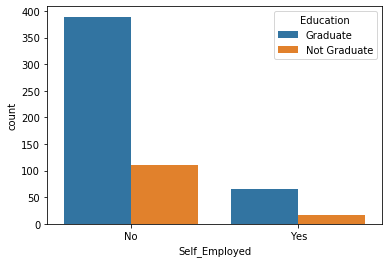

In [247]:
sns.countplot(x='Self_Employed',hue='Education',data=train_df)

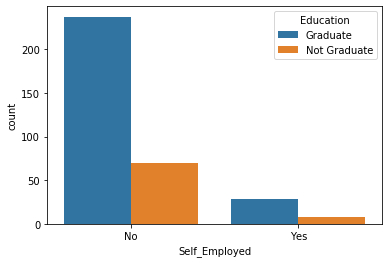

In [248]:
sns.countplot(x='Self_Employed',hue='Education',data=test_df)

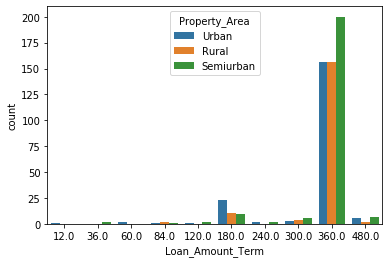

In [249]:
sns.countplot(x='Loan_Amount_Term',hue='Property_Area',data=train_df)

In [250]:
train_df[train_df['LoanAmount'].isnull() | train_df['Loan_Amount_Term'].isnull()]

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,LP001002,Male,No,0,Graduate,No,5849,0.0,NaN,360.0,1.0,Urban,Y
19,LP001041,Male,Yes,0,Graduate,NaN,2600,3500.0,115.0,NaN,1.0,Urban,Y
35,LP001106,Male,Yes,0,Graduate,No,2275,2067.0,NaN,360.0,1.0,Urban,Y
36,LP001109,Male,Yes,0,Graduate,No,1828,1330.0,100.0,NaN,0.0,Urban,N
44,LP001136,Male,Yes,0,Not Graduate,Yes,4695,0.0,96.0,NaN,1.0,Urban,Y
45,LP001137,Female,No,0,Graduate,No,3410,0.0,88.0,NaN,1.0,Urban,Y
63,LP001213,Male,Yes,1,Graduate,No,4945,0.0,NaN,360.0,0.0,Rural,N
73,LP001250,Male,Yes,3+,Not Graduate,No,4755,0.0,95.0,NaN,0.0,Semiurban,N
81,LP001266,Male,Yes,1,Graduate,Yes,2395,0.0,NaN,360.0,1.0,Semiurban,Y
95,LP001326,Male,No,0,Graduate,NaN,6782,0.0,NaN,360.0,NaN,Urban,N


In [251]:
train_df[train_df['Credit_History'].isnull()]

,Loan_ID,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
16,LP001034,Male,No,1,Not Graduate,No,3596,0.0,100.0,240.0,NaN,Urban,Y
24,LP001052,Male,Yes,1,Graduate,NaN,3717,2925.0,151.0,360.0,NaN,Semiurban,N
30,LP001091,Male,Yes,1,Graduate,NaN,4166,3369.0,201.0,360.0,NaN,Urban,N
42,LP001123,Male,Yes,0,Graduate,No,2400,0.0,75.0,360.0,NaN,Urban,Y
79,LP001264,Male,Yes,3+,Not Graduate,Yes,3333,2166.0,130.0,360.0,NaN,Semiurban,Y
83,LP001273,Male,Yes,0,Graduate,No,6000,2250.0,265.0,360.0,NaN,Semiurban,N
86,LP001280,Male,Yes,2,Not Graduate,No,3333,2000.0,99.0,360.0,NaN,Semiurban,Y
95,LP001326,Male,No,0,Graduate,NaN,6782,0.0,NaN,360.0,NaN,Urban,N
117,LP001405,Male,Yes,1,Graduate,No,2214,1398.0,85.0,360.0,NaN,Urban,Y
125,LP001443,Female,No,0,Graduate,No,3692,0.0,93.0,360.0,NaN,Rural,Y


In [252]:
def imputemissing(df1):
    df1['Gender'].fillna(df1['Gender'].mode()[0],inplace=True)
    df1['Married'].fillna('No',inplace=True)
    df1['Dependents'].fillna('0',inplace=True)
    df1['Self_Employed'].fillna('No',inplace=True)
    df1['LoanAmount'].fillna(df1['LoanAmount'].median(),inplace=True)
    df1['Loan_Amount_Term'].fillna(df1['Loan_Amount_Term'].mode()[0],inplace=True)
    df1['Credit_History'].fillna(0,inplace=True)
    return df1

In [253]:
train_df=imputemissing(train_df)
train_df.isnull().sum()

Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
Loan_Status          0
dtype: int64

In [254]:
test_df=imputemissing(test_df)
test_df.isnull().sum()

Loan_ID              0
Gender               0
Married              0
Dependents           0
Education            0
Self_Employed        0
ApplicantIncome      0
CoapplicantIncome    0
LoanAmount           0
Loan_Amount_Term     0
Credit_History       0
Property_Area        0
dtype: int64

In [255]:
#def addfeatures(df2):
    #df2['Totalincome'] = np.add(df2['ApplicantIncome'],df2['CoapplicantIncome'])
    #df2['Nun_loan_Per_Area'] = df2.groupby('Property_Area')['LoanAmount'].transform('nunique')
    #df2['num_loanterm_per_Area'] = df2.groupby('Property_Area')['Loan_Amount_Term'].transform('nunique')
    #df2['avg_totalincome_per_Area'] = df2.groupby('Property_Area')['Totalincome'].transform('mean')
    #df2['avg_loan_per_Area'] = df2.groupby('Property_Area')['LoanAmount'].transform('mean')
   # df2['avg_loanterm_per_Area'] = df2.groupby('Property_Area')['Loan_Amount_Term'].transform('mean')
    #df2['num_Educated_per_Area'] = df2.groupby('Property_Area')['Education'].transform('nunique')
   # df2['avg_dependents_per_Area'] = df2.groupby('Property_Area')['Dependents'].transform('nunique')
   # return df2

In [256]:
#train_df=addfeatures(train_df)
#test_df=addfeatures(test_df)

In [257]:
train_df.drop(['Loan_ID'],axis=1,inplace=True)

In [258]:
train_df.dtypes==object

Gender                True
Married               True
Dependents            True
Education             True
Self_Employed         True
ApplicantIncome      False
CoapplicantIncome    False
LoanAmount           False
Loan_Amount_Term     False
Credit_History       False
Property_Area         True
Loan_Status           True
dtype: bool

In [259]:
from sklearn.preprocessing import LabelEncoder
cat_col_mask=['Gender','Married','Dependents','Education','Self_Employed','Property_Area']
label=['Loan_Status']
le=LabelEncoder()
for col in cat_col_mask:
    le.fit(train_df[col].unique().tolist() + test_df[col].unique().tolist())
    train_df[col]=le.transform(train_df[col])
    test_df[col]=le.transform(test_df[col])
train_df[label]=le.fit_transform(train_df[label])

In [260]:
x=train_df.drop(['Loan_Status'],axis=1)
x

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,1,0,0,0,0,5849,0.0,128.0,360.0,1.0,2
1,1,1,1,0,0,4583,1508.0,128.0,360.0,1.0,0
2,1,1,0,0,1,3000,0.0,66.0,360.0,1.0,2
3,1,1,0,1,0,2583,2358.0,120.0,360.0,1.0,2
4,1,0,0,0,0,6000,0.0,141.0,360.0,1.0,2
...,...,...,...,...,...,...,...,...,...,...,...
609,0,0,0,0,0,2900,0.0,71.0,360.0,1.0,0
610,1,1,3,0,0,4106,0.0,40.0,180.0,1.0,0
611,1,1,1,0,0,8072,240.0,253.0,360.0,1.0,2
612,1,1,2,0,0,7583,0.0,187.0,360.0,1.0,2


In [261]:
y=train_df['Loan_Status']
y

0      1
1      0
2      1
3      1
4      1
      ..
609    1
610    1
611    1
612    1
613    0
Name: Loan_Status, Length: 614, dtype: int32

In [384]:
from sklearn.preprocessing import MinMaxScaler
mm=MinMaxScaler()
x=mm.fit_transform(x)

In [385]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20,random_state=110,shuffle=True,stratify=y)

In [386]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((491, 11), (123, 11), (491,), (123,))

In [387]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,AdaBoostClassifier,ExtraTreesClassifier
from lightgbm import LGBMClassifier
import xgboost as xgb
from catboost import CatBoostClassifier

In [346]:
LR=LogisticRegression()
SV=SVC()
KNN=KNeighborsClassifier()
GNB=GaussianNB()
RFC=RandomForestClassifier(random_state=110)
ETC=ExtraTreesClassifier(random_state=110)
GBC=GradientBoostingClassifier(random_state=110)
ABC=AdaBoostClassifier(random_state=110)
lgbm=LGBMClassifier(random_state=110)
xgbc=xgb.XGBClassifier(random_state=110)
catc=CatBoostClassifier(random_state=110)

In [347]:
models = []
models.append(('KNeighborsClassifier', KNN))
models.append(('SVC', SV))
models.append(('LogisticRegression', LR))
models.append(('GaussianNB', GNB))
models.append(('RandomForestClassifier', RFC))
models.append(('GradientBoostingClassifier', GBC))
models.append(('ExtraTreesClassifier',ETC))
models.append(('AdaBoostClassifier',ABC))
models.append(('LightGBM',lgbm))
models.append(('XGBOOST',xgbc))
models.append(('CatBoost',catc))

In [348]:
from sklearn.model_selection import cross_val_score
from sklearn import metrics
accuracy = []
precision = []
recall = []
f1_score = []
logLoss = []

def calculate_metrics(y_test,y_pred):
    acc = metrics.accuracy_score(y_true = y_test, y_pred = y_pred)
    f1 = metrics.f1_score(y_true = y_test, y_pred = y_pred)
    pre = metrics.precision_score(y_true = y_test, y_pred = y_pred)
    rec = metrics.recall_score(y_true = y_test, y_pred = y_pred)
    log_loss = metrics.log_loss(y_true = y_test, y_pred = y_pred)
    
    accuracy.append(acc)
    precision.append(pre)
    recall.append(rec)
    f1_score.append(f1)
    logLoss.append(log_loss)
    
kfold_mean=[]
kfold_max=[]

def calculate_kfold(estimator):
    accuracies = cross_val_score(estimator,x,y, cv=10)
    kfold_mean.append(accuracies.mean())
    kfold_max.append(accuracies.max())

In [349]:
Model = []
for name,model in models:
    Model.append(name)
    model.fit(x_train,y_train)
    pre=model.predict(x_test)
    calculate_metrics(y_test, pre)
    calculate_kfold(model)

Learning rate set to 0.007604
0:	learn: 0.6904247	total: 2ms	remaining: 2s
1:	learn: 0.6880252	total: 2.87ms	remaining: 1.43s
2:	learn: 0.6851988	total: 4.54ms	remaining: 1.51s
3:	learn: 0.6823090	total: 6.22ms	remaining: 1.55s
4:	learn: 0.6795219	total: 7.88ms	remaining: 1.57s
5:	learn: 0.6766406	total: 9.67ms	remaining: 1.6s
6:	learn: 0.6740335	total: 11.4ms	remaining: 1.61s
7:	learn: 0.6711539	total: 13ms	remaining: 1.61s
8:	learn: 0.6683312	total: 14.6ms	remaining: 1.61s
9:	learn: 0.6654527	total: 16.3ms	remaining: 1.61s
10:	learn: 0.6627964	total: 17.9ms	remaining: 1.61s
11:	learn: 0.6601007	total: 19.5ms	remaining: 1.61s
12:	learn: 0.6568800	total: 21.1ms	remaining: 1.6s
13:	learn: 0.6544010	total: 22.8ms	remaining: 1.6s
14:	learn: 0.6523183	total: 24.1ms	remaining: 1.58s
15:	learn: 0.6496714	total: 25.7ms	remaining: 1.58s
16:	learn: 0.6473338	total: 27.5ms	remaining: 1.59s
17:	learn: 0.6444141	total: 29.1ms	remaining: 1.58s
18:	learn: 0.6415233	total: 30.7ms	remaining: 1.58s
19:

255:	learn: 0.4364198	total: 326ms	remaining: 946ms
256:	learn: 0.4361512	total: 327ms	remaining: 945ms
257:	learn: 0.4359418	total: 328ms	remaining: 943ms
258:	learn: 0.4356916	total: 329ms	remaining: 942ms
259:	learn: 0.4352535	total: 331ms	remaining: 941ms
260:	learn: 0.4348754	total: 332ms	remaining: 939ms
261:	learn: 0.4347302	total: 333ms	remaining: 938ms
262:	learn: 0.4344221	total: 334ms	remaining: 936ms
263:	learn: 0.4340797	total: 335ms	remaining: 935ms
264:	learn: 0.4337154	total: 337ms	remaining: 933ms
265:	learn: 0.4336478	total: 337ms	remaining: 931ms
266:	learn: 0.4331182	total: 339ms	remaining: 930ms
267:	learn: 0.4326521	total: 340ms	remaining: 929ms
268:	learn: 0.4323562	total: 341ms	remaining: 927ms
269:	learn: 0.4319720	total: 343ms	remaining: 926ms
270:	learn: 0.4319157	total: 343ms	remaining: 924ms
271:	learn: 0.4312750	total: 345ms	remaining: 923ms
272:	learn: 0.4309307	total: 346ms	remaining: 921ms
273:	learn: 0.4304544	total: 347ms	remaining: 920ms
274:	learn: 

520:	learn: 0.3617885	total: 656ms	remaining: 603ms
521:	learn: 0.3615709	total: 658ms	remaining: 602ms
522:	learn: 0.3614696	total: 659ms	remaining: 601ms
523:	learn: 0.3611641	total: 660ms	remaining: 600ms
524:	learn: 0.3610148	total: 661ms	remaining: 598ms
525:	learn: 0.3608800	total: 662ms	remaining: 597ms
526:	learn: 0.3606889	total: 664ms	remaining: 596ms
527:	learn: 0.3605419	total: 665ms	remaining: 594ms
528:	learn: 0.3602146	total: 666ms	remaining: 593ms
529:	learn: 0.3602092	total: 667ms	remaining: 591ms
530:	learn: 0.3598616	total: 668ms	remaining: 590ms
531:	learn: 0.3596838	total: 669ms	remaining: 589ms
532:	learn: 0.3594599	total: 671ms	remaining: 588ms
533:	learn: 0.3592104	total: 672ms	remaining: 586ms
534:	learn: 0.3590026	total: 674ms	remaining: 585ms
535:	learn: 0.3587477	total: 675ms	remaining: 585ms
536:	learn: 0.3586001	total: 677ms	remaining: 583ms
537:	learn: 0.3583709	total: 678ms	remaining: 582ms
538:	learn: 0.3581655	total: 679ms	remaining: 581ms
539:	learn: 

757:	learn: 0.3109565	total: 977ms	remaining: 312ms
758:	learn: 0.3108516	total: 979ms	remaining: 311ms
759:	learn: 0.3106327	total: 980ms	remaining: 310ms
760:	learn: 0.3105342	total: 982ms	remaining: 308ms
761:	learn: 0.3103216	total: 983ms	remaining: 307ms
762:	learn: 0.3101573	total: 985ms	remaining: 306ms
763:	learn: 0.3099975	total: 986ms	remaining: 305ms
764:	learn: 0.3098604	total: 988ms	remaining: 303ms
765:	learn: 0.3096529	total: 989ms	remaining: 302ms
766:	learn: 0.3094042	total: 991ms	remaining: 301ms
767:	learn: 0.3091082	total: 992ms	remaining: 300ms
768:	learn: 0.3086698	total: 993ms	remaining: 298ms
769:	learn: 0.3084786	total: 995ms	remaining: 297ms
770:	learn: 0.3083598	total: 996ms	remaining: 296ms
771:	learn: 0.3081306	total: 997ms	remaining: 294ms
772:	learn: 0.3078281	total: 998ms	remaining: 293ms
773:	learn: 0.3075284	total: 1s	remaining: 292ms
774:	learn: 0.3074101	total: 1s	remaining: 291ms
775:	learn: 0.3073106	total: 1s	remaining: 290ms
776:	learn: 0.3071351

997:	learn: 0.2683636	total: 1.3s	remaining: 2.6ms
998:	learn: 0.2682730	total: 1.3s	remaining: 1.3ms
999:	learn: 0.2680163	total: 1.3s	remaining: 0us
Learning rate set to 0.007994
0:	learn: 0.6902053	total: 1.74ms	remaining: 1.74s
1:	learn: 0.6875840	total: 2.41ms	remaining: 1.2s
2:	learn: 0.6843953	total: 3.77ms	remaining: 1.25s
3:	learn: 0.6813879	total: 5.19ms	remaining: 1.29s
4:	learn: 0.6780965	total: 6.56ms	remaining: 1.3s
5:	learn: 0.6749732	total: 7.92ms	remaining: 1.31s
6:	learn: 0.6722497	total: 9.29ms	remaining: 1.32s
7:	learn: 0.6691260	total: 10.8ms	remaining: 1.34s
8:	learn: 0.6662888	total: 12.3ms	remaining: 1.35s
9:	learn: 0.6635747	total: 13.6ms	remaining: 1.35s
10:	learn: 0.6607365	total: 15.2ms	remaining: 1.37s
11:	learn: 0.6577463	total: 16.8ms	remaining: 1.38s
12:	learn: 0.6549971	total: 18.4ms	remaining: 1.4s
13:	learn: 0.6522861	total: 19.9ms	remaining: 1.4s
14:	learn: 0.6501346	total: 20.7ms	remaining: 1.36s
15:	learn: 0.6472187	total: 22.2ms	remaining: 1.37s
1

274:	learn: 0.4346388	total: 345ms	remaining: 910ms
275:	learn: 0.4344052	total: 346ms	remaining: 909ms
276:	learn: 0.4342511	total: 348ms	remaining: 908ms
277:	learn: 0.4339403	total: 349ms	remaining: 906ms
278:	learn: 0.4336411	total: 350ms	remaining: 905ms
279:	learn: 0.4330039	total: 351ms	remaining: 904ms
280:	learn: 0.4326336	total: 353ms	remaining: 903ms
281:	learn: 0.4323791	total: 354ms	remaining: 902ms
282:	learn: 0.4319731	total: 356ms	remaining: 901ms
283:	learn: 0.4314868	total: 357ms	remaining: 899ms
284:	learn: 0.4310381	total: 358ms	remaining: 898ms
285:	learn: 0.4308490	total: 359ms	remaining: 897ms
286:	learn: 0.4305870	total: 361ms	remaining: 897ms
287:	learn: 0.4303458	total: 363ms	remaining: 897ms
288:	learn: 0.4298913	total: 364ms	remaining: 896ms
289:	learn: 0.4296779	total: 366ms	remaining: 895ms
290:	learn: 0.4294103	total: 367ms	remaining: 894ms
291:	learn: 0.4291842	total: 368ms	remaining: 893ms
292:	learn: 0.4289406	total: 369ms	remaining: 892ms
293:	learn: 

539:	learn: 0.3617997	total: 677ms	remaining: 577ms
540:	learn: 0.3616003	total: 678ms	remaining: 576ms
541:	learn: 0.3614345	total: 680ms	remaining: 574ms
542:	learn: 0.3613304	total: 681ms	remaining: 573ms
543:	learn: 0.3610143	total: 682ms	remaining: 572ms
544:	learn: 0.3607821	total: 683ms	remaining: 571ms
545:	learn: 0.3604655	total: 685ms	remaining: 569ms
546:	learn: 0.3602149	total: 686ms	remaining: 568ms
547:	learn: 0.3600775	total: 687ms	remaining: 567ms
548:	learn: 0.3599528	total: 688ms	remaining: 565ms
549:	learn: 0.3597897	total: 690ms	remaining: 564ms
550:	learn: 0.3597016	total: 691ms	remaining: 563ms
551:	learn: 0.3595632	total: 692ms	remaining: 562ms
552:	learn: 0.3593550	total: 694ms	remaining: 561ms
553:	learn: 0.3590353	total: 695ms	remaining: 559ms
554:	learn: 0.3589043	total: 696ms	remaining: 558ms
555:	learn: 0.3588034	total: 697ms	remaining: 557ms
556:	learn: 0.3586174	total: 699ms	remaining: 556ms
557:	learn: 0.3584523	total: 700ms	remaining: 554ms
558:	learn: 

803:	learn: 0.3124259	total: 1.01s	remaining: 246ms
804:	learn: 0.3123029	total: 1.01s	remaining: 244ms
805:	learn: 0.3121186	total: 1.01s	remaining: 243ms
806:	learn: 0.3118995	total: 1.01s	remaining: 242ms
807:	learn: 0.3117105	total: 1.01s	remaining: 241ms
808:	learn: 0.3114845	total: 1.01s	remaining: 239ms
809:	learn: 0.3112134	total: 1.01s	remaining: 238ms
810:	learn: 0.3111192	total: 1.02s	remaining: 237ms
811:	learn: 0.3109968	total: 1.02s	remaining: 236ms
812:	learn: 0.3108327	total: 1.02s	remaining: 234ms
813:	learn: 0.3106781	total: 1.02s	remaining: 233ms
814:	learn: 0.3104463	total: 1.02s	remaining: 232ms
815:	learn: 0.3103881	total: 1.02s	remaining: 231ms
816:	learn: 0.3101030	total: 1.02s	remaining: 229ms
817:	learn: 0.3096449	total: 1.02s	remaining: 228ms
818:	learn: 0.3092921	total: 1.03s	remaining: 227ms
819:	learn: 0.3090391	total: 1.03s	remaining: 226ms
820:	learn: 0.3089025	total: 1.03s	remaining: 224ms
821:	learn: 0.3087987	total: 1.03s	remaining: 223ms
822:	learn: 

Learning rate set to 0.007994
0:	learn: 0.6901907	total: 8.17ms	remaining: 8.16s
1:	learn: 0.6875630	total: 11.5ms	remaining: 5.73s
2:	learn: 0.6849801	total: 14.7ms	remaining: 4.87s
3:	learn: 0.6816962	total: 18.1ms	remaining: 4.51s
4:	learn: 0.6784702	total: 21.6ms	remaining: 4.3s
5:	learn: 0.6755862	total: 25ms	remaining: 4.15s
6:	learn: 0.6727297	total: 28.5ms	remaining: 4.04s
7:	learn: 0.6697438	total: 31.5ms	remaining: 3.9s
8:	learn: 0.6670219	total: 34.9ms	remaining: 3.85s
9:	learn: 0.6647423	total: 36.7ms	remaining: 3.64s
10:	learn: 0.6619479	total: 40.4ms	remaining: 3.63s
11:	learn: 0.6595239	total: 42.2ms	remaining: 3.48s
12:	learn: 0.6568520	total: 44ms	remaining: 3.34s
13:	learn: 0.6539446	total: 45.9ms	remaining: 3.23s
14:	learn: 0.6507456	total: 47.6ms	remaining: 3.13s
15:	learn: 0.6484418	total: 49.4ms	remaining: 3.04s
16:	learn: 0.6459696	total: 51ms	remaining: 2.95s
17:	learn: 0.6434990	total: 52.7ms	remaining: 2.88s
18:	learn: 0.6406394	total: 54.5ms	remaining: 2.81s


237:	learn: 0.4456038	total: 331ms	remaining: 1.06s
238:	learn: 0.4450475	total: 332ms	remaining: 1.06s
239:	learn: 0.4447925	total: 334ms	remaining: 1.06s
240:	learn: 0.4443726	total: 335ms	remaining: 1.06s
241:	learn: 0.4440626	total: 338ms	remaining: 1.06s
242:	learn: 0.4436132	total: 339ms	remaining: 1.06s
243:	learn: 0.4432243	total: 340ms	remaining: 1.05s
244:	learn: 0.4430057	total: 342ms	remaining: 1.05s
245:	learn: 0.4427923	total: 343ms	remaining: 1.05s
246:	learn: 0.4424850	total: 344ms	remaining: 1.05s
247:	learn: 0.4421680	total: 346ms	remaining: 1.05s
248:	learn: 0.4418599	total: 347ms	remaining: 1.05s
249:	learn: 0.4416201	total: 349ms	remaining: 1.05s
250:	learn: 0.4413192	total: 350ms	remaining: 1.04s
251:	learn: 0.4410224	total: 351ms	remaining: 1.04s
252:	learn: 0.4407077	total: 353ms	remaining: 1.04s
253:	learn: 0.4404945	total: 354ms	remaining: 1.04s
254:	learn: 0.4399603	total: 355ms	remaining: 1.04s
255:	learn: 0.4394217	total: 356ms	remaining: 1.03s
256:	learn: 

496:	learn: 0.3734084	total: 668ms	remaining: 676ms
497:	learn: 0.3731303	total: 670ms	remaining: 675ms
498:	learn: 0.3729551	total: 671ms	remaining: 674ms
499:	learn: 0.3728023	total: 672ms	remaining: 672ms
500:	learn: 0.3726153	total: 673ms	remaining: 671ms
501:	learn: 0.3724424	total: 675ms	remaining: 669ms
502:	learn: 0.3721939	total: 676ms	remaining: 668ms
503:	learn: 0.3720191	total: 677ms	remaining: 666ms
504:	learn: 0.3716149	total: 678ms	remaining: 665ms
505:	learn: 0.3714748	total: 679ms	remaining: 663ms
506:	learn: 0.3712683	total: 681ms	remaining: 662ms
507:	learn: 0.3711658	total: 682ms	remaining: 661ms
508:	learn: 0.3707788	total: 683ms	remaining: 659ms
509:	learn: 0.3706709	total: 685ms	remaining: 658ms
510:	learn: 0.3705301	total: 686ms	remaining: 657ms
511:	learn: 0.3702282	total: 688ms	remaining: 655ms
512:	learn: 0.3701132	total: 689ms	remaining: 654ms
513:	learn: 0.3698865	total: 690ms	remaining: 653ms
514:	learn: 0.3695296	total: 691ms	remaining: 651ms
515:	learn: 

756:	learn: 0.3206322	total: 1s	remaining: 321ms
757:	learn: 0.3205067	total: 1s	remaining: 320ms
758:	learn: 0.3202809	total: 1s	remaining: 318ms
759:	learn: 0.3201182	total: 1s	remaining: 317ms
760:	learn: 0.3199646	total: 1s	remaining: 316ms
761:	learn: 0.3198593	total: 1.01s	remaining: 315ms
762:	learn: 0.3196458	total: 1.01s	remaining: 313ms
763:	learn: 0.3195753	total: 1.01s	remaining: 312ms
764:	learn: 0.3194642	total: 1.01s	remaining: 311ms
765:	learn: 0.3193123	total: 1.01s	remaining: 309ms
766:	learn: 0.3190382	total: 1.01s	remaining: 308ms
767:	learn: 0.3189116	total: 1.01s	remaining: 307ms
768:	learn: 0.3187698	total: 1.02s	remaining: 306ms
769:	learn: 0.3186462	total: 1.02s	remaining: 304ms
770:	learn: 0.3184940	total: 1.02s	remaining: 303ms
771:	learn: 0.3181859	total: 1.02s	remaining: 302ms
772:	learn: 0.3179805	total: 1.02s	remaining: 300ms
773:	learn: 0.3178842	total: 1.02s	remaining: 299ms
774:	learn: 0.3178012	total: 1.02s	remaining: 297ms
775:	learn: 0.3176647	total

Learning rate set to 0.007994
0:	learn: 0.6901467	total: 4.02ms	remaining: 4.02s
1:	learn: 0.6873840	total: 5.79ms	remaining: 2.89s
2:	learn: 0.6846684	total: 7.54ms	remaining: 2.5s
3:	learn: 0.6810652	total: 10.8ms	remaining: 2.69s
4:	learn: 0.6777505	total: 14.2ms	remaining: 2.82s
5:	learn: 0.6747419	total: 17.3ms	remaining: 2.87s
6:	learn: 0.6717864	total: 20.7ms	remaining: 2.94s
7:	learn: 0.6689589	total: 22.8ms	remaining: 2.83s
8:	learn: 0.6658093	total: 24.6ms	remaining: 2.7s
9:	learn: 0.6634140	total: 25.5ms	remaining: 2.52s
10:	learn: 0.6604993	total: 27.2ms	remaining: 2.44s
11:	learn: 0.6573333	total: 28.9ms	remaining: 2.38s
12:	learn: 0.6541483	total: 30.7ms	remaining: 2.33s
13:	learn: 0.6512338	total: 32.4ms	remaining: 2.29s
14:	learn: 0.6489085	total: 33.8ms	remaining: 2.22s
15:	learn: 0.6458824	total: 35.5ms	remaining: 2.18s
16:	learn: 0.6437207	total: 36.6ms	remaining: 2.12s
17:	learn: 0.6411166	total: 38.3ms	remaining: 2.09s
18:	learn: 0.6384754	total: 40ms	remaining: 2.

254:	learn: 0.4370492	total: 342ms	remaining: 999ms
255:	learn: 0.4368512	total: 343ms	remaining: 998ms
256:	learn: 0.4368033	total: 344ms	remaining: 995ms
257:	learn: 0.4366977	total: 346ms	remaining: 994ms
258:	learn: 0.4362044	total: 347ms	remaining: 992ms
259:	learn: 0.4357079	total: 348ms	remaining: 991ms
260:	learn: 0.4355949	total: 349ms	remaining: 989ms
261:	learn: 0.4349224	total: 350ms	remaining: 987ms
262:	learn: 0.4345363	total: 352ms	remaining: 986ms
263:	learn: 0.4340464	total: 353ms	remaining: 984ms
264:	learn: 0.4337116	total: 354ms	remaining: 983ms
265:	learn: 0.4334700	total: 356ms	remaining: 981ms
266:	learn: 0.4331289	total: 357ms	remaining: 980ms
267:	learn: 0.4328330	total: 358ms	remaining: 979ms
268:	learn: 0.4323365	total: 360ms	remaining: 978ms
269:	learn: 0.4318777	total: 361ms	remaining: 976ms
270:	learn: 0.4315076	total: 362ms	remaining: 975ms
271:	learn: 0.4312299	total: 364ms	remaining: 973ms
272:	learn: 0.4309624	total: 365ms	remaining: 972ms
273:	learn: 

526:	learn: 0.3658310	total: 677ms	remaining: 608ms
527:	learn: 0.3657259	total: 679ms	remaining: 607ms
528:	learn: 0.3655185	total: 680ms	remaining: 606ms
529:	learn: 0.3653294	total: 681ms	remaining: 604ms
530:	learn: 0.3651801	total: 683ms	remaining: 603ms
531:	learn: 0.3649232	total: 684ms	remaining: 602ms
532:	learn: 0.3646769	total: 685ms	remaining: 600ms
533:	learn: 0.3646452	total: 686ms	remaining: 599ms
534:	learn: 0.3644703	total: 687ms	remaining: 597ms
535:	learn: 0.3641393	total: 689ms	remaining: 596ms
536:	learn: 0.3640819	total: 690ms	remaining: 595ms
537:	learn: 0.3637846	total: 691ms	remaining: 593ms
538:	learn: 0.3634305	total: 692ms	remaining: 592ms
539:	learn: 0.3633691	total: 693ms	remaining: 591ms
540:	learn: 0.3631346	total: 695ms	remaining: 589ms
541:	learn: 0.3629649	total: 696ms	remaining: 588ms
542:	learn: 0.3627785	total: 697ms	remaining: 587ms
543:	learn: 0.3626225	total: 698ms	remaining: 585ms
544:	learn: 0.3622626	total: 700ms	remaining: 584ms
545:	learn: 

790:	learn: 0.3161939	total: 1.01s	remaining: 266ms
791:	learn: 0.3160109	total: 1.01s	remaining: 265ms
792:	learn: 0.3159847	total: 1.01s	remaining: 264ms
793:	learn: 0.3159086	total: 1.01s	remaining: 263ms
794:	learn: 0.3157869	total: 1.01s	remaining: 261ms
795:	learn: 0.3156015	total: 1.01s	remaining: 260ms
796:	learn: 0.3155466	total: 1.02s	remaining: 259ms
797:	learn: 0.3154435	total: 1.02s	remaining: 258ms
798:	learn: 0.3153602	total: 1.02s	remaining: 256ms
799:	learn: 0.3151991	total: 1.02s	remaining: 255ms
800:	learn: 0.3148741	total: 1.02s	remaining: 254ms
801:	learn: 0.3147376	total: 1.02s	remaining: 252ms
802:	learn: 0.3144822	total: 1.02s	remaining: 251ms
803:	learn: 0.3141739	total: 1.02s	remaining: 250ms
804:	learn: 0.3139093	total: 1.03s	remaining: 249ms
805:	learn: 0.3136374	total: 1.03s	remaining: 247ms
806:	learn: 0.3133912	total: 1.03s	remaining: 246ms
807:	learn: 0.3132818	total: 1.03s	remaining: 245ms
808:	learn: 0.3131044	total: 1.03s	remaining: 244ms
809:	learn: 

Learning rate set to 0.007994
0:	learn: 0.6900484	total: 7.52ms	remaining: 7.51s
1:	learn: 0.6872860	total: 10.5ms	remaining: 5.23s
2:	learn: 0.6837403	total: 17.6ms	remaining: 5.86s
3:	learn: 0.6801677	total: 23.7ms	remaining: 5.91s
4:	learn: 0.6767216	total: 27.4ms	remaining: 5.44s
5:	learn: 0.6734831	total: 30.9ms	remaining: 5.11s
6:	learn: 0.6705232	total: 34.5ms	remaining: 4.89s
7:	learn: 0.6673872	total: 38.2ms	remaining: 4.73s
8:	learn: 0.6644989	total: 41.6ms	remaining: 4.58s
9:	learn: 0.6611476	total: 45.2ms	remaining: 4.48s
10:	learn: 0.6577739	total: 48.8ms	remaining: 4.39s
11:	learn: 0.6541462	total: 51.3ms	remaining: 4.22s
12:	learn: 0.6508758	total: 53.1ms	remaining: 4.03s
13:	learn: 0.6478626	total: 54.9ms	remaining: 3.87s
14:	learn: 0.6456743	total: 56ms	remaining: 3.68s
15:	learn: 0.6427422	total: 57.8ms	remaining: 3.55s
16:	learn: 0.6406364	total: 58.8ms	remaining: 3.4s
17:	learn: 0.6376553	total: 60.7ms	remaining: 3.31s
18:	learn: 0.6354539	total: 61.7ms	remaining: 3

227:	learn: 0.4344953	total: 324ms	remaining: 1.1s
228:	learn: 0.4339172	total: 326ms	remaining: 1.1s
229:	learn: 0.4336487	total: 327ms	remaining: 1.09s
230:	learn: 0.4330744	total: 328ms	remaining: 1.09s
231:	learn: 0.4325444	total: 329ms	remaining: 1.09s
232:	learn: 0.4322077	total: 331ms	remaining: 1.09s
233:	learn: 0.4318964	total: 332ms	remaining: 1.09s
234:	learn: 0.4314755	total: 333ms	remaining: 1.08s
235:	learn: 0.4309807	total: 335ms	remaining: 1.08s
236:	learn: 0.4304569	total: 336ms	remaining: 1.08s
237:	learn: 0.4301832	total: 337ms	remaining: 1.08s
238:	learn: 0.4298087	total: 339ms	remaining: 1.08s
239:	learn: 0.4291629	total: 340ms	remaining: 1.08s
240:	learn: 0.4288167	total: 341ms	remaining: 1.07s
241:	learn: 0.4285549	total: 343ms	remaining: 1.07s
242:	learn: 0.4284894	total: 344ms	remaining: 1.07s
243:	learn: 0.4281646	total: 345ms	remaining: 1.07s
244:	learn: 0.4278328	total: 346ms	remaining: 1.07s
245:	learn: 0.4275966	total: 347ms	remaining: 1.06s
246:	learn: 0.

489:	learn: 0.3588838	total: 656ms	remaining: 683ms
490:	learn: 0.3585074	total: 657ms	remaining: 682ms
491:	learn: 0.3583216	total: 659ms	remaining: 680ms
492:	learn: 0.3582186	total: 660ms	remaining: 679ms
493:	learn: 0.3579977	total: 661ms	remaining: 677ms
494:	learn: 0.3576491	total: 662ms	remaining: 676ms
495:	learn: 0.3574329	total: 664ms	remaining: 674ms
496:	learn: 0.3572029	total: 665ms	remaining: 673ms
497:	learn: 0.3569549	total: 666ms	remaining: 671ms
498:	learn: 0.3566367	total: 667ms	remaining: 670ms
499:	learn: 0.3565060	total: 669ms	remaining: 669ms
500:	learn: 0.3562202	total: 670ms	remaining: 667ms
501:	learn: 0.3559248	total: 671ms	remaining: 666ms
502:	learn: 0.3556292	total: 673ms	remaining: 665ms
503:	learn: 0.3552280	total: 674ms	remaining: 663ms
504:	learn: 0.3550101	total: 675ms	remaining: 662ms
505:	learn: 0.3549714	total: 676ms	remaining: 660ms
506:	learn: 0.3548735	total: 678ms	remaining: 659ms
507:	learn: 0.3547284	total: 679ms	remaining: 658ms
508:	learn: 

751:	learn: 0.3056951	total: 987ms	remaining: 326ms
752:	learn: 0.3055931	total: 989ms	remaining: 324ms
753:	learn: 0.3054549	total: 990ms	remaining: 323ms
754:	learn: 0.3052813	total: 992ms	remaining: 322ms
755:	learn: 0.3050924	total: 993ms	remaining: 320ms
756:	learn: 0.3048803	total: 994ms	remaining: 319ms
757:	learn: 0.3045452	total: 995ms	remaining: 318ms
758:	learn: 0.3043352	total: 997ms	remaining: 316ms
759:	learn: 0.3041742	total: 998ms	remaining: 315ms
760:	learn: 0.3040837	total: 999ms	remaining: 314ms
761:	learn: 0.3038891	total: 1s	remaining: 312ms
762:	learn: 0.3038235	total: 1s	remaining: 311ms
763:	learn: 0.3035813	total: 1s	remaining: 310ms
764:	learn: 0.3033035	total: 1s	remaining: 309ms
765:	learn: 0.3031322	total: 1.01s	remaining: 307ms
766:	learn: 0.3028665	total: 1.01s	remaining: 306ms
767:	learn: 0.3027080	total: 1.01s	remaining: 305ms
768:	learn: 0.3025909	total: 1.01s	remaining: 303ms
769:	learn: 0.3024994	total: 1.01s	remaining: 302ms
770:	learn: 0.3023837	to

Learning rate set to 0.008
0:	learn: 0.6900793	total: 8.46ms	remaining: 8.45s
1:	learn: 0.6873506	total: 11.5ms	remaining: 5.75s
2:	learn: 0.6840953	total: 17.4ms	remaining: 5.78s
3:	learn: 0.6806259	total: 23.3ms	remaining: 5.81s
4:	learn: 0.6772826	total: 29.1ms	remaining: 5.79s
5:	learn: 0.6739813	total: 34.9ms	remaining: 5.78s
6:	learn: 0.6711609	total: 39.6ms	remaining: 5.62s
7:	learn: 0.6686269	total: 41.3ms	remaining: 5.12s
8:	learn: 0.6658589	total: 43.7ms	remaining: 4.82s
9:	learn: 0.6628622	total: 46.2ms	remaining: 4.57s
10:	learn: 0.6602458	total: 48.1ms	remaining: 4.32s
11:	learn: 0.6572249	total: 50.6ms	remaining: 4.16s
12:	learn: 0.6539298	total: 53.2ms	remaining: 4.04s
13:	learn: 0.6509075	total: 55.6ms	remaining: 3.92s
14:	learn: 0.6486669	total: 57.3ms	remaining: 3.76s
15:	learn: 0.6459984	total: 59.7ms	remaining: 3.67s
16:	learn: 0.6434636	total: 62.1ms	remaining: 3.59s
17:	learn: 0.6408312	total: 64.5ms	remaining: 3.52s
18:	learn: 0.6383397	total: 66.4ms	remaining: 3

245:	learn: 0.4448544	total: 336ms	remaining: 1.03s
246:	learn: 0.4445007	total: 337ms	remaining: 1.03s
247:	learn: 0.4440108	total: 338ms	remaining: 1.03s
248:	learn: 0.4437405	total: 340ms	remaining: 1.02s
249:	learn: 0.4434531	total: 341ms	remaining: 1.02s
250:	learn: 0.4431309	total: 342ms	remaining: 1.02s
251:	learn: 0.4426826	total: 343ms	remaining: 1.02s
252:	learn: 0.4422851	total: 345ms	remaining: 1.02s
253:	learn: 0.4421353	total: 346ms	remaining: 1.02s
254:	learn: 0.4416800	total: 347ms	remaining: 1.01s
255:	learn: 0.4412175	total: 349ms	remaining: 1.01s
256:	learn: 0.4408570	total: 350ms	remaining: 1.01s
257:	learn: 0.4402693	total: 351ms	remaining: 1.01s
258:	learn: 0.4398216	total: 353ms	remaining: 1.01s
259:	learn: 0.4394568	total: 354ms	remaining: 1.01s
260:	learn: 0.4391345	total: 355ms	remaining: 1.01s
261:	learn: 0.4388830	total: 357ms	remaining: 1s
262:	learn: 0.4385825	total: 358ms	remaining: 1s
263:	learn: 0.4380792	total: 359ms	remaining: 1s
264:	learn: 0.4376655

521:	learn: 0.3727176	total: 670ms	remaining: 614ms
522:	learn: 0.3724029	total: 672ms	remaining: 613ms
523:	learn: 0.3721717	total: 673ms	remaining: 612ms
524:	learn: 0.3720881	total: 674ms	remaining: 610ms
525:	learn: 0.3718395	total: 676ms	remaining: 609ms
526:	learn: 0.3717706	total: 677ms	remaining: 608ms
527:	learn: 0.3714094	total: 678ms	remaining: 606ms
528:	learn: 0.3712314	total: 680ms	remaining: 605ms
529:	learn: 0.3711224	total: 681ms	remaining: 604ms
530:	learn: 0.3709364	total: 682ms	remaining: 602ms
531:	learn: 0.3706679	total: 683ms	remaining: 601ms
532:	learn: 0.3704701	total: 685ms	remaining: 600ms
533:	learn: 0.3702465	total: 686ms	remaining: 599ms
534:	learn: 0.3700344	total: 687ms	remaining: 597ms
535:	learn: 0.3698460	total: 689ms	remaining: 596ms
536:	learn: 0.3695327	total: 690ms	remaining: 595ms
537:	learn: 0.3694290	total: 691ms	remaining: 594ms
538:	learn: 0.3692205	total: 692ms	remaining: 592ms
539:	learn: 0.3689919	total: 693ms	remaining: 591ms
540:	learn: 

796:	learn: 0.3212321	total: 1s	remaining: 256ms
797:	learn: 0.3210846	total: 1.01s	remaining: 255ms
798:	learn: 0.3207863	total: 1.01s	remaining: 254ms
799:	learn: 0.3206835	total: 1.01s	remaining: 252ms
800:	learn: 0.3205563	total: 1.01s	remaining: 251ms
801:	learn: 0.3204876	total: 1.01s	remaining: 250ms
802:	learn: 0.3199670	total: 1.01s	remaining: 249ms
803:	learn: 0.3197582	total: 1.01s	remaining: 247ms
804:	learn: 0.3195594	total: 1.01s	remaining: 246ms
805:	learn: 0.3193470	total: 1.02s	remaining: 245ms
806:	learn: 0.3192631	total: 1.02s	remaining: 244ms
807:	learn: 0.3189862	total: 1.02s	remaining: 242ms
808:	learn: 0.3188903	total: 1.02s	remaining: 241ms
809:	learn: 0.3187619	total: 1.02s	remaining: 240ms
810:	learn: 0.3186049	total: 1.02s	remaining: 239ms
811:	learn: 0.3184923	total: 1.02s	remaining: 237ms
812:	learn: 0.3183459	total: 1.03s	remaining: 236ms
813:	learn: 0.3182411	total: 1.03s	remaining: 235ms
814:	learn: 0.3181648	total: 1.03s	remaining: 234ms
815:	learn: 0.3

Learning rate set to 0.008
0:	learn: 0.6900372	total: 1.9ms	remaining: 1.9s
1:	learn: 0.6871779	total: 2.6ms	remaining: 1.29s
2:	learn: 0.6839522	total: 4ms	remaining: 1.33s
3:	learn: 0.6807778	total: 5.31ms	remaining: 1.32s
4:	learn: 0.6771578	total: 6.68ms	remaining: 1.33s
5:	learn: 0.6739075	total: 8.01ms	remaining: 1.33s
6:	learn: 0.6709509	total: 9.38ms	remaining: 1.33s
7:	learn: 0.6678000	total: 10.7ms	remaining: 1.33s
8:	learn: 0.6648113	total: 12.1ms	remaining: 1.33s
9:	learn: 0.6619809	total: 13.5ms	remaining: 1.34s
10:	learn: 0.6586467	total: 14.8ms	remaining: 1.33s
11:	learn: 0.6554946	total: 16.1ms	remaining: 1.33s
12:	learn: 0.6524979	total: 17.5ms	remaining: 1.33s
13:	learn: 0.6497860	total: 18.9ms	remaining: 1.33s
14:	learn: 0.6474820	total: 19.6ms	remaining: 1.29s
15:	learn: 0.6449277	total: 21ms	remaining: 1.29s
16:	learn: 0.6427406	total: 21.8ms	remaining: 1.26s
17:	learn: 0.6397759	total: 23.1ms	remaining: 1.26s
18:	learn: 0.6375921	total: 23.9ms	remaining: 1.24s
19:

262:	learn: 0.4332168	total: 322ms	remaining: 902ms
263:	learn: 0.4329044	total: 323ms	remaining: 902ms
264:	learn: 0.4326131	total: 325ms	remaining: 901ms
265:	learn: 0.4324027	total: 326ms	remaining: 900ms
266:	learn: 0.4321973	total: 327ms	remaining: 898ms
267:	learn: 0.4317724	total: 329ms	remaining: 898ms
268:	learn: 0.4312340	total: 330ms	remaining: 897ms
269:	learn: 0.4311157	total: 331ms	remaining: 896ms
270:	learn: 0.4305992	total: 333ms	remaining: 895ms
271:	learn: 0.4303974	total: 334ms	remaining: 894ms
272:	learn: 0.4299096	total: 335ms	remaining: 893ms
273:	learn: 0.4295618	total: 337ms	remaining: 892ms
274:	learn: 0.4292617	total: 338ms	remaining: 891ms
275:	learn: 0.4290382	total: 340ms	remaining: 892ms
276:	learn: 0.4288765	total: 341ms	remaining: 891ms
277:	learn: 0.4287639	total: 343ms	remaining: 890ms
278:	learn: 0.4283680	total: 344ms	remaining: 889ms
279:	learn: 0.4278616	total: 345ms	remaining: 887ms
280:	learn: 0.4274373	total: 346ms	remaining: 886ms
281:	learn: 

539:	learn: 0.3633531	total: 656ms	remaining: 559ms
540:	learn: 0.3630586	total: 658ms	remaining: 558ms
541:	learn: 0.3628226	total: 659ms	remaining: 557ms
542:	learn: 0.3625428	total: 660ms	remaining: 555ms
543:	learn: 0.3623090	total: 661ms	remaining: 554ms
544:	learn: 0.3619694	total: 662ms	remaining: 553ms
545:	learn: 0.3618667	total: 664ms	remaining: 552ms
546:	learn: 0.3616756	total: 665ms	remaining: 551ms
547:	learn: 0.3615299	total: 666ms	remaining: 549ms
548:	learn: 0.3613700	total: 667ms	remaining: 548ms
549:	learn: 0.3611894	total: 669ms	remaining: 547ms
550:	learn: 0.3610503	total: 670ms	remaining: 546ms
551:	learn: 0.3607200	total: 671ms	remaining: 545ms
552:	learn: 0.3606081	total: 673ms	remaining: 544ms
553:	learn: 0.3603988	total: 674ms	remaining: 543ms
554:	learn: 0.3600960	total: 676ms	remaining: 542ms
555:	learn: 0.3598082	total: 677ms	remaining: 541ms
556:	learn: 0.3596438	total: 678ms	remaining: 539ms
557:	learn: 0.3593608	total: 679ms	remaining: 538ms
558:	learn: 

815:	learn: 0.3135092	total: 991ms	remaining: 224ms
816:	learn: 0.3133928	total: 993ms	remaining: 222ms
817:	learn: 0.3132435	total: 994ms	remaining: 221ms
818:	learn: 0.3130649	total: 995ms	remaining: 220ms
819:	learn: 0.3128721	total: 997ms	remaining: 219ms
820:	learn: 0.3125651	total: 998ms	remaining: 218ms
821:	learn: 0.3124758	total: 999ms	remaining: 216ms
822:	learn: 0.3123379	total: 1s	remaining: 215ms
823:	learn: 0.3122520	total: 1s	remaining: 214ms
824:	learn: 0.3121093	total: 1s	remaining: 213ms
825:	learn: 0.3119790	total: 1s	remaining: 212ms
826:	learn: 0.3116906	total: 1s	remaining: 210ms
827:	learn: 0.3114441	total: 1.01s	remaining: 209ms
828:	learn: 0.3112496	total: 1.01s	remaining: 208ms
829:	learn: 0.3110095	total: 1.01s	remaining: 207ms
830:	learn: 0.3108789	total: 1.01s	remaining: 206ms
831:	learn: 0.3105412	total: 1.01s	remaining: 205ms
832:	learn: 0.3103531	total: 1.01s	remaining: 203ms
833:	learn: 0.3102497	total: 1.01s	remaining: 202ms
834:	learn: 0.3101330	total

Learning rate set to 0.008
0:	learn: 0.6898769	total: 3.65ms	remaining: 3.65s
1:	learn: 0.6872663	total: 4.84ms	remaining: 2.42s
2:	learn: 0.6842656	total: 7.11ms	remaining: 2.36s
3:	learn: 0.6812783	total: 9.39ms	remaining: 2.34s
4:	learn: 0.6780619	total: 11.8ms	remaining: 2.34s
5:	learn: 0.6749363	total: 14.1ms	remaining: 2.34s
6:	learn: 0.6722467	total: 16.4ms	remaining: 2.33s
7:	learn: 0.6692967	total: 18.7ms	remaining: 2.32s
8:	learn: 0.6664727	total: 21.1ms	remaining: 2.32s
9:	learn: 0.6636886	total: 23.5ms	remaining: 2.33s
10:	learn: 0.6606420	total: 25.8ms	remaining: 2.32s
11:	learn: 0.6577792	total: 28.1ms	remaining: 2.31s
12:	learn: 0.6548953	total: 30.4ms	remaining: 2.31s
13:	learn: 0.6523617	total: 32.8ms	remaining: 2.31s
14:	learn: 0.6502792	total: 33.9ms	remaining: 2.23s
15:	learn: 0.6475364	total: 35.2ms	remaining: 2.17s
16:	learn: 0.6454222	total: 36.1ms	remaining: 2.09s
17:	learn: 0.6428919	total: 37.4ms	remaining: 2.04s
18:	learn: 0.6397089	total: 38.7ms	remaining: 2

265:	learn: 0.4368319	total: 343ms	remaining: 947ms
266:	learn: 0.4363762	total: 345ms	remaining: 947ms
267:	learn: 0.4359546	total: 346ms	remaining: 946ms
268:	learn: 0.4353673	total: 347ms	remaining: 944ms
269:	learn: 0.4348468	total: 349ms	remaining: 943ms
270:	learn: 0.4342986	total: 350ms	remaining: 942ms
271:	learn: 0.4339243	total: 351ms	remaining: 941ms
272:	learn: 0.4333802	total: 353ms	remaining: 939ms
273:	learn: 0.4330178	total: 354ms	remaining: 939ms
274:	learn: 0.4325374	total: 356ms	remaining: 938ms
275:	learn: 0.4322654	total: 357ms	remaining: 936ms
276:	learn: 0.4318803	total: 358ms	remaining: 935ms
277:	learn: 0.4317843	total: 359ms	remaining: 933ms
278:	learn: 0.4315753	total: 361ms	remaining: 932ms
279:	learn: 0.4313041	total: 362ms	remaining: 931ms
280:	learn: 0.4310671	total: 363ms	remaining: 930ms
281:	learn: 0.4306549	total: 365ms	remaining: 928ms
282:	learn: 0.4304199	total: 366ms	remaining: 927ms
283:	learn: 0.4300766	total: 367ms	remaining: 925ms
284:	learn: 

542:	learn: 0.3668433	total: 690ms	remaining: 581ms
543:	learn: 0.3662618	total: 692ms	remaining: 580ms
544:	learn: 0.3660563	total: 693ms	remaining: 579ms
545:	learn: 0.3659673	total: 694ms	remaining: 577ms
546:	learn: 0.3657571	total: 696ms	remaining: 576ms
547:	learn: 0.3656432	total: 697ms	remaining: 575ms
548:	learn: 0.3654358	total: 698ms	remaining: 574ms
549:	learn: 0.3650682	total: 700ms	remaining: 572ms
550:	learn: 0.3648115	total: 701ms	remaining: 571ms
551:	learn: 0.3645589	total: 702ms	remaining: 570ms
552:	learn: 0.3644699	total: 704ms	remaining: 569ms
553:	learn: 0.3642071	total: 705ms	remaining: 567ms
554:	learn: 0.3638997	total: 706ms	remaining: 566ms
555:	learn: 0.3636925	total: 708ms	remaining: 565ms
556:	learn: 0.3632468	total: 709ms	remaining: 564ms
557:	learn: 0.3628992	total: 710ms	remaining: 563ms
558:	learn: 0.3626642	total: 712ms	remaining: 561ms
559:	learn: 0.3624327	total: 713ms	remaining: 560ms
560:	learn: 0.3622434	total: 714ms	remaining: 559ms
561:	learn: 

820:	learn: 0.3119434	total: 1.04s	remaining: 227ms
821:	learn: 0.3118394	total: 1.04s	remaining: 225ms
822:	learn: 0.3117228	total: 1.04s	remaining: 224ms
823:	learn: 0.3117110	total: 1.04s	remaining: 223ms
824:	learn: 0.3114133	total: 1.04s	remaining: 221ms
825:	learn: 0.3112185	total: 1.04s	remaining: 220ms
826:	learn: 0.3110821	total: 1.05s	remaining: 219ms
827:	learn: 0.3108922	total: 1.05s	remaining: 218ms
828:	learn: 0.3108613	total: 1.05s	remaining: 216ms
829:	learn: 0.3104947	total: 1.05s	remaining: 215ms
830:	learn: 0.3100195	total: 1.05s	remaining: 214ms
831:	learn: 0.3097581	total: 1.05s	remaining: 213ms
832:	learn: 0.3093168	total: 1.05s	remaining: 211ms
833:	learn: 0.3091169	total: 1.05s	remaining: 210ms
834:	learn: 0.3089390	total: 1.06s	remaining: 209ms
835:	learn: 0.3087476	total: 1.06s	remaining: 208ms
836:	learn: 0.3086398	total: 1.06s	remaining: 206ms
837:	learn: 0.3085814	total: 1.06s	remaining: 205ms
838:	learn: 0.3083443	total: 1.06s	remaining: 204ms
839:	learn: 

Learning rate set to 0.008
0:	learn: 0.6901681	total: 1.88ms	remaining: 1.88s
1:	learn: 0.6875390	total: 2.79ms	remaining: 1.39s
2:	learn: 0.6849547	total: 3.59ms	remaining: 1.19s
3:	learn: 0.6818276	total: 5.23ms	remaining: 1.3s
4:	learn: 0.6783229	total: 6.77ms	remaining: 1.35s
5:	learn: 0.6754798	total: 8.1ms	remaining: 1.34s
6:	learn: 0.6730742	total: 8.91ms	remaining: 1.26s
7:	learn: 0.6699835	total: 10.4ms	remaining: 1.29s
8:	learn: 0.6669969	total: 12ms	remaining: 1.32s
9:	learn: 0.6646947	total: 12.8ms	remaining: 1.27s
10:	learn: 0.6620918	total: 14.4ms	remaining: 1.29s
11:	learn: 0.6595733	total: 15.6ms	remaining: 1.28s
12:	learn: 0.6568149	total: 17.1ms	remaining: 1.3s
13:	learn: 0.6537865	total: 18.7ms	remaining: 1.31s
14:	learn: 0.6508150	total: 20.2ms	remaining: 1.33s
15:	learn: 0.6482405	total: 21.8ms	remaining: 1.34s
16:	learn: 0.6462324	total: 22.7ms	remaining: 1.31s
17:	learn: 0.6433203	total: 24.3ms	remaining: 1.32s
18:	learn: 0.6413058	total: 25.4ms	remaining: 1.31s


270:	learn: 0.4319987	total: 335ms	remaining: 901ms
271:	learn: 0.4316246	total: 336ms	remaining: 900ms
272:	learn: 0.4312854	total: 337ms	remaining: 899ms
273:	learn: 0.4308599	total: 339ms	remaining: 897ms
274:	learn: 0.4306661	total: 340ms	remaining: 896ms
275:	learn: 0.4303489	total: 341ms	remaining: 895ms
276:	learn: 0.4300997	total: 343ms	remaining: 894ms
277:	learn: 0.4299244	total: 344ms	remaining: 893ms
278:	learn: 0.4293363	total: 345ms	remaining: 892ms
279:	learn: 0.4290171	total: 346ms	remaining: 891ms
280:	learn: 0.4286377	total: 348ms	remaining: 890ms
281:	learn: 0.4284017	total: 349ms	remaining: 889ms
282:	learn: 0.4282883	total: 350ms	remaining: 888ms
283:	learn: 0.4278575	total: 352ms	remaining: 887ms
284:	learn: 0.4275826	total: 353ms	remaining: 886ms
285:	learn: 0.4269613	total: 355ms	remaining: 885ms
286:	learn: 0.4266263	total: 356ms	remaining: 884ms
287:	learn: 0.4261634	total: 357ms	remaining: 883ms
288:	learn: 0.4256155	total: 358ms	remaining: 882ms
289:	learn: 

543:	learn: 0.3597231	total: 671ms	remaining: 563ms
544:	learn: 0.3596114	total: 673ms	remaining: 561ms
545:	learn: 0.3595095	total: 674ms	remaining: 560ms
546:	learn: 0.3592238	total: 675ms	remaining: 559ms
547:	learn: 0.3590906	total: 676ms	remaining: 558ms
548:	learn: 0.3587001	total: 678ms	remaining: 557ms
549:	learn: 0.3585016	total: 679ms	remaining: 555ms
550:	learn: 0.3582140	total: 680ms	remaining: 554ms
551:	learn: 0.3580684	total: 681ms	remaining: 553ms
552:	learn: 0.3576495	total: 683ms	remaining: 552ms
553:	learn: 0.3572884	total: 684ms	remaining: 551ms
554:	learn: 0.3570622	total: 685ms	remaining: 549ms
555:	learn: 0.3568106	total: 687ms	remaining: 548ms
556:	learn: 0.3565877	total: 688ms	remaining: 547ms
557:	learn: 0.3563923	total: 689ms	remaining: 546ms
558:	learn: 0.3560876	total: 691ms	remaining: 545ms
559:	learn: 0.3558235	total: 692ms	remaining: 544ms
560:	learn: 0.3556314	total: 693ms	remaining: 542ms
561:	learn: 0.3555212	total: 694ms	remaining: 541ms
562:	learn: 

815:	learn: 0.3069229	total: 1.01s	remaining: 227ms
816:	learn: 0.3065613	total: 1.01s	remaining: 226ms
817:	learn: 0.3065074	total: 1.01s	remaining: 224ms
818:	learn: 0.3064119	total: 1.01s	remaining: 223ms
819:	learn: 0.3062534	total: 1.01s	remaining: 222ms
820:	learn: 0.3060977	total: 1.01s	remaining: 221ms
821:	learn: 0.3059986	total: 1.01s	remaining: 220ms
822:	learn: 0.3058458	total: 1.01s	remaining: 218ms
823:	learn: 0.3057843	total: 1.02s	remaining: 217ms
824:	learn: 0.3056051	total: 1.02s	remaining: 216ms
825:	learn: 0.3054424	total: 1.02s	remaining: 215ms
826:	learn: 0.3051686	total: 1.02s	remaining: 214ms
827:	learn: 0.3049642	total: 1.02s	remaining: 212ms
828:	learn: 0.3048297	total: 1.02s	remaining: 211ms
829:	learn: 0.3046873	total: 1.02s	remaining: 210ms
830:	learn: 0.3045180	total: 1.03s	remaining: 209ms
831:	learn: 0.3044362	total: 1.03s	remaining: 208ms
832:	learn: 0.3042619	total: 1.03s	remaining: 207ms
833:	learn: 0.3040983	total: 1.03s	remaining: 205ms
834:	learn: 

Learning rate set to 0.008
0:	learn: 0.6899748	total: 1.83ms	remaining: 1.83s
1:	learn: 0.6872678	total: 2.62ms	remaining: 1.3s
2:	learn: 0.6838329	total: 3.89ms	remaining: 1.29s
3:	learn: 0.6807594	total: 5.14ms	remaining: 1.28s
4:	learn: 0.6774899	total: 6.4ms	remaining: 1.27s
5:	learn: 0.6744480	total: 7.67ms	remaining: 1.27s
6:	learn: 0.6717218	total: 9ms	remaining: 1.28s
7:	learn: 0.6685343	total: 10.2ms	remaining: 1.27s
8:	learn: 0.6656316	total: 11.5ms	remaining: 1.26s
9:	learn: 0.6629044	total: 12.7ms	remaining: 1.26s
10:	learn: 0.6597820	total: 14ms	remaining: 1.26s
11:	learn: 0.6568766	total: 15.3ms	remaining: 1.26s
12:	learn: 0.6539511	total: 16.5ms	remaining: 1.25s
13:	learn: 0.6513248	total: 17.8ms	remaining: 1.25s
14:	learn: 0.6491546	total: 18.5ms	remaining: 1.22s
15:	learn: 0.6463715	total: 19.8ms	remaining: 1.22s
16:	learn: 0.6442569	total: 20.7ms	remaining: 1.2s
17:	learn: 0.6416110	total: 22ms	remaining: 1.2s
18:	learn: 0.6386926	total: 23.2ms	remaining: 1.2s
19:	lea

270:	learn: 0.4321988	total: 337ms	remaining: 906ms
271:	learn: 0.4317023	total: 338ms	remaining: 906ms
272:	learn: 0.4314341	total: 340ms	remaining: 905ms
273:	learn: 0.4310567	total: 341ms	remaining: 903ms
274:	learn: 0.4307463	total: 342ms	remaining: 902ms
275:	learn: 0.4305309	total: 343ms	remaining: 901ms
276:	learn: 0.4302231	total: 345ms	remaining: 900ms
277:	learn: 0.4299763	total: 346ms	remaining: 898ms
278:	learn: 0.4295748	total: 347ms	remaining: 897ms
279:	learn: 0.4293960	total: 348ms	remaining: 896ms
280:	learn: 0.4289215	total: 350ms	remaining: 895ms
281:	learn: 0.4287113	total: 351ms	remaining: 894ms
282:	learn: 0.4283526	total: 352ms	remaining: 892ms
283:	learn: 0.4280228	total: 353ms	remaining: 891ms
284:	learn: 0.4274300	total: 355ms	remaining: 890ms
285:	learn: 0.4269623	total: 356ms	remaining: 889ms
286:	learn: 0.4266654	total: 358ms	remaining: 888ms
287:	learn: 0.4264067	total: 359ms	remaining: 887ms
288:	learn: 0.4260957	total: 360ms	remaining: 886ms
289:	learn: 

539:	learn: 0.3624725	total: 670ms	remaining: 571ms
540:	learn: 0.3622329	total: 672ms	remaining: 570ms
541:	learn: 0.3620584	total: 673ms	remaining: 569ms
542:	learn: 0.3618022	total: 674ms	remaining: 568ms
543:	learn: 0.3613156	total: 676ms	remaining: 566ms
544:	learn: 0.3610830	total: 677ms	remaining: 565ms
545:	learn: 0.3608386	total: 678ms	remaining: 564ms
546:	learn: 0.3603506	total: 679ms	remaining: 563ms
547:	learn: 0.3602935	total: 680ms	remaining: 561ms
548:	learn: 0.3601791	total: 682ms	remaining: 560ms
549:	learn: 0.3600544	total: 683ms	remaining: 559ms
550:	learn: 0.3599436	total: 684ms	remaining: 558ms
551:	learn: 0.3597520	total: 685ms	remaining: 556ms
552:	learn: 0.3596351	total: 687ms	remaining: 555ms
553:	learn: 0.3595258	total: 688ms	remaining: 554ms
554:	learn: 0.3593411	total: 690ms	remaining: 553ms
555:	learn: 0.3589957	total: 691ms	remaining: 552ms
556:	learn: 0.3588094	total: 692ms	remaining: 550ms
557:	learn: 0.3586091	total: 693ms	remaining: 549ms
558:	learn: 

812:	learn: 0.3083737	total: 1.01s	remaining: 231ms
813:	learn: 0.3082402	total: 1.01s	remaining: 230ms
814:	learn: 0.3081405	total: 1.01s	remaining: 229ms
815:	learn: 0.3080017	total: 1.01s	remaining: 228ms
816:	learn: 0.3077209	total: 1.01s	remaining: 226ms
817:	learn: 0.3075330	total: 1.01s	remaining: 225ms
818:	learn: 0.3073701	total: 1.01s	remaining: 224ms
819:	learn: 0.3072951	total: 1.01s	remaining: 223ms
820:	learn: 0.3071817	total: 1.01s	remaining: 222ms
821:	learn: 0.3070357	total: 1.02s	remaining: 220ms
822:	learn: 0.3069278	total: 1.02s	remaining: 219ms
823:	learn: 0.3068476	total: 1.02s	remaining: 218ms
824:	learn: 0.3066883	total: 1.02s	remaining: 217ms
825:	learn: 0.3064653	total: 1.02s	remaining: 215ms
826:	learn: 0.3063823	total: 1.02s	remaining: 214ms
827:	learn: 0.3062878	total: 1.02s	remaining: 213ms
828:	learn: 0.3062042	total: 1.03s	remaining: 212ms
829:	learn: 0.3059640	total: 1.03s	remaining: 210ms
830:	learn: 0.3058343	total: 1.03s	remaining: 209ms
831:	learn: 

Learning rate set to 0.008
0:	learn: 0.6901488	total: 1.97ms	remaining: 1.97s
1:	learn: 0.6875923	total: 2.93ms	remaining: 1.46s
2:	learn: 0.6850793	total: 3.8ms	remaining: 1.26s
3:	learn: 0.6816050	total: 5.54ms	remaining: 1.38s
4:	learn: 0.6785055	total: 7.34ms	remaining: 1.46s
5:	learn: 0.6753003	total: 9.11ms	remaining: 1.51s
6:	learn: 0.6725415	total: 10.8ms	remaining: 1.53s
7:	learn: 0.6697775	total: 12.1ms	remaining: 1.5s
8:	learn: 0.6669120	total: 13.9ms	remaining: 1.53s
9:	learn: 0.6646952	total: 14.8ms	remaining: 1.47s
10:	learn: 0.6618009	total: 16.5ms	remaining: 1.48s
11:	learn: 0.6593578	total: 17.6ms	remaining: 1.45s
12:	learn: 0.6572275	total: 18.6ms	remaining: 1.41s
13:	learn: 0.6544438	total: 20.3ms	remaining: 1.43s
14:	learn: 0.6517487	total: 22.2ms	remaining: 1.46s
15:	learn: 0.6489828	total: 23.9ms	remaining: 1.47s
16:	learn: 0.6464300	total: 25.6ms	remaining: 1.48s
17:	learn: 0.6440382	total: 27.4ms	remaining: 1.49s
18:	learn: 0.6417722	total: 29.1ms	remaining: 1.5

263:	learn: 0.4306035	total: 338ms	remaining: 943ms
264:	learn: 0.4303561	total: 340ms	remaining: 942ms
265:	learn: 0.4299814	total: 341ms	remaining: 941ms
266:	learn: 0.4296595	total: 342ms	remaining: 940ms
267:	learn: 0.4291679	total: 344ms	remaining: 939ms
268:	learn: 0.4287315	total: 345ms	remaining: 938ms
269:	learn: 0.4285041	total: 346ms	remaining: 936ms
270:	learn: 0.4281998	total: 347ms	remaining: 935ms
271:	learn: 0.4278725	total: 349ms	remaining: 933ms
272:	learn: 0.4274914	total: 350ms	remaining: 932ms
273:	learn: 0.4270827	total: 351ms	remaining: 931ms
274:	learn: 0.4270171	total: 352ms	remaining: 928ms
275:	learn: 0.4267919	total: 354ms	remaining: 927ms
276:	learn: 0.4264174	total: 355ms	remaining: 927ms
277:	learn: 0.4261909	total: 356ms	remaining: 926ms
278:	learn: 0.4260771	total: 358ms	remaining: 924ms
279:	learn: 0.4259353	total: 359ms	remaining: 923ms
280:	learn: 0.4253687	total: 360ms	remaining: 922ms
281:	learn: 0.4251834	total: 361ms	remaining: 920ms
282:	learn: 

537:	learn: 0.3577764	total: 672ms	remaining: 577ms
538:	learn: 0.3573720	total: 673ms	remaining: 576ms
539:	learn: 0.3571861	total: 675ms	remaining: 575ms
540:	learn: 0.3570678	total: 676ms	remaining: 573ms
541:	learn: 0.3568125	total: 677ms	remaining: 572ms
542:	learn: 0.3565252	total: 678ms	remaining: 571ms
543:	learn: 0.3563707	total: 680ms	remaining: 570ms
544:	learn: 0.3560971	total: 681ms	remaining: 568ms
545:	learn: 0.3558440	total: 682ms	remaining: 567ms
546:	learn: 0.3556410	total: 684ms	remaining: 566ms
547:	learn: 0.3555595	total: 685ms	remaining: 565ms
548:	learn: 0.3553133	total: 687ms	remaining: 564ms
549:	learn: 0.3552289	total: 688ms	remaining: 563ms
550:	learn: 0.3550553	total: 690ms	remaining: 563ms
551:	learn: 0.3546590	total: 692ms	remaining: 562ms
552:	learn: 0.3544514	total: 694ms	remaining: 561ms
553:	learn: 0.3542770	total: 695ms	remaining: 560ms
554:	learn: 0.3541068	total: 697ms	remaining: 559ms
555:	learn: 0.3537990	total: 698ms	remaining: 557ms
556:	learn: 

790:	learn: 0.3071744	total: 995ms	remaining: 263ms
791:	learn: 0.3069510	total: 997ms	remaining: 262ms
792:	learn: 0.3067732	total: 998ms	remaining: 261ms
793:	learn: 0.3065042	total: 999ms	remaining: 259ms
794:	learn: 0.3064411	total: 1s	remaining: 258ms
795:	learn: 0.3061977	total: 1s	remaining: 257ms
796:	learn: 0.3059992	total: 1s	remaining: 255ms
797:	learn: 0.3057916	total: 1s	remaining: 254ms
798:	learn: 0.3054907	total: 1s	remaining: 253ms
799:	learn: 0.3052852	total: 1.01s	remaining: 252ms
800:	learn: 0.3049801	total: 1.01s	remaining: 250ms
801:	learn: 0.3048287	total: 1.01s	remaining: 249ms
802:	learn: 0.3045708	total: 1.01s	remaining: 248ms
803:	learn: 0.3044847	total: 1.01s	remaining: 247ms
804:	learn: 0.3043600	total: 1.01s	remaining: 245ms
805:	learn: 0.3042354	total: 1.01s	remaining: 244ms
806:	learn: 0.3039761	total: 1.01s	remaining: 243ms
807:	learn: 0.3037640	total: 1.02s	remaining: 242ms
808:	learn: 0.3034451	total: 1.02s	remaining: 240ms
809:	learn: 0.3033472	total

In [350]:
results = pd.DataFrame(data = {'accuracy':accuracy, 'precision': precision ,
                               'recall': recall,'f1_score': f1_score,
                               'kfold_mean': kfold_mean,'kfold_max': kfold_max,"Log Loss":logLoss}, 
             index = [Model] )
results

,accuracy,precision,recall,f1_score,kfold_mean,kfold_max,Log Loss
KNeighborsClassifier,0.780488,0.808511,0.894118,0.849162,0.736092,0.790323,7.581800
SVC,0.796748,0.812500,0.917647,0.861878,0.768720,0.836066,7.020194
LogisticRegression,0.804878,0.821053,0.917647,0.866667,0.770360,0.836066,6.739384
GaussianNB,0.813008,0.844444,0.894118,0.868571,0.752459,0.836066,6.458561
RandomForestClassifier,0.764228,0.804348,0.870588,0.836158,0.721523,0.770492,8.143406
GradientBoostingClassifier,0.780488,0.802083,0.905882,0.850829,0.723136,0.786885,7.581806
ExtraTreesClassifier,0.747967,0.800000,0.847059,0.822857,0.715019,0.770492,8.705012
AdaBoostClassifier,0.772358,0.787879,0.917647,0.847826,0.736198,0.790323,7.862622
LightGBM,0.772358,0.827586,0.847059,0.837209,0.711793,0.786885,7.862583
XGBOOST,0.764228,0.818182,0.847059,0.832370,0.710127,0.770492,8.143393


In [301]:
from sklearn.model_selection import GridSearchCV 
from scipy.stats import randint as sp_randint
  
# defining parameter range 
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf', 'poly', 'sigmoid']}  
  
grid = GridSearchCV(SVC(probability=True,class_weight='balanced'),param_grid,scoring='accuracy',refit = True, verbose = 3) 
  
# fitting the model for grid search 
grid.fit(x_train, y_train) 

Fitting 5 folds for each of 75 candidates, totalling 375 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.697, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.704, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.724, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.704, total=   0.0s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] .......... C=0.1, gamma=1, kernel=rbf, score=0.776, total=   0.0s
[CV] C=0.1, gamma=1, kernel=poly .....................................
[CV] ......... C=0.1, gamma=1, kernel=poly, score=0.758, total=   0.0s
[CV] C=0.1, gamma=1, kernel=poly .....................................
[CV] ......... 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV] ......... C=0.1, gamma=1, kernel=poly, score=0.776, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.333, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.367, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.337, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.367, total=   0.0s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ...... C=0.1, gamma=1, kernel=sigmoid, score=0.357, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] ........ C=0.1, gamma=0.1, kernel=rbf, score=0.788, total=   0.0s
[CV] C=0.1, gamma=0.1, kernel=rbf ....................................
[CV] .

[CV] . C=0.1, gamma=0.0001, kernel=sigmoid, score=0.316, total=   0.0s
[CV] C=0.1, gamma=0.0001, kernel=sigmoid .............................
[CV] . C=0.1, gamma=0.0001, kernel=sigmoid, score=0.316, total=   0.0s
[CV] C=0.1, gamma=0.0001, kernel=sigmoid .............................
[CV] . C=0.1, gamma=0.0001, kernel=sigmoid, score=0.316, total=   0.0s
[CV] C=0.1, gamma=0.0001, kernel=sigmoid .............................
[CV] . C=0.1, gamma=0.0001, kernel=sigmoid, score=0.306, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] ............ C=1, gamma=1, kernel=rbf, score=0.778, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] ............ C=1, gamma=1, kernel=rbf, score=0.714, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] ............ C=1, gamma=1, kernel=rbf, score=0.735, total=   0.0s
[CV] C=1, gamma=1, kernel=rbf ........................................
[CV] .

[CV] ....... C=1, gamma=0.0001, kernel=rbf, score=0.316, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] ....... C=1, gamma=0.0001, kernel=rbf, score=0.316, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=rbf ...................................
[CV] ....... C=1, gamma=0.0001, kernel=rbf, score=0.306, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] ...... C=1, gamma=0.0001, kernel=poly, score=0.687, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] ...... C=1, gamma=0.0001, kernel=poly, score=0.316, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] ...... C=1, gamma=0.0001, kernel=poly, score=0.316, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] ...... C=1, gamma=0.0001, kernel=poly, score=0.316, total=   0.0s
[CV] C=1, gamma=0.0001, kernel=poly ..................................
[CV] .

[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.776, total=   0.1s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.776, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.735, total=   0.0s
[CV] C=10, gamma=0.001, kernel=rbf ...................................
[CV] ....... C=10, gamma=0.001, kernel=rbf, score=0.765, total=   0.0s
[CV] C=10, gamma=0.001, kernel=poly ..................................
[CV] ...... C=10, gamma=0.001, kernel=poly, score=0.687, total=   0.0s
[CV] C=10, gamma=0.001, kernel=poly ..................................
[CV] ...... C=10, gamma=0.001, kernel=poly, score=0.316, total=   0.0s
[CV] C=10, gamma=0.001, kernel=poly ..................................
[CV] ...... C=10, gamma=0.001, kernel=poly, score=0.316, total=   0.0s
[CV] C=10, gamma=0.001, kernel=poly ..................................
[CV] .

[CV] ...... C=100, gamma=0.01, kernel=poly, score=0.687, total=   0.0s
[CV] C=100, gamma=0.01, kernel=poly ..................................
[CV] ...... C=100, gamma=0.01, kernel=poly, score=0.316, total=   0.0s
[CV] C=100, gamma=0.01, kernel=poly ..................................
[CV] ...... C=100, gamma=0.01, kernel=poly, score=0.316, total=   0.0s
[CV] C=100, gamma=0.01, kernel=poly ..................................
[CV] ...... C=100, gamma=0.01, kernel=poly, score=0.316, total=   0.0s
[CV] C=100, gamma=0.01, kernel=poly ..................................
[CV] ...... C=100, gamma=0.01, kernel=poly, score=0.306, total=   0.0s
[CV] C=100, gamma=0.01, kernel=sigmoid ...............................
[CV] ... C=100, gamma=0.01, kernel=sigmoid, score=0.788, total=   0.1s
[CV] C=100, gamma=0.01, kernel=sigmoid ...............................
[CV] ... C=100, gamma=0.01, kernel=sigmoid, score=0.776, total=   0.1s
[CV] C=100, gamma=0.01, kernel=sigmoid ...............................
[CV] .

[CV] ....... C=1000, gamma=0.1, kernel=rbf, score=0.714, total=   0.1s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.758, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.704, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.673, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.694, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=poly ..................................
[CV] ...... C=1000, gamma=0.1, kernel=poly, score=0.745, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=sigmoid ...............................
[CV] ... C=1000, gamma=0.1, kernel=sigmoid, score=0.657, total=   0.0s
[CV] C=1000, gamma=0.1, kernel=sigmoid ...............................
[CV] .

[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed:   26.7s finished


GridSearchCV(estimator=SVC(class_weight='balanced', probability=True),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             scoring='accuracy', verbose=3)

In [272]:
grid.best_score_,grid.best_estimator_

(0.7637806637806638,
 SVC(C=0.1, class_weight='balanced', gamma=0.1, probability=True))

In [351]:
# Reporting util for different optimizers
def report_perf(optimizer, X, y, title, callbacks=None):
    """
    A wrapper for measuring time and performances of different optmizers
    
    optimizer = a sklearn or a skopt optimizer
    X = the training set 
    y = our target
    title = a string label for the experiment
    """
    start = time()
    if callbacks:
        optimizer.fit(X, y, callback=callbacks)
    else:
        optimizer.fit(X, y)
    d=pd.DataFrame(optimizer.cv_results_)
    best_score = optimizer.best_score_
    best_score_std = d.iloc[optimizer.best_index_].std_test_score
    best_params = optimizer.best_params_
    print((title + " took %.2f seconds,  candidates checked: %d, best CV score: %.3f "
           +u"\u00B1"+" %.3f") % (time() - start, 
                                  len(optimizer.cv_results_['params']),
                                  best_score,
                                  best_score_std))    
    print('Best parameters:')
    pprint.pprint(best_params)
    print()
    return best_params

In [377]:
from sklearn.model_selection import StratifiedKFold,RandomizedSearchCV
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, VerboseCallback, DeltaXStopper
from skopt.space import Real, Categorical, Integer
from time import time
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=110)
clf = CatBoostClassifier(thread_count=2,
                         loss_function='Logloss',
                         od_type = 'Iter',
                         verbose= False)
search_spaces = {'iterations': Integer(10, 1000),
                 'depth': Integer(1, 8),
                 'learning_rate': Real(0.01, 1.0, 'log-uniform'),
                 'random_strength': Real(1e-9, 10, 'log-uniform'),
                 'bagging_temperature': Real(0.0, 1.0),
                 'border_count': Integer(1, 255),
                 'l2_leaf_reg': Integer(2, 30),
                 'scale_pos_weight':Real(0.01, 1.0, 'uniform')}

TypeError: __init__() got an unexpected keyword argument 'eval_set'

In [374]:
opt = BayesSearchCV(clf,
                    search_spaces,
                    scoring='accuracy',
                    cv=skf,
                    n_iter=100,
                    n_jobs=1,  # use just 1 job with CatBoost in order to avoid segmentation fault
                    return_train_score=False,
                    refit=True,
                    random_state=110)
opt.fit(x_train,y_train)

BayesSearchCV(cv=StratifiedKFold(n_splits=5, random_state=110, shuffle=True),
              estimator=<catboost.core.CatBoostClassifier object at 0x0000024808D80E88>,
              n_iter=100, random_state=110, scoring='accuracy',
              search_spaces={'bagging_temperature': Real(low=0.0, high=1.0, prior='uniform', transform='identity'),
                             'border_count': Integer(low=1, high=255, prior='uniform', transf...
                             'iterations': Integer(low=10, high=1000, prior='uniform', transform='identity'),
                             'l2_leaf_reg': Integer(low=2, high=30, prior='uniform', transform='identity'),
                             'learning_rate': Real(low=0.01, high=1.0, prior='log-uniform', transform='identity'),
                             'random_strength': Real(low=1e-09, high=10, prior='log-uniform', transform='identity'),
                             'scale_pos_weight': Real(low=0.01, high=1.0, prior='uniform', transform='iden

In [376]:
opt.best_score_

0.7657841140529531

In [392]:
import lightgbm as lgb

def learning_rate_power_0997(current_iter):
    base_learning_rate = 0.1
    min_learning_rate = 0.02
    lr = base_learning_rate  * np.power(.995, current_iter)
    return max(lr, min_learning_rate)

fit_params['callbacks'] = [lgb.reset_parameter(learning_rate=learning_rate_power_0997)]

In [394]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
param_test ={'num_leaves': sp_randint(12, 50), 
             'min_child_samples': sp_randint(40, 100), 
             #'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
             'subsample': sp_uniform(loc=0.75, scale=0.25), 
             'colsample_bytree': sp_uniform(loc=0.8, scale=0.15),
             'reg_alpha': [0, 1e-3, 1e-1, 1, 10],
             'reg_lambda': [0, 1e-3, 1e-1, 1, 10],
             'n_estimators': sp_randint(10,200),
             'learning_rate':[1e-3, 1e-1, 0.05,0.2,0.1,0.3]
            }
n_HP_points_to_test = 400

import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
clf = lgb.LGBMClassifier(max_depth=-1, learning_rate=0.2, objective='binary',
                         random_state=110, silent=True, eval_metric='accuracy', 
                         n_jobs=4, n_estimators=200, class_weight='balanced',early_stopping_rounds=300,)
gs = RandomizedSearchCV(
    estimator=clf, param_distributions=param_test, 
    n_iter=n_HP_points_to_test,
    scoring='f1_macro',
    cv=5,
    refit=True,
    random_state=45,
    verbose=True)
hyplgm=gs.fit(x_train, y_train,eval_set=[(x_test,y_test)])

Fitting 5 folds for each of 400 candidates, totalling 2000 fits
[1]	valid_0's binary_logloss: 0.659384
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.634529
[3]	valid_0's binary_logloss: 0.617897
[4]	valid_0's binary_logloss: 0.604482
[5]	valid_0's binary_logloss: 0.593496
[6]	valid_0's binary_logloss: 0.58483
[7]	valid_0's binary_logloss: 0.577631
[8]	valid_0's binary_logloss: 0.572618
[9]	valid_0's binary_logloss: 0.568133
[10]	valid_0's binary_logloss: 0.564293
[11]	valid_0's binary_logloss: 0.562135
[12]	valid_0's binary_logloss: 0.558393
[13]	valid_0's binary_logloss: 0.55674
[14]	valid_0's binary_logloss: 0.555986
[15]	valid_0's binary_logloss: 0.555895
[16]	valid_0's binary_logloss: 0.556405
[17]	valid_0's binary_logloss: 0.55397
[18]	valid_0's binary_logloss: 0.554085
[19]	valid_0's binary_logloss: 0.553076
[20]	valid_0's binary_logloss: 0.554283
[21]	valid_0's binary_logloss: 0.554412
[22]	valid_0's binary_logloss: 0.554677
[23]	v

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.66811
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.649026
[3]	valid_0's binary_logloss: 0.633882
[4]	valid_0's binary_logloss: 0.621966
[5]	valid_0's binary_logloss: 0.612542
[6]	valid_0's binary_logloss: 0.604923
[7]	valid_0's binary_logloss: 0.598995
[8]	valid_0's binary_logloss: 0.594014
[9]	valid_0's binary_logloss: 0.590136
[10]	valid_0's binary_logloss: 0.591738
[11]	valid_0's binary_logloss: 0.588351
[12]	valid_0's binary_logloss: 0.590704
[13]	valid_0's binary_logloss: 0.590412
[14]	valid_0's binary_logloss: 0.592108
[15]	valid_0's binary_logloss: 0.589485
[16]	valid_0's binary_logloss: 0.5911
[17]	valid_0's binary_logloss: 0.588374
[18]	valid_0's binary_logloss: 0.591049
[19]	valid_0's binary_logloss: 0.588742
[20]	valid_0's binary_

[99]	valid_0's binary_logloss: 0.696677
[100]	valid_0's binary_logloss: 0.697222
[101]	valid_0's binary_logloss: 0.697251
[102]	valid_0's binary_logloss: 0.696804
[103]	valid_0's binary_logloss: 0.694706
[104]	valid_0's binary_logloss: 0.696201
[105]	valid_0's binary_logloss: 0.697311
[106]	valid_0's binary_logloss: 0.696987
[107]	valid_0's binary_logloss: 0.696897
[108]	valid_0's binary_logloss: 0.697439
[109]	valid_0's binary_logloss: 0.697773
[110]	valid_0's binary_logloss: 0.696037
[111]	valid_0's binary_logloss: 0.696521
[112]	valid_0's binary_logloss: 0.695811
[113]	valid_0's binary_logloss: 0.694126
[114]	valid_0's binary_logloss: 0.694529
[115]	valid_0's binary_logloss: 0.695307
[116]	valid_0's binary_logloss: 0.6962
[117]	valid_0's binary_logloss: 0.69619
[118]	valid_0's binary_logloss: 0.696176
[119]	valid_0's binary_logloss: 0.69445
[120]	valid_0's binary_logloss: 0.694906
[121]	valid_0's binary_logloss: 0.693003
[122]	valid_0's binary_logloss: 0.693358
[123]	valid_0's binar

[83]	valid_0's binary_logloss: 0.550076
[84]	valid_0's binary_logloss: 0.549002
[85]	valid_0's binary_logloss: 0.549672
[86]	valid_0's binary_logloss: 0.550083
[87]	valid_0's binary_logloss: 0.550233
[88]	valid_0's binary_logloss: 0.550211
[89]	valid_0's binary_logloss: 0.549765
[90]	valid_0's binary_logloss: 0.549027
[91]	valid_0's binary_logloss: 0.548283
[92]	valid_0's binary_logloss: 0.547314
[93]	valid_0's binary_logloss: 0.5476
[94]	valid_0's binary_logloss: 0.54701
[95]	valid_0's binary_logloss: 0.547914
[96]	valid_0's binary_logloss: 0.547772
[97]	valid_0's binary_logloss: 0.547135
[98]	valid_0's binary_logloss: 0.547272
[99]	valid_0's binary_logloss: 0.547924
[100]	valid_0's binary_logloss: 0.546878
[101]	valid_0's binary_logloss: 0.547327
[102]	valid_0's binary_logloss: 0.546621
[103]	valid_0's binary_logloss: 0.547056
[104]	valid_0's binary_logloss: 0.546607
[105]	valid_0's binary_logloss: 0.546578
[106]	valid_0's binary_logloss: 0.546979
[107]	valid_0's binary_logloss: 0.54

[4]	valid_0's binary_logloss: 0.644437
[5]	valid_0's binary_logloss: 0.636189
[6]	valid_0's binary_logloss: 0.629042
[7]	valid_0's binary_logloss: 0.622833
[8]	valid_0's binary_logloss: 0.617427
[9]	valid_0's binary_logloss: 0.617427
[10]	valid_0's binary_logloss: 0.612709
[11]	valid_0's binary_logloss: 0.608583
[12]	valid_0's binary_logloss: 0.604967
[13]	valid_0's binary_logloss: 0.601793
[14]	valid_0's binary_logloss: 0.599002
[15]	valid_0's binary_logloss: 0.596543
[16]	valid_0's binary_logloss: 0.594375
[17]	valid_0's binary_logloss: 0.592458
[18]	valid_0's binary_logloss: 0.590763
[19]	valid_0's binary_logloss: 0.589262
[20]	valid_0's binary_logloss: 0.58793
[21]	valid_0's binary_logloss: 0.58793
[22]	valid_0's binary_logloss: 0.586747
[23]	valid_0's binary_logloss: 0.585696
[24]	valid_0's binary_logloss: 0.58476
[25]	valid_0's binary_logloss: 0.583927
[26]	valid_0's binary_logloss: 0.583184
[27]	valid_0's binary_logloss: 0.582521
[28]	valid_0's binary_logloss: 0.581929
[29]	vali

[38]	valid_0's binary_logloss: 0.693147
[39]	valid_0's binary_logloss: 0.693147
[40]	valid_0's binary_logloss: 0.693147
[41]	valid_0's binary_logloss: 0.693147
[42]	valid_0's binary_logloss: 0.693147
[43]	valid_0's binary_logloss: 0.693147
[44]	valid_0's binary_logloss: 0.693147
[45]	valid_0's binary_logloss: 0.693147
[46]	valid_0's binary_logloss: 0.693147
[47]	valid_0's binary_logloss: 0.693147
[48]	valid_0's binary_logloss: 0.693147
[49]	valid_0's binary_logloss: 0.693147
[50]	valid_0's binary_logloss: 0.693147
[51]	valid_0's binary_logloss: 0.693147
[52]	valid_0's binary_logloss: 0.693147
[53]	valid_0's binary_logloss: 0.693147
[54]	valid_0's binary_logloss: 0.693147
[55]	valid_0's binary_logloss: 0.693147
[56]	valid_0's binary_logloss: 0.693147
[57]	valid_0's binary_logloss: 0.693147
[58]	valid_0's binary_logloss: 0.693147
[59]	valid_0's binary_logloss: 0.693147
[60]	valid_0's binary_logloss: 0.693147
[61]	valid_0's binary_logloss: 0.693147
[62]	valid_0's binary_logloss: 0.693147


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.68382
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.675343
[3]	valid_0's binary_logloss: 0.667621
[4]	valid_0's binary_logloss: 0.660575
[5]	valid_0's binary_logloss: 0.654133
[6]	valid_0's binary_logloss: 0.648236
[7]	valid_0's binary_logloss: 0.642594
[8]	valid_0's binary_logloss: 0.638363
[9]	valid_0's binary_logloss: 0.639056
[10]	valid_0's binary_logloss: 0.634407
[11]	valid_0's binary_logloss: 0.63038
[12]	valid_0's binary_logloss: 0.626421
[13]	valid_0's binary_logloss: 0.622783
[14]	valid_0's binary_logloss: 0.620443
[15]	valid_0's binary_logloss: 0.617373
[16]	valid_0's binary_logloss: 0.614489
[17]	valid_0's binary_logloss: 0.611565
[18]	valid_0's binary_logloss: 0.610052
[19]	valid_0's binary_logloss: 0.607751


[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.6948
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.695098
[3]	valid_0's binary_logloss: 0.694912
[4]	valid_0's binary_logloss: 0.694941
[5]	valid_0's binary_logloss: 0.696502
[6]	valid_0's binary_logloss: 0.696689
[7]	valid_0's binary_logloss: 0.697146
[8]	valid_0's binary_logloss: 0.698187
[9]	valid_0's binary_logloss: 0.696629
[10]	valid_0's binary_logloss: 0.696971
[11]	valid_0's binary_logloss: 0.697508
[12]	valid_0's binary_logloss: 0.695825
[13]	valid_0's binary_logloss: 0.696238
[14]	valid_0's binary_logloss: 0.695093
[15]	valid_0's binary_logloss: 0.696429
[16]	valid_0's binary_logloss: 0.695771
[17]	valid_0's binary_logloss: 0.694709
[18]	valid_0's binary_logloss: 0.695702
[19]	valid_0's binary_logloss: 0.6944
[20]	valid_0's binary_logloss: 0.693931
[21]	valid_0's

[10]	valid_0's binary_logloss: 0.697367
[11]	valid_0's binary_logloss: 0.697883
[12]	valid_0's binary_logloss: 0.696198
[13]	valid_0's binary_logloss: 0.696592
[14]	valid_0's binary_logloss: 0.695157
[15]	valid_0's binary_logloss: 0.694517
[16]	valid_0's binary_logloss: 0.696089
[17]	valid_0's binary_logloss: 0.695143
[18]	valid_0's binary_logloss: 0.69752
[19]	valid_0's binary_logloss: 0.697826
[20]	valid_0's binary_logloss: 0.697227
[21]	valid_0's binary_logloss: 0.696094
[22]	valid_0's binary_logloss: 0.695698
[23]	valid_0's binary_logloss: 0.695405
[24]	valid_0's binary_logloss: 0.694321
[25]	valid_0's binary_logloss: 0.694713
[26]	valid_0's binary_logloss: 0.693879
[27]	valid_0's binary_logloss: 0.694347
[28]	valid_0's binary_logloss: 0.694137
[29]	valid_0's binary_logloss: 0.694399
[30]	valid_0's binary_logloss: 0.694864
[31]	valid_0's binary_logloss: 0.694695
[32]	valid_0's binary_logloss: 0.6941
[33]	valid_0's binary_logloss: 0.694346
[34]	valid_0's binary_logloss: 0.694838
[35

[175]	valid_0's binary_logloss: 0.699167
[176]	valid_0's binary_logloss: 0.698922
[177]	valid_0's binary_logloss: 0.69934
[178]	valid_0's binary_logloss: 0.698976
[179]	valid_0's binary_logloss: 0.698742
[180]	valid_0's binary_logloss: 0.699119
[181]	valid_0's binary_logloss: 0.698859
[182]	valid_0's binary_logloss: 0.69817
[183]	valid_0's binary_logloss: 0.698032
[184]	valid_0's binary_logloss: 0.698649
[185]	valid_0's binary_logloss: 0.698964
[186]	valid_0's binary_logloss: 0.698713
[187]	valid_0's binary_logloss: 0.698524
[188]	valid_0's binary_logloss: 0.698315
[189]	valid_0's binary_logloss: 0.697971
[190]	valid_0's binary_logloss: 0.697742
[191]	valid_0's binary_logloss: 0.698137
[192]	valid_0's binary_logloss: 0.698258
[193]	valid_0's binary_logloss: 0.698044
[194]	valid_0's binary_logloss: 0.698416
[195]	valid_0's binary_logloss: 0.698177
Did not meet early stopping. Best iteration is:
[13]	valid_0's binary_logloss: 0.689738
[LightGBM] [Warning] Unknown parameter: eval_metric
[

[154]	valid_0's binary_logloss: 0.554108
[155]	valid_0's binary_logloss: 0.553432
[156]	valid_0's binary_logloss: 0.553981
[157]	valid_0's binary_logloss: 0.553421
[158]	valid_0's binary_logloss: 0.553711
[159]	valid_0's binary_logloss: 0.553908
[160]	valid_0's binary_logloss: 0.5544
[161]	valid_0's binary_logloss: 0.554237
[162]	valid_0's binary_logloss: 0.553931
[163]	valid_0's binary_logloss: 0.554222
[164]	valid_0's binary_logloss: 0.55387
[165]	valid_0's binary_logloss: 0.553554
Did not meet early stopping. Best iteration is:
[157]	valid_0's binary_logloss: 0.553421
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.678009
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.66645
[3]	valid_0's binary_logloss: 0.653112
[4]	valid_0's binary_logloss: 0.644551
[5]	valid_0's bi

[96]	valid_0's binary_logloss: 0.553101
[97]	valid_0's binary_logloss: 0.553142
[98]	valid_0's binary_logloss: 0.553436
[99]	valid_0's binary_logloss: 0.553366
[100]	valid_0's binary_logloss: 0.552904
[101]	valid_0's binary_logloss: 0.552592
[102]	valid_0's binary_logloss: 0.552623
[103]	valid_0's binary_logloss: 0.552427
[104]	valid_0's binary_logloss: 0.552895
[105]	valid_0's binary_logloss: 0.553073
[106]	valid_0's binary_logloss: 0.553181
[107]	valid_0's binary_logloss: 0.553067
[108]	valid_0's binary_logloss: 0.55192
[109]	valid_0's binary_logloss: 0.551945
[110]	valid_0's binary_logloss: 0.55239
[111]	valid_0's binary_logloss: 0.552374
[112]	valid_0's binary_logloss: 0.551899
[113]	valid_0's binary_logloss: 0.551722
[114]	valid_0's binary_logloss: 0.551512
[115]	valid_0's binary_logloss: 0.551376
[116]	valid_0's binary_logloss: 0.550646
[117]	valid_0's binary_logloss: 0.550905
[118]	valid_0's binary_logloss: 0.55102
[119]	valid_0's binary_logloss: 0.551472
[120]	valid_0's binary_

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.675704
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.661139
[3]	valid_0's binary_logloss: 0.648897
[4]	valid_0's binary_logloss: 0.638849
[5]	valid_0's binary_logloss: 0.629692
[6]	valid_0's binary_logloss: 0.621895
[7]	valid_0's binary_logloss: 0.615205
[8]	valid_0's binary_logloss: 0.609417
[9]	valid_0's binary_logloss: 0.605034
[10]	valid_0's binary_logloss: 0.600731
[11]	valid_0's binary_logloss: 0.597018
[12]	valid_0's binary_logloss: 0.593769
[13]	valid_0's binary_logloss: 0.595019
[14]	valid_0's binary_logloss: 0.592265
[15]	valid_0's binary_logloss: 0.593674
[16]	valid_0's binary_logloss: 0.591446
[17]	valid_0's binary_logloss: 0.591472
[18]	valid_0's binary_logloss: 0.589348
[19]	valid_0's binary_logloss: 0.59086

[45]	valid_0's binary_logloss: 0.545789
[46]	valid_0's binary_logloss: 0.545214
[47]	valid_0's binary_logloss: 0.545228
[48]	valid_0's binary_logloss: 0.545302
[49]	valid_0's binary_logloss: 0.545602
[50]	valid_0's binary_logloss: 0.545325
[51]	valid_0's binary_logloss: 0.545477
[52]	valid_0's binary_logloss: 0.545892
[53]	valid_0's binary_logloss: 0.546259
[54]	valid_0's binary_logloss: 0.546894
[55]	valid_0's binary_logloss: 0.54721
[56]	valid_0's binary_logloss: 0.547489
[57]	valid_0's binary_logloss: 0.546524
[58]	valid_0's binary_logloss: 0.547029
[59]	valid_0's binary_logloss: 0.547322
[60]	valid_0's binary_logloss: 0.546219
[61]	valid_0's binary_logloss: 0.546782
[62]	valid_0's binary_logloss: 0.547125
[63]	valid_0's binary_logloss: 0.545939
[64]	valid_0's binary_logloss: 0.546705
[65]	valid_0's binary_logloss: 0.547432
[66]	valid_0's binary_logloss: 0.546842
[67]	valid_0's binary_logloss: 0.547224
[68]	valid_0's binary_logloss: 0.547607
[69]	valid_0's binary_logloss: 0.548355
[

[65]	valid_0's binary_logloss: 0.54416
[66]	valid_0's binary_logloss: 0.545321
[67]	valid_0's binary_logloss: 0.544838
[68]	valid_0's binary_logloss: 0.54464
[69]	valid_0's binary_logloss: 0.543829
[70]	valid_0's binary_logloss: 0.5441
[71]	valid_0's binary_logloss: 0.54411
[72]	valid_0's binary_logloss: 0.544592
[73]	valid_0's binary_logloss: 0.544566
[74]	valid_0's binary_logloss: 0.544352
[75]	valid_0's binary_logloss: 0.544937
[76]	valid_0's binary_logloss: 0.544451
[77]	valid_0's binary_logloss: 0.543958
[78]	valid_0's binary_logloss: 0.544564
[79]	valid_0's binary_logloss: 0.544284
[80]	valid_0's binary_logloss: 0.543823
[81]	valid_0's binary_logloss: 0.544675
[82]	valid_0's binary_logloss: 0.544703
[83]	valid_0's binary_logloss: 0.54412
[84]	valid_0's binary_logloss: 0.544247
[85]	valid_0's binary_logloss: 0.543882
[86]	valid_0's binary_logloss: 0.543532
[87]	valid_0's binary_logloss: 0.542314
[88]	valid_0's binary_logloss: 0.542445
[89]	valid_0's binary_logloss: 0.543061
[90]	v

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.663086
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.640301
[3]	valid_0's binary_logloss: 0.618561
[4]	valid_0's binary_logloss: 0.604328
[5]	valid_0's binary_logloss: 0.595067
[6]	valid_0's binary_logloss: 0.585765
[7]	valid_0's binary_logloss: 0.577402
[8]	valid_0's binary_logloss: 0.578041
[9]	valid_0's binary_logloss: 0.574161
[10]	valid_0's binary_logloss: 0.572271
[11]	valid_0's binary_logloss: 0.570769
[12]	valid_0's binary_logloss: 0.5688
[13]	valid_0's binary_logloss: 0.571109
[14]	valid_0's binary_logloss: 0.573546
[15]	valid_0's binary_logloss: 0.578189
[16]	valid_0's binary_logloss: 0.58028
[17]	valid_0's binary_logloss: 0.578778
[18]	valid_0's binary_logloss: 0.580987
[19]	valid_0's binary_logloss: 0.581043
[

[48]	valid_0's binary_logloss: 0.696097
[49]	valid_0's binary_logloss: 0.697201
[50]	valid_0's binary_logloss: 0.697457
[51]	valid_0's binary_logloss: 0.697091
[52]	valid_0's binary_logloss: 0.697374
[53]	valid_0's binary_logloss: 0.697077
[54]	valid_0's binary_logloss: 0.697379
[55]	valid_0's binary_logloss: 0.698436
[56]	valid_0's binary_logloss: 0.698427
[57]	valid_0's binary_logloss: 0.698566
[58]	valid_0's binary_logloss: 0.698403
[59]	valid_0's binary_logloss: 0.69867
[60]	valid_0's binary_logloss: 0.698694
[61]	valid_0's binary_logloss: 0.698414
[62]	valid_0's binary_logloss: 0.698267
[63]	valid_0's binary_logloss: 0.69828
[64]	valid_0's binary_logloss: 0.698452
[65]	valid_0's binary_logloss: 0.69872
[66]	valid_0's binary_logloss: 0.6985
[67]	valid_0's binary_logloss: 0.698399
[68]	valid_0's binary_logloss: 0.698285
[69]	valid_0's binary_logloss: 0.698556
[70]	valid_0's binary_logloss: 0.697557
[71]	valid_0's binary_logloss: 0.697774
[72]	valid_0's binary_logloss: 0.697803
[73]	

[18]	valid_0's binary_logloss: 0.571337
[19]	valid_0's binary_logloss: 0.568235
[20]	valid_0's binary_logloss: 0.565584
[21]	valid_0's binary_logloss: 0.564883
[22]	valid_0's binary_logloss: 0.563202
[23]	valid_0's binary_logloss: 0.562799
[24]	valid_0's binary_logloss: 0.563684
[25]	valid_0's binary_logloss: 0.562386
[26]	valid_0's binary_logloss: 0.561665
[27]	valid_0's binary_logloss: 0.562854
[28]	valid_0's binary_logloss: 0.565445
[29]	valid_0's binary_logloss: 0.567019
[30]	valid_0's binary_logloss: 0.568644
[31]	valid_0's binary_logloss: 0.568882
[32]	valid_0's binary_logloss: 0.568066
[33]	valid_0's binary_logloss: 0.569665
[34]	valid_0's binary_logloss: 0.569695
[35]	valid_0's binary_logloss: 0.569466
[36]	valid_0's binary_logloss: 0.568151
[37]	valid_0's binary_logloss: 0.569791
[38]	valid_0's binary_logloss: 0.570075
[39]	valid_0's binary_logloss: 0.571709
[40]	valid_0's binary_logloss: 0.571617
[41]	valid_0's binary_logloss: 0.570679
[42]	valid_0's binary_logloss: 0.569597


[64]	valid_0's binary_logloss: 0.577655
[65]	valid_0's binary_logloss: 0.577655
[66]	valid_0's binary_logloss: 0.577655
[67]	valid_0's binary_logloss: 0.577655
[68]	valid_0's binary_logloss: 0.577655
[69]	valid_0's binary_logloss: 0.577655
[70]	valid_0's binary_logloss: 0.577655
[71]	valid_0's binary_logloss: 0.577655
[72]	valid_0's binary_logloss: 0.577655
[73]	valid_0's binary_logloss: 0.577655
[74]	valid_0's binary_logloss: 0.577655
[75]	valid_0's binary_logloss: 0.577655
[76]	valid_0's binary_logloss: 0.577655
[77]	valid_0's binary_logloss: 0.577655
[78]	valid_0's binary_logloss: 0.577655
[79]	valid_0's binary_logloss: 0.577655
[80]	valid_0's binary_logloss: 0.577655
[81]	valid_0's binary_logloss: 0.577655
[82]	valid_0's binary_logloss: 0.577655
[83]	valid_0's binary_logloss: 0.577655
[84]	valid_0's binary_logloss: 0.577655
[85]	valid_0's binary_logloss: 0.577655
[86]	valid_0's binary_logloss: 0.577655
[87]	valid_0's binary_logloss: 0.577655
[88]	valid_0's binary_logloss: 0.577655


[48]	valid_0's binary_logloss: 0.556414
[49]	valid_0's binary_logloss: 0.555963
[50]	valid_0's binary_logloss: 0.556387
[51]	valid_0's binary_logloss: 0.554875
[52]	valid_0's binary_logloss: 0.554316
[53]	valid_0's binary_logloss: 0.551576
[54]	valid_0's binary_logloss: 0.550178
[55]	valid_0's binary_logloss: 0.554068
[56]	valid_0's binary_logloss: 0.557176
[57]	valid_0's binary_logloss: 0.554801
[58]	valid_0's binary_logloss: 0.55712
[59]	valid_0's binary_logloss: 0.556105
[60]	valid_0's binary_logloss: 0.556855
[61]	valid_0's binary_logloss: 0.56079
[62]	valid_0's binary_logloss: 0.557854
[63]	valid_0's binary_logloss: 0.55394
[64]	valid_0's binary_logloss: 0.55509
[65]	valid_0's binary_logloss: 0.555488
[66]	valid_0's binary_logloss: 0.555504
[67]	valid_0's binary_logloss: 0.555506
[68]	valid_0's binary_logloss: 0.55402
Did not meet early stopping. Best iteration is:
[13]	valid_0's binary_logloss: 0.549032
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] earl

[55]	valid_0's binary_logloss: 0.55777
[56]	valid_0's binary_logloss: 0.558354
[57]	valid_0's binary_logloss: 0.557821
[58]	valid_0's binary_logloss: 0.557371
[59]	valid_0's binary_logloss: 0.558283
[60]	valid_0's binary_logloss: 0.5584
[61]	valid_0's binary_logloss: 0.556386
[62]	valid_0's binary_logloss: 0.55642
[63]	valid_0's binary_logloss: 0.556914
[64]	valid_0's binary_logloss: 0.557697
[65]	valid_0's binary_logloss: 0.558459
[66]	valid_0's binary_logloss: 0.556575
[67]	valid_0's binary_logloss: 0.557114
[68]	valid_0's binary_logloss: 0.557151
[69]	valid_0's binary_logloss: 0.555249
[70]	valid_0's binary_logloss: 0.5554
[71]	valid_0's binary_logloss: 0.555664
[72]	valid_0's binary_logloss: 0.556031
[73]	valid_0's binary_logloss: 0.556145
[74]	valid_0's binary_logloss: 0.554549
[75]	valid_0's binary_logloss: 0.554468
[76]	valid_0's binary_logloss: 0.555387
[77]	valid_0's binary_logloss: 0.555543
[78]	valid_0's binary_logloss: 0.556177
[79]	valid_0's binary_logloss: 0.556372
[80]	v

[46]	valid_0's binary_logloss: 0.693065
[47]	valid_0's binary_logloss: 0.693065
[48]	valid_0's binary_logloss: 0.693065
[49]	valid_0's binary_logloss: 0.693066
[50]	valid_0's binary_logloss: 0.693066
[51]	valid_0's binary_logloss: 0.693066
[52]	valid_0's binary_logloss: 0.693067
[53]	valid_0's binary_logloss: 0.693067
Did not meet early stopping. Best iteration is:
[44]	valid_0's binary_logloss: 0.693064
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693136
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.69313
[3]	valid_0's binary_logloss: 0.693119
[4]	valid_0's binary_logloss: 0.693108
[5]	valid_0's binary_logloss: 0.693097
[6]	valid_0's binary_logloss: 0.693086
[7]	valid_0's binary_logloss: 0.693075
[8]	valid_0's binary_logloss: 0.693065
[9]	valid_0's binary_logloss: 

[34]	valid_0's binary_logloss: 0.56234
[35]	valid_0's binary_logloss: 0.560918
[36]	valid_0's binary_logloss: 0.561357
[37]	valid_0's binary_logloss: 0.56118
[38]	valid_0's binary_logloss: 0.559395
[39]	valid_0's binary_logloss: 0.560593
[40]	valid_0's binary_logloss: 0.558866
[41]	valid_0's binary_logloss: 0.561958
[42]	valid_0's binary_logloss: 0.558851
[43]	valid_0's binary_logloss: 0.558813
[44]	valid_0's binary_logloss: 0.557887
[45]	valid_0's binary_logloss: 0.557465
[46]	valid_0's binary_logloss: 0.558032
[47]	valid_0's binary_logloss: 0.559129
[48]	valid_0's binary_logloss: 0.558663
[49]	valid_0's binary_logloss: 0.558384
[50]	valid_0's binary_logloss: 0.55946
[51]	valid_0's binary_logloss: 0.560213
[52]	valid_0's binary_logloss: 0.561517
[53]	valid_0's binary_logloss: 0.562446
[54]	valid_0's binary_logloss: 0.562782
[55]	valid_0's binary_logloss: 0.563575
[56]	valid_0's binary_logloss: 0.563364
[57]	valid_0's binary_logloss: 0.561968
[58]	valid_0's binary_logloss: 0.562613
Did

[160]	valid_0's binary_logloss: 0.552684
[161]	valid_0's binary_logloss: 0.5533
[162]	valid_0's binary_logloss: 0.553849
[163]	valid_0's binary_logloss: 0.553827
[164]	valid_0's binary_logloss: 0.553783
[165]	valid_0's binary_logloss: 0.554045
[166]	valid_0's binary_logloss: 0.553446
[167]	valid_0's binary_logloss: 0.553352
[168]	valid_0's binary_logloss: 0.554496
[169]	valid_0's binary_logloss: 0.553982
[170]	valid_0's binary_logloss: 0.553023
[171]	valid_0's binary_logloss: 0.552946
[172]	valid_0's binary_logloss: 0.552927
[173]	valid_0's binary_logloss: 0.551362
[174]	valid_0's binary_logloss: 0.550863
[175]	valid_0's binary_logloss: 0.551327
[176]	valid_0's binary_logloss: 0.551412
[177]	valid_0's binary_logloss: 0.550893
[178]	valid_0's binary_logloss: 0.552025
[179]	valid_0's binary_logloss: 0.551524
[180]	valid_0's binary_logloss: 0.551126
[181]	valid_0's binary_logloss: 0.551398
[182]	valid_0's binary_logloss: 0.550895
[183]	valid_0's binary_logloss: 0.550541
[184]	valid_0's bi

[166]	valid_0's binary_logloss: 0.61003
[167]	valid_0's binary_logloss: 0.61073
[168]	valid_0's binary_logloss: 0.608829
[169]	valid_0's binary_logloss: 0.608123
[170]	valid_0's binary_logloss: 0.60801
[171]	valid_0's binary_logloss: 0.607404
[172]	valid_0's binary_logloss: 0.607318
[173]	valid_0's binary_logloss: 0.60831
[174]	valid_0's binary_logloss: 0.608347
[175]	valid_0's binary_logloss: 0.608213
[176]	valid_0's binary_logloss: 0.606919
[177]	valid_0's binary_logloss: 0.607063
[178]	valid_0's binary_logloss: 0.606488
[179]	valid_0's binary_logloss: 0.607217
[180]	valid_0's binary_logloss: 0.606715
[181]	valid_0's binary_logloss: 0.606579
[182]	valid_0's binary_logloss: 0.606802
[183]	valid_0's binary_logloss: 0.607805
[184]	valid_0's binary_logloss: 0.608665
[185]	valid_0's binary_logloss: 0.608627
[186]	valid_0's binary_logloss: 0.608353
[187]	valid_0's binary_logloss: 0.606692
[188]	valid_0's binary_logloss: 0.606135
[189]	valid_0's binary_logloss: 0.60519
[190]	valid_0's binar

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692965
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692783
[3]	valid_0's binary_logloss: 0.692599
[4]	valid_0's binary_logloss: 0.692418
[5]	valid_0's binary_logloss: 0.692237
[6]	valid_0's binary_logloss: 0.692057
[7]	valid_0's binary_logloss: 0.691876
[8]	valid_0's binary_logloss: 0.691698
[9]	valid_0's binary_logloss: 0.6917
[10]	valid_0's binary_logloss: 0.691521
[11]	valid_0's binary_logloss: 0.691341
[12]	valid_0's binary_logloss: 0.691164
[13]	valid_0's binary_logloss: 0.690983
[14]	valid_0's binary_logloss: 0.690805
[15]	valid_0's binary_logloss: 0.690624
[16]	valid_0's binary_logloss: 0.690444
[17]	valid_0's binary_logloss: 0.690267
[18]	valid_0's binary_logloss: 0.69009
[19]	valid_0's binary_logloss: 0.689915
[

[90]	valid_0's binary_logloss: 0.694071
[91]	valid_0's binary_logloss: 0.695859
[92]	valid_0's binary_logloss: 0.696123
[93]	valid_0's binary_logloss: 0.695541
[94]	valid_0's binary_logloss: 0.695799
[95]	valid_0's binary_logloss: 0.695516
[96]	valid_0's binary_logloss: 0.695379
[97]	valid_0's binary_logloss: 0.696069
[98]	valid_0's binary_logloss: 0.695776
[99]	valid_0's binary_logloss: 0.695484
[100]	valid_0's binary_logloss: 0.695921
[101]	valid_0's binary_logloss: 0.695794
[102]	valid_0's binary_logloss: 0.695524
[103]	valid_0's binary_logloss: 0.69542
[104]	valid_0's binary_logloss: 0.695764
[105]	valid_0's binary_logloss: 0.695491
[106]	valid_0's binary_logloss: 0.69496
[107]	valid_0's binary_logloss: 0.6967
[108]	valid_0's binary_logloss: 0.696455
[109]	valid_0's binary_logloss: 0.696705
[110]	valid_0's binary_logloss: 0.696621
[111]	valid_0's binary_logloss: 0.696951
[112]	valid_0's binary_logloss: 0.697309
[113]	valid_0's binary_logloss: 0.697061
[114]	valid_0's binary_logloss

[134]	valid_0's binary_logloss: 0.739755
[135]	valid_0's binary_logloss: 0.739994
[136]	valid_0's binary_logloss: 0.739553
[137]	valid_0's binary_logloss: 0.740096
[138]	valid_0's binary_logloss: 0.739977
[139]	valid_0's binary_logloss: 0.739544
[140]	valid_0's binary_logloss: 0.740078
[141]	valid_0's binary_logloss: 0.739968
[142]	valid_0's binary_logloss: 0.739544
[143]	valid_0's binary_logloss: 0.740072
[144]	valid_0's binary_logloss: 0.73997
[145]	valid_0's binary_logloss: 0.739785
[146]	valid_0's binary_logloss: 0.740318
[147]	valid_0's binary_logloss: 0.74011
[148]	valid_0's binary_logloss: 0.740527
[149]	valid_0's binary_logloss: 0.741679
[150]	valid_0's binary_logloss: 0.741404
[151]	valid_0's binary_logloss: 0.741942
[152]	valid_0's binary_logloss: 0.743093
[153]	valid_0's binary_logloss: 0.743362
[154]	valid_0's binary_logloss: 0.744044
[155]	valid_0's binary_logloss: 0.745528
[156]	valid_0's binary_logloss: 0.745476
[157]	valid_0's binary_logloss: 0.745987
[158]	valid_0's bi

[49]	valid_0's binary_logloss: 0.684488
[50]	valid_0's binary_logloss: 0.684304
[51]	valid_0's binary_logloss: 0.684318
[52]	valid_0's binary_logloss: 0.684127
[53]	valid_0's binary_logloss: 0.683937
[54]	valid_0's binary_logloss: 0.683951
[55]	valid_0's binary_logloss: 0.683749
[56]	valid_0's binary_logloss: 0.683763
[57]	valid_0's binary_logloss: 0.683778
[58]	valid_0's binary_logloss: 0.683588
[59]	valid_0's binary_logloss: 0.683398
[60]	valid_0's binary_logloss: 0.683209
[61]	valid_0's binary_logloss: 0.68302
[62]	valid_0's binary_logloss: 0.682831
[63]	valid_0's binary_logloss: 0.682643
[64]	valid_0's binary_logloss: 0.682658
[65]	valid_0's binary_logloss: 0.682672
[66]	valid_0's binary_logloss: 0.682484
[67]	valid_0's binary_logloss: 0.682297
[68]	valid_0's binary_logloss: 0.682109
[69]	valid_0's binary_logloss: 0.681922
[70]	valid_0's binary_logloss: 0.681743
[71]	valid_0's binary_logloss: 0.681544
[72]	valid_0's binary_logloss: 0.681358
[73]	valid_0's binary_logloss: 0.681173
[

[154]	valid_0's binary_logloss: 0.560266
[155]	valid_0's binary_logloss: 0.560471
[156]	valid_0's binary_logloss: 0.560468
[157]	valid_0's binary_logloss: 0.56091
[158]	valid_0's binary_logloss: 0.560596
[159]	valid_0's binary_logloss: 0.560611
[160]	valid_0's binary_logloss: 0.560151
[161]	valid_0's binary_logloss: 0.559534
[162]	valid_0's binary_logloss: 0.559893
[163]	valid_0's binary_logloss: 0.559944
[164]	valid_0's binary_logloss: 0.560024
[165]	valid_0's binary_logloss: 0.559403
[166]	valid_0's binary_logloss: 0.559258
[167]	valid_0's binary_logloss: 0.559491
[168]	valid_0's binary_logloss: 0.559328
[169]	valid_0's binary_logloss: 0.559003
[170]	valid_0's binary_logloss: 0.55863
[171]	valid_0's binary_logloss: 0.558436
[172]	valid_0's binary_logloss: 0.558828
[173]	valid_0's binary_logloss: 0.558958
[174]	valid_0's binary_logloss: 0.559301
[175]	valid_0's binary_logloss: 0.55856
[176]	valid_0's binary_logloss: 0.558559
[177]	valid_0's binary_logloss: 0.558598
[178]	valid_0's bin

[23]	valid_0's binary_logloss: 0.562723
[24]	valid_0's binary_logloss: 0.562703
[25]	valid_0's binary_logloss: 0.562689
[26]	valid_0's binary_logloss: 0.56268
[27]	valid_0's binary_logloss: 0.562673
[28]	valid_0's binary_logloss: 0.562673
[29]	valid_0's binary_logloss: 0.562673
[30]	valid_0's binary_logloss: 0.562668
[31]	valid_0's binary_logloss: 0.562665
[32]	valid_0's binary_logloss: 0.562663
[33]	valid_0's binary_logloss: 0.562661
[34]	valid_0's binary_logloss: 0.56266
[35]	valid_0's binary_logloss: 0.562659
[36]	valid_0's binary_logloss: 0.562658
[37]	valid_0's binary_logloss: 0.562658
[38]	valid_0's binary_logloss: 0.562658
[39]	valid_0's binary_logloss: 0.562658
[40]	valid_0's binary_logloss: 0.562657
[41]	valid_0's binary_logloss: 0.562657
[42]	valid_0's binary_logloss: 0.562657
[43]	valid_0's binary_logloss: 0.562657
[44]	valid_0's binary_logloss: 0.562657
[45]	valid_0's binary_logloss: 0.562657
[46]	valid_0's binary_logloss: 0.562657
[47]	valid_0's binary_logloss: 0.562657
[4

[91]	valid_0's binary_logloss: 0.690704
[92]	valid_0's binary_logloss: 0.690704
[93]	valid_0's binary_logloss: 0.690704
[94]	valid_0's binary_logloss: 0.690704
[95]	valid_0's binary_logloss: 0.690704
[96]	valid_0's binary_logloss: 0.690704
[97]	valid_0's binary_logloss: 0.690704
[98]	valid_0's binary_logloss: 0.690704
[99]	valid_0's binary_logloss: 0.690704
[100]	valid_0's binary_logloss: 0.690704
[101]	valid_0's binary_logloss: 0.690704
[102]	valid_0's binary_logloss: 0.690704
[103]	valid_0's binary_logloss: 0.690704
[104]	valid_0's binary_logloss: 0.690704
[105]	valid_0's binary_logloss: 0.690704
[106]	valid_0's binary_logloss: 0.690704
[107]	valid_0's binary_logloss: 0.690704
[108]	valid_0's binary_logloss: 0.690704
[109]	valid_0's binary_logloss: 0.690704
[110]	valid_0's binary_logloss: 0.690704
[111]	valid_0's binary_logloss: 0.690704
[112]	valid_0's binary_logloss: 0.690704
[113]	valid_0's binary_logloss: 0.690704
[114]	valid_0's binary_logloss: 0.690704
[115]	valid_0's binary_lo

[27]	valid_0's binary_logloss: 0.698904
[28]	valid_0's binary_logloss: 0.700041
[29]	valid_0's binary_logloss: 0.700891
[30]	valid_0's binary_logloss: 0.700366
[31]	valid_0's binary_logloss: 0.700553
[32]	valid_0's binary_logloss: 0.700786
[33]	valid_0's binary_logloss: 0.701193
[34]	valid_0's binary_logloss: 0.701851
[35]	valid_0's binary_logloss: 0.70145
[36]	valid_0's binary_logloss: 0.701702
[37]	valid_0's binary_logloss: 0.702342
[38]	valid_0's binary_logloss: 0.702021
[39]	valid_0's binary_logloss: 0.702811
[40]	valid_0's binary_logloss: 0.703449
[41]	valid_0's binary_logloss: 0.704546
[42]	valid_0's binary_logloss: 0.7052
[43]	valid_0's binary_logloss: 0.705863
[44]	valid_0's binary_logloss: 0.706019
[45]	valid_0's binary_logloss: 0.705865
[46]	valid_0's binary_logloss: 0.706619
[47]	valid_0's binary_logloss: 0.705664
[48]	valid_0's binary_logloss: 0.705347
[49]	valid_0's binary_logloss: 0.705201
[50]	valid_0's binary_logloss: 0.706182
[51]	valid_0's binary_logloss: 0.705915
[52

[2]	valid_0's binary_logloss: 0.692756
[3]	valid_0's binary_logloss: 0.692585
[4]	valid_0's binary_logloss: 0.692414
[5]	valid_0's binary_logloss: 0.692244
[6]	valid_0's binary_logloss: 0.692074
[7]	valid_0's binary_logloss: 0.691904
[8]	valid_0's binary_logloss: 0.691735
[9]	valid_0's binary_logloss: 0.691566
[10]	valid_0's binary_logloss: 0.691397
[11]	valid_0's binary_logloss: 0.691228
[12]	valid_0's binary_logloss: 0.69106
[13]	valid_0's binary_logloss: 0.690892
[14]	valid_0's binary_logloss: 0.690724
[15]	valid_0's binary_logloss: 0.69054
[16]	valid_0's binary_logloss: 0.690373
[17]	valid_0's binary_logloss: 0.690159
[18]	valid_0's binary_logloss: 0.689992
[19]	valid_0's binary_logloss: 0.689826
[20]	valid_0's binary_logloss: 0.68966
[21]	valid_0's binary_logloss: 0.689674
[22]	valid_0's binary_logloss: 0.689492
[23]	valid_0's binary_logloss: 0.689327
[24]	valid_0's binary_logloss: 0.689114
[25]	valid_0's binary_logloss: 0.68895
[26]	valid_0's binary_logloss: 0.688785
[27]	valid_0

[2]	valid_0's binary_logloss: 0.695675
[3]	valid_0's binary_logloss: 0.695665
[4]	valid_0's binary_logloss: 0.695892
[5]	valid_0's binary_logloss: 0.697791
[6]	valid_0's binary_logloss: 0.698173
[7]	valid_0's binary_logloss: 0.698823
[8]	valid_0's binary_logloss: 0.696655
[9]	valid_0's binary_logloss: 0.697441
[10]	valid_0's binary_logloss: 0.698797
[11]	valid_0's binary_logloss: 0.697605
[12]	valid_0's binary_logloss: 0.695761
[13]	valid_0's binary_logloss: 0.696297
[14]	valid_0's binary_logloss: 0.694735
[15]	valid_0's binary_logloss: 0.696337
[16]	valid_0's binary_logloss: 0.695378
[17]	valid_0's binary_logloss: 0.694417
[18]	valid_0's binary_logloss: 0.694977
[19]	valid_0's binary_logloss: 0.694179
[20]	valid_0's binary_logloss: 0.693378
[21]	valid_0's binary_logloss: 0.691854
[22]	valid_0's binary_logloss: 0.692602
[23]	valid_0's binary_logloss: 0.691968
[24]	valid_0's binary_logloss: 0.692733
[25]	valid_0's binary_logloss: 0.692166
[26]	valid_0's binary_logloss: 0.691043
[27]	val

[69]	valid_0's binary_logloss: 0.594037
[70]	valid_0's binary_logloss: 0.594032
[71]	valid_0's binary_logloss: 0.594028
[72]	valid_0's binary_logloss: 0.594024
[73]	valid_0's binary_logloss: 0.594021
[74]	valid_0's binary_logloss: 0.594018
[75]	valid_0's binary_logloss: 0.594015
[76]	valid_0's binary_logloss: 0.594013
[77]	valid_0's binary_logloss: 0.594011
[78]	valid_0's binary_logloss: 0.594009
[79]	valid_0's binary_logloss: 0.594007
[80]	valid_0's binary_logloss: 0.594005
[81]	valid_0's binary_logloss: 0.594004
[82]	valid_0's binary_logloss: 0.594003
[83]	valid_0's binary_logloss: 0.594002
[84]	valid_0's binary_logloss: 0.594
[85]	valid_0's binary_logloss: 0.594
[86]	valid_0's binary_logloss: 0.593999
[87]	valid_0's binary_logloss: 0.593998
[88]	valid_0's binary_logloss: 0.593997
[89]	valid_0's binary_logloss: 0.593997
[90]	valid_0's binary_logloss: 0.593996
Did not meet early stopping. Best iteration is:
[90]	valid_0's binary_logloss: 0.593996
[LightGBM] [Warning] Unknown parameter

[8]	valid_0's binary_logloss: 0.560298
[9]	valid_0's binary_logloss: 0.561354
[10]	valid_0's binary_logloss: 0.560046
[11]	valid_0's binary_logloss: 0.556603
[12]	valid_0's binary_logloss: 0.560683
[13]	valid_0's binary_logloss: 0.557289
[14]	valid_0's binary_logloss: 0.557256
[15]	valid_0's binary_logloss: 0.558914
[16]	valid_0's binary_logloss: 0.559911
[17]	valid_0's binary_logloss: 0.556021
[18]	valid_0's binary_logloss: 0.555134
[19]	valid_0's binary_logloss: 0.553369
[20]	valid_0's binary_logloss: 0.553471
[21]	valid_0's binary_logloss: 0.552872
[22]	valid_0's binary_logloss: 0.554615
[23]	valid_0's binary_logloss: 0.555867
[24]	valid_0's binary_logloss: 0.557248
[25]	valid_0's binary_logloss: 0.555176
[26]	valid_0's binary_logloss: 0.553911
[27]	valid_0's binary_logloss: 0.55544
[28]	valid_0's binary_logloss: 0.554703
[29]	valid_0's binary_logloss: 0.551534
[30]	valid_0's binary_logloss: 0.549841
[31]	valid_0's binary_logloss: 0.550981
[32]	valid_0's binary_logloss: 0.548981
[33

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692781
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693565
[3]	valid_0's binary_logloss: 0.691942
[4]	valid_0's binary_logloss: 0.691748
[5]	valid_0's binary_logloss: 0.690354
[6]	valid_0's binary_logloss: 0.690303
[7]	valid_0's binary_logloss: 0.691347
[8]	valid_0's binary_logloss: 0.690166
[9]	valid_0's binary_logloss: 0.69094
[10]	valid_0's binary_logloss: 0.691019
[11]	valid_0's binary_logloss: 0.691393
[12]	valid_0's binary_logloss: 0.690353
[13]	valid_0's binary_logloss: 0.690648
[14]	valid_0's binary_logloss: 0.6908
[15]	valid_0's binary_logloss: 0.691547
[16]	valid_0's binary_logloss: 0.690625
[17]	valid_0's binary_logloss: 0.691032
[18]	valid_0's binary_logloss: 0.691239
[19]	valid_0's binary_logloss: 0.690647
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.659054
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.633221
[3]	valid_0's binary_logloss: 0.615084
[4]	valid_0's binary_logloss: 0.603229
[5]	valid_0's binary_logloss: 0.596749
[6]	valid_0's binary_logloss: 0.584443
[7]	valid_0's binary_logloss: 0.57865
[8]	valid_0's binary_logloss: 0.573779
[9]	valid_0's binary_logloss: 0.57122
[10]	valid_0's binary_logloss: 0.574418
[11]	valid_0's binary_logloss: 0.571927
[12]	valid_0's binary_logloss: 0.569814
[13]	valid_0's binary_logloss: 0.568885
[14]	valid_0's binary_logloss: 0.567694
[15]	valid_0's binary_logloss: 0.571582
[16]	valid_0's binary_logloss: 0.571141
[17]	valid_0's binary_logloss: 0.569555
[18]	valid_0's binary_logloss: 0.570522
[19]	valid_0's binary_logloss: 0.573591


[89]	valid_0's binary_logloss: 0.560686
[90]	valid_0's binary_logloss: 0.560931
[91]	valid_0's binary_logloss: 0.560486
[92]	valid_0's binary_logloss: 0.558906
[93]	valid_0's binary_logloss: 0.558802
[94]	valid_0's binary_logloss: 0.559726
[95]	valid_0's binary_logloss: 0.559954
[96]	valid_0's binary_logloss: 0.559214
[97]	valid_0's binary_logloss: 0.558711
[98]	valid_0's binary_logloss: 0.558002
[99]	valid_0's binary_logloss: 0.558923
[100]	valid_0's binary_logloss: 0.559593
[101]	valid_0's binary_logloss: 0.559023
[102]	valid_0's binary_logloss: 0.558383
[103]	valid_0's binary_logloss: 0.55765
[104]	valid_0's binary_logloss: 0.558016
[105]	valid_0's binary_logloss: 0.557082
Did not meet early stopping. Best iteration is:
[105]	valid_0's binary_logloss: 0.557082
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.67528

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693018
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693241
[3]	valid_0's binary_logloss: 0.693156
[4]	valid_0's binary_logloss: 0.693112
[5]	valid_0's binary_logloss: 0.693101
[6]	valid_0's binary_logloss: 0.693445
[7]	valid_0's binary_logloss: 0.693812
[8]	valid_0's binary_logloss: 0.694199
[9]	valid_0's binary_logloss: 0.693428
[10]	valid_0's binary_logloss: 0.692739
[11]	valid_0's binary_logloss: 0.693135
[12]	valid_0's binary_logloss: 0.692525
[13]	valid_0's binary_logloss: 0.692848
[14]	valid_0's binary_logloss: 0.692271
[15]	valid_0's binary_logloss: 0.693055
[16]	valid_0's binary_logloss: 0.693108
[17]	valid_0's binary_logloss: 0.692521
[18]	valid_0's binary_logloss: 0.692802
[19]	valid_0's binary_logloss: 0.69311

[94]	valid_0's binary_logloss: 0.560762
[95]	valid_0's binary_logloss: 0.561117
[96]	valid_0's binary_logloss: 0.560791
[97]	valid_0's binary_logloss: 0.560599
[98]	valid_0's binary_logloss: 0.560192
[99]	valid_0's binary_logloss: 0.560711
[100]	valid_0's binary_logloss: 0.560789
[101]	valid_0's binary_logloss: 0.56129
[102]	valid_0's binary_logloss: 0.56104
[103]	valid_0's binary_logloss: 0.5608
[104]	valid_0's binary_logloss: 0.56156
[105]	valid_0's binary_logloss: 0.562093
[106]	valid_0's binary_logloss: 0.560582
[107]	valid_0's binary_logloss: 0.561217
[108]	valid_0's binary_logloss: 0.560455
[109]	valid_0's binary_logloss: 0.560193
[110]	valid_0's binary_logloss: 0.559188
[111]	valid_0's binary_logloss: 0.559047
[112]	valid_0's binary_logloss: 0.558326
[113]	valid_0's binary_logloss: 0.557816
[114]	valid_0's binary_logloss: 0.557741
[115]	valid_0's binary_logloss: 0.557124
[116]	valid_0's binary_logloss: 0.556581
[117]	valid_0's binary_logloss: 0.556598
[118]	valid_0's binary_logl

[108]	valid_0's binary_logloss: 0.616286
[109]	valid_0's binary_logloss: 0.616364
[110]	valid_0's binary_logloss: 0.616518
[111]	valid_0's binary_logloss: 0.615904
[112]	valid_0's binary_logloss: 0.61642
[113]	valid_0's binary_logloss: 0.616206
[114]	valid_0's binary_logloss: 0.61649
[115]	valid_0's binary_logloss: 0.616013
[116]	valid_0's binary_logloss: 0.615633
[117]	valid_0's binary_logloss: 0.614008
[118]	valid_0's binary_logloss: 0.613162
[119]	valid_0's binary_logloss: 0.613526
[120]	valid_0's binary_logloss: 0.613536
[121]	valid_0's binary_logloss: 0.613201
[122]	valid_0's binary_logloss: 0.611538
[123]	valid_0's binary_logloss: 0.612173
[124]	valid_0's binary_logloss: 0.612807
[125]	valid_0's binary_logloss: 0.61256
[126]	valid_0's binary_logloss: 0.612949
[127]	valid_0's binary_logloss: 0.613536
[128]	valid_0's binary_logloss: 0.613118
[129]	valid_0's binary_logloss: 0.61356
[130]	valid_0's binary_logloss: 0.613237
[131]	valid_0's binary_logloss: 0.613705
[132]	valid_0's bina

[14]	valid_0's binary_logloss: 0.5647
[15]	valid_0's binary_logloss: 0.564102
[16]	valid_0's binary_logloss: 0.562591
[17]	valid_0's binary_logloss: 0.560073
[18]	valid_0's binary_logloss: 0.5619
[19]	valid_0's binary_logloss: 0.56425
[20]	valid_0's binary_logloss: 0.564974
[21]	valid_0's binary_logloss: 0.568131
[22]	valid_0's binary_logloss: 0.56815
[23]	valid_0's binary_logloss: 0.571814
[24]	valid_0's binary_logloss: 0.570562
[25]	valid_0's binary_logloss: 0.566916
[26]	valid_0's binary_logloss: 0.566864
[27]	valid_0's binary_logloss: 0.567316
[28]	valid_0's binary_logloss: 0.564774
[29]	valid_0's binary_logloss: 0.562264
[30]	valid_0's binary_logloss: 0.562226
[31]	valid_0's binary_logloss: 0.562756
[32]	valid_0's binary_logloss: 0.563473
[33]	valid_0's binary_logloss: 0.561515
[34]	valid_0's binary_logloss: 0.56479
[35]	valid_0's binary_logloss: 0.565446
[36]	valid_0's binary_logloss: 0.56339
[37]	valid_0's binary_logloss: 0.561233
[38]	valid_0's binary_logloss: 0.56196
[39]	vali

[146]	valid_0's binary_logloss: 0.595274
[147]	valid_0's binary_logloss: 0.595274
[148]	valid_0's binary_logloss: 0.595274
[149]	valid_0's binary_logloss: 0.595274
[150]	valid_0's binary_logloss: 0.595274
[151]	valid_0's binary_logloss: 0.595274
[152]	valid_0's binary_logloss: 0.595274
[153]	valid_0's binary_logloss: 0.595274
[154]	valid_0's binary_logloss: 0.595274
[155]	valid_0's binary_logloss: 0.595274
[156]	valid_0's binary_logloss: 0.595274
[157]	valid_0's binary_logloss: 0.595274
[158]	valid_0's binary_logloss: 0.595274
Did not meet early stopping. Best iteration is:
[158]	valid_0's binary_logloss: 0.595274
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692114
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.679931
[3]	valid_0's binary_logloss: 0.669715
[4]	valid_

[47]	valid_0's binary_logloss: 0.69103
[48]	valid_0's binary_logloss: 0.691036
[49]	valid_0's binary_logloss: 0.691036
[50]	valid_0's binary_logloss: 0.691036
[51]	valid_0's binary_logloss: 0.691041
[52]	valid_0's binary_logloss: 0.691041
[53]	valid_0's binary_logloss: 0.691045
[54]	valid_0's binary_logloss: 0.691045
[55]	valid_0's binary_logloss: 0.691045
[56]	valid_0's binary_logloss: 0.691049
[57]	valid_0's binary_logloss: 0.691053
[58]	valid_0's binary_logloss: 0.691056
[59]	valid_0's binary_logloss: 0.691059
[60]	valid_0's binary_logloss: 0.691062
[61]	valid_0's binary_logloss: 0.691064
[62]	valid_0's binary_logloss: 0.691066
[63]	valid_0's binary_logloss: 0.691068
[64]	valid_0's binary_logloss: 0.69107
[65]	valid_0's binary_logloss: 0.691072
[66]	valid_0's binary_logloss: 0.691073
[67]	valid_0's binary_logloss: 0.691074
[68]	valid_0's binary_logloss: 0.691076
[69]	valid_0's binary_logloss: 0.691077
[70]	valid_0's binary_logloss: 0.691078
[71]	valid_0's binary_logloss: 0.691078
[7

[123]	valid_0's binary_logloss: 0.560005
[124]	valid_0's binary_logloss: 0.559094
[125]	valid_0's binary_logloss: 0.55928
[126]	valid_0's binary_logloss: 0.558094
[127]	valid_0's binary_logloss: 0.558078
[128]	valid_0's binary_logloss: 0.55755
[129]	valid_0's binary_logloss: 0.556768
[130]	valid_0's binary_logloss: 0.556855
[131]	valid_0's binary_logloss: 0.557808
[132]	valid_0's binary_logloss: 0.556889
[133]	valid_0's binary_logloss: 0.55832
[134]	valid_0's binary_logloss: 0.557289
[135]	valid_0's binary_logloss: 0.556758
[136]	valid_0's binary_logloss: 0.55786
[137]	valid_0's binary_logloss: 0.55727
[138]	valid_0's binary_logloss: 0.55789
[139]	valid_0's binary_logloss: 0.557821
[140]	valid_0's binary_logloss: 0.558004
[141]	valid_0's binary_logloss: 0.556899
[142]	valid_0's binary_logloss: 0.556355
[143]	valid_0's binary_logloss: 0.555803
[144]	valid_0's binary_logloss: 0.556389
[145]	valid_0's binary_logloss: 0.555823
Did not meet early stopping. Best iteration is:
[38]	valid_0's 

[37]	valid_0's binary_logloss: 0.594583
[38]	valid_0's binary_logloss: 0.596329
[39]	valid_0's binary_logloss: 0.597184
[40]	valid_0's binary_logloss: 0.597466
[41]	valid_0's binary_logloss: 0.597648
[42]	valid_0's binary_logloss: 0.596771
[43]	valid_0's binary_logloss: 0.597806
[44]	valid_0's binary_logloss: 0.597762
[45]	valid_0's binary_logloss: 0.59819
[46]	valid_0's binary_logloss: 0.596379
[47]	valid_0's binary_logloss: 0.596115
[48]	valid_0's binary_logloss: 0.594499
[49]	valid_0's binary_logloss: 0.591156
[50]	valid_0's binary_logloss: 0.592176
[51]	valid_0's binary_logloss: 0.591964
[52]	valid_0's binary_logloss: 0.592972
[53]	valid_0's binary_logloss: 0.592474
[54]	valid_0's binary_logloss: 0.592196
[55]	valid_0's binary_logloss: 0.595884
[56]	valid_0's binary_logloss: 0.595437
[57]	valid_0's binary_logloss: 0.594105
[58]	valid_0's binary_logloss: 0.596189
[59]	valid_0's binary_logloss: 0.599313
[60]	valid_0's binary_logloss: 0.597561
[61]	valid_0's binary_logloss: 0.59879
[6

[142]	valid_0's binary_logloss: 0.563249
[143]	valid_0's binary_logloss: 0.563242
[144]	valid_0's binary_logloss: 0.563236
[145]	valid_0's binary_logloss: 0.56323
[146]	valid_0's binary_logloss: 0.563225
[147]	valid_0's binary_logloss: 0.563225
[148]	valid_0's binary_logloss: 0.563219
[149]	valid_0's binary_logloss: 0.563214
[150]	valid_0's binary_logloss: 0.563209
[151]	valid_0's binary_logloss: 0.563205
[152]	valid_0's binary_logloss: 0.563201
[153]	valid_0's binary_logloss: 0.563196
[154]	valid_0's binary_logloss: 0.563193
[155]	valid_0's binary_logloss: 0.563189
[156]	valid_0's binary_logloss: 0.563189
[157]	valid_0's binary_logloss: 0.563185
[158]	valid_0's binary_logloss: 0.563182
[159]	valid_0's binary_logloss: 0.563179
[160]	valid_0's binary_logloss: 0.563176
[161]	valid_0's binary_logloss: 0.563173
[162]	valid_0's binary_logloss: 0.56317
[163]	valid_0's binary_logloss: 0.563168
[164]	valid_0's binary_logloss: 0.563165
[165]	valid_0's binary_logloss: 0.563163
[166]	valid_0's bi

[137]	valid_0's binary_logloss: 0.576984
[138]	valid_0's binary_logloss: 0.576975
[139]	valid_0's binary_logloss: 0.576975
[140]	valid_0's binary_logloss: 0.576966
[141]	valid_0's binary_logloss: 0.576958
[142]	valid_0's binary_logloss: 0.57695
[143]	valid_0's binary_logloss: 0.576943
[144]	valid_0's binary_logloss: 0.576936
[145]	valid_0's binary_logloss: 0.576929
[146]	valid_0's binary_logloss: 0.576923
[147]	valid_0's binary_logloss: 0.576923
[148]	valid_0's binary_logloss: 0.576917
[149]	valid_0's binary_logloss: 0.576911
[150]	valid_0's binary_logloss: 0.576906
[151]	valid_0's binary_logloss: 0.576901
[152]	valid_0's binary_logloss: 0.576896
[153]	valid_0's binary_logloss: 0.576891
[154]	valid_0's binary_logloss: 0.576887
[155]	valid_0's binary_logloss: 0.576883
[156]	valid_0's binary_logloss: 0.576883
[157]	valid_0's binary_logloss: 0.576879
[158]	valid_0's binary_logloss: 0.576875
[159]	valid_0's binary_logloss: 0.576871
[160]	valid_0's binary_logloss: 0.576868
[161]	valid_0's b

[29]	valid_0's binary_logloss: 0.573748
[30]	valid_0's binary_logloss: 0.576256
[31]	valid_0's binary_logloss: 0.575965
[32]	valid_0's binary_logloss: 0.578327
[33]	valid_0's binary_logloss: 0.579134
[34]	valid_0's binary_logloss: 0.579172
[35]	valid_0's binary_logloss: 0.581441
[36]	valid_0's binary_logloss: 0.57967
[37]	valid_0's binary_logloss: 0.581829
[38]	valid_0's binary_logloss: 0.582598
[39]	valid_0's binary_logloss: 0.583716
[40]	valid_0's binary_logloss: 0.583666
[41]	valid_0's binary_logloss: 0.584449
[42]	valid_0's binary_logloss: 0.585545
[43]	valid_0's binary_logloss: 0.584314
[44]	valid_0's binary_logloss: 0.584367
[45]	valid_0's binary_logloss: 0.583907
[46]	valid_0's binary_logloss: 0.584686
[47]	valid_0's binary_logloss: 0.586008
[48]	valid_0's binary_logloss: 0.587187
[49]	valid_0's binary_logloss: 0.58732
[50]	valid_0's binary_logloss: 0.589077
[51]	valid_0's binary_logloss: 0.588728
[52]	valid_0's binary_logloss: 0.589506
[53]	valid_0's binary_logloss: 0.588511
[5

[31]	valid_0's binary_logloss: 0.698164
[32]	valid_0's binary_logloss: 0.698377
[33]	valid_0's binary_logloss: 0.698733
[34]	valid_0's binary_logloss: 0.698969
[35]	valid_0's binary_logloss: 0.699205
[36]	valid_0's binary_logloss: 0.699411
[37]	valid_0's binary_logloss: 0.69949
[38]	valid_0's binary_logloss: 0.699893
[39]	valid_0's binary_logloss: 0.700234
[40]	valid_0's binary_logloss: 0.700492
[41]	valid_0's binary_logloss: 0.701154
[42]	valid_0's binary_logloss: 0.701145
[43]	valid_0's binary_logloss: 0.70195
[44]	valid_0's binary_logloss: 0.702033
[45]	valid_0's binary_logloss: 0.702258
[46]	valid_0's binary_logloss: 0.70244
[47]	valid_0's binary_logloss: 0.703076
[48]	valid_0's binary_logloss: 0.70339
[49]	valid_0's binary_logloss: 0.703
[50]	valid_0's binary_logloss: 0.703682
[51]	valid_0's binary_logloss: 0.704331
Did not meet early stopping. Best iteration is:
[14]	valid_0's binary_logloss: 0.692094
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_

[127]	valid_0's binary_logloss: 0.693322
[128]	valid_0's binary_logloss: 0.693878
[129]	valid_0's binary_logloss: 0.694333
Did not meet early stopping. Best iteration is:
[1]	valid_0's binary_logloss: 0.692767
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692488
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.69473
[3]	valid_0's binary_logloss: 0.695846
[4]	valid_0's binary_logloss: 0.699161
[5]	valid_0's binary_logloss: 0.704661
[6]	valid_0's binary_logloss: 0.706823
[7]	valid_0's binary_logloss: 0.709952
[8]	valid_0's binary_logloss: 0.71209
[9]	valid_0's binary_logloss: 0.709054
[10]	valid_0's binary_logloss: 0.710762
[11]	valid_0's binary_logloss: 0.706876
[12]	valid_0's binary_logloss: 0.704067
[13]	valid_0's binary_logloss: 0.707671
[14]	valid_0's binary_logloss:

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693077
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693317
[3]	valid_0's binary_logloss: 0.693316
[4]	valid_0's binary_logloss: 0.694214
[5]	valid_0's binary_logloss: 0.694274
[6]	valid_0's binary_logloss: 0.694548
[7]	valid_0's binary_logloss: 0.694866
[8]	valid_0's binary_logloss: 0.694969
[9]	valid_0's binary_logloss: 0.695316
[10]	valid_0's binary_logloss: 0.695721
[11]	valid_0's binary_logloss: 0.695865
[12]	valid_0's binary_logloss: 0.69605
[13]	valid_0's binary_logloss: 0.696499
[14]	valid_0's binary_logloss: 0.696718
[15]	valid_0's binary_logloss: 0.6974
[16]	valid_0's binary_logloss: 0.697734
[17]	valid_0's binary_logloss: 0.698142
[18]	valid_0's binary_logloss: 0.698623
[19]	valid_0's binary_logloss: 0.69886
[2

[37]	valid_0's binary_logloss: 0.563448
[38]	valid_0's binary_logloss: 0.56362
[39]	valid_0's binary_logloss: 0.562214
[40]	valid_0's binary_logloss: 0.563261
[41]	valid_0's binary_logloss: 0.56208
[42]	valid_0's binary_logloss: 0.560933
[43]	valid_0's binary_logloss: 0.561629
[44]	valid_0's binary_logloss: 0.560723
[45]	valid_0's binary_logloss: 0.559169
[46]	valid_0's binary_logloss: 0.560373
[47]	valid_0's binary_logloss: 0.557559
[48]	valid_0's binary_logloss: 0.556615
[49]	valid_0's binary_logloss: 0.556792
[50]	valid_0's binary_logloss: 0.557043
[51]	valid_0's binary_logloss: 0.560153
[52]	valid_0's binary_logloss: 0.560012
[53]	valid_0's binary_logloss: 0.558518
[54]	valid_0's binary_logloss: 0.559279
[55]	valid_0's binary_logloss: 0.55886
[56]	valid_0's binary_logloss: 0.557977
[57]	valid_0's binary_logloss: 0.558647
[58]	valid_0's binary_logloss: 0.558997
[59]	valid_0's binary_logloss: 0.558567
[60]	valid_0's binary_logloss: 0.557653
[61]	valid_0's binary_logloss: 0.556483
[62

[64]	valid_0's binary_logloss: 0.680963
[65]	valid_0's binary_logloss: 0.680769
[66]	valid_0's binary_logloss: 0.680576
[67]	valid_0's binary_logloss: 0.680383
[68]	valid_0's binary_logloss: 0.680191
[69]	valid_0's binary_logloss: 0.679998
[70]	valid_0's binary_logloss: 0.679826
[71]	valid_0's binary_logloss: 0.679634
[72]	valid_0's binary_logloss: 0.679616
[73]	valid_0's binary_logloss: 0.679396
[74]	valid_0's binary_logloss: 0.679205
[75]	valid_0's binary_logloss: 0.679014
[76]	valid_0's binary_logloss: 0.678824
[77]	valid_0's binary_logloss: 0.678634
[78]	valid_0's binary_logloss: 0.678445
[79]	valid_0's binary_logloss: 0.678255
[80]	valid_0's binary_logloss: 0.678067
[81]	valid_0's binary_logloss: 0.677878
[82]	valid_0's binary_logloss: 0.67769
[83]	valid_0's binary_logloss: 0.677502
[84]	valid_0's binary_logloss: 0.677484
[85]	valid_0's binary_logloss: 0.677296
[86]	valid_0's binary_logloss: 0.67708
[87]	valid_0's binary_logloss: 0.676893
[88]	valid_0's binary_logloss: 0.676726
[8

[76]	valid_0's binary_logloss: 0.679134
[77]	valid_0's binary_logloss: 0.678946
[78]	valid_0's binary_logloss: 0.678757
[79]	valid_0's binary_logloss: 0.678569
[80]	valid_0's binary_logloss: 0.678381
[81]	valid_0's binary_logloss: 0.678193
[82]	valid_0's binary_logloss: 0.678006
[83]	valid_0's binary_logloss: 0.677819
[84]	valid_0's binary_logloss: 0.677792
[85]	valid_0's binary_logloss: 0.677605
[86]	valid_0's binary_logloss: 0.677419
[87]	valid_0's binary_logloss: 0.677258
[88]	valid_0's binary_logloss: 0.677109
[89]	valid_0's binary_logloss: 0.676924
[90]	valid_0's binary_logloss: 0.676739
[91]	valid_0's binary_logloss: 0.676579
[92]	valid_0's binary_logloss: 0.676432
[93]	valid_0's binary_logloss: 0.676272
[94]	valid_0's binary_logloss: 0.676088
[95]	valid_0's binary_logloss: 0.675942
[96]	valid_0's binary_logloss: 0.675758
[97]	valid_0's binary_logloss: 0.6756
[98]	valid_0's binary_logloss: 0.675417
[99]	valid_0's binary_logloss: 0.67539
[100]	valid_0's binary_logloss: 0.675207
[1

[51]	valid_0's binary_logloss: 0.703201
[52]	valid_0's binary_logloss: 0.703799
[53]	valid_0's binary_logloss: 0.7033
[54]	valid_0's binary_logloss: 0.703265
[55]	valid_0's binary_logloss: 0.703486
[56]	valid_0's binary_logloss: 0.7033
[57]	valid_0's binary_logloss: 0.703652
[58]	valid_0's binary_logloss: 0.703914
[59]	valid_0's binary_logloss: 0.704236
[60]	valid_0's binary_logloss: 0.704085
[61]	valid_0's binary_logloss: 0.704184
[62]	valid_0's binary_logloss: 0.703759
[63]	valid_0's binary_logloss: 0.703598
[64]	valid_0's binary_logloss: 0.703851
[65]	valid_0's binary_logloss: 0.703506
[66]	valid_0's binary_logloss: 0.703752
Did not meet early stopping. Best iteration is:
[1]	valid_0's binary_logloss: 0.692918
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692597
Training until validation scores don't improve fo

[42]	valid_0's binary_logloss: 0.556277
[43]	valid_0's binary_logloss: 0.554831
[44]	valid_0's binary_logloss: 0.555624
[45]	valid_0's binary_logloss: 0.554998
[46]	valid_0's binary_logloss: 0.555919
[47]	valid_0's binary_logloss: 0.555946
[48]	valid_0's binary_logloss: 0.556512
[49]	valid_0's binary_logloss: 0.554951
[50]	valid_0's binary_logloss: 0.555623
[51]	valid_0's binary_logloss: 0.556495
[52]	valid_0's binary_logloss: 0.556044
[53]	valid_0's binary_logloss: 0.554633
[54]	valid_0's binary_logloss: 0.554035
[55]	valid_0's binary_logloss: 0.554562
[56]	valid_0's binary_logloss: 0.55445
[57]	valid_0's binary_logloss: 0.555325
[58]	valid_0's binary_logloss: 0.554965
[59]	valid_0's binary_logloss: 0.554828
[60]	valid_0's binary_logloss: 0.55538
[61]	valid_0's binary_logloss: 0.55531
[62]	valid_0's binary_logloss: 0.555007
[63]	valid_0's binary_logloss: 0.55416
[64]	valid_0's binary_logloss: 0.555013
[65]	valid_0's binary_logloss: 0.555847
[66]	valid_0's binary_logloss: 0.555315
[67]

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.679895
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.66832
[3]	valid_0's binary_logloss: 0.668736
[4]	valid_0's binary_logloss: 0.658583
[5]	valid_0's binary_logloss: 0.64966
[6]	valid_0's binary_logloss: 0.641798
[7]	valid_0's binary_logloss: 0.634854
[8]	valid_0's binary_logloss: 0.628461
[9]	valid_0's binary_logloss: 0.623247
[10]	valid_0's binary_logloss: 0.618267
[11]	valid_0's binary_logloss: 0.613743
[12]	valid_0's binary_logloss: 0.609699
[13]	valid_0's binary_logloss: 0.606084
[14]	valid_0's binary_logloss: 0.603255
[15]	valid_0's binary_logloss: 0.600381
[16]	valid_0's binary_logloss: 0.597735
[17]	valid_0's binary_logloss: 0.59433
[18]	valid_0's binary_logloss: 0.59517
[19]	valid_0's binary_logloss: 0.593021
[2

[26]	valid_0's binary_logloss: 0.551867
[27]	valid_0's binary_logloss: 0.551867
[28]	valid_0's binary_logloss: 0.552351
[29]	valid_0's binary_logloss: 0.552885
[30]	valid_0's binary_logloss: 0.553608
[31]	valid_0's binary_logloss: 0.551598
[32]	valid_0's binary_logloss: 0.549498
[33]	valid_0's binary_logloss: 0.551344
[34]	valid_0's binary_logloss: 0.551941
[35]	valid_0's binary_logloss: 0.552344
[36]	valid_0's binary_logloss: 0.550826
[37]	valid_0's binary_logloss: 0.552648
[38]	valid_0's binary_logloss: 0.552439
[39]	valid_0's binary_logloss: 0.551134
[40]	valid_0's binary_logloss: 0.551966
[41]	valid_0's binary_logloss: 0.552872
[42]	valid_0's binary_logloss: 0.550834
[43]	valid_0's binary_logloss: 0.551319
[44]	valid_0's binary_logloss: 0.550345
[45]	valid_0's binary_logloss: 0.550495
[46]	valid_0's binary_logloss: 0.552861
[47]	valid_0's binary_logloss: 0.551066
[48]	valid_0's binary_logloss: 0.550501
[49]	valid_0's binary_logloss: 0.55094
[50]	valid_0's binary_logloss: 0.550176
[

[99]	valid_0's binary_logloss: 0.538157
[100]	valid_0's binary_logloss: 0.537879
[101]	valid_0's binary_logloss: 0.538001
[102]	valid_0's binary_logloss: 0.538192
[103]	valid_0's binary_logloss: 0.537858
[104]	valid_0's binary_logloss: 0.538312
[105]	valid_0's binary_logloss: 0.538701
[106]	valid_0's binary_logloss: 0.537358
[107]	valid_0's binary_logloss: 0.537137
[108]	valid_0's binary_logloss: 0.536745
[109]	valid_0's binary_logloss: 0.537186
[110]	valid_0's binary_logloss: 0.537625
[111]	valid_0's binary_logloss: 0.537488
[112]	valid_0's binary_logloss: 0.537293
[113]	valid_0's binary_logloss: 0.536375
[114]	valid_0's binary_logloss: 0.536775
[115]	valid_0's binary_logloss: 0.537204
[116]	valid_0's binary_logloss: 0.537211
[117]	valid_0's binary_logloss: 0.537518
[118]	valid_0's binary_logloss: 0.537773
[119]	valid_0's binary_logloss: 0.537552
[120]	valid_0's binary_logloss: 0.537224
[121]	valid_0's binary_logloss: 0.537872
[122]	valid_0's binary_logloss: 0.537913
[123]	valid_0's b

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.654891
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.626407
[3]	valid_0's binary_logloss: 0.608614
[4]	valid_0's binary_logloss: 0.597173
[5]	valid_0's binary_logloss: 0.586992
[6]	valid_0's binary_logloss: 0.580447
[7]	valid_0's binary_logloss: 0.575969
[8]	valid_0's binary_logloss: 0.576024
[9]	valid_0's binary_logloss: 0.572937
[10]	valid_0's binary_logloss: 0.572755
[11]	valid_0's binary_logloss: 0.572637
[12]	valid_0's binary_logloss: 0.572558
[13]	valid_0's binary_logloss: 0.572506
[14]	valid_0's binary_logloss: 0.57247
[15]	valid_0's binary_logloss: 0.572445
[16]	valid_0's binary_logloss: 0.572428
[17]	valid_0's binary_logloss: 0.572416
[18]	valid_0's binary_logloss: 0.572407
[19]	valid_0's binary_logloss: 0.572401

[26]	valid_0's binary_logloss: 0.565945
[27]	valid_0's binary_logloss: 0.56485
[28]	valid_0's binary_logloss: 0.565049
[29]	valid_0's binary_logloss: 0.563814
[30]	valid_0's binary_logloss: 0.565014
[31]	valid_0's binary_logloss: 0.561536
[32]	valid_0's binary_logloss: 0.564495
[33]	valid_0's binary_logloss: 0.562589
[34]	valid_0's binary_logloss: 0.562601
[35]	valid_0's binary_logloss: 0.563457
[36]	valid_0's binary_logloss: 0.560731
[37]	valid_0's binary_logloss: 0.559411
[38]	valid_0's binary_logloss: 0.560509
[39]	valid_0's binary_logloss: 0.56096
[40]	valid_0's binary_logloss: 0.562808
[41]	valid_0's binary_logloss: 0.562054
[42]	valid_0's binary_logloss: 0.562511
[43]	valid_0's binary_logloss: 0.564239
[44]	valid_0's binary_logloss: 0.564567
[45]	valid_0's binary_logloss: 0.56443
[46]	valid_0's binary_logloss: 0.565445
[47]	valid_0's binary_logloss: 0.564487
[48]	valid_0's binary_logloss: 0.562946
[49]	valid_0's binary_logloss: 0.564221
[50]	valid_0's binary_logloss: 0.563168
[51

[1]	valid_0's binary_logloss: 0.646887
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.609828
[3]	valid_0's binary_logloss: 0.592077
[4]	valid_0's binary_logloss: 0.58134
[5]	valid_0's binary_logloss: 0.573255
[6]	valid_0's binary_logloss: 0.569398
[7]	valid_0's binary_logloss: 0.565476
[8]	valid_0's binary_logloss: 0.565015
[9]	valid_0's binary_logloss: 0.563826
[10]	valid_0's binary_logloss: 0.56867
[11]	valid_0's binary_logloss: 0.574183
[12]	valid_0's binary_logloss: 0.571514
[13]	valid_0's binary_logloss: 0.568269
[14]	valid_0's binary_logloss: 0.569904
[15]	valid_0's binary_logloss: 0.570053
[16]	valid_0's binary_logloss: 0.574878
[17]	valid_0's binary_logloss: 0.575895
Did not meet early stopping. Best iteration is:
[9]	valid_0's binary_logloss: 0.563826
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_rou

[26]	valid_0's binary_logloss: 0.582271
[27]	valid_0's binary_logloss: 0.584328
[28]	valid_0's binary_logloss: 0.585078
[29]	valid_0's binary_logloss: 0.583136
[30]	valid_0's binary_logloss: 0.580626
[31]	valid_0's binary_logloss: 0.577817
[32]	valid_0's binary_logloss: 0.581199
[33]	valid_0's binary_logloss: 0.581013
[34]	valid_0's binary_logloss: 0.583819
[35]	valid_0's binary_logloss: 0.584721
[36]	valid_0's binary_logloss: 0.5851
[37]	valid_0's binary_logloss: 0.58455
[38]	valid_0's binary_logloss: 0.584359
[39]	valid_0's binary_logloss: 0.583303
[40]	valid_0's binary_logloss: 0.583044
[41]	valid_0's binary_logloss: 0.584459
[42]	valid_0's binary_logloss: 0.588353
[43]	valid_0's binary_logloss: 0.589276
[44]	valid_0's binary_logloss: 0.58666
[45]	valid_0's binary_logloss: 0.587555
[46]	valid_0's binary_logloss: 0.586754
[47]	valid_0's binary_logloss: 0.58876
[48]	valid_0's binary_logloss: 0.589429
[49]	valid_0's binary_logloss: 0.587788
[50]	valid_0's binary_logloss: 0.589548
[51]	

[151]	valid_0's binary_logloss: 0.630061
[152]	valid_0's binary_logloss: 0.630018
[153]	valid_0's binary_logloss: 0.629354
[154]	valid_0's binary_logloss: 0.627052
[155]	valid_0's binary_logloss: 0.626468
[156]	valid_0's binary_logloss: 0.624735
[157]	valid_0's binary_logloss: 0.627204
[158]	valid_0's binary_logloss: 0.62554
[159]	valid_0's binary_logloss: 0.62562
[160]	valid_0's binary_logloss: 0.62649
[161]	valid_0's binary_logloss: 0.626624
[162]	valid_0's binary_logloss: 0.629433
[163]	valid_0's binary_logloss: 0.62965
[164]	valid_0's binary_logloss: 0.628276
[165]	valid_0's binary_logloss: 0.628583
[166]	valid_0's binary_logloss: 0.628244
[167]	valid_0's binary_logloss: 0.625686
[168]	valid_0's binary_logloss: 0.624214
[169]	valid_0's binary_logloss: 0.622587
[170]	valid_0's binary_logloss: 0.625658
[171]	valid_0's binary_logloss: 0.625183
[172]	valid_0's binary_logloss: 0.62516
[173]	valid_0's binary_logloss: 0.626266
[174]	valid_0's binary_logloss: 0.625254
[175]	valid_0's binar

[57]	valid_0's binary_logloss: 0.563116
[58]	valid_0's binary_logloss: 0.563856
[59]	valid_0's binary_logloss: 0.564381
[60]	valid_0's binary_logloss: 0.563511
[61]	valid_0's binary_logloss: 0.564619
[62]	valid_0's binary_logloss: 0.56404
[63]	valid_0's binary_logloss: 0.563456
[64]	valid_0's binary_logloss: 0.564175
[65]	valid_0's binary_logloss: 0.563943
[66]	valid_0's binary_logloss: 0.562877
[67]	valid_0's binary_logloss: 0.563799
[68]	valid_0's binary_logloss: 0.562492
[69]	valid_0's binary_logloss: 0.562108
[70]	valid_0's binary_logloss: 0.563042
[71]	valid_0's binary_logloss: 0.562428
[72]	valid_0's binary_logloss: 0.562241
[73]	valid_0's binary_logloss: 0.561922
[74]	valid_0's binary_logloss: 0.561641
[75]	valid_0's binary_logloss: 0.56209
[76]	valid_0's binary_logloss: 0.562997
[77]	valid_0's binary_logloss: 0.562071
[78]	valid_0's binary_logloss: 0.562016
[79]	valid_0's binary_logloss: 0.561156
[80]	valid_0's binary_logloss: 0.561872
[81]	valid_0's binary_logloss: 0.562817
[8

[96]	valid_0's binary_logloss: 0.585072
[97]	valid_0's binary_logloss: 0.586389
[98]	valid_0's binary_logloss: 0.58647
[99]	valid_0's binary_logloss: 0.585915
[100]	valid_0's binary_logloss: 0.58597
[101]	valid_0's binary_logloss: 0.584388
[102]	valid_0's binary_logloss: 0.585592
[103]	valid_0's binary_logloss: 0.585867
[104]	valid_0's binary_logloss: 0.586047
[105]	valid_0's binary_logloss: 0.585945
[106]	valid_0's binary_logloss: 0.586234
[107]	valid_0's binary_logloss: 0.584706
[108]	valid_0's binary_logloss: 0.584541
[109]	valid_0's binary_logloss: 0.584667
[110]	valid_0's binary_logloss: 0.58501
[111]	valid_0's binary_logloss: 0.585782
[112]	valid_0's binary_logloss: 0.585996
[113]	valid_0's binary_logloss: 0.586315
[114]	valid_0's binary_logloss: 0.586081
[115]	valid_0's binary_logloss: 0.584702
[116]	valid_0's binary_logloss: 0.584634
[117]	valid_0's binary_logloss: 0.584789
[118]	valid_0's binary_logloss: 0.58462
[119]	valid_0's binary_logloss: 0.583112
[120]	valid_0's binary_l

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.673433
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.657071
[3]	valid_0's binary_logloss: 0.643405
[4]	valid_0's binary_logloss: 0.630689
[5]	valid_0's binary_logloss: 0.620183
[6]	valid_0's binary_logloss: 0.609369
[7]	valid_0's binary_logloss: 0.60244
[8]	valid_0's binary_logloss: 0.596106
[9]	valid_0's binary_logloss: 0.5975
[10]	valid_0's binary_logloss: 0.594286
[11]	valid_0's binary_logloss: 0.588164
[12]	valid_0's binary_logloss: 0.582935
[13]	valid_0's binary_logloss: 0.579956
[14]	valid_0's binary_logloss: 0.575934
[15]	valid_0's binary_logloss: 0.572111
[16]	valid_0's binary_logloss: 0.569051
[17]	valid_0's binary_logloss: 0.569213
[18]	valid_0's binary_logloss: 0.566445
[19]	valid_0's binary_logloss: 0.565336
[

[42]	valid_0's binary_logloss: 0.562476
[43]	valid_0's binary_logloss: 0.562116
[44]	valid_0's binary_logloss: 0.560835
[45]	valid_0's binary_logloss: 0.559869
[46]	valid_0's binary_logloss: 0.558783
[47]	valid_0's binary_logloss: 0.558418
[48]	valid_0's binary_logloss: 0.559241
[49]	valid_0's binary_logloss: 0.559826
[50]	valid_0's binary_logloss: 0.559354
[51]	valid_0's binary_logloss: 0.561301
[52]	valid_0's binary_logloss: 0.56215
[53]	valid_0's binary_logloss: 0.562243
[54]	valid_0's binary_logloss: 0.561903
[55]	valid_0's binary_logloss: 0.563773
[56]	valid_0's binary_logloss: 0.563275
[57]	valid_0's binary_logloss: 0.564272
[58]	valid_0's binary_logloss: 0.56537
[59]	valid_0's binary_logloss: 0.565631
[60]	valid_0's binary_logloss: 0.563307
[61]	valid_0's binary_logloss: 0.564139
[62]	valid_0's binary_logloss: 0.564845
[63]	valid_0's binary_logloss: 0.564446
[64]	valid_0's binary_logloss: 0.564072
[65]	valid_0's binary_logloss: 0.565867
[66]	valid_0's binary_logloss: 0.565864
[6

[118]	valid_0's binary_logloss: 0.600276
[119]	valid_0's binary_logloss: 0.600795
[120]	valid_0's binary_logloss: 0.601021
[121]	valid_0's binary_logloss: 0.600663
[122]	valid_0's binary_logloss: 0.597723
[123]	valid_0's binary_logloss: 0.598379
[124]	valid_0's binary_logloss: 0.599567
[125]	valid_0's binary_logloss: 0.600009
[126]	valid_0's binary_logloss: 0.599669
[127]	valid_0's binary_logloss: 0.599909
[128]	valid_0's binary_logloss: 0.599064
[129]	valid_0's binary_logloss: 0.601649
[130]	valid_0's binary_logloss: 0.601903
[131]	valid_0's binary_logloss: 0.603112
[132]	valid_0's binary_logloss: 0.603226
[133]	valid_0's binary_logloss: 0.603164
[134]	valid_0's binary_logloss: 0.604489
[135]	valid_0's binary_logloss: 0.602916
[136]	valid_0's binary_logloss: 0.60318
[137]	valid_0's binary_logloss: 0.602976
[138]	valid_0's binary_logloss: 0.602627
[139]	valid_0's binary_logloss: 0.603346
[140]	valid_0's binary_logloss: 0.604191
[141]	valid_0's binary_logloss: 0.602841
[142]	valid_0's b

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693122
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692875
[3]	valid_0's binary_logloss: 0.692628
[4]	valid_0's binary_logloss: 0.692382
[5]	valid_0's binary_logloss: 0.692137
[6]	valid_0's binary_logloss: 0.691891
[7]	valid_0's binary_logloss: 0.691647
[8]	valid_0's binary_logloss: 0.691402
[9]	valid_0's binary_logloss: 0.691167
[10]	valid_0's binary_logloss: 0.690924
[11]	valid_0's binary_logloss: 0.690899
[12]	valid_0's binary_logloss: 0.690665
[13]	valid_0's binary_logloss: 0.690431
[14]	valid_0's binary_logloss: 0.690189
[15]	valid_0's binary_logloss: 0.689956
[16]	valid_0's binary_logloss: 0.689714
[17]	valid_0's binary_logloss: 0.689689
[18]	valid_0's binary_logloss: 0.689457
[19]	valid_0's binary_logloss: 0.68922

[48]	valid_0's binary_logloss: 0.566346
[49]	valid_0's binary_logloss: 0.56646
[50]	valid_0's binary_logloss: 0.565433
[51]	valid_0's binary_logloss: 0.563248
[52]	valid_0's binary_logloss: 0.564216
[53]	valid_0's binary_logloss: 0.562622
[54]	valid_0's binary_logloss: 0.562674
[55]	valid_0's binary_logloss: 0.561672
[56]	valid_0's binary_logloss: 0.562055
[57]	valid_0's binary_logloss: 0.564595
[58]	valid_0's binary_logloss: 0.564154
[59]	valid_0's binary_logloss: 0.565018
[60]	valid_0's binary_logloss: 0.565602
[61]	valid_0's binary_logloss: 0.564525
[62]	valid_0's binary_logloss: 0.567625
[63]	valid_0's binary_logloss: 0.565741
[64]	valid_0's binary_logloss: 0.566834
[65]	valid_0's binary_logloss: 0.567149
[66]	valid_0's binary_logloss: 0.568186
[67]	valid_0's binary_logloss: 0.566074
[68]	valid_0's binary_logloss: 0.569146
[69]	valid_0's binary_logloss: 0.568762
[70]	valid_0's binary_logloss: 0.571708
[71]	valid_0's binary_logloss: 0.570881
[72]	valid_0's binary_logloss: 0.570135
[

[61]	valid_0's binary_logloss: 0.69849
[62]	valid_0's binary_logloss: 0.697901
[63]	valid_0's binary_logloss: 0.6999
[64]	valid_0's binary_logloss: 0.700649
[65]	valid_0's binary_logloss: 0.700003
[66]	valid_0's binary_logloss: 0.700395
[67]	valid_0's binary_logloss: 0.700602
[68]	valid_0's binary_logloss: 0.700082
[69]	valid_0's binary_logloss: 0.69978
[70]	valid_0's binary_logloss: 0.699785
[71]	valid_0's binary_logloss: 0.699807
[72]	valid_0's binary_logloss: 0.699529
[73]	valid_0's binary_logloss: 0.699751
[74]	valid_0's binary_logloss: 0.69977
[75]	valid_0's binary_logloss: 0.698715
[76]	valid_0's binary_logloss: 0.698941
[77]	valid_0's binary_logloss: 0.698969
[78]	valid_0's binary_logloss: 0.698704
[79]	valid_0's binary_logloss: 0.698929
[80]	valid_0's binary_logloss: 0.698954
[81]	valid_0's binary_logloss: 0.698483
[82]	valid_0's binary_logloss: 0.69744
[83]	valid_0's binary_logloss: 0.697463
[84]	valid_0's binary_logloss: 0.697207
[85]	valid_0's binary_logloss: 0.69792
[86]	va

[26]	valid_0's binary_logloss: 0.580156
[27]	valid_0's binary_logloss: 0.580096
[28]	valid_0's binary_logloss: 0.580047
[29]	valid_0's binary_logloss: 0.580009
[30]	valid_0's binary_logloss: 0.579978
[31]	valid_0's binary_logloss: 0.579953
[32]	valid_0's binary_logloss: 0.579934
[33]	valid_0's binary_logloss: 0.579918
[34]	valid_0's binary_logloss: 0.579905
[35]	valid_0's binary_logloss: 0.579895
[36]	valid_0's binary_logloss: 0.579887
[37]	valid_0's binary_logloss: 0.579881
[38]	valid_0's binary_logloss: 0.579876
[39]	valid_0's binary_logloss: 0.579871
[40]	valid_0's binary_logloss: 0.579868
[41]	valid_0's binary_logloss: 0.579866
[42]	valid_0's binary_logloss: 0.579863
[43]	valid_0's binary_logloss: 0.579862
[44]	valid_0's binary_logloss: 0.57986
[45]	valid_0's binary_logloss: 0.57986
[46]	valid_0's binary_logloss: 0.579859
[47]	valid_0's binary_logloss: 0.579858
[48]	valid_0's binary_logloss: 0.579858
[49]	valid_0's binary_logloss: 0.579857
[50]	valid_0's binary_logloss: 0.579857
[5

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692472
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692793
[3]	valid_0's binary_logloss: 0.690275
[4]	valid_0's binary_logloss: 0.690006
[5]	valid_0's binary_logloss: 0.688006
[6]	valid_0's binary_logloss: 0.688018
[7]	valid_0's binary_logloss: 0.688958
[8]	valid_0's binary_logloss: 0.687318
[9]	valid_0's binary_logloss: 0.687777
[10]	valid_0's binary_logloss: 0.688279
[11]	valid_0's binary_logloss: 0.688477
[12]	valid_0's binary_logloss: 0.689205
[13]	valid_0's binary_logloss: 0.689884
[14]	valid_0's binary_logloss: 0.688974
[15]	valid_0's binary_logloss: 0.689964
[16]	valid_0's binary_logloss: 0.690199
[17]	valid_0's binary_logloss: 0.689344
[18]	valid_0's binary_logloss: 0.690699
[19]	valid_0's binary_logloss: 0.68998

[65]	valid_0's binary_logloss: 0.712981
[66]	valid_0's binary_logloss: 0.713668
[67]	valid_0's binary_logloss: 0.714453
[68]	valid_0's binary_logloss: 0.713805
[69]	valid_0's binary_logloss: 0.71362
[70]	valid_0's binary_logloss: 0.71379
[71]	valid_0's binary_logloss: 0.714528
[72]	valid_0's binary_logloss: 0.714343
[73]	valid_0's binary_logloss: 0.714662
[74]	valid_0's binary_logloss: 0.714486
Did not meet early stopping. Best iteration is:
[1]	valid_0's binary_logloss: 0.692984
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.694636
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.694847
[3]	valid_0's binary_logloss: 0.694713
[4]	valid_0's binary_logloss: 0.694745
[5]	valid_0's binary_logloss: 0.696208
[6]	valid_0's binary_logloss: 0.696354
[7]	valid_0's binary_logloss: 

[35]	valid_0's binary_logloss: 0.692737
[36]	valid_0's binary_logloss: 0.692726
[37]	valid_0's binary_logloss: 0.692716
[38]	valid_0's binary_logloss: 0.692695
[39]	valid_0's binary_logloss: 0.692674
[40]	valid_0's binary_logloss: 0.692664
[41]	valid_0's binary_logloss: 0.692657
[42]	valid_0's binary_logloss: 0.692636
[43]	valid_0's binary_logloss: 0.69263
[44]	valid_0's binary_logloss: 0.692609
[45]	valid_0's binary_logloss: 0.692598
[46]	valid_0's binary_logloss: 0.692588
[47]	valid_0's binary_logloss: 0.692567
[48]	valid_0's binary_logloss: 0.692557
[49]	valid_0's binary_logloss: 0.692536
[50]	valid_0's binary_logloss: 0.692515
[51]	valid_0's binary_logloss: 0.692505
[52]	valid_0's binary_logloss: 0.692484
[53]	valid_0's binary_logloss: 0.692478
[54]	valid_0's binary_logloss: 0.692468
[55]	valid_0's binary_logloss: 0.692457
[56]	valid_0's binary_logloss: 0.692437
[57]	valid_0's binary_logloss: 0.692426
[58]	valid_0's binary_logloss: 0.692416
[59]	valid_0's binary_logloss: 0.69241
[6

[97]	valid_0's binary_logloss: 0.579154
[98]	valid_0's binary_logloss: 0.579154
[99]	valid_0's binary_logloss: 0.579154
[100]	valid_0's binary_logloss: 0.579154
[101]	valid_0's binary_logloss: 0.579154
[102]	valid_0's binary_logloss: 0.579154
[103]	valid_0's binary_logloss: 0.579154
[104]	valid_0's binary_logloss: 0.579154
[105]	valid_0's binary_logloss: 0.579154
[106]	valid_0's binary_logloss: 0.579154
[107]	valid_0's binary_logloss: 0.579154
[108]	valid_0's binary_logloss: 0.579154
[109]	valid_0's binary_logloss: 0.579154
[110]	valid_0's binary_logloss: 0.579154
[111]	valid_0's binary_logloss: 0.579154
[112]	valid_0's binary_logloss: 0.579154
[113]	valid_0's binary_logloss: 0.579154
[114]	valid_0's binary_logloss: 0.579154
[115]	valid_0's binary_logloss: 0.579154
[116]	valid_0's binary_logloss: 0.579154
[117]	valid_0's binary_logloss: 0.579154
[118]	valid_0's binary_logloss: 0.579154
[119]	valid_0's binary_logloss: 0.579154
[120]	valid_0's binary_logloss: 0.579154
[121]	valid_0's bin

[143]	valid_0's binary_logloss: 0.59784
[144]	valid_0's binary_logloss: 0.59784
[145]	valid_0's binary_logloss: 0.59784
[146]	valid_0's binary_logloss: 0.59784
[147]	valid_0's binary_logloss: 0.59784
[148]	valid_0's binary_logloss: 0.59784
[149]	valid_0's binary_logloss: 0.59784
[150]	valid_0's binary_logloss: 0.59784
[151]	valid_0's binary_logloss: 0.59784
[152]	valid_0's binary_logloss: 0.59784
[153]	valid_0's binary_logloss: 0.59784
[154]	valid_0's binary_logloss: 0.59784
[155]	valid_0's binary_logloss: 0.59784
[156]	valid_0's binary_logloss: 0.59784
[157]	valid_0's binary_logloss: 0.59784
[158]	valid_0's binary_logloss: 0.59784
[159]	valid_0's binary_logloss: 0.59784
[160]	valid_0's binary_logloss: 0.59784
[161]	valid_0's binary_logloss: 0.59784
[162]	valid_0's binary_logloss: 0.59784
[163]	valid_0's binary_logloss: 0.59784
[164]	valid_0's binary_logloss: 0.59784
[165]	valid_0's binary_logloss: 0.59784
[166]	valid_0's binary_logloss: 0.59784
[167]	valid_0's binary_logloss: 0.59784


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.674581
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.657426
[3]	valid_0's binary_logloss: 0.643299
[4]	valid_0's binary_logloss: 0.632485
[5]	valid_0's binary_logloss: 0.620489
[6]	valid_0's binary_logloss: 0.612882
[7]	valid_0's binary_logloss: 0.606542
[8]	valid_0's binary_logloss: 0.601529
[9]	valid_0's binary_logloss: 0.600546
[10]	valid_0's binary_logloss: 0.592441
[11]	valid_0's binary_logloss: 0.587036
[12]	valid_0's binary_logloss: 0.58171
[13]	valid_0's binary_logloss: 0.577492
[14]	valid_0's binary_logloss: 0.575604
[15]	valid_0's binary_logloss: 0.571393
[16]	valid_0's binary_logloss: 0.569433
[17]	valid_0's binary_logloss: 0.566129
[18]	valid_0's binary_logloss: 0.564838
[19]	valid_0's binary_logloss: 0.564332

[125]	valid_0's binary_logloss: 0.605293
[126]	valid_0's binary_logloss: 0.605
[127]	valid_0's binary_logloss: 0.60621
[128]	valid_0's binary_logloss: 0.606981
[129]	valid_0's binary_logloss: 0.607838
[130]	valid_0's binary_logloss: 0.605951
Did not meet early stopping. Best iteration is:
[24]	valid_0's binary_logloss: 0.585699
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.672532
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.655397
[3]	valid_0's binary_logloss: 0.642828
[4]	valid_0's binary_logloss: 0.627896
[5]	valid_0's binary_logloss: 0.618395
[6]	valid_0's binary_logloss: 0.608786
[7]	valid_0's binary_logloss: 0.600822
[8]	valid_0's binary_logloss: 0.599729
[9]	valid_0's binary_logloss: 0.591461
[10]	valid_0's binary_logloss: 0.582994
[11]	valid_0's binary_loglos

[31]	valid_0's binary_logloss: 0.595201
[32]	valid_0's binary_logloss: 0.595147
[33]	valid_0's binary_logloss: 0.595101
[34]	valid_0's binary_logloss: 0.595064
[35]	valid_0's binary_logloss: 0.595032
[36]	valid_0's binary_logloss: 0.595006
[37]	valid_0's binary_logloss: 0.594984
[38]	valid_0's binary_logloss: 0.594965
[39]	valid_0's binary_logloss: 0.59495
[40]	valid_0's binary_logloss: 0.594937
[41]	valid_0's binary_logloss: 0.594926
[42]	valid_0's binary_logloss: 0.594917
[43]	valid_0's binary_logloss: 0.594909
[44]	valid_0's binary_logloss: 0.594903
[45]	valid_0's binary_logloss: 0.594903
[46]	valid_0's binary_logloss: 0.594897
[47]	valid_0's binary_logloss: 0.594893
[48]	valid_0's binary_logloss: 0.594889
[49]	valid_0's binary_logloss: 0.594886
[50]	valid_0's binary_logloss: 0.594883
[51]	valid_0's binary_logloss: 0.594881
[52]	valid_0's binary_logloss: 0.594879
[53]	valid_0's binary_logloss: 0.594877
[54]	valid_0's binary_logloss: 0.594876
[55]	valid_0's binary_logloss: 0.594875
[

[24]	valid_0's binary_logloss: 0.688968
[25]	valid_0's binary_logloss: 0.688797
[26]	valid_0's binary_logloss: 0.688627
[27]	valid_0's binary_logloss: 0.688457
[28]	valid_0's binary_logloss: 0.688472
[29]	valid_0's binary_logloss: 0.688486
[30]	valid_0's binary_logloss: 0.688268
[31]	valid_0's binary_logloss: 0.688081
[32]	valid_0's binary_logloss: 0.687894
[33]	valid_0's binary_logloss: 0.687677
[34]	valid_0's binary_logloss: 0.687509
[35]	valid_0's binary_logloss: 0.687341
[36]	valid_0's binary_logloss: 0.687173
[37]	valid_0's binary_logloss: 0.687006
[38]	valid_0's binary_logloss: 0.686839
[39]	valid_0's binary_logloss: 0.686673
[40]	valid_0's binary_logloss: 0.686488
[41]	valid_0's binary_logloss: 0.686322
Did not meet early stopping. Best iteration is:
[41]	valid_0's binary_logloss: 0.686322
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]

[19]	valid_0's binary_logloss: 0.590662
[20]	valid_0's binary_logloss: 0.590944
[21]	valid_0's binary_logloss: 0.59138
[22]	valid_0's binary_logloss: 0.592787
[23]	valid_0's binary_logloss: 0.594382
[24]	valid_0's binary_logloss: 0.59134
[25]	valid_0's binary_logloss: 0.592174
[26]	valid_0's binary_logloss: 0.591998
[27]	valid_0's binary_logloss: 0.591798
[28]	valid_0's binary_logloss: 0.592606
[29]	valid_0's binary_logloss: 0.592292
[30]	valid_0's binary_logloss: 0.593151
[31]	valid_0's binary_logloss: 0.593152
[32]	valid_0's binary_logloss: 0.592707
[33]	valid_0's binary_logloss: 0.592662
[34]	valid_0's binary_logloss: 0.593092
[35]	valid_0's binary_logloss: 0.592274
[36]	valid_0's binary_logloss: 0.591049
[37]	valid_0's binary_logloss: 0.591013
[38]	valid_0's binary_logloss: 0.591518
[39]	valid_0's binary_logloss: 0.59097
[40]	valid_0's binary_logloss: 0.591533
[41]	valid_0's binary_logloss: 0.591394
[42]	valid_0's binary_logloss: 0.591279
[43]	valid_0's binary_logloss: 0.592495
[44

[173]	valid_0's binary_logloss: 0.594779
[174]	valid_0's binary_logloss: 0.5951
[175]	valid_0's binary_logloss: 0.595315
[176]	valid_0's binary_logloss: 0.594974
[177]	valid_0's binary_logloss: 0.595356
Did not meet early stopping. Best iteration is:
[33]	valid_0's binary_logloss: 0.564131
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.673361
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.656203
[3]	valid_0's binary_logloss: 0.656984
[4]	valid_0's binary_logloss: 0.642097
[5]	valid_0's binary_logloss: 0.630617
[6]	valid_0's binary_logloss: 0.6182
[7]	valid_0's binary_logloss: 0.610136
[8]	valid_0's binary_logloss: 0.602443
[9]	valid_0's binary_logloss: 0.596096
[10]	valid_0's binary_logloss: 0.589232
[11]	valid_0's binary_logloss: 0.585112
[12]	valid_0's binary_logloss

[5]	valid_0's binary_logloss: 0.645862
[6]	valid_0's binary_logloss: 0.637668
[7]	valid_0's binary_logloss: 0.630708
[8]	valid_0's binary_logloss: 0.629866
[9]	valid_0's binary_logloss: 0.624371
[10]	valid_0's binary_logloss: 0.619331
[11]	valid_0's binary_logloss: 0.613206
[12]	valid_0's binary_logloss: 0.608932
[13]	valid_0's binary_logloss: 0.604444
[14]	valid_0's binary_logloss: 0.600366
[15]	valid_0's binary_logloss: 0.597027
[16]	valid_0's binary_logloss: 0.593114
[17]	valid_0's binary_logloss: 0.590002
[18]	valid_0's binary_logloss: 0.586024
[19]	valid_0's binary_logloss: 0.582821
[20]	valid_0's binary_logloss: 0.579083
[21]	valid_0's binary_logloss: 0.576886
[22]	valid_0's binary_logloss: 0.573681
[23]	valid_0's binary_logloss: 0.574421
[24]	valid_0's binary_logloss: 0.571993
[25]	valid_0's binary_logloss: 0.569191
[26]	valid_0's binary_logloss: 0.567095
[27]	valid_0's binary_logloss: 0.565759
[28]	valid_0's binary_logloss: 0.563948
[29]	valid_0's binary_logloss: 0.561744
[30]	

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.640261
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.607971
[3]	valid_0's binary_logloss: 0.585322
[4]	valid_0's binary_logloss: 0.57162
[5]	valid_0's binary_logloss: 0.565941
[6]	valid_0's binary_logloss: 0.563358
[7]	valid_0's binary_logloss: 0.558126
[8]	valid_0's binary_logloss: 0.564069
[9]	valid_0's binary_logloss: 0.560027
[10]	valid_0's binary_logloss: 0.561925
[11]	valid_0's binary_logloss: 0.561072
[12]	valid_0's binary_logloss: 0.560416
[13]	valid_0's binary_logloss: 0.560659
[14]	valid_0's binary_logloss: 0.563675
[15]	valid_0's binary_logloss: 0.56247
[16]	valid_0's binary_logloss: 0.558006
[17]	valid_0's binary_logloss: 0.555469
[18]	valid_0's binary_logloss: 0.55605
[19]	valid_0's binary_logloss: 0.554918
[

[128]	valid_0's binary_logloss: 0.689543
[129]	valid_0's binary_logloss: 0.689543
[130]	valid_0's binary_logloss: 0.689543
[131]	valid_0's binary_logloss: 0.689543
[132]	valid_0's binary_logloss: 0.689543
[133]	valid_0's binary_logloss: 0.689543
[134]	valid_0's binary_logloss: 0.689543
[135]	valid_0's binary_logloss: 0.689543
[136]	valid_0's binary_logloss: 0.689543
[137]	valid_0's binary_logloss: 0.689543
[138]	valid_0's binary_logloss: 0.689543
[139]	valid_0's binary_logloss: 0.689543
[140]	valid_0's binary_logloss: 0.689543
[141]	valid_0's binary_logloss: 0.689543
[142]	valid_0's binary_logloss: 0.689543
[143]	valid_0's binary_logloss: 0.689543
[144]	valid_0's binary_logloss: 0.689543
[145]	valid_0's binary_logloss: 0.689543
[146]	valid_0's binary_logloss: 0.689543
[147]	valid_0's binary_logloss: 0.689543
[148]	valid_0's binary_logloss: 0.689543
[149]	valid_0's binary_logloss: 0.689543
[150]	valid_0's binary_logloss: 0.689543
[151]	valid_0's binary_logloss: 0.689543
[152]	valid_0's 

[23]	valid_0's binary_logloss: 0.689482
[24]	valid_0's binary_logloss: 0.689312
[25]	valid_0's binary_logloss: 0.689145
[26]	valid_0's binary_logloss: 0.688982
[27]	valid_0's binary_logloss: 0.688813
[28]	valid_0's binary_logloss: 0.688645
[29]	valid_0's binary_logloss: 0.688477
[30]	valid_0's binary_logloss: 0.688311
[31]	valid_0's binary_logloss: 0.688144
[32]	valid_0's binary_logloss: 0.687977
[33]	valid_0's binary_logloss: 0.68781
Did not meet early stopping. Best iteration is:
[33]	valid_0's binary_logloss: 0.68781
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692979
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692812
[3]	valid_0's binary_logloss: 0.692602
[4]	valid_0's binary_logloss: 0.692435
[5]	valid_0's binary_logloss: 0.692269
[6]	valid_0's binary_logloss

[120]	valid_0's binary_logloss: 0.734981
[121]	valid_0's binary_logloss: 0.734317
[122]	valid_0's binary_logloss: 0.73469
[123]	valid_0's binary_logloss: 0.734814
[124]	valid_0's binary_logloss: 0.73515
[125]	valid_0's binary_logloss: 0.735254
[126]	valid_0's binary_logloss: 0.735919
[127]	valid_0's binary_logloss: 0.735348
[128]	valid_0's binary_logloss: 0.735986
[129]	valid_0's binary_logloss: 0.73536
[130]	valid_0's binary_logloss: 0.735204
[131]	valid_0's binary_logloss: 0.73563
[132]	valid_0's binary_logloss: 0.735667
[133]	valid_0's binary_logloss: 0.736095
[134]	valid_0's binary_logloss: 0.736228
[135]	valid_0's binary_logloss: 0.736574
[136]	valid_0's binary_logloss: 0.736686
[137]	valid_0's binary_logloss: 0.73736
[138]	valid_0's binary_logloss: 0.737495
[139]	valid_0's binary_logloss: 0.737825
[140]	valid_0's binary_logloss: 0.737938
[141]	valid_0's binary_logloss: 0.738467
[142]	valid_0's binary_logloss: 0.737853
[143]	valid_0's binary_logloss: 0.737337
[144]	valid_0's binar

[19]	valid_0's binary_logloss: 0.690814
[20]	valid_0's binary_logloss: 0.690824
[21]	valid_0's binary_logloss: 0.690845
[22]	valid_0's binary_logloss: 0.690716
[23]	valid_0's binary_logloss: 0.690586
[24]	valid_0's binary_logloss: 0.690457
[25]	valid_0's binary_logloss: 0.690327
[26]	valid_0's binary_logloss: 0.690198
[27]	valid_0's binary_logloss: 0.690072
[28]	valid_0's binary_logloss: 0.689949
[29]	valid_0's binary_logloss: 0.689971
[30]	valid_0's binary_logloss: 0.689842
[31]	valid_0's binary_logloss: 0.689714
[32]	valid_0's binary_logloss: 0.689585
[33]	valid_0's binary_logloss: 0.689457
[34]	valid_0's binary_logloss: 0.689329
[35]	valid_0's binary_logloss: 0.689207
[36]	valid_0's binary_logloss: 0.68908
[37]	valid_0's binary_logloss: 0.689102
[38]	valid_0's binary_logloss: 0.688974
Did not meet early stopping. Best iteration is:
[38]	valid_0's binary_logloss: 0.688974
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_s

[40]	valid_0's binary_logloss: 0.576803
[41]	valid_0's binary_logloss: 0.576803
[42]	valid_0's binary_logloss: 0.576803
[43]	valid_0's binary_logloss: 0.576803
[44]	valid_0's binary_logloss: 0.576803
[45]	valid_0's binary_logloss: 0.576803
[46]	valid_0's binary_logloss: 0.576803
[47]	valid_0's binary_logloss: 0.576803
[48]	valid_0's binary_logloss: 0.576803
[49]	valid_0's binary_logloss: 0.576803
[50]	valid_0's binary_logloss: 0.576803
[51]	valid_0's binary_logloss: 0.576803
[52]	valid_0's binary_logloss: 0.576803
[53]	valid_0's binary_logloss: 0.576803
[54]	valid_0's binary_logloss: 0.576803
[55]	valid_0's binary_logloss: 0.576803
[56]	valid_0's binary_logloss: 0.576803
[57]	valid_0's binary_logloss: 0.576803
[58]	valid_0's binary_logloss: 0.576803
[59]	valid_0's binary_logloss: 0.576803
[60]	valid_0's binary_logloss: 0.576803
[61]	valid_0's binary_logloss: 0.576803
[62]	valid_0's binary_logloss: 0.576803
[63]	valid_0's binary_logloss: 0.576803
[64]	valid_0's binary_logloss: 0.576803


[42]	valid_0's binary_logloss: 0.549004
[43]	valid_0's binary_logloss: 0.548817
[44]	valid_0's binary_logloss: 0.549329
[45]	valid_0's binary_logloss: 0.548875
[46]	valid_0's binary_logloss: 0.551009
[47]	valid_0's binary_logloss: 0.550169
[48]	valid_0's binary_logloss: 0.551206
[49]	valid_0's binary_logloss: 0.552296
[50]	valid_0's binary_logloss: 0.551952
[51]	valid_0's binary_logloss: 0.550308
[52]	valid_0's binary_logloss: 0.549869
[53]	valid_0's binary_logloss: 0.548164
[54]	valid_0's binary_logloss: 0.547418
[55]	valid_0's binary_logloss: 0.549116
[56]	valid_0's binary_logloss: 0.548559
[57]	valid_0's binary_logloss: 0.549209
[58]	valid_0's binary_logloss: 0.548258
[59]	valid_0's binary_logloss: 0.547901
[60]	valid_0's binary_logloss: 0.548633
[61]	valid_0's binary_logloss: 0.550903
[62]	valid_0's binary_logloss: 0.550376
[63]	valid_0's binary_logloss: 0.550772
[64]	valid_0's binary_logloss: 0.549524
[65]	valid_0's binary_logloss: 0.550964
[66]	valid_0's binary_logloss: 0.552532


[36]	valid_0's binary_logloss: 0.598802
[37]	valid_0's binary_logloss: 0.601077
[38]	valid_0's binary_logloss: 0.60458
[39]	valid_0's binary_logloss: 0.604009
[40]	valid_0's binary_logloss: 0.600278
[41]	valid_0's binary_logloss: 0.599904
[42]	valid_0's binary_logloss: 0.601196
[43]	valid_0's binary_logloss: 0.603086
[44]	valid_0's binary_logloss: 0.601606
[45]	valid_0's binary_logloss: 0.603965
[46]	valid_0's binary_logloss: 0.60524
[47]	valid_0's binary_logloss: 0.605393
[48]	valid_0's binary_logloss: 0.605912
[49]	valid_0's binary_logloss: 0.606702
[50]	valid_0's binary_logloss: 0.606672
[51]	valid_0's binary_logloss: 0.60838
[52]	valid_0's binary_logloss: 0.610391
[53]	valid_0's binary_logloss: 0.607498
[54]	valid_0's binary_logloss: 0.60957
[55]	valid_0's binary_logloss: 0.607626
[56]	valid_0's binary_logloss: 0.609876
[57]	valid_0's binary_logloss: 0.611109
[58]	valid_0's binary_logloss: 0.611341
[59]	valid_0's binary_logloss: 0.609665
[60]	valid_0's binary_logloss: 0.609785
[61]

[19]	valid_0's binary_logloss: 0.627865
[20]	valid_0's binary_logloss: 0.62648
[21]	valid_0's binary_logloss: 0.62618
[22]	valid_0's binary_logloss: 0.624387
[23]	valid_0's binary_logloss: 0.622708
[24]	valid_0's binary_logloss: 0.621144
[25]	valid_0's binary_logloss: 0.619789
[26]	valid_0's binary_logloss: 0.618512
[27]	valid_0's binary_logloss: 0.617309
[28]	valid_0's binary_logloss: 0.617309
[29]	valid_0's binary_logloss: 0.617309
[30]	valid_0's binary_logloss: 0.616176
[31]	valid_0's binary_logloss: 0.615107
[32]	valid_0's binary_logloss: 0.614099
[33]	valid_0's binary_logloss: 0.613148
[34]	valid_0's binary_logloss: 0.612251
[35]	valid_0's binary_logloss: 0.611404
[36]	valid_0's binary_logloss: 0.610604
[37]	valid_0's binary_logloss: 0.609849
[38]	valid_0's binary_logloss: 0.609135
[39]	valid_0's binary_logloss: 0.608461
[40]	valid_0's binary_logloss: 0.607824
[41]	valid_0's binary_logloss: 0.607222
[42]	valid_0's binary_logloss: 0.607222
[43]	valid_0's binary_logloss: 0.606653
[4

[142]	valid_0's binary_logloss: 0.584571
[143]	valid_0's binary_logloss: 0.584287
[144]	valid_0's binary_logloss: 0.584778
[145]	valid_0's binary_logloss: 0.585388
[146]	valid_0's binary_logloss: 0.585759
[147]	valid_0's binary_logloss: 0.586239
[148]	valid_0's binary_logloss: 0.586805
[149]	valid_0's binary_logloss: 0.587064
[150]	valid_0's binary_logloss: 0.587561
[151]	valid_0's binary_logloss: 0.58811
[152]	valid_0's binary_logloss: 0.588622
[153]	valid_0's binary_logloss: 0.587894
[154]	valid_0's binary_logloss: 0.588516
[155]	valid_0's binary_logloss: 0.587774
[156]	valid_0's binary_logloss: 0.587688
[157]	valid_0's binary_logloss: 0.58849
[158]	valid_0's binary_logloss: 0.587838
[159]	valid_0's binary_logloss: 0.588071
[160]	valid_0's binary_logloss: 0.588707
[161]	valid_0's binary_logloss: 0.588108
[162]	valid_0's binary_logloss: 0.588053
[163]	valid_0's binary_logloss: 0.58727
[164]	valid_0's binary_logloss: 0.587771
[165]	valid_0's binary_logloss: 0.588067
[166]	valid_0's bin

[22]	valid_0's binary_logloss: 0.563066
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.673361
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.656949
[3]	valid_0's binary_logloss: 0.643252
[4]	valid_0's binary_logloss: 0.630506
[5]	valid_0's binary_logloss: 0.619249
[6]	valid_0's binary_logloss: 0.608824
[7]	valid_0's binary_logloss: 0.601364
[8]	valid_0's binary_logloss: 0.597249
[9]	valid_0's binary_logloss: 0.598913
[10]	valid_0's binary_logloss: 0.592148
[11]	valid_0's binary_logloss: 0.588
[12]	valid_0's binary_logloss: 0.584234
[13]	valid_0's binary_logloss: 0.579584
[14]	valid_0's binary_logloss: 0.576972
[15]	valid_0's binary_logloss: 0.574884
[16]	valid_0's binary_logloss: 0.572984
[17]	valid_0's binary_logloss: 0.569834
[18]	valid_0's binary_logloss: 0.567488
[

[63]	valid_0's binary_logloss: 0.596656
[64]	valid_0's binary_logloss: 0.596311
[65]	valid_0's binary_logloss: 0.596278
[66]	valid_0's binary_logloss: 0.595324
[67]	valid_0's binary_logloss: 0.594953
[68]	valid_0's binary_logloss: 0.594969
[69]	valid_0's binary_logloss: 0.595027
[70]	valid_0's binary_logloss: 0.594522
[71]	valid_0's binary_logloss: 0.594629
[72]	valid_0's binary_logloss: 0.593969
[73]	valid_0's binary_logloss: 0.594123
[74]	valid_0's binary_logloss: 0.594575
Did not meet early stopping. Best iteration is:
[72]	valid_0's binary_logloss: 0.593969
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.681357
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.670796
[3]	valid_0's binary_logloss: 0.661181
[4]	valid_0's binary_logloss: 0.652311
[5]	valid_0's binary_logl

[64]	valid_0's binary_logloss: 0.576258
[65]	valid_0's binary_logloss: 0.577239
[66]	valid_0's binary_logloss: 0.57734
[67]	valid_0's binary_logloss: 0.577865
[68]	valid_0's binary_logloss: 0.577598
[69]	valid_0's binary_logloss: 0.577095
[70]	valid_0's binary_logloss: 0.578459
[71]	valid_0's binary_logloss: 0.578803
[72]	valid_0's binary_logloss: 0.580481
[73]	valid_0's binary_logloss: 0.580831
[74]	valid_0's binary_logloss: 0.579415
[75]	valid_0's binary_logloss: 0.578728
[76]	valid_0's binary_logloss: 0.580242
[77]	valid_0's binary_logloss: 0.580283
[78]	valid_0's binary_logloss: 0.579248
[79]	valid_0's binary_logloss: 0.579608
[80]	valid_0's binary_logloss: 0.580634
[81]	valid_0's binary_logloss: 0.580219
[82]	valid_0's binary_logloss: 0.578946
[83]	valid_0's binary_logloss: 0.580414
[84]	valid_0's binary_logloss: 0.580379
[85]	valid_0's binary_logloss: 0.580101
[86]	valid_0's binary_logloss: 0.581787
[87]	valid_0's binary_logloss: 0.578431
[88]	valid_0's binary_logloss: 0.578504
[

[3]	valid_0's binary_logloss: 0.692602
[4]	valid_0's binary_logloss: 0.692605
[5]	valid_0's binary_logloss: 0.692424
[6]	valid_0's binary_logloss: 0.692242
[7]	valid_0's binary_logloss: 0.692061
[8]	valid_0's binary_logloss: 0.691881
[9]	valid_0's binary_logloss: 0.691702
[10]	valid_0's binary_logloss: 0.691504
[11]	valid_0's binary_logloss: 0.691325
[12]	valid_0's binary_logloss: 0.691328
[13]	valid_0's binary_logloss: 0.691149
[14]	valid_0's binary_logloss: 0.69097
[15]	valid_0's binary_logloss: 0.690791
[16]	valid_0's binary_logloss: 0.690613
[17]	valid_0's binary_logloss: 0.690417
[18]	valid_0's binary_logloss: 0.690222
[19]	valid_0's binary_logloss: 0.690044
[20]	valid_0's binary_logloss: 0.690048
[21]	valid_0's binary_logloss: 0.689873
[22]	valid_0's binary_logloss: 0.689696
[23]	valid_0's binary_logloss: 0.689521
[24]	valid_0's binary_logloss: 0.689345
[25]	valid_0's binary_logloss: 0.689151
[26]	valid_0's binary_logloss: 0.688958
[27]	valid_0's binary_logloss: 0.688962
[28]	val

[87]	valid_0's binary_logloss: 0.562722
[88]	valid_0's binary_logloss: 0.562717
[89]	valid_0's binary_logloss: 0.562713
[90]	valid_0's binary_logloss: 0.562709
[91]	valid_0's binary_logloss: 0.562706
[92]	valid_0's binary_logloss: 0.562702
[93]	valid_0's binary_logloss: 0.562699
[94]	valid_0's binary_logloss: 0.562697
[95]	valid_0's binary_logloss: 0.562694
[96]	valid_0's binary_logloss: 0.562694
[97]	valid_0's binary_logloss: 0.562692
[98]	valid_0's binary_logloss: 0.56269
[99]	valid_0's binary_logloss: 0.562688
[100]	valid_0's binary_logloss: 0.562688
[101]	valid_0's binary_logloss: 0.562687
[102]	valid_0's binary_logloss: 0.562687
[103]	valid_0's binary_logloss: 0.562685
[104]	valid_0's binary_logloss: 0.562684
[105]	valid_0's binary_logloss: 0.562683
[106]	valid_0's binary_logloss: 0.562681
[107]	valid_0's binary_logloss: 0.56268
[108]	valid_0's binary_logloss: 0.562679
[109]	valid_0's binary_logloss: 0.562679
[110]	valid_0's binary_logloss: 0.562678
[111]	valid_0's binary_logloss:

[109]	valid_0's binary_logloss: 0.55028
[110]	valid_0's binary_logloss: 0.549724
[111]	valid_0's binary_logloss: 0.549567
[112]	valid_0's binary_logloss: 0.550055
[113]	valid_0's binary_logloss: 0.549577
[114]	valid_0's binary_logloss: 0.550158
[115]	valid_0's binary_logloss: 0.550026
[116]	valid_0's binary_logloss: 0.549836
[117]	valid_0's binary_logloss: 0.550757
[118]	valid_0's binary_logloss: 0.550565
[119]	valid_0's binary_logloss: 0.54924
[120]	valid_0's binary_logloss: 0.550335
[121]	valid_0's binary_logloss: 0.550645
[122]	valid_0's binary_logloss: 0.550041
[123]	valid_0's binary_logloss: 0.550145
[124]	valid_0's binary_logloss: 0.55054
[125]	valid_0's binary_logloss: 0.55066
[126]	valid_0's binary_logloss: 0.55054
[127]	valid_0's binary_logloss: 0.550929
[128]	valid_0's binary_logloss: 0.551307
[129]	valid_0's binary_logloss: 0.551106
[130]	valid_0's binary_logloss: 0.551483
[131]	valid_0's binary_logloss: 0.551276
[132]	valid_0's binary_logloss: 0.551238
[133]	valid_0's binar

[54]	valid_0's binary_logloss: 0.591343
[55]	valid_0's binary_logloss: 0.593109
[56]	valid_0's binary_logloss: 0.592925
[57]	valid_0's binary_logloss: 0.592298
[58]	valid_0's binary_logloss: 0.593172
[59]	valid_0's binary_logloss: 0.593636
[60]	valid_0's binary_logloss: 0.593611
[61]	valid_0's binary_logloss: 0.594416
[62]	valid_0's binary_logloss: 0.594065
[63]	valid_0's binary_logloss: 0.594206
[64]	valid_0's binary_logloss: 0.59599
[65]	valid_0's binary_logloss: 0.597045
[66]	valid_0's binary_logloss: 0.594817
[67]	valid_0's binary_logloss: 0.596113
[68]	valid_0's binary_logloss: 0.597352
[69]	valid_0's binary_logloss: 0.598226
[70]	valid_0's binary_logloss: 0.598695
[71]	valid_0's binary_logloss: 0.598575
[72]	valid_0's binary_logloss: 0.59869
[73]	valid_0's binary_logloss: 0.599455
[74]	valid_0's binary_logloss: 0.599043
[75]	valid_0's binary_logloss: 0.60002
[76]	valid_0's binary_logloss: 0.601213
[77]	valid_0's binary_logloss: 0.598861
[78]	valid_0's binary_logloss: 0.599045
[79

[39]	valid_0's binary_logloss: 0.563053
[40]	valid_0's binary_logloss: 0.561983
[41]	valid_0's binary_logloss: 0.561068
[42]	valid_0's binary_logloss: 0.560591
[43]	valid_0's binary_logloss: 0.560519
[44]	valid_0's binary_logloss: 0.56013
[45]	valid_0's binary_logloss: 0.559394
[46]	valid_0's binary_logloss: 0.560111
[47]	valid_0's binary_logloss: 0.559366
[48]	valid_0's binary_logloss: 0.558676
[49]	valid_0's binary_logloss: 0.558813
[50]	valid_0's binary_logloss: 0.558196
[51]	valid_0's binary_logloss: 0.55763
[52]	valid_0's binary_logloss: 0.558311
[53]	valid_0's binary_logloss: 0.557781
[54]	valid_0's binary_logloss: 0.558263
[55]	valid_0's binary_logloss: 0.558663
[56]	valid_0's binary_logloss: 0.558059
[57]	valid_0's binary_logloss: 0.558455
[58]	valid_0's binary_logloss: 0.558355
[59]	valid_0's binary_logloss: 0.557916
[60]	valid_0's binary_logloss: 0.557352
[61]	valid_0's binary_logloss: 0.557741
[62]	valid_0's binary_logloss: 0.556948
[63]	valid_0's binary_logloss: 0.557329
[6

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.677282
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.662804
[3]	valid_0's binary_logloss: 0.647769
[4]	valid_0's binary_logloss: 0.637815
[5]	valid_0's binary_logloss: 0.63088
[6]	valid_0's binary_logloss: 0.6238
[7]	valid_0's binary_logloss: 0.615064
[8]	valid_0's binary_logloss: 0.609653
[9]	valid_0's binary_logloss: 0.608806
[10]	valid_0's binary_logloss: 0.605524
[11]	valid_0's binary_logloss: 0.599159
[12]	valid_0's binary_logloss: 0.595767
[13]	valid_0's binary_logloss: 0.591492
[14]	valid_0's binary_logloss: 0.587305
[15]	valid_0's binary_logloss: 0.58359
[16]	valid_0's binary_logloss: 0.579357
[17]	valid_0's binary_logloss: 0.577016
[18]	valid_0's binary_logloss: 0.575064
[19]	valid_0's binary_logloss: 0.571955
[2

[61]	valid_0's binary_logloss: 0.600239
[62]	valid_0's binary_logloss: 0.599932
[63]	valid_0's binary_logloss: 0.600487
[64]	valid_0's binary_logloss: 0.599233
[65]	valid_0's binary_logloss: 0.601431
[66]	valid_0's binary_logloss: 0.603201
[67]	valid_0's binary_logloss: 0.603969
[68]	valid_0's binary_logloss: 0.601736
[69]	valid_0's binary_logloss: 0.601243
[70]	valid_0's binary_logloss: 0.601094
[71]	valid_0's binary_logloss: 0.600683
[72]	valid_0's binary_logloss: 0.601739
[73]	valid_0's binary_logloss: 0.601542
[74]	valid_0's binary_logloss: 0.600516
[75]	valid_0's binary_logloss: 0.600148
[76]	valid_0's binary_logloss: 0.600848
[77]	valid_0's binary_logloss: 0.601601
[78]	valid_0's binary_logloss: 0.601487
[79]	valid_0's binary_logloss: 0.602561
[80]	valid_0's binary_logloss: 0.600947
[81]	valid_0's binary_logloss: 0.601564
[82]	valid_0's binary_logloss: 0.602312
[83]	valid_0's binary_logloss: 0.600937
[84]	valid_0's binary_logloss: 0.600285
[85]	valid_0's binary_logloss: 0.598552


[52]	valid_0's binary_logloss: 0.538173
[53]	valid_0's binary_logloss: 0.534346
[54]	valid_0's binary_logloss: 0.533694
[55]	valid_0's binary_logloss: 0.533704
[56]	valid_0's binary_logloss: 0.537325
[57]	valid_0's binary_logloss: 0.53673
[58]	valid_0's binary_logloss: 0.538542
[59]	valid_0's binary_logloss: 0.537441
[60]	valid_0's binary_logloss: 0.536396
[61]	valid_0's binary_logloss: 0.537329
[62]	valid_0's binary_logloss: 0.537786
[63]	valid_0's binary_logloss: 0.538692
[64]	valid_0's binary_logloss: 0.538332
[65]	valid_0's binary_logloss: 0.54012
[66]	valid_0's binary_logloss: 0.541207
[67]	valid_0's binary_logloss: 0.539288
[68]	valid_0's binary_logloss: 0.541381
[69]	valid_0's binary_logloss: 0.541237
[70]	valid_0's binary_logloss: 0.54329
[71]	valid_0's binary_logloss: 0.543621
[72]	valid_0's binary_logloss: 0.542832
[73]	valid_0's binary_logloss: 0.543023
[74]	valid_0's binary_logloss: 0.544305
[75]	valid_0's binary_logloss: 0.54409
[76]	valid_0's binary_logloss: 0.543691
[77]

[59]	valid_0's binary_logloss: 0.549978
[60]	valid_0's binary_logloss: 0.54947
[61]	valid_0's binary_logloss: 0.549262
[62]	valid_0's binary_logloss: 0.549768
[63]	valid_0's binary_logloss: 0.549113
[64]	valid_0's binary_logloss: 0.550748
[65]	valid_0's binary_logloss: 0.550559
[66]	valid_0's binary_logloss: 0.549722
[67]	valid_0's binary_logloss: 0.54839
[68]	valid_0's binary_logloss: 0.547915
[69]	valid_0's binary_logloss: 0.549469
[70]	valid_0's binary_logloss: 0.549651
[71]	valid_0's binary_logloss: 0.550207
[72]	valid_0's binary_logloss: 0.549533
[73]	valid_0's binary_logloss: 0.54957
[74]	valid_0's binary_logloss: 0.549887
[75]	valid_0's binary_logloss: 0.549479
[76]	valid_0's binary_logloss: 0.548971
[77]	valid_0's binary_logloss: 0.549188
[78]	valid_0's binary_logloss: 0.548544
[79]	valid_0's binary_logloss: 0.548802
[80]	valid_0's binary_logloss: 0.548278
[81]	valid_0's binary_logloss: 0.549754
[82]	valid_0's binary_logloss: 0.549247
[83]	valid_0's binary_logloss: 0.548162
[84

[11]	valid_0's binary_logloss: 0.603275
[12]	valid_0's binary_logloss: 0.599727
[13]	valid_0's binary_logloss: 0.596368
[14]	valid_0's binary_logloss: 0.59298
[15]	valid_0's binary_logloss: 0.590619
[16]	valid_0's binary_logloss: 0.590144
[17]	valid_0's binary_logloss: 0.587829
[18]	valid_0's binary_logloss: 0.587902
[19]	valid_0's binary_logloss: 0.588186
[20]	valid_0's binary_logloss: 0.586949
[21]	valid_0's binary_logloss: 0.587396
[22]	valid_0's binary_logloss: 0.588029
[23]	valid_0's binary_logloss: 0.587814
[24]	valid_0's binary_logloss: 0.587883
[25]	valid_0's binary_logloss: 0.588654
[26]	valid_0's binary_logloss: 0.591194
[27]	valid_0's binary_logloss: 0.59194
[28]	valid_0's binary_logloss: 0.591279
[29]	valid_0's binary_logloss: 0.592159
[30]	valid_0's binary_logloss: 0.59038
[31]	valid_0's binary_logloss: 0.590607
[32]	valid_0's binary_logloss: 0.589185
[33]	valid_0's binary_logloss: 0.590588
[34]	valid_0's binary_logloss: 0.591527
[35]	valid_0's binary_logloss: 0.591821
[36

[94]	valid_0's binary_logloss: 0.576803
[95]	valid_0's binary_logloss: 0.576803
[96]	valid_0's binary_logloss: 0.576803
[97]	valid_0's binary_logloss: 0.576803
[98]	valid_0's binary_logloss: 0.576803
[99]	valid_0's binary_logloss: 0.576803
[100]	valid_0's binary_logloss: 0.576803
[101]	valid_0's binary_logloss: 0.576803
[102]	valid_0's binary_logloss: 0.576803
[103]	valid_0's binary_logloss: 0.576803
[104]	valid_0's binary_logloss: 0.576803
[105]	valid_0's binary_logloss: 0.576803
[106]	valid_0's binary_logloss: 0.576803
[107]	valid_0's binary_logloss: 0.576803
[108]	valid_0's binary_logloss: 0.576803
[109]	valid_0's binary_logloss: 0.576803
[110]	valid_0's binary_logloss: 0.576803
[111]	valid_0's binary_logloss: 0.576803
[112]	valid_0's binary_logloss: 0.576803
[113]	valid_0's binary_logloss: 0.576803
[114]	valid_0's binary_logloss: 0.576803
[115]	valid_0's binary_logloss: 0.576803
[116]	valid_0's binary_logloss: 0.576803
[117]	valid_0's binary_logloss: 0.576803
[118]	valid_0's binary

[39]	valid_0's binary_logloss: 0.596149
[40]	valid_0's binary_logloss: 0.596149
[41]	valid_0's binary_logloss: 0.596149
[42]	valid_0's binary_logloss: 0.596149
[43]	valid_0's binary_logloss: 0.596149
[44]	valid_0's binary_logloss: 0.596149
[45]	valid_0's binary_logloss: 0.596149
[46]	valid_0's binary_logloss: 0.596149
[47]	valid_0's binary_logloss: 0.596149
[48]	valid_0's binary_logloss: 0.596149
[49]	valid_0's binary_logloss: 0.596149
[50]	valid_0's binary_logloss: 0.596149
[51]	valid_0's binary_logloss: 0.596149
[52]	valid_0's binary_logloss: 0.596149
[53]	valid_0's binary_logloss: 0.596149
[54]	valid_0's binary_logloss: 0.596149
[55]	valid_0's binary_logloss: 0.596149
[56]	valid_0's binary_logloss: 0.596149
[57]	valid_0's binary_logloss: 0.596149
[58]	valid_0's binary_logloss: 0.596149
[59]	valid_0's binary_logloss: 0.596149
[60]	valid_0's binary_logloss: 0.596149
[61]	valid_0's binary_logloss: 0.596149
[62]	valid_0's binary_logloss: 0.596149
[63]	valid_0's binary_logloss: 0.596149


[91]	valid_0's binary_logloss: 0.580597
[92]	valid_0's binary_logloss: 0.581295
[93]	valid_0's binary_logloss: 0.581142
[94]	valid_0's binary_logloss: 0.582096
[95]	valid_0's binary_logloss: 0.582569
[96]	valid_0's binary_logloss: 0.582552
[97]	valid_0's binary_logloss: 0.58209
[98]	valid_0's binary_logloss: 0.58125
[99]	valid_0's binary_logloss: 0.582073
[100]	valid_0's binary_logloss: 0.582159
[101]	valid_0's binary_logloss: 0.582902
[102]	valid_0's binary_logloss: 0.583197
[103]	valid_0's binary_logloss: 0.584331
[104]	valid_0's binary_logloss: 0.584392
[105]	valid_0's binary_logloss: 0.584026
[106]	valid_0's binary_logloss: 0.584714
[107]	valid_0's binary_logloss: 0.585432
[108]	valid_0's binary_logloss: 0.586534
[109]	valid_0's binary_logloss: 0.585994
[110]	valid_0's binary_logloss: 0.586328
[111]	valid_0's binary_logloss: 0.586836
[112]	valid_0's binary_logloss: 0.586305
[113]	valid_0's binary_logloss: 0.586809
[114]	valid_0's binary_logloss: 0.587517
[115]	valid_0's binary_logl

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.70127
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.703081
[3]	valid_0's binary_logloss: 0.703964
[4]	valid_0's binary_logloss: 0.706581
[5]	valid_0's binary_logloss: 0.71448
[6]	valid_0's binary_logloss: 0.70862
[7]	valid_0's binary_logloss: 0.711071
[8]	valid_0's binary_logloss: 0.707529
[9]	valid_0's binary_logloss: 0.704948
[10]	valid_0's binary_logloss: 0.707671
[11]	valid_0's binary_logloss: 0.708032
[12]	valid_0's binary_logloss: 0.705352
[13]	valid_0's binary_logloss: 0.706896
[14]	valid_0's binary_logloss: 0.706149
[15]	valid_0's binary_logloss: 0.704979
[16]	valid_0's binary_logloss: 0.706465
[17]	valid_0's binary_logloss: 0.707989
[18]	valid_0's binary_logloss: 0.707516
[19]	valid_0's binary_logloss: 0.70655
[2

[17]	valid_0's binary_logloss: 0.600608
[18]	valid_0's binary_logloss: 0.600558
[19]	valid_0's binary_logloss: 0.600524
[20]	valid_0's binary_logloss: 0.600499
[21]	valid_0's binary_logloss: 0.600482
[22]	valid_0's binary_logloss: 0.60047
[23]	valid_0's binary_logloss: 0.600461
[24]	valid_0's binary_logloss: 0.600455
Did not meet early stopping. Best iteration is:
[24]	valid_0's binary_logloss: 0.600455
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.681584
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.671072
[3]	valid_0's binary_logloss: 0.661499
[4]	valid_0's binary_logloss: 0.652768
[5]	valid_0's binary_logloss: 0.644666
[6]	valid_0's binary_logloss: 0.637051
[7]	valid_0's binary_logloss: 0.63012
[8]	valid_0's binary_logloss: 0.623803
[9]	valid_0's binary_logloss: 0

[36]	valid_0's binary_logloss: 0.564982
[37]	valid_0's binary_logloss: 0.563581
[38]	valid_0's binary_logloss: 0.563989
[39]	valid_0's binary_logloss: 0.563095
[40]	valid_0's binary_logloss: 0.562157
[41]	valid_0's binary_logloss: 0.561063
[42]	valid_0's binary_logloss: 0.560336
[43]	valid_0's binary_logloss: 0.560199
[44]	valid_0's binary_logloss: 0.559147
[45]	valid_0's binary_logloss: 0.559414
[46]	valid_0's binary_logloss: 0.559733
[47]	valid_0's binary_logloss: 0.558922
[48]	valid_0's binary_logloss: 0.558159
[49]	valid_0's binary_logloss: 0.557288
[50]	valid_0's binary_logloss: 0.557603
[51]	valid_0's binary_logloss: 0.557876
[52]	valid_0's binary_logloss: 0.557372
[53]	valid_0's binary_logloss: 0.556844
[54]	valid_0's binary_logloss: 0.557522
[55]	valid_0's binary_logloss: 0.557078
[56]	valid_0's binary_logloss: 0.557469
[57]	valid_0's binary_logloss: 0.557069
[58]	valid_0's binary_logloss: 0.557702
[59]	valid_0's binary_logloss: 0.556832
[60]	valid_0's binary_logloss: 0.556457


[18]	valid_0's binary_logloss: 0.570384
[19]	valid_0's binary_logloss: 0.569021
[20]	valid_0's binary_logloss: 0.566937
[21]	valid_0's binary_logloss: 0.565127
[22]	valid_0's binary_logloss: 0.564258
[23]	valid_0's binary_logloss: 0.565894
[24]	valid_0's binary_logloss: 0.565175
[25]	valid_0's binary_logloss: 0.566827
[26]	valid_0's binary_logloss: 0.566004
[27]	valid_0's binary_logloss: 0.566733
[28]	valid_0's binary_logloss: 0.567038
[29]	valid_0's binary_logloss: 0.569083
[30]	valid_0's binary_logloss: 0.570754
[31]	valid_0's binary_logloss: 0.570514
[32]	valid_0's binary_logloss: 0.572276
[33]	valid_0's binary_logloss: 0.5727
[34]	valid_0's binary_logloss: 0.572453
[35]	valid_0's binary_logloss: 0.574159
[36]	valid_0's binary_logloss: 0.573779
[37]	valid_0's binary_logloss: 0.575507
[38]	valid_0's binary_logloss: 0.57626
[39]	valid_0's binary_logloss: 0.575755
[40]	valid_0's binary_logloss: 0.577823
[41]	valid_0's binary_logloss: 0.577769
[42]	valid_0's binary_logloss: 0.576616
[43

[26]	valid_0's binary_logloss: 0.594625
[27]	valid_0's binary_logloss: 0.594621
[28]	valid_0's binary_logloss: 0.594618
[29]	valid_0's binary_logloss: 0.594616
[30]	valid_0's binary_logloss: 0.594615
[31]	valid_0's binary_logloss: 0.594614
[32]	valid_0's binary_logloss: 0.594613
[33]	valid_0's binary_logloss: 0.594613
[34]	valid_0's binary_logloss: 0.594612
[35]	valid_0's binary_logloss: 0.594612
[36]	valid_0's binary_logloss: 0.594612
[37]	valid_0's binary_logloss: 0.594612
[38]	valid_0's binary_logloss: 0.594612
[39]	valid_0's binary_logloss: 0.594612
[40]	valid_0's binary_logloss: 0.594611
[41]	valid_0's binary_logloss: 0.594611
[42]	valid_0's binary_logloss: 0.594611
[43]	valid_0's binary_logloss: 0.594611
[44]	valid_0's binary_logloss: 0.594611
[45]	valid_0's binary_logloss: 0.594611
[46]	valid_0's binary_logloss: 0.594611
[47]	valid_0's binary_logloss: 0.594611
[48]	valid_0's binary_logloss: 0.594611
[49]	valid_0's binary_logloss: 0.594611
[50]	valid_0's binary_logloss: 0.594611


[92]	valid_0's binary_logloss: 0.577228
[93]	valid_0's binary_logloss: 0.577228
[94]	valid_0's binary_logloss: 0.577228
[95]	valid_0's binary_logloss: 0.577228
[96]	valid_0's binary_logloss: 0.577228
[97]	valid_0's binary_logloss: 0.577228
[98]	valid_0's binary_logloss: 0.577228
[99]	valid_0's binary_logloss: 0.577228
[100]	valid_0's binary_logloss: 0.577228
[101]	valid_0's binary_logloss: 0.577228
[102]	valid_0's binary_logloss: 0.577228
[103]	valid_0's binary_logloss: 0.577228
[104]	valid_0's binary_logloss: 0.577228
[105]	valid_0's binary_logloss: 0.577228
[106]	valid_0's binary_logloss: 0.577228
[107]	valid_0's binary_logloss: 0.577228
[108]	valid_0's binary_logloss: 0.577228
[109]	valid_0's binary_logloss: 0.577228
[110]	valid_0's binary_logloss: 0.577228
[111]	valid_0's binary_logloss: 0.577228
[112]	valid_0's binary_logloss: 0.577228
[113]	valid_0's binary_logloss: 0.577228
[114]	valid_0's binary_logloss: 0.577228
[115]	valid_0's binary_logloss: 0.577228
[116]	valid_0's binary_l

[179]	valid_0's binary_logloss: 0.675087
[180]	valid_0's binary_logloss: 0.67497
[181]	valid_0's binary_logloss: 0.674962
[182]	valid_0's binary_logloss: 0.674861
Did not meet early stopping. Best iteration is:
[182]	valid_0's binary_logloss: 0.674861
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692991
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692836
[3]	valid_0's binary_logloss: 0.69268
[4]	valid_0's binary_logloss: 0.692525
[5]	valid_0's binary_logloss: 0.69237
[6]	valid_0's binary_logloss: 0.692216
[7]	valid_0's binary_logloss: 0.692061
[8]	valid_0's binary_logloss: 0.692061
[9]	valid_0's binary_logloss: 0.691907
[10]	valid_0's binary_logloss: 0.691753
[11]	valid_0's binary_logloss: 0.691599
[12]	valid_0's binary_logloss: 0.691446
[13]	valid_0's binary_loglos

[52]	valid_0's binary_logloss: 0.736064
[53]	valid_0's binary_logloss: 0.737578
[54]	valid_0's binary_logloss: 0.736249
[55]	valid_0's binary_logloss: 0.736591
[56]	valid_0's binary_logloss: 0.737379
[57]	valid_0's binary_logloss: 0.737625
[58]	valid_0's binary_logloss: 0.73899
[59]	valid_0's binary_logloss: 0.738685
[60]	valid_0's binary_logloss: 0.739395
[61]	valid_0's binary_logloss: 0.739359
[62]	valid_0's binary_logloss: 0.740053
[63]	valid_0's binary_logloss: 0.740271
[64]	valid_0's binary_logloss: 0.741511
[65]	valid_0's binary_logloss: 0.740132
[66]	valid_0's binary_logloss: 0.741387
[67]	valid_0's binary_logloss: 0.742267
[68]	valid_0's binary_logloss: 0.742992
[69]	valid_0's binary_logloss: 0.743104
[70]	valid_0's binary_logloss: 0.742804
[71]	valid_0's binary_logloss: 0.742971
[72]	valid_0's binary_logloss: 0.744251
[73]	valid_0's binary_logloss: 0.74306
[74]	valid_0's binary_logloss: 0.743311
[75]	valid_0's binary_logloss: 0.74392
[76]	valid_0's binary_logloss: 0.744816
[77

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692965
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692783
[3]	valid_0's binary_logloss: 0.692599
[4]	valid_0's binary_logloss: 0.692418
[5]	valid_0's binary_logloss: 0.692237
[6]	valid_0's binary_logloss: 0.692057
[7]	valid_0's binary_logloss: 0.691876
[8]	valid_0's binary_logloss: 0.691698
[9]	valid_0's binary_logloss: 0.6917
[10]	valid_0's binary_logloss: 0.691521
[11]	valid_0's binary_logloss: 0.691341
[12]	valid_0's binary_logloss: 0.691164
[13]	valid_0's binary_logloss: 0.690983
[14]	valid_0's binary_logloss: 0.690805
[15]	valid_0's binary_logloss: 0.690624
[16]	valid_0's binary_logloss: 0.690444
[17]	valid_0's binary_logloss: 0.690267
[18]	valid_0's binary_logloss: 0.69009
[19]	valid_0's binary_logloss: 0.689915
[

[13]	valid_0's binary_logloss: 0.619926
[14]	valid_0's binary_logloss: 0.616442
[15]	valid_0's binary_logloss: 0.612308
[16]	valid_0's binary_logloss: 0.609089
[17]	valid_0's binary_logloss: 0.6066
[18]	valid_0's binary_logloss: 0.602866
Did not meet early stopping. Best iteration is:
[18]	valid_0's binary_logloss: 0.602866
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.683738
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.675204
[3]	valid_0's binary_logloss: 0.665557
[4]	valid_0's binary_logloss: 0.658505
[5]	valid_0's binary_logloss: 0.652079
[6]	valid_0's binary_logloss: 0.646215
[7]	valid_0's binary_logloss: 0.640148
[8]	valid_0's binary_logloss: 0.635389
[9]	valid_0's binary_logloss: 0.633881
[10]	valid_0's binary_logloss: 0.628743
[11]	valid_0's binary_logloss: 0

[88]	valid_0's binary_logloss: 0.558088
[89]	valid_0's binary_logloss: 0.558432
[90]	valid_0's binary_logloss: 0.558464
[91]	valid_0's binary_logloss: 0.558462
[92]	valid_0's binary_logloss: 0.55835
[93]	valid_0's binary_logloss: 0.558
[94]	valid_0's binary_logloss: 0.557989
[95]	valid_0's binary_logloss: 0.557428
[96]	valid_0's binary_logloss: 0.557556
[97]	valid_0's binary_logloss: 0.557478
Did not meet early stopping. Best iteration is:
[36]	valid_0's binary_logloss: 0.555149
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.677155
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.663528
[3]	valid_0's binary_logloss: 0.652075
[4]	valid_0's binary_logloss: 0.651613
[5]	valid_0's binary_logloss: 0.640064
[6]	valid_0's binary_logloss: 0.631748
[7]	valid_0's binary_logloss: 0

[142]	valid_0's binary_logloss: 0.575029
[143]	valid_0's binary_logloss: 0.577737
[144]	valid_0's binary_logloss: 0.579546
[145]	valid_0's binary_logloss: 0.578405
[146]	valid_0's binary_logloss: 0.581094
[147]	valid_0's binary_logloss: 0.579244
[148]	valid_0's binary_logloss: 0.577808
[149]	valid_0's binary_logloss: 0.578062
[150]	valid_0's binary_logloss: 0.580904
[151]	valid_0's binary_logloss: 0.578942
[152]	valid_0's binary_logloss: 0.57853
[153]	valid_0's binary_logloss: 0.579907
[154]	valid_0's binary_logloss: 0.57843
[155]	valid_0's binary_logloss: 0.577547
[156]	valid_0's binary_logloss: 0.577747
[157]	valid_0's binary_logloss: 0.579817
[158]	valid_0's binary_logloss: 0.581522
[159]	valid_0's binary_logloss: 0.581183
[160]	valid_0's binary_logloss: 0.581941
[161]	valid_0's binary_logloss: 0.584612
[162]	valid_0's binary_logloss: 0.583567
[163]	valid_0's binary_logloss: 0.582815
[164]	valid_0's binary_logloss: 0.582984
[165]	valid_0's binary_logloss: 0.583596
[166]	valid_0's bi

[122]	valid_0's binary_logloss: 0.545821
[123]	valid_0's binary_logloss: 0.54632
[124]	valid_0's binary_logloss: 0.544809
[125]	valid_0's binary_logloss: 0.544761
[126]	valid_0's binary_logloss: 0.541527
[127]	valid_0's binary_logloss: 0.541889
[128]	valid_0's binary_logloss: 0.541874
[129]	valid_0's binary_logloss: 0.54148
[130]	valid_0's binary_logloss: 0.538832
[131]	valid_0's binary_logloss: 0.537483
[132]	valid_0's binary_logloss: 0.538595
[133]	valid_0's binary_logloss: 0.539924
[134]	valid_0's binary_logloss: 0.543788
[135]	valid_0's binary_logloss: 0.542842
[136]	valid_0's binary_logloss: 0.544383
[137]	valid_0's binary_logloss: 0.543684
[138]	valid_0's binary_logloss: 0.54359
[139]	valid_0's binary_logloss: 0.543559
[140]	valid_0's binary_logloss: 0.545602
[141]	valid_0's binary_logloss: 0.547966
[142]	valid_0's binary_logloss: 0.548896
[143]	valid_0's binary_logloss: 0.548034
[144]	valid_0's binary_logloss: 0.547705
[145]	valid_0's binary_logloss: 0.547995
[146]	valid_0's bin

[95]	valid_0's binary_logloss: 0.580405
[96]	valid_0's binary_logloss: 0.580205
[97]	valid_0's binary_logloss: 0.582122
[98]	valid_0's binary_logloss: 0.582862
[99]	valid_0's binary_logloss: 0.582933
[100]	valid_0's binary_logloss: 0.582415
[101]	valid_0's binary_logloss: 0.582054
[102]	valid_0's binary_logloss: 0.581832
[103]	valid_0's binary_logloss: 0.582316
[104]	valid_0's binary_logloss: 0.583809
[105]	valid_0's binary_logloss: 0.582133
[106]	valid_0's binary_logloss: 0.582524
[107]	valid_0's binary_logloss: 0.583421
[108]	valid_0's binary_logloss: 0.583834
[109]	valid_0's binary_logloss: 0.583513
[110]	valid_0's binary_logloss: 0.58403
[111]	valid_0's binary_logloss: 0.584751
[112]	valid_0's binary_logloss: 0.583442
[113]	valid_0's binary_logloss: 0.582721
[114]	valid_0's binary_logloss: 0.58274
Did not meet early stopping. Best iteration is:
[12]	valid_0's binary_logloss: 0.568799
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is se

[1]	valid_0's binary_logloss: 0.69936
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.650345
[3]	valid_0's binary_logloss: 0.623247
[4]	valid_0's binary_logloss: 0.598325
[5]	valid_0's binary_logloss: 0.586749
[6]	valid_0's binary_logloss: 0.57793
[7]	valid_0's binary_logloss: 0.574858
[8]	valid_0's binary_logloss: 0.573041
[9]	valid_0's binary_logloss: 0.568823
[10]	valid_0's binary_logloss: 0.57892
[11]	valid_0's binary_logloss: 0.58044
[12]	valid_0's binary_logloss: 0.586465
[13]	valid_0's binary_logloss: 0.580596
[14]	valid_0's binary_logloss: 0.584348
[15]	valid_0's binary_logloss: 0.591537
[16]	valid_0's binary_logloss: 0.589927
[17]	valid_0's binary_logloss: 0.590414
[18]	valid_0's binary_logloss: 0.587358
[19]	valid_0's binary_logloss: 0.585241
[20]	valid_0's binary_logloss: 0.580719
[21]	valid_0's binary_logloss: 0.586737
[22]	valid_0's binary_logloss: 0.588057
[23]	valid_0's binary_logloss: 0.590481
[24]	valid_0's binary_logloss: 

[8]	valid_0's binary_logloss: 0.613578
[9]	valid_0's binary_logloss: 0.606023
[10]	valid_0's binary_logloss: 0.600678
[11]	valid_0's binary_logloss: 0.596182
[12]	valid_0's binary_logloss: 0.592742
[13]	valid_0's binary_logloss: 0.589599
[14]	valid_0's binary_logloss: 0.584948
[15]	valid_0's binary_logloss: 0.582609
[16]	valid_0's binary_logloss: 0.57891
[17]	valid_0's binary_logloss: 0.576496
[18]	valid_0's binary_logloss: 0.573394
[19]	valid_0's binary_logloss: 0.572393
[20]	valid_0's binary_logloss: 0.57227
[21]	valid_0's binary_logloss: 0.570754
[22]	valid_0's binary_logloss: 0.568929
[23]	valid_0's binary_logloss: 0.56856
[24]	valid_0's binary_logloss: 0.566887
[25]	valid_0's binary_logloss: 0.567562
[26]	valid_0's binary_logloss: 0.565693
[27]	valid_0's binary_logloss: 0.566564
[28]	valid_0's binary_logloss: 0.567454
[29]	valid_0's binary_logloss: 0.566472
[30]	valid_0's binary_logloss: 0.566003
[31]	valid_0's binary_logloss: 0.567487
[32]	valid_0's binary_logloss: 0.566323
[33]	

[126]	valid_0's binary_logloss: 0.6168
[127]	valid_0's binary_logloss: 0.616418
[128]	valid_0's binary_logloss: 0.616781
[129]	valid_0's binary_logloss: 0.616393
[130]	valid_0's binary_logloss: 0.614922
[131]	valid_0's binary_logloss: 0.615298
[132]	valid_0's binary_logloss: 0.615001
[133]	valid_0's binary_logloss: 0.614631
[134]	valid_0's binary_logloss: 0.615348
[135]	valid_0's binary_logloss: 0.615549
[136]	valid_0's binary_logloss: 0.615236
[137]	valid_0's binary_logloss: 0.615189
[138]	valid_0's binary_logloss: 0.616311
[139]	valid_0's binary_logloss: 0.616335
[140]	valid_0's binary_logloss: 0.617066
[141]	valid_0's binary_logloss: 0.617442
[142]	valid_0's binary_logloss: 0.616044
[143]	valid_0's binary_logloss: 0.615044
[144]	valid_0's binary_logloss: 0.615211
[145]	valid_0's binary_logloss: 0.614841
[146]	valid_0's binary_logloss: 0.614545
[147]	valid_0's binary_logloss: 0.614083
[148]	valid_0's binary_logloss: 0.613452
[149]	valid_0's binary_logloss: 0.613477
[150]	valid_0's bi

[137]	valid_0's binary_logloss: 0.576803
[138]	valid_0's binary_logloss: 0.576803
[139]	valid_0's binary_logloss: 0.576803
[140]	valid_0's binary_logloss: 0.576803
[141]	valid_0's binary_logloss: 0.576803
Did not meet early stopping. Best iteration is:
[74]	valid_0's binary_logloss: 0.576803
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.660952
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.641308
[3]	valid_0's binary_logloss: 0.625884
[4]	valid_0's binary_logloss: 0.616155
[5]	valid_0's binary_logloss: 0.610221
[6]	valid_0's binary_logloss: 0.606192
[7]	valid_0's binary_logloss: 0.60343
[8]	valid_0's binary_logloss: 0.60343
[9]	valid_0's binary_logloss: 0.601522
[10]	valid_0's binary_logloss: 0.600197
[11]	valid_0's binary_logloss: 0.599273
[12]	valid_0's binary_loglo

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.680246
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.668951
[3]	valid_0's binary_logloss: 0.659028
[4]	valid_0's binary_logloss: 0.650288
[5]	valid_0's binary_logloss: 0.642352
[6]	valid_0's binary_logloss: 0.635395
[7]	valid_0's binary_logloss: 0.629098
[8]	valid_0's binary_logloss: 0.625011
[9]	valid_0's binary_logloss: 0.625103
[10]	valid_0's binary_logloss: 0.620074
[11]	valid_0's binary_logloss: 0.616319
[12]	valid_0's binary_logloss: 0.612258
[13]	valid_0's binary_logloss: 0.609802
[14]	valid_0's binary_logloss: 0.606538
[15]	valid_0's binary_logloss: 0.60466
[16]	valid_0's binary_logloss: 0.602028
[17]	valid_0's binary_logloss: 0.599251
[18]	valid_0's binary_logloss: 0.597354
[19]	valid_0's binary_logloss: 0.595831

[25]	valid_0's binary_logloss: 0.693108
[26]	valid_0's binary_logloss: 0.693112
[27]	valid_0's binary_logloss: 0.693111
[28]	valid_0's binary_logloss: 0.693115
[29]	valid_0's binary_logloss: 0.693114
[30]	valid_0's binary_logloss: 0.693118
[31]	valid_0's binary_logloss: 0.693117
[32]	valid_0's binary_logloss: 0.693116
[33]	valid_0's binary_logloss: 0.693114
[34]	valid_0's binary_logloss: 0.693113
[35]	valid_0's binary_logloss: 0.693112
[36]	valid_0's binary_logloss: 0.693111
[37]	valid_0's binary_logloss: 0.693109
[38]	valid_0's binary_logloss: 0.693108
[39]	valid_0's binary_logloss: 0.693107
[40]	valid_0's binary_logloss: 0.693106
[41]	valid_0's binary_logloss: 0.69311
[42]	valid_0's binary_logloss: 0.693109
[43]	valid_0's binary_logloss: 0.693114
[44]	valid_0's binary_logloss: 0.693113
[45]	valid_0's binary_logloss: 0.693112
[46]	valid_0's binary_logloss: 0.693111
[47]	valid_0's binary_logloss: 0.69311
[48]	valid_0's binary_logloss: 0.693109
[49]	valid_0's binary_logloss: 0.693108
[5

[59]	valid_0's binary_logloss: 0.692868
[60]	valid_0's binary_logloss: 0.692863
[61]	valid_0's binary_logloss: 0.69287
[62]	valid_0's binary_logloss: 0.692864
[63]	valid_0's binary_logloss: 0.692859
[64]	valid_0's binary_logloss: 0.692866
[65]	valid_0's binary_logloss: 0.692861
[66]	valid_0's binary_logloss: 0.692856
[67]	valid_0's binary_logloss: 0.692851
[68]	valid_0's binary_logloss: 0.692846
[69]	valid_0's binary_logloss: 0.692841
[70]	valid_0's binary_logloss: 0.692836
[71]	valid_0's binary_logloss: 0.692831
[72]	valid_0's binary_logloss: 0.692838
[73]	valid_0's binary_logloss: 0.692845
[74]	valid_0's binary_logloss: 0.69284
[75]	valid_0's binary_logloss: 0.692835
[76]	valid_0's binary_logloss: 0.692842
[77]	valid_0's binary_logloss: 0.692837
[78]	valid_0's binary_logloss: 0.692833
[79]	valid_0's binary_logloss: 0.692828
[80]	valid_0's binary_logloss: 0.692823
[81]	valid_0's binary_logloss: 0.69283
[82]	valid_0's binary_logloss: 0.692826
[83]	valid_0's binary_logloss: 0.692821
[84

[10]	valid_0's binary_logloss: 0.5824
[11]	valid_0's binary_logloss: 0.580907
[12]	valid_0's binary_logloss: 0.57982
[13]	valid_0's binary_logloss: 0.579026
[14]	valid_0's binary_logloss: 0.578444
[15]	valid_0's binary_logloss: 0.578017
[16]	valid_0's binary_logloss: 0.577702
[17]	valid_0's binary_logloss: 0.57747
[18]	valid_0's binary_logloss: 0.57747
[19]	valid_0's binary_logloss: 0.577298
[20]	valid_0's binary_logloss: 0.577171
[21]	valid_0's binary_logloss: 0.577171
[22]	valid_0's binary_logloss: 0.577077
[23]	valid_0's binary_logloss: 0.577007
[24]	valid_0's binary_logloss: 0.576955
[25]	valid_0's binary_logloss: 0.576916
[26]	valid_0's binary_logloss: 0.576888
[27]	valid_0's binary_logloss: 0.576866
[28]	valid_0's binary_logloss: 0.576866
[29]	valid_0's binary_logloss: 0.576866
[30]	valid_0's binary_logloss: 0.57685
[31]	valid_0's binary_logloss: 0.576839
[32]	valid_0's binary_logloss: 0.57683
[33]	valid_0's binary_logloss: 0.576823
[34]	valid_0's binary_logloss: 0.576818
[35]	va

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.663218
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.640493
[3]	valid_0's binary_logloss: 0.619393
[4]	valid_0's binary_logloss: 0.606175
[5]	valid_0's binary_logloss: 0.598669
[6]	valid_0's binary_logloss: 0.588144
[7]	valid_0's binary_logloss: 0.580369
[8]	valid_0's binary_logloss: 0.576202
[9]	valid_0's binary_logloss: 0.569551
[10]	valid_0's binary_logloss: 0.570791
[11]	valid_0's binary_logloss: 0.569511
[12]	valid_0's binary_logloss: 0.569319
[13]	valid_0's binary_logloss: 0.57386
[14]	valid_0's binary_logloss: 0.577432
[15]	valid_0's binary_logloss: 0.581808
[16]	valid_0's binary_logloss: 0.581791
[17]	valid_0's binary_logloss: 0.57787
[18]	valid_0's binary_logloss: 0.575092
[19]	valid_0's binary_logloss: 0.576539


[6]	valid_0's binary_logloss: 0.655749
[7]	valid_0's binary_logloss: 0.649831
[8]	valid_0's binary_logloss: 0.650843
[9]	valid_0's binary_logloss: 0.646242
[10]	valid_0's binary_logloss: 0.641941
[11]	valid_0's binary_logloss: 0.638385
[12]	valid_0's binary_logloss: 0.635076
[13]	valid_0's binary_logloss: 0.632049
[14]	valid_0's binary_logloss: 0.629207
[15]	valid_0's binary_logloss: 0.626585
[16]	valid_0's binary_logloss: 0.624071
[17]	valid_0's binary_logloss: 0.620211
[18]	valid_0's binary_logloss: 0.616576
[19]	valid_0's binary_logloss: 0.61396
[20]	valid_0's binary_logloss: 0.611513
[21]	valid_0's binary_logloss: 0.608369
[22]	valid_0's binary_logloss: 0.606202
[23]	valid_0's binary_logloss: 0.605564
[24]	valid_0's binary_logloss: 0.603548
[25]	valid_0's binary_logloss: 0.601641
[26]	valid_0's binary_logloss: 0.600177
[27]	valid_0's binary_logloss: 0.598801
[28]	valid_0's binary_logloss: 0.597505
[29]	valid_0's binary_logloss: 0.595366
[30]	valid_0's binary_logloss: 0.593583
[31]	

[44]	valid_0's binary_logloss: 0.569339
[45]	valid_0's binary_logloss: 0.56868
[46]	valid_0's binary_logloss: 0.568233
[47]	valid_0's binary_logloss: 0.567953
[48]	valid_0's binary_logloss: 0.568403
[49]	valid_0's binary_logloss: 0.567565
[50]	valid_0's binary_logloss: 0.569136
[51]	valid_0's binary_logloss: 0.56901
[52]	valid_0's binary_logloss: 0.570559
[53]	valid_0's binary_logloss: 0.569868
[54]	valid_0's binary_logloss: 0.570292
[55]	valid_0's binary_logloss: 0.569572
[56]	valid_0's binary_logloss: 0.568985
[57]	valid_0's binary_logloss: 0.569399
[58]	valid_0's binary_logloss: 0.570938
[59]	valid_0's binary_logloss: 0.572605
[60]	valid_0's binary_logloss: 0.572163
[61]	valid_0's binary_logloss: 0.572121
[62]	valid_0's binary_logloss: 0.573651
[63]	valid_0's binary_logloss: 0.573533
[64]	valid_0's binary_logloss: 0.574626
[65]	valid_0's binary_logloss: 0.575043
[66]	valid_0's binary_logloss: 0.574591
[67]	valid_0's binary_logloss: 0.574224
[68]	valid_0's binary_logloss: 0.574596
[6

[13]	valid_0's binary_logloss: 0.617123
[14]	valid_0's binary_logloss: 0.613738
[15]	valid_0's binary_logloss: 0.611705
[16]	valid_0's binary_logloss: 0.609901
[17]	valid_0's binary_logloss: 0.607253
[18]	valid_0's binary_logloss: 0.604908
[19]	valid_0's binary_logloss: 0.602829
[20]	valid_0's binary_logloss: 0.602041
[21]	valid_0's binary_logloss: 0.602041
[22]	valid_0's binary_logloss: 0.601338
[23]	valid_0's binary_logloss: 0.600712
[24]	valid_0's binary_logloss: 0.600153
[25]	valid_0's binary_logloss: 0.599654
[26]	valid_0's binary_logloss: 0.599208
[27]	valid_0's binary_logloss: 0.598809
[28]	valid_0's binary_logloss: 0.598452
[29]	valid_0's binary_logloss: 0.598132
[30]	valid_0's binary_logloss: 0.597846
[31]	valid_0's binary_logloss: 0.597589
[32]	valid_0's binary_logloss: 0.597358
[33]	valid_0's binary_logloss: 0.597151
[34]	valid_0's binary_logloss: 0.596965
[35]	valid_0's binary_logloss: 0.596798
[36]	valid_0's binary_logloss: 0.596648
[37]	valid_0's binary_logloss: 0.596513


[117]	valid_0's binary_logloss: 0.554201
[118]	valid_0's binary_logloss: 0.555506
[119]	valid_0's binary_logloss: 0.554604
[120]	valid_0's binary_logloss: 0.553437
[121]	valid_0's binary_logloss: 0.553601
[122]	valid_0's binary_logloss: 0.555826
[123]	valid_0's binary_logloss: 0.556146
[124]	valid_0's binary_logloss: 0.553366
[125]	valid_0's binary_logloss: 0.5537
[126]	valid_0's binary_logloss: 0.554742
[127]	valid_0's binary_logloss: 0.555537
[128]	valid_0's binary_logloss: 0.555004
[129]	valid_0's binary_logloss: 0.554155
[130]	valid_0's binary_logloss: 0.555357
[131]	valid_0's binary_logloss: 0.556058
[132]	valid_0's binary_logloss: 0.556625
[133]	valid_0's binary_logloss: 0.556813
[134]	valid_0's binary_logloss: 0.556252
[135]	valid_0's binary_logloss: 0.555921
[136]	valid_0's binary_logloss: 0.555539
[137]	valid_0's binary_logloss: 0.555738
[138]	valid_0's binary_logloss: 0.556209
[139]	valid_0's binary_logloss: 0.556145
[140]	valid_0's binary_logloss: 0.558083
[141]	valid_0's bi

[113]	valid_0's binary_logloss: 0.603085
[114]	valid_0's binary_logloss: 0.602169
[115]	valid_0's binary_logloss: 0.60168
[116]	valid_0's binary_logloss: 0.603287
[117]	valid_0's binary_logloss: 0.603497
[118]	valid_0's binary_logloss: 0.603851
[119]	valid_0's binary_logloss: 0.600515
[120]	valid_0's binary_logloss: 0.603929
[121]	valid_0's binary_logloss: 0.604324
[122]	valid_0's binary_logloss: 0.605573
[123]	valid_0's binary_logloss: 0.606988
[124]	valid_0's binary_logloss: 0.608506
[125]	valid_0's binary_logloss: 0.607281
[126]	valid_0's binary_logloss: 0.606538
[127]	valid_0's binary_logloss: 0.604768
[128]	valid_0's binary_logloss: 0.605393
[129]	valid_0's binary_logloss: 0.607087
[130]	valid_0's binary_logloss: 0.608142
[131]	valid_0's binary_logloss: 0.60954
[132]	valid_0's binary_logloss: 0.610161
[133]	valid_0's binary_logloss: 0.610183
[134]	valid_0's binary_logloss: 0.609036
[135]	valid_0's binary_logloss: 0.608997
[136]	valid_0's binary_logloss: 0.609791
[137]	valid_0's bi

[87]	valid_0's binary_logloss: 0.537521
[88]	valid_0's binary_logloss: 0.5356
[89]	valid_0's binary_logloss: 0.532545
[90]	valid_0's binary_logloss: 0.531445
[91]	valid_0's binary_logloss: 0.533622
[92]	valid_0's binary_logloss: 0.534449
[93]	valid_0's binary_logloss: 0.537929
[94]	valid_0's binary_logloss: 0.537715
[95]	valid_0's binary_logloss: 0.537448
[96]	valid_0's binary_logloss: 0.536976
[97]	valid_0's binary_logloss: 0.535048
[98]	valid_0's binary_logloss: 0.535976
[99]	valid_0's binary_logloss: 0.537904
[100]	valid_0's binary_logloss: 0.53923
[101]	valid_0's binary_logloss: 0.540159
[102]	valid_0's binary_logloss: 0.541378
Did not meet early stopping. Best iteration is:
[90]	valid_0's binary_logloss: 0.531445
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.700492
Training until validation scores don't impro

[82]	valid_0's binary_logloss: 0.571068
[83]	valid_0's binary_logloss: 0.570877
[84]	valid_0's binary_logloss: 0.571622
[85]	valid_0's binary_logloss: 0.571224
[86]	valid_0's binary_logloss: 0.570614
[87]	valid_0's binary_logloss: 0.571025
[88]	valid_0's binary_logloss: 0.57072
[89]	valid_0's binary_logloss: 0.571066
[90]	valid_0's binary_logloss: 0.570847
[91]	valid_0's binary_logloss: 0.571736
[92]	valid_0's binary_logloss: 0.57226
[93]	valid_0's binary_logloss: 0.572572
[94]	valid_0's binary_logloss: 0.573448
[95]	valid_0's binary_logloss: 0.573397
[96]	valid_0's binary_logloss: 0.573275
[97]	valid_0's binary_logloss: 0.572941
[98]	valid_0's binary_logloss: 0.573285
[99]	valid_0's binary_logloss: 0.573462
[100]	valid_0's binary_logloss: 0.573633
[101]	valid_0's binary_logloss: 0.573331
[102]	valid_0's binary_logloss: 0.57351
[103]	valid_0's binary_logloss: 0.573365
[104]	valid_0's binary_logloss: 0.573775
[105]	valid_0's binary_logloss: 0.573595
[106]	valid_0's binary_logloss: 0.573

[99]	valid_0's binary_logloss: 0.554614
[100]	valid_0's binary_logloss: 0.554275
[101]	valid_0's binary_logloss: 0.5536
[102]	valid_0's binary_logloss: 0.553591
[103]	valid_0's binary_logloss: 0.553514
[104]	valid_0's binary_logloss: 0.554091
[105]	valid_0's binary_logloss: 0.554171
[106]	valid_0's binary_logloss: 0.55478
[107]	valid_0's binary_logloss: 0.554494
[108]	valid_0's binary_logloss: 0.554815
[109]	valid_0's binary_logloss: 0.554664
[110]	valid_0's binary_logloss: 0.554341
[111]	valid_0's binary_logloss: 0.5542
[112]	valid_0's binary_logloss: 0.554818
[113]	valid_0's binary_logloss: 0.554621
[114]	valid_0's binary_logloss: 0.554576
[115]	valid_0's binary_logloss: 0.553716
[116]	valid_0's binary_logloss: 0.553587
[117]	valid_0's binary_logloss: 0.554121
[118]	valid_0's binary_logloss: 0.554377
[119]	valid_0's binary_logloss: 0.554351
[120]	valid_0's binary_logloss: 0.553493
[121]	valid_0's binary_logloss: 0.552793
[122]	valid_0's binary_logloss: 0.553334
[123]	valid_0's binary

[1]	valid_0's binary_logloss: 0.671757
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.654102
[3]	valid_0's binary_logloss: 0.639159
[4]	valid_0's binary_logloss: 0.626128
[5]	valid_0's binary_logloss: 0.61545
[6]	valid_0's binary_logloss: 0.606043
[7]	valid_0's binary_logloss: 0.599531
[8]	valid_0's binary_logloss: 0.592926
[9]	valid_0's binary_logloss: 0.592313
[10]	valid_0's binary_logloss: 0.585337
[11]	valid_0's binary_logloss: 0.580788
[12]	valid_0's binary_logloss: 0.57693
[13]	valid_0's binary_logloss: 0.572543
[14]	valid_0's binary_logloss: 0.57012
[15]	valid_0's binary_logloss: 0.567012
[16]	valid_0's binary_logloss: 0.563952
[17]	valid_0's binary_logloss: 0.56054
[18]	valid_0's binary_logloss: 0.558905
[19]	valid_0's binary_logloss: 0.557968
[20]	valid_0's binary_logloss: 0.557243
[21]	valid_0's binary_logloss: 0.557103
[22]	valid_0's binary_logloss: 0.555848
[23]	valid_0's binary_logloss: 0.553574
[24]	valid_0's binary_logloss: 

[105]	valid_0's binary_logloss: 0.552856
[106]	valid_0's binary_logloss: 0.552355
[107]	valid_0's binary_logloss: 0.552638
[108]	valid_0's binary_logloss: 0.55311
[109]	valid_0's binary_logloss: 0.552961
[110]	valid_0's binary_logloss: 0.552109
[111]	valid_0's binary_logloss: 0.552566
[112]	valid_0's binary_logloss: 0.553918
[113]	valid_0's binary_logloss: 0.553069
[114]	valid_0's binary_logloss: 0.552707
[115]	valid_0's binary_logloss: 0.552243
[116]	valid_0's binary_logloss: 0.552105
[117]	valid_0's binary_logloss: 0.55263
[118]	valid_0's binary_logloss: 0.552763
[119]	valid_0's binary_logloss: 0.552797
[120]	valid_0's binary_logloss: 0.552686
[121]	valid_0's binary_logloss: 0.553071
[122]	valid_0's binary_logloss: 0.552877
[123]	valid_0's binary_logloss: 0.552691
[124]	valid_0's binary_logloss: 0.552668
[125]	valid_0's binary_logloss: 0.551954
[126]	valid_0's binary_logloss: 0.552912
[127]	valid_0's binary_logloss: 0.552734
[128]	valid_0's binary_logloss: 0.552097
[129]	valid_0's bi

[175]	valid_0's binary_logloss: 0.565869
[176]	valid_0's binary_logloss: 0.564452
[177]	valid_0's binary_logloss: 0.565104
[178]	valid_0's binary_logloss: 0.56533
[179]	valid_0's binary_logloss: 0.564665
[180]	valid_0's binary_logloss: 0.56737
[181]	valid_0's binary_logloss: 0.566404
[182]	valid_0's binary_logloss: 0.564991
[183]	valid_0's binary_logloss: 0.564452
[184]	valid_0's binary_logloss: 0.565624
[185]	valid_0's binary_logloss: 0.566569
[186]	valid_0's binary_logloss: 0.567691
Did not meet early stopping. Best iteration is:
[43]	valid_0's binary_logloss: 0.54794
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.645815
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.609916
[3]	valid_0's binary_logloss: 0.59301
[4]	valid_0's binary_logloss: 0.59214
[5]	valid_0's bina

[29]	valid_0's binary_logloss: 0.607189
[30]	valid_0's binary_logloss: 0.602817
[31]	valid_0's binary_logloss: 0.601369
[32]	valid_0's binary_logloss: 0.605776
[33]	valid_0's binary_logloss: 0.608723
[34]	valid_0's binary_logloss: 0.611719
[35]	valid_0's binary_logloss: 0.61147
[36]	valid_0's binary_logloss: 0.611256
[37]	valid_0's binary_logloss: 0.610328
[38]	valid_0's binary_logloss: 0.611865
[39]	valid_0's binary_logloss: 0.612236
[40]	valid_0's binary_logloss: 0.610754
[41]	valid_0's binary_logloss: 0.609187
[42]	valid_0's binary_logloss: 0.608969
[43]	valid_0's binary_logloss: 0.610986
[44]	valid_0's binary_logloss: 0.610432
[45]	valid_0's binary_logloss: 0.610603
[46]	valid_0's binary_logloss: 0.61102
[47]	valid_0's binary_logloss: 0.612081
[48]	valid_0's binary_logloss: 0.610907
[49]	valid_0's binary_logloss: 0.606366
[50]	valid_0's binary_logloss: 0.606844
[51]	valid_0's binary_logloss: 0.605456
[52]	valid_0's binary_logloss: 0.605941
[53]	valid_0's binary_logloss: 0.608716
[5

[71]	valid_0's binary_logloss: 0.560467
[72]	valid_0's binary_logloss: 0.558905
[73]	valid_0's binary_logloss: 0.558557
[74]	valid_0's binary_logloss: 0.559629
[75]	valid_0's binary_logloss: 0.560097
[76]	valid_0's binary_logloss: 0.558992
[77]	valid_0's binary_logloss: 0.559952
[78]	valid_0's binary_logloss: 0.559358
[79]	valid_0's binary_logloss: 0.558006
[80]	valid_0's binary_logloss: 0.559052
[81]	valid_0's binary_logloss: 0.559024
[82]	valid_0's binary_logloss: 0.559448
[83]	valid_0's binary_logloss: 0.558923
[84]	valid_0's binary_logloss: 0.559005
[85]	valid_0's binary_logloss: 0.557784
[86]	valid_0's binary_logloss: 0.558899
[87]	valid_0's binary_logloss: 0.558947
[88]	valid_0's binary_logloss: 0.559407
[89]	valid_0's binary_logloss: 0.558977
[90]	valid_0's binary_logloss: 0.559277
[91]	valid_0's binary_logloss: 0.55867
[92]	valid_0's binary_logloss: 0.560169
[93]	valid_0's binary_logloss: 0.559148
[94]	valid_0's binary_logloss: 0.559543
[95]	valid_0's binary_logloss: 0.560424
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.665605
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.642511
[3]	valid_0's binary_logloss: 0.627635
[4]	valid_0's binary_logloss: 0.617841
[5]	valid_0's binary_logloss: 0.611288
[6]	valid_0's binary_logloss: 0.606848
[7]	valid_0's binary_logloss: 0.60381
[8]	valid_0's binary_logloss: 0.601714
[9]	valid_0's binary_logloss: 0.601714
[10]	valid_0's binary_logloss: 0.60026
[11]	valid_0's binary_logloss: 0.599247
[12]	valid_0's binary_logloss: 0.598539
[13]	valid_0's binary_logloss: 0.598043
[14]	valid_0's binary_logloss: 0.597694
[15]	valid_0's binary_logloss: 0.597449
[16]	valid_0's binary_logloss: 0.597277
[17]	valid_0's binary_logloss: 0.597155
[18]	valid_0's binary_logloss: 0.59707
[19]	valid_0's binary_logloss: 0.597009
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.686635
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.680546
[3]	valid_0's binary_logloss: 0.674624
[4]	valid_0's binary_logloss: 0.669251
[5]	valid_0's binary_logloss: 0.664219
[6]	valid_0's binary_logloss: 0.659503
[7]	valid_0's binary_logloss: 0.655081
[8]	valid_0's binary_logloss: 0.651014
[9]	valid_0's binary_logloss: 0.65159
[10]	valid_0's binary_logloss: 0.64768
[11]	valid_0's binary_logloss: 0.644008
[12]	valid_0's binary_logloss: 0.640635
[13]	valid_0's binary_logloss: 0.636597
[14]	valid_0's binary_logloss: 0.63294
[15]	valid_0's binary_logloss: 0.629667
[16]	valid_0's binary_logloss: 0.626191
[17]	valid_0's binary_logloss: 0.623077
[18]	valid_0's binary_logloss: 0.620133
[19]	valid_0's binary_logloss: 0.61792
[2

[160]	valid_0's binary_logloss: 0.557694
[161]	valid_0's binary_logloss: 0.557777
[162]	valid_0's binary_logloss: 0.55733
[163]	valid_0's binary_logloss: 0.556911
[164]	valid_0's binary_logloss: 0.55707
[165]	valid_0's binary_logloss: 0.557336
[166]	valid_0's binary_logloss: 0.557634
[167]	valid_0's binary_logloss: 0.557318
[168]	valid_0's binary_logloss: 0.557039
[169]	valid_0's binary_logloss: 0.557079
[170]	valid_0's binary_logloss: 0.55688
[171]	valid_0's binary_logloss: 0.557145
[172]	valid_0's binary_logloss: 0.556865
[173]	valid_0's binary_logloss: 0.556498
[174]	valid_0's binary_logloss: 0.556793
[175]	valid_0's binary_logloss: 0.556977
[176]	valid_0's binary_logloss: 0.556709
[177]	valid_0's binary_logloss: 0.556703
[178]	valid_0's binary_logloss: 0.556568
[179]	valid_0's binary_logloss: 0.556581
[180]	valid_0's binary_logloss: 0.556848
Did not meet early stopping. Best iteration is:
[173]	valid_0's binary_logloss: 0.556498
[LightGBM] [Warning] Unknown parameter: eval_metric
[

[105]	valid_0's binary_logloss: 0.561103
[106]	valid_0's binary_logloss: 0.560993
[107]	valid_0's binary_logloss: 0.561787
Did not meet early stopping. Best iteration is:
[91]	valid_0's binary_logloss: 0.558522
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693531
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.677042
[3]	valid_0's binary_logloss: 0.662644
[4]	valid_0's binary_logloss: 0.652352
[5]	valid_0's binary_logloss: 0.642562
[6]	valid_0's binary_logloss: 0.631246
[7]	valid_0's binary_logloss: 0.625527
[8]	valid_0's binary_logloss: 0.619538
[9]	valid_0's binary_logloss: 0.611247
[10]	valid_0's binary_logloss: 0.605175
[11]	valid_0's binary_logloss: 0.604493
[12]	valid_0's binary_logloss: 0.602563
[13]	valid_0's binary_logloss: 0.596628
[14]	valid_0's binary_loglo

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.654701
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.628876
[3]	valid_0's binary_logloss: 0.610848
[4]	valid_0's binary_logloss: 0.593929
[5]	valid_0's binary_logloss: 0.584341
[6]	valid_0's binary_logloss: 0.577947
[7]	valid_0's binary_logloss: 0.569989
[8]	valid_0's binary_logloss: 0.565212
[9]	valid_0's binary_logloss: 0.563955
[10]	valid_0's binary_logloss: 0.564029
[11]	valid_0's binary_logloss: 0.559342
[12]	valid_0's binary_logloss: 0.561094
[13]	valid_0's binary_logloss: 0.555267
[14]	valid_0's binary_logloss: 0.553331
[15]	valid_0's binary_logloss: 0.551975
[16]	valid_0's binary_logloss: 0.550353
[17]	valid_0's binary_logloss: 0.551535
[18]	valid_0's binary_logloss: 0.550385
[19]	valid_0's binary_logloss: 0.55289

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.661153
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.641334
[3]	valid_0's binary_logloss: 0.621566
[4]	valid_0's binary_logloss: 0.606058
[5]	valid_0's binary_logloss: 0.596632
[6]	valid_0's binary_logloss: 0.58993
[7]	valid_0's binary_logloss: 0.579393
[8]	valid_0's binary_logloss: 0.577024
[9]	valid_0's binary_logloss: 0.576321
[10]	valid_0's binary_logloss: 0.573141
[11]	valid_0's binary_logloss: 0.572019
[12]	valid_0's binary_logloss: 0.57174
[13]	valid_0's binary_logloss: 0.567027
[14]	valid_0's binary_logloss: 0.570512
[15]	valid_0's binary_logloss: 0.568405
[16]	valid_0's binary_logloss: 0.565319
[17]	valid_0's binary_logloss: 0.566991
[18]	valid_0's binary_logloss: 0.565102
[19]	valid_0's binary_logloss: 0.56191
[

[38]	valid_0's binary_logloss: 0.553042
[39]	valid_0's binary_logloss: 0.551721
[40]	valid_0's binary_logloss: 0.552811
[41]	valid_0's binary_logloss: 0.551853
[42]	valid_0's binary_logloss: 0.553575
[43]	valid_0's binary_logloss: 0.553279
[44]	valid_0's binary_logloss: 0.551344
[45]	valid_0's binary_logloss: 0.551362
[46]	valid_0's binary_logloss: 0.553445
[47]	valid_0's binary_logloss: 0.554761
[48]	valid_0's binary_logloss: 0.554897
[49]	valid_0's binary_logloss: 0.552872
[50]	valid_0's binary_logloss: 0.552818
[51]	valid_0's binary_logloss: 0.554753
[52]	valid_0's binary_logloss: 0.552609
[53]	valid_0's binary_logloss: 0.552572
[54]	valid_0's binary_logloss: 0.551378
[55]	valid_0's binary_logloss: 0.551354
[56]	valid_0's binary_logloss: 0.551372
[57]	valid_0's binary_logloss: 0.551608
[58]	valid_0's binary_logloss: 0.552015
[59]	valid_0's binary_logloss: 0.552759
[60]	valid_0's binary_logloss: 0.552821
[61]	valid_0's binary_logloss: 0.551917
[62]	valid_0's binary_logloss: 0.552263


[43]	valid_0's binary_logloss: 0.548302
[44]	valid_0's binary_logloss: 0.548223
[45]	valid_0's binary_logloss: 0.546732
[46]	valid_0's binary_logloss: 0.547608
[47]	valid_0's binary_logloss: 0.545993
[48]	valid_0's binary_logloss: 0.545944
[49]	valid_0's binary_logloss: 0.545323
[50]	valid_0's binary_logloss: 0.546765
[51]	valid_0's binary_logloss: 0.546616
[52]	valid_0's binary_logloss: 0.548569
[53]	valid_0's binary_logloss: 0.547924
[54]	valid_0's binary_logloss: 0.547371
[55]	valid_0's binary_logloss: 0.549985
[56]	valid_0's binary_logloss: 0.55002
[57]	valid_0's binary_logloss: 0.549676
[58]	valid_0's binary_logloss: 0.55169
[59]	valid_0's binary_logloss: 0.554755
[60]	valid_0's binary_logloss: 0.554386
[61]	valid_0's binary_logloss: 0.552689
[62]	valid_0's binary_logloss: 0.550981
[63]	valid_0's binary_logloss: 0.549746
[64]	valid_0's binary_logloss: 0.549024
[65]	valid_0's binary_logloss: 0.549755
[66]	valid_0's binary_logloss: 0.549532
[67]	valid_0's binary_logloss: 0.549061
[6

[70]	valid_0's binary_logloss: 0.588909
[71]	valid_0's binary_logloss: 0.58777
[72]	valid_0's binary_logloss: 0.588531
[73]	valid_0's binary_logloss: 0.587529
[74]	valid_0's binary_logloss: 0.587909
[75]	valid_0's binary_logloss: 0.588138
[76]	valid_0's binary_logloss: 0.588714
[77]	valid_0's binary_logloss: 0.587305
[78]	valid_0's binary_logloss: 0.585677
[79]	valid_0's binary_logloss: 0.583777
[80]	valid_0's binary_logloss: 0.583625
[81]	valid_0's binary_logloss: 0.584143
[82]	valid_0's binary_logloss: 0.582277
[83]	valid_0's binary_logloss: 0.582655
[84]	valid_0's binary_logloss: 0.58271
[85]	valid_0's binary_logloss: 0.581922
[86]	valid_0's binary_logloss: 0.583671
[87]	valid_0's binary_logloss: 0.583407
[88]	valid_0's binary_logloss: 0.584972
[89]	valid_0's binary_logloss: 0.583654
[90]	valid_0's binary_logloss: 0.582078
[91]	valid_0's binary_logloss: 0.582557
[92]	valid_0's binary_logloss: 0.583559
[93]	valid_0's binary_logloss: 0.586328
[94]	valid_0's binary_logloss: 0.586171
[9

[122]	valid_0's binary_logloss: 0.54476
[123]	valid_0's binary_logloss: 0.545213
[124]	valid_0's binary_logloss: 0.545412
[125]	valid_0's binary_logloss: 0.545861
[126]	valid_0's binary_logloss: 0.546035
[127]	valid_0's binary_logloss: 0.545392
[128]	valid_0's binary_logloss: 0.545051
[129]	valid_0's binary_logloss: 0.545728
[130]	valid_0's binary_logloss: 0.545881
[131]	valid_0's binary_logloss: 0.54528
[132]	valid_0's binary_logloss: 0.54495
[133]	valid_0's binary_logloss: 0.545316
[134]	valid_0's binary_logloss: 0.545962
[135]	valid_0's binary_logloss: 0.546084
[136]	valid_0's binary_logloss: 0.546484
[137]	valid_0's binary_logloss: 0.546833
[138]	valid_0's binary_logloss: 0.546897
[139]	valid_0's binary_logloss: 0.546852
[140]	valid_0's binary_logloss: 0.547347
[141]	valid_0's binary_logloss: 0.547066
[142]	valid_0's binary_logloss: 0.547279
[143]	valid_0's binary_logloss: 0.547474
[144]	valid_0's binary_logloss: 0.547312
[145]	valid_0's binary_logloss: 0.547513
[146]	valid_0's bin

[166]	valid_0's binary_logloss: 0.535338
[167]	valid_0's binary_logloss: 0.535434
[168]	valid_0's binary_logloss: 0.536306
[169]	valid_0's binary_logloss: 0.535957
[170]	valid_0's binary_logloss: 0.535664
[171]	valid_0's binary_logloss: 0.53563
[172]	valid_0's binary_logloss: 0.536464
[173]	valid_0's binary_logloss: 0.53605
Did not meet early stopping. Best iteration is:
[164]	valid_0's binary_logloss: 0.533875
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.675655
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.661054
[3]	valid_0's binary_logloss: 0.648787
[4]	valid_0's binary_logloss: 0.638001
[5]	valid_0's binary_logloss: 0.629017
[6]	valid_0's binary_logloss: 0.621168
[7]	valid_0's binary_logloss: 0.614524
[8]	valid_0's binary_logloss: 0.609269
[9]	valid_0's binary_l

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.695763
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.6826
[3]	valid_0's binary_logloss: 0.671268
[4]	valid_0's binary_logloss: 0.661482
[5]	valid_0's binary_logloss: 0.65301
[6]	valid_0's binary_logloss: 0.642332
[7]	valid_0's binary_logloss: 0.634713
[8]	valid_0's binary_logloss: 0.629178
[9]	valid_0's binary_logloss: 0.621261
[10]	valid_0's binary_logloss: 0.615934
[11]	valid_0's binary_logloss: 0.6139
[12]	valid_0's binary_logloss: 0.609287
[13]	valid_0's binary_logloss: 0.60445
[14]	valid_0's binary_logloss: 0.60081
[15]	valid_0's binary_logloss: 0.598136
[16]	valid_0's binary_logloss: 0.593845
[17]	valid_0's binary_logloss: 0.593445
[18]	valid_0's binary_logloss: 0.591405
[19]	valid_0's binary_logloss: 0.587661
[20]	

[23]	valid_0's binary_logloss: 0.562025
[24]	valid_0's binary_logloss: 0.562009
[25]	valid_0's binary_logloss: 0.561998
[26]	valid_0's binary_logloss: 0.561991
[27]	valid_0's binary_logloss: 0.561985
[28]	valid_0's binary_logloss: 0.561982
[29]	valid_0's binary_logloss: 0.561979
[30]	valid_0's binary_logloss: 0.561977
[31]	valid_0's binary_logloss: 0.561976
[32]	valid_0's binary_logloss: 0.561975
[33]	valid_0's binary_logloss: 0.561975
[34]	valid_0's binary_logloss: 0.561974
[35]	valid_0's binary_logloss: 0.561974
[36]	valid_0's binary_logloss: 0.561974
[37]	valid_0's binary_logloss: 0.561974
[38]	valid_0's binary_logloss: 0.561973
[39]	valid_0's binary_logloss: 0.561973
[40]	valid_0's binary_logloss: 0.561973
[41]	valid_0's binary_logloss: 0.561973
[42]	valid_0's binary_logloss: 0.561973
[43]	valid_0's binary_logloss: 0.561973
[44]	valid_0's binary_logloss: 0.561973
[45]	valid_0's binary_logloss: 0.561973
[46]	valid_0's binary_logloss: 0.561973
[47]	valid_0's binary_logloss: 0.561973


[1]	valid_0's binary_logloss: 0.65984
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.639924
[3]	valid_0's binary_logloss: 0.622731
[4]	valid_0's binary_logloss: 0.614808
[5]	valid_0's binary_logloss: 0.608905
[6]	valid_0's binary_logloss: 0.604926
[7]	valid_0's binary_logloss: 0.602217
[8]	valid_0's binary_logloss: 0.600359
[9]	valid_0's binary_logloss: 0.599077
[10]	valid_0's binary_logloss: 0.598189
[11]	valid_0's binary_logloss: 0.597573
[12]	valid_0's binary_logloss: 0.597143
[13]	valid_0's binary_logloss: 0.596844
[14]	valid_0's binary_logloss: 0.596635
[15]	valid_0's binary_logloss: 0.596489
[16]	valid_0's binary_logloss: 0.596386
[17]	valid_0's binary_logloss: 0.596315
[18]	valid_0's binary_logloss: 0.596265
[19]	valid_0's binary_logloss: 0.59623
[20]	valid_0's binary_logloss: 0.596206
[21]	valid_0's binary_logloss: 0.596206
[22]	valid_0's binary_logloss: 0.596189
[23]	valid_0's binary_logloss: 0.596177
[24]	valid_0's binary_logloss

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.696153
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.679288
[3]	valid_0's binary_logloss: 0.664091
[4]	valid_0's binary_logloss: 0.652857
[5]	valid_0's binary_logloss: 0.642585
[6]	valid_0's binary_logloss: 0.634845
[7]	valid_0's binary_logloss: 0.6266
[8]	valid_0's binary_logloss: 0.619231
[9]	valid_0's binary_logloss: 0.612363
[10]	valid_0's binary_logloss: 0.607893
[11]	valid_0's binary_logloss: 0.605613
[12]	valid_0's binary_logloss: 0.601156
[13]	valid_0's binary_logloss: 0.597985
[14]	valid_0's binary_logloss: 0.594587
[15]	valid_0's binary_logloss: 0.592248
[16]	valid_0's binary_logloss: 0.589973
[17]	valid_0's binary_logloss: 0.588894
[18]	valid_0's binary_logloss: 0.586226
[19]	valid_0's binary_logloss: 0.582443


[47]	valid_0's binary_logloss: 0.557493
[48]	valid_0's binary_logloss: 0.558309
[49]	valid_0's binary_logloss: 0.557041
[50]	valid_0's binary_logloss: 0.5582
[51]	valid_0's binary_logloss: 0.559044
[52]	valid_0's binary_logloss: 0.560239
[53]	valid_0's binary_logloss: 0.559576
[54]	valid_0's binary_logloss: 0.557829
[55]	valid_0's binary_logloss: 0.555555
[56]	valid_0's binary_logloss: 0.557575
[57]	valid_0's binary_logloss: 0.557938
[58]	valid_0's binary_logloss: 0.555628
[59]	valid_0's binary_logloss: 0.554485
[60]	valid_0's binary_logloss: 0.552011
[61]	valid_0's binary_logloss: 0.553485
[62]	valid_0's binary_logloss: 0.554623
[63]	valid_0's binary_logloss: 0.554923
[64]	valid_0's binary_logloss: 0.552744
[65]	valid_0's binary_logloss: 0.5526
[66]	valid_0's binary_logloss: 0.553478
[67]	valid_0's binary_logloss: 0.553737
[68]	valid_0's binary_logloss: 0.552609
[69]	valid_0's binary_logloss: 0.554318
[70]	valid_0's binary_logloss: 0.555565
[71]	valid_0's binary_logloss: 0.553773
[72]

[1]	valid_0's binary_logloss: 0.643431
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.616051
[3]	valid_0's binary_logloss: 0.598095
[4]	valid_0's binary_logloss: 0.589815
[5]	valid_0's binary_logloss: 0.594701
[6]	valid_0's binary_logloss: 0.588731
[7]	valid_0's binary_logloss: 0.593489
[8]	valid_0's binary_logloss: 0.589361
[9]	valid_0's binary_logloss: 0.590993
[10]	valid_0's binary_logloss: 0.58859
[11]	valid_0's binary_logloss: 0.593648
[12]	valid_0's binary_logloss: 0.596699
[13]	valid_0's binary_logloss: 0.592235
[14]	valid_0's binary_logloss: 0.5915
[15]	valid_0's binary_logloss: 0.591661
[16]	valid_0's binary_logloss: 0.595424
[17]	valid_0's binary_logloss: 0.592263
[18]	valid_0's binary_logloss: 0.591909
[19]	valid_0's binary_logloss: 0.590349
[20]	valid_0's binary_logloss: 0.595869
[21]	valid_0's binary_logloss: 0.598613
[22]	valid_0's binary_logloss: 0.598878
[23]	valid_0's binary_logloss: 0.595763
[24]	valid_0's binary_logloss:

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.657341
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.632951
[3]	valid_0's binary_logloss: 0.613205
[4]	valid_0's binary_logloss: 0.599877
[5]	valid_0's binary_logloss: 0.586183
[6]	valid_0's binary_logloss: 0.581716
[7]	valid_0's binary_logloss: 0.573601
[8]	valid_0's binary_logloss: 0.567865
[9]	valid_0's binary_logloss: 0.564011
[10]	valid_0's binary_logloss: 0.560226
[11]	valid_0's binary_logloss: 0.561924
[12]	valid_0's binary_logloss: 0.558431
[13]	valid_0's binary_logloss: 0.559853
[14]	valid_0's binary_logloss: 0.556121
[15]	valid_0's binary_logloss: 0.55551
[16]	valid_0's binary_logloss: 0.558578
[17]	valid_0's binary_logloss: 0.557705
[18]	valid_0's binary_logloss: 0.558031
[19]	valid_0's binary_logloss: 0.557557

[28]	valid_0's binary_logloss: 0.544979
[29]	valid_0's binary_logloss: 0.543912
[30]	valid_0's binary_logloss: 0.543775
[31]	valid_0's binary_logloss: 0.546957
[32]	valid_0's binary_logloss: 0.542812
[33]	valid_0's binary_logloss: 0.541938
[34]	valid_0's binary_logloss: 0.543296
[35]	valid_0's binary_logloss: 0.540772
[36]	valid_0's binary_logloss: 0.541846
Did not meet early stopping. Best iteration is:
[35]	valid_0's binary_logloss: 0.540772
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.659755
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.636223
[3]	valid_0's binary_logloss: 0.622717
[4]	valid_0's binary_logloss: 0.610797
[5]	valid_0's binary_logloss: 0.609137
[6]	valid_0's binary_logloss: 0.601002
[7]	valid_0's binary_logloss: 0.593455
[8]	valid_0's binary_logloss

[49]	valid_0's binary_logloss: 0.554917
[50]	valid_0's binary_logloss: 0.553798
[51]	valid_0's binary_logloss: 0.553983
[52]	valid_0's binary_logloss: 0.553259
[53]	valid_0's binary_logloss: 0.55126
[54]	valid_0's binary_logloss: 0.55112
[55]	valid_0's binary_logloss: 0.554736
[56]	valid_0's binary_logloss: 0.554409
[57]	valid_0's binary_logloss: 0.554012
[58]	valid_0's binary_logloss: 0.554754
[59]	valid_0's binary_logloss: 0.552863
[60]	valid_0's binary_logloss: 0.552188
[61]	valid_0's binary_logloss: 0.55097
[62]	valid_0's binary_logloss: 0.553339
[63]	valid_0's binary_logloss: 0.554379
[64]	valid_0's binary_logloss: 0.552934
[65]	valid_0's binary_logloss: 0.553699
[66]	valid_0's binary_logloss: 0.552174
[67]	valid_0's binary_logloss: 0.551869
[68]	valid_0's binary_logloss: 0.551229
[69]	valid_0's binary_logloss: 0.552759
[70]	valid_0's binary_logloss: 0.554393
[71]	valid_0's binary_logloss: 0.55399
[72]	valid_0's binary_logloss: 0.555029
[73]	valid_0's binary_logloss: 0.552599
[74]

[85]	valid_0's binary_logloss: 0.592932
[86]	valid_0's binary_logloss: 0.594286
[87]	valid_0's binary_logloss: 0.593999
[88]	valid_0's binary_logloss: 0.594167
[89]	valid_0's binary_logloss: 0.593615
[90]	valid_0's binary_logloss: 0.594813
[91]	valid_0's binary_logloss: 0.592087
[92]	valid_0's binary_logloss: 0.59235
[93]	valid_0's binary_logloss: 0.593981
[94]	valid_0's binary_logloss: 0.595393
[95]	valid_0's binary_logloss: 0.597773
[96]	valid_0's binary_logloss: 0.597002
[97]	valid_0's binary_logloss: 0.597717
[98]	valid_0's binary_logloss: 0.599309
[99]	valid_0's binary_logloss: 0.596978
[100]	valid_0's binary_logloss: 0.597735
[101]	valid_0's binary_logloss: 0.59785
[102]	valid_0's binary_logloss: 0.598068
[103]	valid_0's binary_logloss: 0.598459
[104]	valid_0's binary_logloss: 0.598759
[105]	valid_0's binary_logloss: 0.598308
[106]	valid_0's binary_logloss: 0.598926
[107]	valid_0's binary_logloss: 0.59709
[108]	valid_0's binary_logloss: 0.598045
[109]	valid_0's binary_logloss: 0.

[101]	valid_0's binary_logloss: 0.593075
[102]	valid_0's binary_logloss: 0.590943
[103]	valid_0's binary_logloss: 0.595072
[104]	valid_0's binary_logloss: 0.594154
[105]	valid_0's binary_logloss: 0.59374
[106]	valid_0's binary_logloss: 0.593472
[107]	valid_0's binary_logloss: 0.594261
[108]	valid_0's binary_logloss: 0.594022
[109]	valid_0's binary_logloss: 0.593785
[110]	valid_0's binary_logloss: 0.594034
[111]	valid_0's binary_logloss: 0.595088
[112]	valid_0's binary_logloss: 0.59441
[113]	valid_0's binary_logloss: 0.59391
[114]	valid_0's binary_logloss: 0.594863
[115]	valid_0's binary_logloss: 0.594948
[116]	valid_0's binary_logloss: 0.594368
[117]	valid_0's binary_logloss: 0.594613
[118]	valid_0's binary_logloss: 0.593429
[119]	valid_0's binary_logloss: 0.593111
[120]	valid_0's binary_logloss: 0.592251
[121]	valid_0's binary_logloss: 0.591649
[122]	valid_0's binary_logloss: 0.591106
[123]	valid_0's binary_logloss: 0.590477
[124]	valid_0's binary_logloss: 0.589303
[125]	valid_0's bin

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.691872
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.669939
[3]	valid_0's binary_logloss: 0.655814
[4]	valid_0's binary_logloss: 0.639193
[5]	valid_0's binary_logloss: 0.625801
[6]	valid_0's binary_logloss: 0.614992
[7]	valid_0's binary_logloss: 0.604552
[8]	valid_0's binary_logloss: 0.59778
[9]	valid_0's binary_logloss: 0.590932
[10]	valid_0's binary_logloss: 0.584076
[11]	valid_0's binary_logloss: 0.584937
[12]	valid_0's binary_logloss: 0.584911
[13]	valid_0's binary_logloss: 0.579352
[14]	valid_0's binary_logloss: 0.579727
[15]	valid_0's binary_logloss: 0.581176
[16]	valid_0's binary_logloss: 0.57571
[17]	valid_0's binary_logloss: 0.575038
[18]	valid_0's binary_logloss: 0.571152
[19]	valid_0's binary_logloss: 0.5651
[2

[37]	valid_0's binary_logloss: 0.555366
[38]	valid_0's binary_logloss: 0.555754
[39]	valid_0's binary_logloss: 0.555617
[40]	valid_0's binary_logloss: 0.555542
[41]	valid_0's binary_logloss: 0.555076
[42]	valid_0's binary_logloss: 0.554381
[43]	valid_0's binary_logloss: 0.554055
[44]	valid_0's binary_logloss: 0.553901
[45]	valid_0's binary_logloss: 0.555007
[46]	valid_0's binary_logloss: 0.554584
[47]	valid_0's binary_logloss: 0.554299
[48]	valid_0's binary_logloss: 0.554874
[49]	valid_0's binary_logloss: 0.5552
[50]	valid_0's binary_logloss: 0.554511
[51]	valid_0's binary_logloss: 0.555097
[52]	valid_0's binary_logloss: 0.555093
[53]	valid_0's binary_logloss: 0.556217
[54]	valid_0's binary_logloss: 0.555517
[55]	valid_0's binary_logloss: 0.554897
[56]	valid_0's binary_logloss: 0.554064
[57]	valid_0's binary_logloss: 0.554453
[58]	valid_0's binary_logloss: 0.555678
[59]	valid_0's binary_logloss: 0.555005
[60]	valid_0's binary_logloss: 0.554489
[61]	valid_0's binary_logloss: 0.554421
[6

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692991
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692835
[3]	valid_0's binary_logloss: 0.69268
[4]	valid_0's binary_logloss: 0.692524
[5]	valid_0's binary_logloss: 0.692369
[6]	valid_0's binary_logloss: 0.692214
[7]	valid_0's binary_logloss: 0.69206
[8]	valid_0's binary_logloss: 0.691905
[9]	valid_0's binary_logloss: 0.691751
[10]	valid_0's binary_logloss: 0.691597
[11]	valid_0's binary_logloss: 0.691444
[12]	valid_0's binary_logloss: 0.69129
[13]	valid_0's binary_logloss: 0.691137
[14]	valid_0's binary_logloss: 0.690984
[15]	valid_0's binary_logloss: 0.690843
[16]	valid_0's binary_logloss: 0.690691
[17]	valid_0's binary_logloss: 0.690538
[18]	valid_0's binary_logloss: 0.690386
[19]	valid_0's binary_logloss: 0.690235
[20]	valid_0's binary_logloss: 0.690083
[21]	valid_0'

[70]	valid_0's binary_logloss: 0.551735
[71]	valid_0's binary_logloss: 0.554093
[72]	valid_0's binary_logloss: 0.553205
[73]	valid_0's binary_logloss: 0.553075
[74]	valid_0's binary_logloss: 0.553403
[75]	valid_0's binary_logloss: 0.553664
[76]	valid_0's binary_logloss: 0.551784
[77]	valid_0's binary_logloss: 0.552769
[78]	valid_0's binary_logloss: 0.552563
[79]	valid_0's binary_logloss: 0.551587
[80]	valid_0's binary_logloss: 0.552618
[81]	valid_0's binary_logloss: 0.551863
[82]	valid_0's binary_logloss: 0.552147
[83]	valid_0's binary_logloss: 0.553297
[84]	valid_0's binary_logloss: 0.553315
[85]	valid_0's binary_logloss: 0.556379
[86]	valid_0's binary_logloss: 0.557231
[87]	valid_0's binary_logloss: 0.556918
[88]	valid_0's binary_logloss: 0.556449
[89]	valid_0's binary_logloss: 0.556339
[90]	valid_0's binary_logloss: 0.555897
[91]	valid_0's binary_logloss: 0.556632
[92]	valid_0's binary_logloss: 0.556131
[93]	valid_0's binary_logloss: 0.554466
[94]	valid_0's binary_logloss: 0.553039


[122]	valid_0's binary_logloss: 0.614652
[123]	valid_0's binary_logloss: 0.616116
[124]	valid_0's binary_logloss: 0.614325
[125]	valid_0's binary_logloss: 0.615656
[126]	valid_0's binary_logloss: 0.61632
[127]	valid_0's binary_logloss: 0.616441
[128]	valid_0's binary_logloss: 0.615451
[129]	valid_0's binary_logloss: 0.61674
[130]	valid_0's binary_logloss: 0.616626
Did not meet early stopping. Best iteration is:
[20]	valid_0's binary_logloss: 0.584604
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.681629
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.671153
[3]	valid_0's binary_logloss: 0.66161
[4]	valid_0's binary_logloss: 0.652797
[5]	valid_0's binary_logloss: 0.644285
[6]	valid_0's binary_logloss: 0.636973
[7]	valid_0's binary_logloss: 0.630841
[8]	valid_0's binary_l

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.683921
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.675508
[3]	valid_0's binary_logloss: 0.667823
[4]	valid_0's binary_logloss: 0.66079
[5]	valid_0's binary_logloss: 0.654344
[6]	valid_0's binary_logloss: 0.64824
[7]	valid_0's binary_logloss: 0.642743
[8]	valid_0's binary_logloss: 0.637554
[9]	valid_0's binary_logloss: 0.63285
[10]	valid_0's binary_logloss: 0.628431
[11]	valid_0's binary_logloss: 0.624397
[12]	valid_0's binary_logloss: 0.620627
[13]	valid_0's binary_logloss: 0.617161
[14]	valid_0's binary_logloss: 0.613944
[15]	valid_0's binary_logloss: 0.611002
[16]	valid_0's binary_logloss: 0.608213
[17]	valid_0's binary_logloss: 0.605644
[18]	valid_0's binary_logloss: 0.603299
[19]	valid_0's binary_logloss: 0.601084
[

[59]	valid_0's binary_logloss: 0.600909
[60]	valid_0's binary_logloss: 0.600633
[61]	valid_0's binary_logloss: 0.60037
[62]	valid_0's binary_logloss: 0.600119
[63]	valid_0's binary_logloss: 0.599879
[64]	valid_0's binary_logloss: 0.599649
[65]	valid_0's binary_logloss: 0.599649
[66]	valid_0's binary_logloss: 0.59943
[67]	valid_0's binary_logloss: 0.599221
[68]	valid_0's binary_logloss: 0.599021
[69]	valid_0's binary_logloss: 0.59883
[70]	valid_0's binary_logloss: 0.59883
[71]	valid_0's binary_logloss: 0.598648
[72]	valid_0's binary_logloss: 0.598473
[73]	valid_0's binary_logloss: 0.598307
[74]	valid_0's binary_logloss: 0.598307
[75]	valid_0's binary_logloss: 0.598147
[76]	valid_0's binary_logloss: 0.598147
[77]	valid_0's binary_logloss: 0.597995
[78]	valid_0's binary_logloss: 0.597849
[79]	valid_0's binary_logloss: 0.59771
[80]	valid_0's binary_logloss: 0.597577
[81]	valid_0's binary_logloss: 0.59745
[82]	valid_0's binary_logloss: 0.597328
[83]	valid_0's binary_logloss: 0.597212
[84]	v

[67]	valid_0's binary_logloss: 0.57016
[68]	valid_0's binary_logloss: 0.57094
[69]	valid_0's binary_logloss: 0.570799
[70]	valid_0's binary_logloss: 0.572165
[71]	valid_0's binary_logloss: 0.569851
[72]	valid_0's binary_logloss: 0.570628
[73]	valid_0's binary_logloss: 0.571847
[74]	valid_0's binary_logloss: 0.573444
[75]	valid_0's binary_logloss: 0.572875
[76]	valid_0's binary_logloss: 0.571652
[77]	valid_0's binary_logloss: 0.570223
[78]	valid_0's binary_logloss: 0.568592
[79]	valid_0's binary_logloss: 0.567125
[80]	valid_0's binary_logloss: 0.566582
Did not meet early stopping. Best iteration is:
[20]	valid_0's binary_logloss: 0.565705
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.656648
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.632275
[3]	valid_0's binary_logl

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.661347
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.639165
[3]	valid_0's binary_logloss: 0.623948
[4]	valid_0's binary_logloss: 0.622845
[5]	valid_0's binary_logloss: 0.606837
[6]	valid_0's binary_logloss: 0.597465
[7]	valid_0's binary_logloss: 0.587861
[8]	valid_0's binary_logloss: 0.582811
[9]	valid_0's binary_logloss: 0.576794
[10]	valid_0's binary_logloss: 0.572475
[11]	valid_0's binary_logloss: 0.570521
[12]	valid_0's binary_logloss: 0.567142
[13]	valid_0's binary_logloss: 0.566896
[14]	valid_0's binary_logloss: 0.568192
[15]	valid_0's binary_logloss: 0.566553
[16]	valid_0's binary_logloss: 0.564529
[17]	valid_0's binary_logloss: 0.565256
[18]	valid_0's binary_logloss: 0.562518
[19]	valid_0's binary_logloss: 0.56408

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.659361
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.636204
[3]	valid_0's binary_logloss: 0.618702
[4]	valid_0's binary_logloss: 0.606647
[5]	valid_0's binary_logloss: 0.597626
[6]	valid_0's binary_logloss: 0.591109
[7]	valid_0's binary_logloss: 0.593634
[8]	valid_0's binary_logloss: 0.589916
[9]	valid_0's binary_logloss: 0.592075
[10]	valid_0's binary_logloss: 0.588261
[11]	valid_0's binary_logloss: 0.590795
[12]	valid_0's binary_logloss: 0.587786
[13]	valid_0's binary_logloss: 0.589256
[14]	valid_0's binary_logloss: 0.589732
[15]	valid_0's binary_logloss: 0.591489
[16]	valid_0's binary_logloss: 0.588094
[17]	valid_0's binary_logloss: 0.589428
[18]	valid_0's binary_logloss: 0.589675
[19]	valid_0's binary_logloss: 0.59164

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.673312
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.656851
[3]	valid_0's binary_logloss: 0.641891
[4]	valid_0's binary_logloss: 0.630311
[5]	valid_0's binary_logloss: 0.619758
[6]	valid_0's binary_logloss: 0.608933
[7]	valid_0's binary_logloss: 0.602023
[8]	valid_0's binary_logloss: 0.595698
[9]	valid_0's binary_logloss: 0.58885
[10]	valid_0's binary_logloss: 0.585701
[11]	valid_0's binary_logloss: 0.580574
[12]	valid_0's binary_logloss: 0.575815
[13]	valid_0's binary_logloss: 0.572137
[14]	valid_0's binary_logloss: 0.568744
[15]	valid_0's binary_logloss: 0.567091
[16]	valid_0's binary_logloss: 0.566641
[17]	valid_0's binary_logloss: 0.564472
[18]	valid_0's binary_logloss: 0.563326
[19]	valid_0's binary_logloss: 0.562584

[57]	valid_0's binary_logloss: 0.719748
[58]	valid_0's binary_logloss: 0.719502
[59]	valid_0's binary_logloss: 0.72014
[60]	valid_0's binary_logloss: 0.719968
[61]	valid_0's binary_logloss: 0.719866
[62]	valid_0's binary_logloss: 0.720655
[63]	valid_0's binary_logloss: 0.721758
[64]	valid_0's binary_logloss: 0.722219
[65]	valid_0's binary_logloss: 0.721952
[66]	valid_0's binary_logloss: 0.723555
[67]	valid_0's binary_logloss: 0.722846
[68]	valid_0's binary_logloss: 0.722653
[69]	valid_0's binary_logloss: 0.722327
[70]	valid_0's binary_logloss: 0.723043
[71]	valid_0's binary_logloss: 0.722632
[72]	valid_0's binary_logloss: 0.722332
[73]	valid_0's binary_logloss: 0.721396
[74]	valid_0's binary_logloss: 0.721068
[75]	valid_0's binary_logloss: 0.721649
[76]	valid_0's binary_logloss: 0.721236
[77]	valid_0's binary_logloss: 0.721892
[78]	valid_0's binary_logloss: 0.722431
[79]	valid_0's binary_logloss: 0.722121
[80]	valid_0's binary_logloss: 0.72262
[81]	valid_0's binary_logloss: 0.723131
[8

[1]	valid_0's binary_logloss: 0.658978
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.636937
[3]	valid_0's binary_logloss: 0.622892
[4]	valid_0's binary_logloss: 0.613734
[5]	valid_0's binary_logloss: 0.60766
[6]	valid_0's binary_logloss: 0.603576
[7]	valid_0's binary_logloss: 0.600803
[8]	valid_0's binary_logloss: 0.598903
[9]	valid_0's binary_logloss: 0.598903
[10]	valid_0's binary_logloss: 0.597595
[11]	valid_0's binary_logloss: 0.59669
[12]	valid_0's binary_logloss: 0.596061
[13]	valid_0's binary_logloss: 0.595624
[14]	valid_0's binary_logloss: 0.595319
[15]	valid_0's binary_logloss: 0.595106
[16]	valid_0's binary_logloss: 0.594957
[17]	valid_0's binary_logloss: 0.594853
[18]	valid_0's binary_logloss: 0.594781
[19]	valid_0's binary_logloss: 0.59473
[20]	valid_0's binary_logloss: 0.594694
[21]	valid_0's binary_logloss: 0.594694
[22]	valid_0's binary_logloss: 0.594669
[23]	valid_0's binary_logloss: 0.594652
[24]	valid_0's binary_logloss:

[43]	valid_0's binary_logloss: 0.603779
[44]	valid_0's binary_logloss: 0.60327
[45]	valid_0's binary_logloss: 0.60327
[46]	valid_0's binary_logloss: 0.602789
[47]	valid_0's binary_logloss: 0.602335
[48]	valid_0's binary_logloss: 0.601906
[49]	valid_0's binary_logloss: 0.6015
[50]	valid_0's binary_logloss: 0.6015
[51]	valid_0's binary_logloss: 0.601116
[52]	valid_0's binary_logloss: 0.600753
[53]	valid_0's binary_logloss: 0.60041
[54]	valid_0's binary_logloss: 0.600085
[55]	valid_0's binary_logloss: 0.599778
[56]	valid_0's binary_logloss: 0.599487
[57]	valid_0's binary_logloss: 0.599211
[58]	valid_0's binary_logloss: 0.599211
[59]	valid_0's binary_logloss: 0.59895
[60]	valid_0's binary_logloss: 0.598704
[61]	valid_0's binary_logloss: 0.59847
[62]	valid_0's binary_logloss: 0.59847
[63]	valid_0's binary_logloss: 0.598248
[64]	valid_0's binary_logloss: 0.598248
[65]	valid_0's binary_logloss: 0.598248
[66]	valid_0's binary_logloss: 0.598038
[67]	valid_0's binary_logloss: 0.598038
[68]	valid

[4]	valid_0's binary_logloss: 0.646772
[5]	valid_0's binary_logloss: 0.63334
[6]	valid_0's binary_logloss: 0.624603
[7]	valid_0's binary_logloss: 0.615797
[8]	valid_0's binary_logloss: 0.609103
[9]	valid_0's binary_logloss: 0.600567
[10]	valid_0's binary_logloss: 0.593345
[11]	valid_0's binary_logloss: 0.593323
[12]	valid_0's binary_logloss: 0.588456
[13]	valid_0's binary_logloss: 0.582656
[14]	valid_0's binary_logloss: 0.580263
[15]	valid_0's binary_logloss: 0.576246
[16]	valid_0's binary_logloss: 0.573965
[17]	valid_0's binary_logloss: 0.574215
[18]	valid_0's binary_logloss: 0.57315
[19]	valid_0's binary_logloss: 0.570419
[20]	valid_0's binary_logloss: 0.569014
[21]	valid_0's binary_logloss: 0.566611
[22]	valid_0's binary_logloss: 0.561874
[23]	valid_0's binary_logloss: 0.561911
[24]	valid_0's binary_logloss: 0.563864
[25]	valid_0's binary_logloss: 0.563577
[26]	valid_0's binary_logloss: 0.561447
[27]	valid_0's binary_logloss: 0.560397
[28]	valid_0's binary_logloss: 0.560898
[29]	val

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692974
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.6928
[3]	valid_0's binary_logloss: 0.692625
[4]	valid_0's binary_logloss: 0.692627
[5]	valid_0's binary_logloss: 0.692453
[6]	valid_0's binary_logloss: 0.692279
[7]	valid_0's binary_logloss: 0.692106
[8]	valid_0's binary_logloss: 0.691933
[9]	valid_0's binary_logloss: 0.691762
[10]	valid_0's binary_logloss: 0.691577
[11]	valid_0's binary_logloss: 0.691405
[12]	valid_0's binary_logloss: 0.691406
[13]	valid_0's binary_logloss: 0.691235
[14]	valid_0's binary_logloss: 0.691063
[15]	valid_0's binary_logloss: 0.690892
[16]	valid_0's binary_logloss: 0.690721
[17]	valid_0's binary_logloss: 0.690538
[18]	valid_0's binary_logloss: 0.690355
[19]	valid_0's binary_logloss: 0.690185


[23]	valid_0's binary_logloss: 0.577232
[24]	valid_0's binary_logloss: 0.57563
[25]	valid_0's binary_logloss: 0.574864
[26]	valid_0's binary_logloss: 0.573946
[27]	valid_0's binary_logloss: 0.5737
[28]	valid_0's binary_logloss: 0.573049
[29]	valid_0's binary_logloss: 0.57296
[30]	valid_0's binary_logloss: 0.572127
[31]	valid_0's binary_logloss: 0.571923
[32]	valid_0's binary_logloss: 0.571884
[33]	valid_0's binary_logloss: 0.571251
[34]	valid_0's binary_logloss: 0.569812
[35]	valid_0's binary_logloss: 0.569628
[36]	valid_0's binary_logloss: 0.569068
[37]	valid_0's binary_logloss: 0.568189
[38]	valid_0's binary_logloss: 0.567534
[39]	valid_0's binary_logloss: 0.567057
[40]	valid_0's binary_logloss: 0.567718
[41]	valid_0's binary_logloss: 0.567771
[42]	valid_0's binary_logloss: 0.567293
[43]	valid_0's binary_logloss: 0.56684
[44]	valid_0's binary_logloss: 0.566611
[45]	valid_0's binary_logloss: 0.567331
[46]	valid_0's binary_logloss: 0.566752
[47]	valid_0's binary_logloss: 0.566062
[48]	

[100]	valid_0's binary_logloss: 0.693157
[101]	valid_0's binary_logloss: 0.693158
[102]	valid_0's binary_logloss: 0.693162
[103]	valid_0's binary_logloss: 0.693162
[104]	valid_0's binary_logloss: 0.693167
[105]	valid_0's binary_logloss: 0.693166
[106]	valid_0's binary_logloss: 0.693166
[107]	valid_0's binary_logloss: 0.69317
[108]	valid_0's binary_logloss: 0.693174
[109]	valid_0's binary_logloss: 0.693174
[110]	valid_0's binary_logloss: 0.693178
[111]	valid_0's binary_logloss: 0.693182
[112]	valid_0's binary_logloss: 0.693182
[113]	valid_0's binary_logloss: 0.693183
[114]	valid_0's binary_logloss: 0.693187
[115]	valid_0's binary_logloss: 0.693187
[116]	valid_0's binary_logloss: 0.693191
[117]	valid_0's binary_logloss: 0.693191
[118]	valid_0's binary_logloss: 0.693192
[119]	valid_0's binary_logloss: 0.693196
[120]	valid_0's binary_logloss: 0.6932
[121]	valid_0's binary_logloss: 0.693204
[122]	valid_0's binary_logloss: 0.693205
[123]	valid_0's binary_logloss: 0.693205
[124]	valid_0's bin

[148]	valid_0's binary_logloss: 0.693837
[149]	valid_0's binary_logloss: 0.693843
[150]	valid_0's binary_logloss: 0.693849
[151]	valid_0's binary_logloss: 0.693847
[152]	valid_0's binary_logloss: 0.693854
[153]	valid_0's binary_logloss: 0.69386
[154]	valid_0's binary_logloss: 0.693867
[155]	valid_0's binary_logloss: 0.693865
[156]	valid_0's binary_logloss: 0.693871
[157]	valid_0's binary_logloss: 0.693878
[158]	valid_0's binary_logloss: 0.693884
[159]	valid_0's binary_logloss: 0.693891
[160]	valid_0's binary_logloss: 0.693898
[161]	valid_0's binary_logloss: 0.693905
[162]	valid_0's binary_logloss: 0.693911
[163]	valid_0's binary_logloss: 0.693918
[164]	valid_0's binary_logloss: 0.693925
[165]	valid_0's binary_logloss: 0.693923
[166]	valid_0's binary_logloss: 0.693921
[167]	valid_0's binary_logloss: 0.693927
Did not meet early stopping. Best iteration is:
[5]	valid_0's binary_logloss: 0.69314
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round i

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.683043
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.673829
[3]	valid_0's binary_logloss: 0.665413
[4]	valid_0's binary_logloss: 0.656738
[5]	valid_0's binary_logloss: 0.649672
[6]	valid_0's binary_logloss: 0.64274
[7]	valid_0's binary_logloss: 0.636775
[8]	valid_0's binary_logloss: 0.63057
[9]	valid_0's binary_logloss: 0.631652
[10]	valid_0's binary_logloss: 0.625476
[11]	valid_0's binary_logloss: 0.620857
[12]	valid_0's binary_logloss: 0.616236
[13]	valid_0's binary_logloss: 0.61128
[14]	valid_0's binary_logloss: 0.607657
[15]	valid_0's binary_logloss: 0.602947
[16]	valid_0's binary_logloss: 0.598823
[17]	valid_0's binary_logloss: 0.59573
[18]	valid_0's binary_logloss: 0.592595
[19]	valid_0's binary_logloss: 0.590027
[2

[90]	valid_0's binary_logloss: 0.681741
[91]	valid_0's binary_logloss: 0.68167
[92]	valid_0's binary_logloss: 0.681684
[93]	valid_0's binary_logloss: 0.681721
[94]	valid_0's binary_logloss: 0.681733
[95]	valid_0's binary_logloss: 0.681765
[96]	valid_0's binary_logloss: 0.681696
[97]	valid_0's binary_logloss: 0.681709
[98]	valid_0's binary_logloss: 0.681393
[99]	valid_0's binary_logloss: 0.681411
[100]	valid_0's binary_logloss: 0.681428
[101]	valid_0's binary_logloss: 0.681443
[102]	valid_0's binary_logloss: 0.681484
[103]	valid_0's binary_logloss: 0.681436
[104]	valid_0's binary_logloss: 0.68145
[105]	valid_0's binary_logloss: 0.681464
[106]	valid_0's binary_logloss: 0.681476
[107]	valid_0's binary_logloss: 0.68151
[108]	valid_0's binary_logloss: 0.681542
[109]	valid_0's binary_logloss: 0.681552
[110]	valid_0's binary_logloss: 0.681579
[111]	valid_0's binary_logloss: 0.681527
[112]	valid_0's binary_logloss: 0.681537
[113]	valid_0's binary_logloss: 0.681547
[114]	valid_0's binary_loglos

[5]	valid_0's binary_logloss: 0.653997
[6]	valid_0's binary_logloss: 0.648099
[7]	valid_0's binary_logloss: 0.642387
[8]	valid_0's binary_logloss: 0.637812
[9]	valid_0's binary_logloss: 0.638376
[10]	valid_0's binary_logloss: 0.632101
[11]	valid_0's binary_logloss: 0.628071
[12]	valid_0's binary_logloss: 0.622493
[13]	valid_0's binary_logloss: 0.617708
[14]	valid_0's binary_logloss: 0.614682
[15]	valid_0's binary_logloss: 0.609928
[16]	valid_0's binary_logloss: 0.607253
[17]	valid_0's binary_logloss: 0.604589
[18]	valid_0's binary_logloss: 0.602152
[19]	valid_0's binary_logloss: 0.598588
[20]	valid_0's binary_logloss: 0.597825
[21]	valid_0's binary_logloss: 0.598336
[22]	valid_0's binary_logloss: 0.595278
[23]	valid_0's binary_logloss: 0.592748
[24]	valid_0's binary_logloss: 0.591132
[25]	valid_0's binary_logloss: 0.58836
[26]	valid_0's binary_logloss: 0.585963
[27]	valid_0's binary_logloss: 0.583754
[28]	valid_0's binary_logloss: 0.582614
[29]	valid_0's binary_logloss: 0.58323
[30]	va

[65]	valid_0's binary_logloss: 0.556547
[66]	valid_0's binary_logloss: 0.557557
[67]	valid_0's binary_logloss: 0.557236
[68]	valid_0's binary_logloss: 0.557082
[69]	valid_0's binary_logloss: 0.556913
[70]	valid_0's binary_logloss: 0.557314
[71]	valid_0's binary_logloss: 0.55692
[72]	valid_0's binary_logloss: 0.557908
[73]	valid_0's binary_logloss: 0.557795
[74]	valid_0's binary_logloss: 0.557208
[75]	valid_0's binary_logloss: 0.556159
[76]	valid_0's binary_logloss: 0.556273
[77]	valid_0's binary_logloss: 0.556127
[78]	valid_0's binary_logloss: 0.556002
[79]	valid_0's binary_logloss: 0.555661
[80]	valid_0's binary_logloss: 0.556397
[81]	valid_0's binary_logloss: 0.556279
[82]	valid_0's binary_logloss: 0.55657
[83]	valid_0's binary_logloss: 0.556485
[84]	valid_0's binary_logloss: 0.556721
[85]	valid_0's binary_logloss: 0.556508
[86]	valid_0's binary_logloss: 0.556417
[87]	valid_0's binary_logloss: 0.55639
[88]	valid_0's binary_logloss: 0.556567
[89]	valid_0's binary_logloss: 0.556863
[90

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.69164
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.68149
[3]	valid_0's binary_logloss: 0.671269
[4]	valid_0's binary_logloss: 0.662992
[5]	valid_0's binary_logloss: 0.653499
[6]	valid_0's binary_logloss: 0.645806
[7]	valid_0's binary_logloss: 0.638402
[8]	valid_0's binary_logloss: 0.632754
[9]	valid_0's binary_logloss: 0.627215
[10]	valid_0's binary_logloss: 0.621491
[11]	valid_0's binary_logloss: 0.620389
[12]	valid_0's binary_logloss: 0.615756
[13]	valid_0's binary_logloss: 0.611085
[14]	valid_0's binary_logloss: 0.606565
[15]	valid_0's binary_logloss: 0.603152
[16]	valid_0's binary_logloss: 0.599704
[17]	valid_0's binary_logloss: 0.597876
[18]	valid_0's binary_logloss: 0.593791
[19]	valid_0's binary_logloss: 0.590944


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.668296
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.649486
[3]	valid_0's binary_logloss: 0.633404
[4]	valid_0's binary_logloss: 0.620786
[5]	valid_0's binary_logloss: 0.61219
[6]	valid_0's binary_logloss: 0.603877
[7]	valid_0's binary_logloss: 0.598399
[8]	valid_0's binary_logloss: 0.591202
[9]	valid_0's binary_logloss: 0.59293
[10]	valid_0's binary_logloss: 0.586955
[11]	valid_0's binary_logloss: 0.581662
[12]	valid_0's binary_logloss: 0.578238
[13]	valid_0's binary_logloss: 0.575406
[14]	valid_0's binary_logloss: 0.573142
[15]	valid_0's binary_logloss: 0.570833
[16]	valid_0's binary_logloss: 0.567508
[17]	valid_0's binary_logloss: 0.568442
[18]	valid_0's binary_logloss: 0.567101
[19]	valid_0's binary_logloss: 0.569347


[21]	valid_0's binary_logloss: 0.558759
[22]	valid_0's binary_logloss: 0.560798
[23]	valid_0's binary_logloss: 0.564384
[24]	valid_0's binary_logloss: 0.56006
[25]	valid_0's binary_logloss: 0.560207
[26]	valid_0's binary_logloss: 0.560943
[27]	valid_0's binary_logloss: 0.56393
[28]	valid_0's binary_logloss: 0.563586
[29]	valid_0's binary_logloss: 0.56447
[30]	valid_0's binary_logloss: 0.557401
[31]	valid_0's binary_logloss: 0.56146
[32]	valid_0's binary_logloss: 0.563038
[33]	valid_0's binary_logloss: 0.558992
[34]	valid_0's binary_logloss: 0.55702
[35]	valid_0's binary_logloss: 0.558784
[36]	valid_0's binary_logloss: 0.563082
[37]	valid_0's binary_logloss: 0.56582
[38]	valid_0's binary_logloss: 0.56963
[39]	valid_0's binary_logloss: 0.572867
[40]	valid_0's binary_logloss: 0.570629
[41]	valid_0's binary_logloss: 0.56551
[42]	valid_0's binary_logloss: 0.566737
[43]	valid_0's binary_logloss: 0.56734
[44]	valid_0's binary_logloss: 0.56807
[45]	valid_0's binary_logloss: 0.567467
[46]	valid

[35]	valid_0's binary_logloss: 0.610967
[36]	valid_0's binary_logloss: 0.610913
[37]	valid_0's binary_logloss: 0.606113
[38]	valid_0's binary_logloss: 0.606441
[39]	valid_0's binary_logloss: 0.610113
[40]	valid_0's binary_logloss: 0.609575
[41]	valid_0's binary_logloss: 0.608475
[42]	valid_0's binary_logloss: 0.600829
[43]	valid_0's binary_logloss: 0.599548
[44]	valid_0's binary_logloss: 0.599375
[45]	valid_0's binary_logloss: 0.600887
[46]	valid_0's binary_logloss: 0.595858
[47]	valid_0's binary_logloss: 0.598139
[48]	valid_0's binary_logloss: 0.602042
[49]	valid_0's binary_logloss: 0.6092
[50]	valid_0's binary_logloss: 0.603689
[51]	valid_0's binary_logloss: 0.604015
[52]	valid_0's binary_logloss: 0.603267
[53]	valid_0's binary_logloss: 0.605494
[54]	valid_0's binary_logloss: 0.605252
[55]	valid_0's binary_logloss: 0.608703
[56]	valid_0's binary_logloss: 0.601024
[57]	valid_0's binary_logloss: 0.599592
[58]	valid_0's binary_logloss: 0.600928
[59]	valid_0's binary_logloss: 0.599458
[6

[58]	valid_0's binary_logloss: 0.693472
[59]	valid_0's binary_logloss: 0.693478
[60]	valid_0's binary_logloss: 0.693484
[61]	valid_0's binary_logloss: 0.69349
[62]	valid_0's binary_logloss: 0.693496
[63]	valid_0's binary_logloss: 0.693503
[64]	valid_0's binary_logloss: 0.693509
[65]	valid_0's binary_logloss: 0.693515
[66]	valid_0's binary_logloss: 0.693521
[67]	valid_0's binary_logloss: 0.693527
[68]	valid_0's binary_logloss: 0.693533
[69]	valid_0's binary_logloss: 0.693539
[70]	valid_0's binary_logloss: 0.693545
[71]	valid_0's binary_logloss: 0.693551
[72]	valid_0's binary_logloss: 0.693558
[73]	valid_0's binary_logloss: 0.693564
[74]	valid_0's binary_logloss: 0.69357
[75]	valid_0's binary_logloss: 0.693576
[76]	valid_0's binary_logloss: 0.693582
[77]	valid_0's binary_logloss: 0.693589
[78]	valid_0's binary_logloss: 0.693595
[79]	valid_0's binary_logloss: 0.693601
[80]	valid_0's binary_logloss: 0.693607
[81]	valid_0's binary_logloss: 0.693614
[82]	valid_0's binary_logloss: 0.69362
[83

[81]	valid_0's binary_logloss: 0.685322
[82]	valid_0's binary_logloss: 0.685207
[83]	valid_0's binary_logloss: 0.68509
[84]	valid_0's binary_logloss: 0.68509
[85]	valid_0's binary_logloss: 0.685091
[86]	valid_0's binary_logloss: 0.684974
[87]	valid_0's binary_logloss: 0.684873
[88]	valid_0's binary_logloss: 0.684757
[89]	valid_0's binary_logloss: 0.684656
[90]	valid_0's binary_logloss: 0.68454
[91]	valid_0's binary_logloss: 0.684425
[92]	valid_0's binary_logloss: 0.684309
[93]	valid_0's binary_logloss: 0.684209
[94]	valid_0's binary_logloss: 0.684209
[95]	valid_0's binary_logloss: 0.68421
[96]	valid_0's binary_logloss: 0.68421
[97]	valid_0's binary_logloss: 0.68421
[98]	valid_0's binary_logloss: 0.684111
[99]	valid_0's binary_logloss: 0.684011
[100]	valid_0's binary_logloss: 0.683901
[101]	valid_0's binary_logloss: 0.683786
[102]	valid_0's binary_logloss: 0.683672
[103]	valid_0's binary_logloss: 0.683557
[104]	valid_0's binary_logloss: 0.683444
[105]	valid_0's binary_logloss: 0.683329


[1]	valid_0's binary_logloss: 0.69317
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.69306
[3]	valid_0's binary_logloss: 0.692951
[4]	valid_0's binary_logloss: 0.692841
[5]	valid_0's binary_logloss: 0.692732
[6]	valid_0's binary_logloss: 0.692623
[7]	valid_0's binary_logloss: 0.692514
[8]	valid_0's binary_logloss: 0.692405
[9]	valid_0's binary_logloss: 0.692297
[10]	valid_0's binary_logloss: 0.692188
[11]	valid_0's binary_logloss: 0.69221
[12]	valid_0's binary_logloss: 0.692102
[13]	valid_0's binary_logloss: 0.691973
[14]	valid_0's binary_logloss: 0.691865
[15]	valid_0's binary_logloss: 0.691757
[16]	valid_0's binary_logloss: 0.691629
[17]	valid_0's binary_logloss: 0.691652
[18]	valid_0's binary_logloss: 0.691544
[19]	valid_0's binary_logloss: 0.691416
[20]	valid_0's binary_logloss: 0.691308
[21]	valid_0's binary_logloss: 0.69118
[22]	valid_0's binary_logloss: 0.691053
[23]	valid_0's binary_logloss: 0.690927
[24]	valid_0's binary_logloss: 

[14]	valid_0's binary_logloss: 0.58277
[15]	valid_0's binary_logloss: 0.580552
[16]	valid_0's binary_logloss: 0.577787
[17]	valid_0's binary_logloss: 0.57539
[18]	valid_0's binary_logloss: 0.574275
[19]	valid_0's binary_logloss: 0.572498
[20]	valid_0's binary_logloss: 0.573258
[21]	valid_0's binary_logloss: 0.57148
[22]	valid_0's binary_logloss: 0.570814
[23]	valid_0's binary_logloss: 0.571601
[24]	valid_0's binary_logloss: 0.570053
[25]	valid_0's binary_logloss: 0.570667
[26]	valid_0's binary_logloss: 0.569355
[27]	valid_0's binary_logloss: 0.571086
[28]	valid_0's binary_logloss: 0.570026
[29]	valid_0's binary_logloss: 0.569277
[30]	valid_0's binary_logloss: 0.568652
[31]	valid_0's binary_logloss: 0.569361
[32]	valid_0's binary_logloss: 0.568365
[33]	valid_0's binary_logloss: 0.566911
Did not meet early stopping. Best iteration is:
[33]	valid_0's binary_logloss: 0.566911
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_sto

[50]	valid_0's binary_logloss: 0.548502
[51]	valid_0's binary_logloss: 0.545607
[52]	valid_0's binary_logloss: 0.548206
[53]	valid_0's binary_logloss: 0.54603
[54]	valid_0's binary_logloss: 0.545871
[55]	valid_0's binary_logloss: 0.545965
[56]	valid_0's binary_logloss: 0.545446
[57]	valid_0's binary_logloss: 0.542782
[58]	valid_0's binary_logloss: 0.541022
[59]	valid_0's binary_logloss: 0.541288
[60]	valid_0's binary_logloss: 0.541955
[61]	valid_0's binary_logloss: 0.54202
[62]	valid_0's binary_logloss: 0.544615
[63]	valid_0's binary_logloss: 0.542876
Did not meet early stopping. Best iteration is:
[58]	valid_0's binary_logloss: 0.541022
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.646183
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.619393
[3]	valid_0's binary_logl

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.659055
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.633222
[3]	valid_0's binary_logloss: 0.615086
[4]	valid_0's binary_logloss: 0.603231
[5]	valid_0's binary_logloss: 0.59675
[6]	valid_0's binary_logloss: 0.584445
[7]	valid_0's binary_logloss: 0.578652
[8]	valid_0's binary_logloss: 0.573781
[9]	valid_0's binary_logloss: 0.571222
[10]	valid_0's binary_logloss: 0.574419
[11]	valid_0's binary_logloss: 0.571928
[12]	valid_0's binary_logloss: 0.569814
[13]	valid_0's binary_logloss: 0.568886
[14]	valid_0's binary_logloss: 0.567693
[15]	valid_0's binary_logloss: 0.57158
[16]	valid_0's binary_logloss: 0.571139
[17]	valid_0's binary_logloss: 0.569554
[18]	valid_0's binary_logloss: 0.570521
[19]	valid_0's binary_logloss: 0.573589


[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.671836
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.654234
[3]	valid_0's binary_logloss: 0.639326
[4]	valid_0's binary_logloss: 0.627068
[5]	valid_0's binary_logloss: 0.615837
[6]	valid_0's binary_logloss: 0.606629
[7]	valid_0's binary_logloss: 0.598572
[8]	valid_0's binary_logloss: 0.593006
[9]	valid_0's binary_logloss: 0.587311
[10]	valid_0's binary_logloss: 0.581343
[11]	valid_0's binary_logloss: 0.576284
[12]	valid_0's binary_logloss: 0.572781
[13]	valid_0's binary_logloss: 0.569193
[14]	valid_0's binary_logloss: 0.567418
[15]	valid_0's binary_logloss: 0.565386
[16]	valid_0's binary_logloss: 0.562618
[17]	valid_0's binary_logloss: 0.561275
[18]	valid_0's binary_logloss: 0.559462
[19]	valid_0's binary_logloss: 0.55769

[19]	valid_0's binary_logloss: 0.68987
[20]	valid_0's binary_logloss: 0.689873
[21]	valid_0's binary_logloss: 0.689678
[22]	valid_0's binary_logloss: 0.689489
[23]	valid_0's binary_logloss: 0.689294
[24]	valid_0's binary_logloss: 0.689099
[25]	valid_0's binary_logloss: 0.688912
[26]	valid_0's binary_logloss: 0.688725
[27]	valid_0's binary_logloss: 0.688728
[28]	valid_0's binary_logloss: 0.688731
[29]	valid_0's binary_logloss: 0.688544
[30]	valid_0's binary_logloss: 0.688358
[31]	valid_0's binary_logloss: 0.688165
[32]	valid_0's binary_logloss: 0.687979
[33]	valid_0's binary_logloss: 0.687786
[34]	valid_0's binary_logloss: 0.687601
[35]	valid_0's binary_logloss: 0.687409
[36]	valid_0's binary_logloss: 0.687218
[37]	valid_0's binary_logloss: 0.687034
[38]	valid_0's binary_logloss: 0.686843
[39]	valid_0's binary_logloss: 0.686659
[40]	valid_0's binary_logloss: 0.686476
[41]	valid_0's binary_logloss: 0.686293
[42]	valid_0's binary_logloss: 0.686104
[43]	valid_0's binary_logloss: 0.685921
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.66018
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.63754
[3]	valid_0's binary_logloss: 0.621268
[4]	valid_0's binary_logloss: 0.60822
[5]	valid_0's binary_logloss: 0.599691
[6]	valid_0's binary_logloss: 0.594065
[7]	valid_0's binary_logloss: 0.589702
[8]	valid_0's binary_logloss: 0.588261
[9]	valid_0's binary_logloss: 0.588728
[10]	valid_0's binary_logloss: 0.588179
[11]	valid_0's binary_logloss: 0.594077
[12]	valid_0's binary_logloss: 0.59539
[13]	valid_0's binary_logloss: 0.594381
[14]	valid_0's binary_logloss: 0.595555
[15]	valid_0's binary_logloss: 0.596302
[16]	valid_0's binary_logloss: 0.594295
[17]	valid_0's binary_logloss: 0.592438
[18]	valid_0's binary_logloss: 0.594079
[19]	valid_0's binary_logloss: 0.595319
[2

[79]	valid_0's binary_logloss: 0.61053
[80]	valid_0's binary_logloss: 0.61077
[81]	valid_0's binary_logloss: 0.607526
[82]	valid_0's binary_logloss: 0.608763
[83]	valid_0's binary_logloss: 0.60934
[84]	valid_0's binary_logloss: 0.608229
[85]	valid_0's binary_logloss: 0.609128
[86]	valid_0's binary_logloss: 0.609352
[87]	valid_0's binary_logloss: 0.609026
[88]	valid_0's binary_logloss: 0.608376
[89]	valid_0's binary_logloss: 0.605884
[90]	valid_0's binary_logloss: 0.606417
[91]	valid_0's binary_logloss: 0.608997
[92]	valid_0's binary_logloss: 0.608198
[93]	valid_0's binary_logloss: 0.610509
[94]	valid_0's binary_logloss: 0.61254
[95]	valid_0's binary_logloss: 0.612585
[96]	valid_0's binary_logloss: 0.613913
[97]	valid_0's binary_logloss: 0.615237
[98]	valid_0's binary_logloss: 0.616598
[99]	valid_0's binary_logloss: 0.618445
[100]	valid_0's binary_logloss: 0.616828
[101]	valid_0's binary_logloss: 0.616932
[102]	valid_0's binary_logloss: 0.618718
[103]	valid_0's binary_logloss: 0.617226


[8]	valid_0's binary_logloss: 0.691672
[9]	valid_0's binary_logloss: 0.691444
[10]	valid_0's binary_logloss: 0.691228
[11]	valid_0's binary_logloss: 0.691023
[12]	valid_0's binary_logloss: 0.690797
[13]	valid_0's binary_logloss: 0.690594
[14]	valid_0's binary_logloss: 0.690368
[15]	valid_0's binary_logloss: 0.690153
[16]	valid_0's binary_logloss: 0.689951
[17]	valid_0's binary_logloss: 0.689724
[18]	valid_0's binary_logloss: 0.689738
[19]	valid_0's binary_logloss: 0.689537
[20]	valid_0's binary_logloss: 0.689313
[21]	valid_0's binary_logloss: 0.689318
[22]	valid_0's binary_logloss: 0.689105
[23]	valid_0's binary_logloss: 0.688905
[24]	valid_0's binary_logloss: 0.688705
[25]	valid_0's binary_logloss: 0.688483
Did not meet early stopping. Best iteration is:
[25]	valid_0's binary_logloss: 0.688483
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	v

[97]	valid_0's binary_logloss: 0.538605
[98]	valid_0's binary_logloss: 0.539066
[99]	valid_0's binary_logloss: 0.539909
[100]	valid_0's binary_logloss: 0.53878
[101]	valid_0's binary_logloss: 0.5387
[102]	valid_0's binary_logloss: 0.538526
[103]	valid_0's binary_logloss: 0.538831
[104]	valid_0's binary_logloss: 0.539189
[105]	valid_0's binary_logloss: 0.539242
[106]	valid_0's binary_logloss: 0.538658
[107]	valid_0's binary_logloss: 0.539762
[108]	valid_0's binary_logloss: 0.538373
[109]	valid_0's binary_logloss: 0.537202
Did not meet early stopping. Best iteration is:
[89]	valid_0's binary_logloss: 0.535839
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.659888
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.634665
[3]	valid_0's binary_logloss: 0.617369
[4]	valid_0's bin

[18]	valid_0's binary_logloss: 0.690601
[19]	valid_0's binary_logloss: 0.690437
[20]	valid_0's binary_logloss: 0.69029
[21]	valid_0's binary_logloss: 0.690307
[22]	valid_0's binary_logloss: 0.69016
[23]	valid_0's binary_logloss: 0.689996
[24]	valid_0's binary_logloss: 0.68985
[25]	valid_0's binary_logloss: 0.689687
[26]	valid_0's binary_logloss: 0.689541
[27]	valid_0's binary_logloss: 0.68938
[28]	valid_0's binary_logloss: 0.689219
[29]	valid_0's binary_logloss: 0.689074
[30]	valid_0's binary_logloss: 0.688911
[31]	valid_0's binary_logloss: 0.688767
[32]	valid_0's binary_logloss: 0.688622
[33]	valid_0's binary_logloss: 0.688478
[34]	valid_0's binary_logloss: 0.688334
[35]	valid_0's binary_logloss: 0.688174
[36]	valid_0's binary_logloss: 0.68803
[37]	valid_0's binary_logloss: 0.687886
[38]	valid_0's binary_logloss: 0.687743
[39]	valid_0's binary_logloss: 0.687584
[40]	valid_0's binary_logloss: 0.687441
[41]	valid_0's binary_logloss: 0.687298
[42]	valid_0's binary_logloss: 0.687139
[43]	

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.638819
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.606209
[3]	valid_0's binary_logloss: 0.582022
[4]	valid_0's binary_logloss: 0.572536
[5]	valid_0's binary_logloss: 0.563414
[6]	valid_0's binary_logloss: 0.557271
[7]	valid_0's binary_logloss: 0.560277
[8]	valid_0's binary_logloss: 0.561636
[9]	valid_0's binary_logloss: 0.557681
[10]	valid_0's binary_logloss: 0.555027
[11]	valid_0's binary_logloss: 0.552518
[12]	valid_0's binary_logloss: 0.551841
[13]	valid_0's binary_logloss: 0.55561
[14]	valid_0's binary_logloss: 0.553877
[15]	valid_0's binary_logloss: 0.556159
[16]	valid_0's binary_logloss: 0.553591
[17]	valid_0's binary_logloss: 0.552175
[18]	valid_0's binary_logloss: 0.548702
[19]	valid_0's binary_logloss: 0.549692

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.688794
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.684685
[3]	valid_0's binary_logloss: 0.680804
[4]	valid_0's binary_logloss: 0.677135
[5]	valid_0's binary_logloss: 0.673666
[6]	valid_0's binary_logloss: 0.670383
[7]	valid_0's binary_logloss: 0.666492
[8]	valid_0's binary_logloss: 0.663527
[9]	valid_0's binary_logloss: 0.660008
[10]	valid_0's binary_logloss: 0.657325
[11]	valid_0's binary_logloss: 0.65478
[12]	valid_0's binary_logloss: 0.651966
[13]	valid_0's binary_logloss: 0.649631
[14]	valid_0's binary_logloss: 0.647046
[15]	valid_0's binary_logloss: 0.644596
[16]	valid_0's binary_logloss: 0.642516
[17]	valid_0's binary_logloss: 0.640538
[18]	valid_0's binary_logloss: 0.638657
[19]	valid_0's binary_logloss: 0.636527

[2]	valid_0's binary_logloss: 0.613485
[3]	valid_0's binary_logloss: 0.592977
[4]	valid_0's binary_logloss: 0.577044
[5]	valid_0's binary_logloss: 0.565873
[6]	valid_0's binary_logloss: 0.560042
[7]	valid_0's binary_logloss: 0.554858
[8]	valid_0's binary_logloss: 0.556914
[9]	valid_0's binary_logloss: 0.559033
[10]	valid_0's binary_logloss: 0.556997
[11]	valid_0's binary_logloss: 0.553616
[12]	valid_0's binary_logloss: 0.551864
[13]	valid_0's binary_logloss: 0.551279
[14]	valid_0's binary_logloss: 0.554556
[15]	valid_0's binary_logloss: 0.552323
[16]	valid_0's binary_logloss: 0.550122
[17]	valid_0's binary_logloss: 0.554374
[18]	valid_0's binary_logloss: 0.555878
[19]	valid_0's binary_logloss: 0.553776
[20]	valid_0's binary_logloss: 0.555897
[21]	valid_0's binary_logloss: 0.553652
[22]	valid_0's binary_logloss: 0.550834
[23]	valid_0's binary_logloss: 0.550047
[24]	valid_0's binary_logloss: 0.550385
[25]	valid_0's binary_logloss: 0.551446
[26]	valid_0's binary_logloss: 0.552482
[27]	val

[14]	valid_0's binary_logloss: 0.538932
[15]	valid_0's binary_logloss: 0.539477
[16]	valid_0's binary_logloss: 0.533948
[17]	valid_0's binary_logloss: 0.534408
[18]	valid_0's binary_logloss: 0.530509
[19]	valid_0's binary_logloss: 0.530172
[20]	valid_0's binary_logloss: 0.527886
[21]	valid_0's binary_logloss: 0.527629
[22]	valid_0's binary_logloss: 0.525297
[23]	valid_0's binary_logloss: 0.528249
[24]	valid_0's binary_logloss: 0.528429
[25]	valid_0's binary_logloss: 0.526924
[26]	valid_0's binary_logloss: 0.527251
[27]	valid_0's binary_logloss: 0.528439
[28]	valid_0's binary_logloss: 0.528908
[29]	valid_0's binary_logloss: 0.532045
[30]	valid_0's binary_logloss: 0.531671
[31]	valid_0's binary_logloss: 0.534544
[32]	valid_0's binary_logloss: 0.534834
[33]	valid_0's binary_logloss: 0.532927
[34]	valid_0's binary_logloss: 0.534328
[35]	valid_0's binary_logloss: 0.536013
[36]	valid_0's binary_logloss: 0.534919
[37]	valid_0's binary_logloss: 0.534223
[38]	valid_0's binary_logloss: 0.529398


[99]	valid_0's binary_logloss: 0.696229
[100]	valid_0's binary_logloss: 0.696145
[101]	valid_0's binary_logloss: 0.695585
[102]	valid_0's binary_logloss: 0.695399
[103]	valid_0's binary_logloss: 0.695757
[104]	valid_0's binary_logloss: 0.69643
[105]	valid_0's binary_logloss: 0.696615
[106]	valid_0's binary_logloss: 0.697462
[107]	valid_0's binary_logloss: 0.695752
[108]	valid_0's binary_logloss: 0.694866
[109]	valid_0's binary_logloss: 0.696228
[110]	valid_0's binary_logloss: 0.697041
[111]	valid_0's binary_logloss: 0.694177
[112]	valid_0's binary_logloss: 0.692832
[113]	valid_0's binary_logloss: 0.693182
[114]	valid_0's binary_logloss: 0.693662
[115]	valid_0's binary_logloss: 0.694951
[116]	valid_0's binary_logloss: 0.694959
[117]	valid_0's binary_logloss: 0.693694
[118]	valid_0's binary_logloss: 0.691569
[119]	valid_0's binary_logloss: 0.690562
[120]	valid_0's binary_logloss: 0.689101
[121]	valid_0's binary_logloss: 0.69117
[122]	valid_0's binary_logloss: 0.692059
[123]	valid_0's bin

[111]	valid_0's binary_logloss: 0.676689
[112]	valid_0's binary_logloss: 0.67653
[113]	valid_0's binary_logloss: 0.676373
[114]	valid_0's binary_logloss: 0.676216
[115]	valid_0's binary_logloss: 0.67606
[116]	valid_0's binary_logloss: 0.675903
[117]	valid_0's binary_logloss: 0.675746
[118]	valid_0's binary_logloss: 0.675588
[119]	valid_0's binary_logloss: 0.675432
[120]	valid_0's binary_logloss: 0.675277
[121]	valid_0's binary_logloss: 0.675122
[122]	valid_0's binary_logloss: 0.674965
[123]	valid_0's binary_logloss: 0.67481
[124]	valid_0's binary_logloss: 0.674805
[125]	valid_0's binary_logloss: 0.674651
[126]	valid_0's binary_logloss: 0.674496
[127]	valid_0's binary_logloss: 0.674342
[128]	valid_0's binary_logloss: 0.674188
[129]	valid_0's binary_logloss: 0.674035
[130]	valid_0's binary_logloss: 0.673879
[131]	valid_0's binary_logloss: 0.673875
[132]	valid_0's binary_logloss: 0.67372
[133]	valid_0's binary_logloss: 0.673566
[134]	valid_0's binary_logloss: 0.673414
[135]	valid_0's bina

[30]	valid_0's binary_logloss: 0.689221
[31]	valid_0's binary_logloss: 0.689065
[32]	valid_0's binary_logloss: 0.68891
[33]	valid_0's binary_logloss: 0.688768
[34]	valid_0's binary_logloss: 0.688613
[35]	valid_0's binary_logloss: 0.688473
[36]	valid_0's binary_logloss: 0.688332
[37]	valid_0's binary_logloss: 0.688178
[38]	valid_0's binary_logloss: 0.688023
[39]	valid_0's binary_logloss: 0.687869
[40]	valid_0's binary_logloss: 0.687715
[41]	valid_0's binary_logloss: 0.687562
[42]	valid_0's binary_logloss: 0.687408
[43]	valid_0's binary_logloss: 0.687255
[44]	valid_0's binary_logloss: 0.687102
[45]	valid_0's binary_logloss: 0.686949
[46]	valid_0's binary_logloss: 0.686951
[47]	valid_0's binary_logloss: 0.686798
[48]	valid_0's binary_logloss: 0.68666
[49]	valid_0's binary_logloss: 0.686661
[50]	valid_0's binary_logloss: 0.686523
[51]	valid_0's binary_logloss: 0.686371
[52]	valid_0's binary_logloss: 0.686372
[53]	valid_0's binary_logloss: 0.68622
[54]	valid_0's binary_logloss: 0.686222
[55

[186]	valid_0's binary_logloss: 0.54702
[187]	valid_0's binary_logloss: 0.547099
[188]	valid_0's binary_logloss: 0.547193
[189]	valid_0's binary_logloss: 0.547637
[190]	valid_0's binary_logloss: 0.54741
[191]	valid_0's binary_logloss: 0.547223
Did not meet early stopping. Best iteration is:
[161]	valid_0's binary_logloss: 0.546243
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.684199
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.676044
[3]	valid_0's binary_logloss: 0.66841
[4]	valid_0's binary_logloss: 0.660299
[5]	valid_0's binary_logloss: 0.654042
[6]	valid_0's binary_logloss: 0.647882
[7]	valid_0's binary_logloss: 0.642613
[8]	valid_0's binary_logloss: 0.636661
[9]	valid_0's binary_logloss: 0.637308
[10]	valid_0's binary_logloss: 0.632855
[11]	valid_0's binary_logl

[153]	valid_0's binary_logloss: 0.543999
[154]	valid_0's binary_logloss: 0.543385
[155]	valid_0's binary_logloss: 0.543671
[156]	valid_0's binary_logloss: 0.543643
[157]	valid_0's binary_logloss: 0.543086
[158]	valid_0's binary_logloss: 0.54341
[159]	valid_0's binary_logloss: 0.543704
[160]	valid_0's binary_logloss: 0.543636
[161]	valid_0's binary_logloss: 0.542907
[162]	valid_0's binary_logloss: 0.543611
[163]	valid_0's binary_logloss: 0.543841
[164]	valid_0's binary_logloss: 0.544335
[165]	valid_0's binary_logloss: 0.54386
[166]	valid_0's binary_logloss: 0.543133
[167]	valid_0's binary_logloss: 0.542623
[168]	valid_0's binary_logloss: 0.543093
[169]	valid_0's binary_logloss: 0.542618
[170]	valid_0's binary_logloss: 0.543112
[171]	valid_0's binary_logloss: 0.542265
[172]	valid_0's binary_logloss: 0.542862
[173]	valid_0's binary_logloss: 0.542981
[174]	valid_0's binary_logloss: 0.543166
[175]	valid_0's binary_logloss: 0.542693
[176]	valid_0's binary_logloss: 0.54266
[177]	valid_0's bin

[61]	valid_0's binary_logloss: 0.550791
[62]	valid_0's binary_logloss: 0.554755
[63]	valid_0's binary_logloss: 0.554597
[64]	valid_0's binary_logloss: 0.552839
[65]	valid_0's binary_logloss: 0.554899
[66]	valid_0's binary_logloss: 0.559425
[67]	valid_0's binary_logloss: 0.558395
[68]	valid_0's binary_logloss: 0.561038
[69]	valid_0's binary_logloss: 0.562145
[70]	valid_0's binary_logloss: 0.559715
[71]	valid_0's binary_logloss: 0.561792
[72]	valid_0's binary_logloss: 0.562712
[73]	valid_0's binary_logloss: 0.5612
[74]	valid_0's binary_logloss: 0.559495
[75]	valid_0's binary_logloss: 0.561121
[76]	valid_0's binary_logloss: 0.56031
[77]	valid_0's binary_logloss: 0.561322
[78]	valid_0's binary_logloss: 0.564801
[79]	valid_0's binary_logloss: 0.564535
[80]	valid_0's binary_logloss: 0.565606
[81]	valid_0's binary_logloss: 0.564316
[82]	valid_0's binary_logloss: 0.562441
[83]	valid_0's binary_logloss: 0.561501
[84]	valid_0's binary_logloss: 0.560428
[85]	valid_0's binary_logloss: 0.562539
[86

[16]	valid_0's binary_logloss: 0.539091
[17]	valid_0's binary_logloss: 0.542632
[18]	valid_0's binary_logloss: 0.542018
[19]	valid_0's binary_logloss: 0.541235
[20]	valid_0's binary_logloss: 0.538714
[21]	valid_0's binary_logloss: 0.536124
[22]	valid_0's binary_logloss: 0.534791
[23]	valid_0's binary_logloss: 0.535854
[24]	valid_0's binary_logloss: 0.532346
[25]	valid_0's binary_logloss: 0.532433
[26]	valid_0's binary_logloss: 0.53201
[27]	valid_0's binary_logloss: 0.530587
[28]	valid_0's binary_logloss: 0.530272
[29]	valid_0's binary_logloss: 0.530835
[30]	valid_0's binary_logloss: 0.534434
[31]	valid_0's binary_logloss: 0.535675
[32]	valid_0's binary_logloss: 0.538608
[33]	valid_0's binary_logloss: 0.537392
[34]	valid_0's binary_logloss: 0.537062
[35]	valid_0's binary_logloss: 0.535589
[36]	valid_0's binary_logloss: 0.535439
[37]	valid_0's binary_logloss: 0.536802
[38]	valid_0's binary_logloss: 0.535827
[39]	valid_0's binary_logloss: 0.534694
[40]	valid_0's binary_logloss: 0.530606
[

[40]	valid_0's binary_logloss: 0.535069
[41]	valid_0's binary_logloss: 0.534238
[42]	valid_0's binary_logloss: 0.535327
[43]	valid_0's binary_logloss: 0.536419
[44]	valid_0's binary_logloss: 0.535271
[45]	valid_0's binary_logloss: 0.53428
[46]	valid_0's binary_logloss: 0.534296
[47]	valid_0's binary_logloss: 0.53443
[48]	valid_0's binary_logloss: 0.535242
[49]	valid_0's binary_logloss: 0.53347
[50]	valid_0's binary_logloss: 0.533676
[51]	valid_0's binary_logloss: 0.534475
[52]	valid_0's binary_logloss: 0.533619
[53]	valid_0's binary_logloss: 0.536084
[54]	valid_0's binary_logloss: 0.536014
[55]	valid_0's binary_logloss: 0.53371
[56]	valid_0's binary_logloss: 0.53543
[57]	valid_0's binary_logloss: 0.536354
Did not meet early stopping. Best iteration is:
[32]	valid_0's binary_logloss: 0.528276
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	vali

[78]	valid_0's binary_logloss: 0.598121
[79]	valid_0's binary_logloss: 0.598869
[80]	valid_0's binary_logloss: 0.599007
[81]	valid_0's binary_logloss: 0.600337
[82]	valid_0's binary_logloss: 0.598483
[83]	valid_0's binary_logloss: 0.598787
[84]	valid_0's binary_logloss: 0.599528
[85]	valid_0's binary_logloss: 0.600193
[86]	valid_0's binary_logloss: 0.598626
[87]	valid_0's binary_logloss: 0.59864
[88]	valid_0's binary_logloss: 0.598475
[89]	valid_0's binary_logloss: 0.599368
[90]	valid_0's binary_logloss: 0.598714
Did not meet early stopping. Best iteration is:
[35]	valid_0's binary_logloss: 0.588685
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.667325
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.645154
[3]	valid_0's binary_logloss: 0.628145
[4]	valid_0's binary_logl

[67]	valid_0's binary_logloss: 0.696333
[68]	valid_0's binary_logloss: 0.697006
[69]	valid_0's binary_logloss: 0.697183
[70]	valid_0's binary_logloss: 0.696767
[71]	valid_0's binary_logloss: 0.69698
[72]	valid_0's binary_logloss: 0.696946
[73]	valid_0's binary_logloss: 0.697266
[74]	valid_0's binary_logloss: 0.697447
[75]	valid_0's binary_logloss: 0.697346
[76]	valid_0's binary_logloss: 0.697235
[77]	valid_0's binary_logloss: 0.697421
[78]	valid_0's binary_logloss: 0.697615
[79]	valid_0's binary_logloss: 0.6978
[80]	valid_0's binary_logloss: 0.698113
[81]	valid_0's binary_logloss: 0.698001
[82]	valid_0's binary_logloss: 0.698453
[83]	valid_0's binary_logloss: 0.698344
[84]	valid_0's binary_logloss: 0.698454
[85]	valid_0's binary_logloss: 0.698547
[86]	valid_0's binary_logloss: 0.698291
[87]	valid_0's binary_logloss: 0.698474
[88]	valid_0's binary_logloss: 0.698659
[89]	valid_0's binary_logloss: 0.69858
[90]	valid_0's binary_logloss: 0.698762
[91]	valid_0's binary_logloss: 0.69894
[92]	

[38]	valid_0's binary_logloss: 0.55188
[39]	valid_0's binary_logloss: 0.553519
[40]	valid_0's binary_logloss: 0.554052
[41]	valid_0's binary_logloss: 0.552955
[42]	valid_0's binary_logloss: 0.551925
[43]	valid_0's binary_logloss: 0.552891
[44]	valid_0's binary_logloss: 0.552127
[45]	valid_0's binary_logloss: 0.553505
[46]	valid_0's binary_logloss: 0.553385
[47]	valid_0's binary_logloss: 0.552148
[48]	valid_0's binary_logloss: 0.552355
[49]	valid_0's binary_logloss: 0.552182
[50]	valid_0's binary_logloss: 0.552394
[51]	valid_0's binary_logloss: 0.553411
[52]	valid_0's binary_logloss: 0.553875
[53]	valid_0's binary_logloss: 0.552997
[54]	valid_0's binary_logloss: 0.553416
[55]	valid_0's binary_logloss: 0.55289
[56]	valid_0's binary_logloss: 0.55308
[57]	valid_0's binary_logloss: 0.553306
[58]	valid_0's binary_logloss: 0.553372
[59]	valid_0's binary_logloss: 0.553739
[60]	valid_0's binary_logloss: 0.55299
[61]	valid_0's binary_logloss: 0.554406
[62]	valid_0's binary_logloss: 0.554629
[63]

[93]	valid_0's binary_logloss: 0.674158
[94]	valid_0's binary_logloss: 0.673945
[95]	valid_0's binary_logloss: 0.673743
[96]	valid_0's binary_logloss: 0.673733
[97]	valid_0's binary_logloss: 0.673532
[98]	valid_0's binary_logloss: 0.673332
[99]	valid_0's binary_logloss: 0.673131
[100]	valid_0's binary_logloss: 0.673121
[101]	valid_0's binary_logloss: 0.672921
[102]	valid_0's binary_logloss: 0.672911
[103]	valid_0's binary_logloss: 0.672712
[104]	valid_0's binary_logloss: 0.672501
[105]	valid_0's binary_logloss: 0.672291
[106]	valid_0's binary_logloss: 0.672093
[107]	valid_0's binary_logloss: 0.671895
[108]	valid_0's binary_logloss: 0.671697
[109]	valid_0's binary_logloss: 0.6715
[110]	valid_0's binary_logloss: 0.671292
[111]	valid_0's binary_logloss: 0.671095
[112]	valid_0's binary_logloss: 0.670899
[113]	valid_0's binary_logloss: 0.670703
[114]	valid_0's binary_logloss: 0.670507
[115]	valid_0's binary_logloss: 0.670497
[116]	valid_0's binary_logloss: 0.670487
[117]	valid_0's binary_lo

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692958
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692769
[3]	valid_0's binary_logloss: 0.692581
[4]	valid_0's binary_logloss: 0.692393
[5]	valid_0's binary_logloss: 0.692205
[6]	valid_0's binary_logloss: 0.692018
[7]	valid_0's binary_logloss: 0.691831
[8]	valid_0's binary_logloss: 0.691644
[9]	valid_0's binary_logloss: 0.691678
[10]	valid_0's binary_logloss: 0.691492
[11]	valid_0's binary_logloss: 0.691306
[12]	valid_0's binary_logloss: 0.691121
[13]	valid_0's binary_logloss: 0.690935
[14]	valid_0's binary_logloss: 0.69075
[15]	valid_0's binary_logloss: 0.690566
[16]	valid_0's binary_logloss: 0.690381
[17]	valid_0's binary_logloss: 0.690198
[18]	valid_0's binary_logloss: 0.690014
[19]	valid_0's binary_logloss: 0.689831

[32]	valid_0's binary_logloss: 0.551625
[33]	valid_0's binary_logloss: 0.551086
[34]	valid_0's binary_logloss: 0.550977
[35]	valid_0's binary_logloss: 0.550733
[36]	valid_0's binary_logloss: 0.551072
[37]	valid_0's binary_logloss: 0.549805
[38]	valid_0's binary_logloss: 0.550765
[39]	valid_0's binary_logloss: 0.551025
[40]	valid_0's binary_logloss: 0.550486
[41]	valid_0's binary_logloss: 0.550174
[42]	valid_0's binary_logloss: 0.549429
[43]	valid_0's binary_logloss: 0.550275
[44]	valid_0's binary_logloss: 0.54988
[45]	valid_0's binary_logloss: 0.549697
[46]	valid_0's binary_logloss: 0.55105
[47]	valid_0's binary_logloss: 0.550801
[48]	valid_0's binary_logloss: 0.549161
[49]	valid_0's binary_logloss: 0.54894
[50]	valid_0's binary_logloss: 0.548544
[51]	valid_0's binary_logloss: 0.547221
[52]	valid_0's binary_logloss: 0.547319
[53]	valid_0's binary_logloss: 0.545407
[54]	valid_0's binary_logloss: 0.546639
[55]	valid_0's binary_logloss: 0.5476
[56]	valid_0's binary_logloss: 0.548211
[57]	

[10]	valid_0's binary_logloss: 0.576905
[11]	valid_0's binary_logloss: 0.573319
[12]	valid_0's binary_logloss: 0.572378
[13]	valid_0's binary_logloss: 0.568131
[14]	valid_0's binary_logloss: 0.56686
[15]	valid_0's binary_logloss: 0.568015
[16]	valid_0's binary_logloss: 0.568501
[17]	valid_0's binary_logloss: 0.570444
[18]	valid_0's binary_logloss: 0.570609
[19]	valid_0's binary_logloss: 0.570701
[20]	valid_0's binary_logloss: 0.572164
[21]	valid_0's binary_logloss: 0.574025
[22]	valid_0's binary_logloss: 0.572773
[23]	valid_0's binary_logloss: 0.573001
[24]	valid_0's binary_logloss: 0.573568
[25]	valid_0's binary_logloss: 0.575881
[26]	valid_0's binary_logloss: 0.575206
[27]	valid_0's binary_logloss: 0.578619
[28]	valid_0's binary_logloss: 0.57942
[29]	valid_0's binary_logloss: 0.578803
[30]	valid_0's binary_logloss: 0.580785
[31]	valid_0's binary_logloss: 0.58301
[32]	valid_0's binary_logloss: 0.582636
[33]	valid_0's binary_logloss: 0.580979
[34]	valid_0's binary_logloss: 0.579478
[35

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692707
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692873
[3]	valid_0's binary_logloss: 0.692537
[4]	valid_0's binary_logloss: 0.691057
[5]	valid_0's binary_logloss: 0.69087
[6]	valid_0's binary_logloss: 0.690756
[7]	valid_0's binary_logloss: 0.691601
[8]	valid_0's binary_logloss: 0.690382
[9]	valid_0's binary_logloss: 0.689283
[10]	valid_0's binary_logloss: 0.689642
[11]	valid_0's binary_logloss: 0.689687
[12]	valid_0's binary_logloss: 0.688726
[13]	valid_0's binary_logloss: 0.689311
[14]	valid_0's binary_logloss: 0.68942
[15]	valid_0's binary_logloss: 0.690033
[16]	valid_0's binary_logloss: 0.690669
[17]	valid_0's binary_logloss: 0.689989
[18]	valid_0's binary_logloss: 0.68916
[19]	valid_0's binary_logloss: 0.689495
[

[55]	valid_0's binary_logloss: 0.68255
[56]	valid_0's binary_logloss: 0.682566
[57]	valid_0's binary_logloss: 0.682585
[58]	valid_0's binary_logloss: 0.682432
[59]	valid_0's binary_logloss: 0.682447
[60]	valid_0's binary_logloss: 0.682459
[61]	valid_0's binary_logloss: 0.682468
[62]	valid_0's binary_logloss: 0.682475
[63]	valid_0's binary_logloss: 0.682481
[64]	valid_0's binary_logloss: 0.682486
[65]	valid_0's binary_logloss: 0.681279
[66]	valid_0's binary_logloss: 0.68137
[67]	valid_0's binary_logloss: 0.681442
[68]	valid_0's binary_logloss: 0.681511
[69]	valid_0's binary_logloss: 0.681457
[70]	valid_0's binary_logloss: 0.681513
[71]	valid_0's binary_logloss: 0.681468
[72]	valid_0's binary_logloss: 0.681514
[73]	valid_0's binary_logloss: 0.681477
[74]	valid_0's binary_logloss: 0.681515
[75]	valid_0's binary_logloss: 0.681539
[76]	valid_0's binary_logloss: 0.681568
[77]	valid_0's binary_logloss: 0.681591
[78]	valid_0's binary_logloss: 0.681609
[79]	valid_0's binary_logloss: 0.681627
[8

[60]	valid_0's binary_logloss: 0.581427
[61]	valid_0's binary_logloss: 0.583742
[62]	valid_0's binary_logloss: 0.585344
[63]	valid_0's binary_logloss: 0.584693
[64]	valid_0's binary_logloss: 0.582709
[65]	valid_0's binary_logloss: 0.583572
[66]	valid_0's binary_logloss: 0.584002
[67]	valid_0's binary_logloss: 0.583043
[68]	valid_0's binary_logloss: 0.585386
[69]	valid_0's binary_logloss: 0.58607
[70]	valid_0's binary_logloss: 0.583404
[71]	valid_0's binary_logloss: 0.583937
[72]	valid_0's binary_logloss: 0.585495
[73]	valid_0's binary_logloss: 0.588171
[74]	valid_0's binary_logloss: 0.587609
[75]	valid_0's binary_logloss: 0.58828
[76]	valid_0's binary_logloss: 0.590455
[77]	valid_0's binary_logloss: 0.588252
[78]	valid_0's binary_logloss: 0.589225
[79]	valid_0's binary_logloss: 0.591837
[80]	valid_0's binary_logloss: 0.592767
[81]	valid_0's binary_logloss: 0.592467
Did not meet early stopping. Best iteration is:
[13]	valid_0's binary_logloss: 0.569292
[LightGBM] [Warning] Unknown param

[130]	valid_0's binary_logloss: 0.565628
[131]	valid_0's binary_logloss: 0.565499
[132]	valid_0's binary_logloss: 0.565852
[133]	valid_0's binary_logloss: 0.56547
[134]	valid_0's binary_logloss: 0.565153
[135]	valid_0's binary_logloss: 0.564782
[136]	valid_0's binary_logloss: 0.565062
[137]	valid_0's binary_logloss: 0.565177
[138]	valid_0's binary_logloss: 0.564997
[139]	valid_0's binary_logloss: 0.564857
[140]	valid_0's binary_logloss: 0.565214
[141]	valid_0's binary_logloss: 0.564842
[142]	valid_0's binary_logloss: 0.56531
[143]	valid_0's binary_logloss: 0.565466
[144]	valid_0's binary_logloss: 0.565106
[145]	valid_0's binary_logloss: 0.565284
[146]	valid_0's binary_logloss: 0.56499
[147]	valid_0's binary_logloss: 0.565155
[148]	valid_0's binary_logloss: 0.565224
[149]	valid_0's binary_logloss: 0.564923
[150]	valid_0's binary_logloss: 0.564776
[151]	valid_0's binary_logloss: 0.564683
[152]	valid_0's binary_logloss: 0.56456
[153]	valid_0's binary_logloss: 0.56441
[154]	valid_0's binar

[112]	valid_0's binary_logloss: 0.609819
[113]	valid_0's binary_logloss: 0.610083
[114]	valid_0's binary_logloss: 0.609281
[115]	valid_0's binary_logloss: 0.60827
[116]	valid_0's binary_logloss: 0.609178
[117]	valid_0's binary_logloss: 0.609234
[118]	valid_0's binary_logloss: 0.609565
[119]	valid_0's binary_logloss: 0.610006
[120]	valid_0's binary_logloss: 0.60921
[121]	valid_0's binary_logloss: 0.609494
[122]	valid_0's binary_logloss: 0.609841
[123]	valid_0's binary_logloss: 0.60974
[124]	valid_0's binary_logloss: 0.609806
[125]	valid_0's binary_logloss: 0.61022
[126]	valid_0's binary_logloss: 0.609484
[127]	valid_0's binary_logloss: 0.609092
[128]	valid_0's binary_logloss: 0.609381
[129]	valid_0's binary_logloss: 0.609587
[130]	valid_0's binary_logloss: 0.610757
[131]	valid_0's binary_logloss: 0.610854
[132]	valid_0's binary_logloss: 0.610897
[133]	valid_0's binary_logloss: 0.610621
[134]	valid_0's binary_logloss: 0.61112
[135]	valid_0's binary_logloss: 0.61039
[136]	valid_0's binary

[36]	valid_0's binary_logloss: 0.549939
[37]	valid_0's binary_logloss: 0.547373
[38]	valid_0's binary_logloss: 0.546852
[39]	valid_0's binary_logloss: 0.546747
[40]	valid_0's binary_logloss: 0.548968
[41]	valid_0's binary_logloss: 0.547721
[42]	valid_0's binary_logloss: 0.547649
[43]	valid_0's binary_logloss: 0.546657
[44]	valid_0's binary_logloss: 0.546117
[45]	valid_0's binary_logloss: 0.54373
[46]	valid_0's binary_logloss: 0.545082
[47]	valid_0's binary_logloss: 0.544992
[48]	valid_0's binary_logloss: 0.546117
[49]	valid_0's binary_logloss: 0.546957
[50]	valid_0's binary_logloss: 0.548502
[51]	valid_0's binary_logloss: 0.545607
[52]	valid_0's binary_logloss: 0.548206
[53]	valid_0's binary_logloss: 0.54603
[54]	valid_0's binary_logloss: 0.545871
[55]	valid_0's binary_logloss: 0.545965
[56]	valid_0's binary_logloss: 0.545446
[57]	valid_0's binary_logloss: 0.542782
[58]	valid_0's binary_logloss: 0.541022
[59]	valid_0's binary_logloss: 0.541288
[60]	valid_0's binary_logloss: 0.541955
[6

[3]	valid_0's binary_logloss: 0.697823
[4]	valid_0's binary_logloss: 0.702209
[5]	valid_0's binary_logloss: 0.703184
[6]	valid_0's binary_logloss: 0.704777
[7]	valid_0's binary_logloss: 0.710963
[8]	valid_0's binary_logloss: 0.712853
[9]	valid_0's binary_logloss: 0.711866
[10]	valid_0's binary_logloss: 0.712997
[11]	valid_0's binary_logloss: 0.71021
[12]	valid_0's binary_logloss: 0.711427
[13]	valid_0's binary_logloss: 0.713577
[14]	valid_0's binary_logloss: 0.711305
[15]	valid_0's binary_logloss: 0.71499
[16]	valid_0's binary_logloss: 0.713662
[17]	valid_0's binary_logloss: 0.715669
[18]	valid_0's binary_logloss: 0.714086
[19]	valid_0's binary_logloss: 0.715649
[20]	valid_0's binary_logloss: 0.714723
[21]	valid_0's binary_logloss: 0.714195
[22]	valid_0's binary_logloss: 0.715751
[23]	valid_0's binary_logloss: 0.714201
[24]	valid_0's binary_logloss: 0.715759
[25]	valid_0's binary_logloss: 0.716452
[26]	valid_0's binary_logloss: 0.715985
[27]	valid_0's binary_logloss: 0.716747
[28]	vali

[123]	valid_0's binary_logloss: 0.606571
[124]	valid_0's binary_logloss: 0.607724
[125]	valid_0's binary_logloss: 0.604163
[126]	valid_0's binary_logloss: 0.603566
[127]	valid_0's binary_logloss: 0.605163
[128]	valid_0's binary_logloss: 0.608161
[129]	valid_0's binary_logloss: 0.608838
[130]	valid_0's binary_logloss: 0.615277
[131]	valid_0's binary_logloss: 0.616454
[132]	valid_0's binary_logloss: 0.617264
[133]	valid_0's binary_logloss: 0.616987
[134]	valid_0's binary_logloss: 0.618918
[135]	valid_0's binary_logloss: 0.620833
[136]	valid_0's binary_logloss: 0.62356
[137]	valid_0's binary_logloss: 0.622766
[138]	valid_0's binary_logloss: 0.623584
[139]	valid_0's binary_logloss: 0.620768
[140]	valid_0's binary_logloss: 0.623364
[141]	valid_0's binary_logloss: 0.622495
[142]	valid_0's binary_logloss: 0.621722
[143]	valid_0's binary_logloss: 0.624183
[144]	valid_0's binary_logloss: 0.623796
[145]	valid_0's binary_logloss: 0.622946
[146]	valid_0's binary_logloss: 0.622765
[147]	valid_0's b

[6]	valid_0's binary_logloss: 0.60098
[7]	valid_0's binary_logloss: 0.594206
[8]	valid_0's binary_logloss: 0.587243
[9]	valid_0's binary_logloss: 0.582365
[10]	valid_0's binary_logloss: 0.57978
[11]	valid_0's binary_logloss: 0.575556
[12]	valid_0's binary_logloss: 0.572686
[13]	valid_0's binary_logloss: 0.570896
[14]	valid_0's binary_logloss: 0.570452
[15]	valid_0's binary_logloss: 0.570731
[16]	valid_0's binary_logloss: 0.570111
[17]	valid_0's binary_logloss: 0.567872
[18]	valid_0's binary_logloss: 0.566624
[19]	valid_0's binary_logloss: 0.566992
[20]	valid_0's binary_logloss: 0.565403
[21]	valid_0's binary_logloss: 0.566462
[22]	valid_0's binary_logloss: 0.567161
[23]	valid_0's binary_logloss: 0.56649
[24]	valid_0's binary_logloss: 0.56525
[25]	valid_0's binary_logloss: 0.566419
[26]	valid_0's binary_logloss: 0.568526
[27]	valid_0's binary_logloss: 0.566756
[28]	valid_0's binary_logloss: 0.568136
[29]	valid_0's binary_logloss: 0.570199
[30]	valid_0's binary_logloss: 0.570762
[31]	val

[5]	valid_0's binary_logloss: 0.605323
[6]	valid_0's binary_logloss: 0.598133
[7]	valid_0's binary_logloss: 0.591538
[8]	valid_0's binary_logloss: 0.591564
[9]	valid_0's binary_logloss: 0.586434
[10]	valid_0's binary_logloss: 0.584382
[11]	valid_0's binary_logloss: 0.582782
[12]	valid_0's binary_logloss: 0.581529
[13]	valid_0's binary_logloss: 0.580543
[14]	valid_0's binary_logloss: 0.579765
[15]	valid_0's binary_logloss: 0.579149
[16]	valid_0's binary_logloss: 0.578661
[17]	valid_0's binary_logloss: 0.578272
[18]	valid_0's binary_logloss: 0.577962
[19]	valid_0's binary_logloss: 0.577715
[20]	valid_0's binary_logloss: 0.577517
[21]	valid_0's binary_logloss: 0.577359
[22]	valid_0's binary_logloss: 0.577233
[23]	valid_0's binary_logloss: 0.577233
[24]	valid_0's binary_logloss: 0.577131
[25]	valid_0's binary_logloss: 0.57705
[26]	valid_0's binary_logloss: 0.57705
[27]	valid_0's binary_logloss: 0.576985
[28]	valid_0's binary_logloss: 0.576933
[29]	valid_0's binary_logloss: 0.576891
[30]	va

[28]	valid_0's binary_logloss: 0.552167
[29]	valid_0's binary_logloss: 0.55324
[30]	valid_0's binary_logloss: 0.551778
[31]	valid_0's binary_logloss: 0.5518
[32]	valid_0's binary_logloss: 0.553458
[33]	valid_0's binary_logloss: 0.553151
[34]	valid_0's binary_logloss: 0.553696
[35]	valid_0's binary_logloss: 0.552311
[36]	valid_0's binary_logloss: 0.550213
[37]	valid_0's binary_logloss: 0.550115
[38]	valid_0's binary_logloss: 0.550502
[39]	valid_0's binary_logloss: 0.55022
[40]	valid_0's binary_logloss: 0.551366
[41]	valid_0's binary_logloss: 0.550224
[42]	valid_0's binary_logloss: 0.549097
[43]	valid_0's binary_logloss: 0.550164
[44]	valid_0's binary_logloss: 0.549965
[45]	valid_0's binary_logloss: 0.553056
[46]	valid_0's binary_logloss: 0.552985
[47]	valid_0's binary_logloss: 0.550763
[48]	valid_0's binary_logloss: 0.550024
[49]	valid_0's binary_logloss: 0.549266
[50]	valid_0's binary_logloss: 0.550091
[51]	valid_0's binary_logloss: 0.549731
[52]	valid_0's binary_logloss: 0.547935
[53]

[56]	valid_0's binary_logloss: 0.599827
[57]	valid_0's binary_logloss: 0.599361
[58]	valid_0's binary_logloss: 0.600146
[59]	valid_0's binary_logloss: 0.601177
[60]	valid_0's binary_logloss: 0.602279
[61]	valid_0's binary_logloss: 0.602907
[62]	valid_0's binary_logloss: 0.60394
[63]	valid_0's binary_logloss: 0.605003
[64]	valid_0's binary_logloss: 0.605154
[65]	valid_0's binary_logloss: 0.606576
[66]	valid_0's binary_logloss: 0.604842
[67]	valid_0's binary_logloss: 0.604287
[68]	valid_0's binary_logloss: 0.605293
[69]	valid_0's binary_logloss: 0.605401
Did not meet early stopping. Best iteration is:
[24]	valid_0's binary_logloss: 0.586659
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693389
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.694687
[3]	valid_0's binary_log

[72]	valid_0's binary_logloss: 0.690857
[73]	valid_0's binary_logloss: 0.690861
[74]	valid_0's binary_logloss: 0.690865
[75]	valid_0's binary_logloss: 0.690868
[76]	valid_0's binary_logloss: 0.690872
[77]	valid_0's binary_logloss: 0.690875
[78]	valid_0's binary_logloss: 0.690878
[79]	valid_0's binary_logloss: 0.690881
[80]	valid_0's binary_logloss: 0.690884
[81]	valid_0's binary_logloss: 0.690618
[82]	valid_0's binary_logloss: 0.690627
[83]	valid_0's binary_logloss: 0.690635
[84]	valid_0's binary_logloss: 0.690642
[85]	valid_0's binary_logloss: 0.69065
[86]	valid_0's binary_logloss: 0.690657
[87]	valid_0's binary_logloss: 0.690663
[88]	valid_0's binary_logloss: 0.69067
[89]	valid_0's binary_logloss: 0.690676
[90]	valid_0's binary_logloss: 0.690682
[91]	valid_0's binary_logloss: 0.690687
[92]	valid_0's binary_logloss: 0.690692
[93]	valid_0's binary_logloss: 0.690697
[94]	valid_0's binary_logloss: 0.690702
[95]	valid_0's binary_logloss: 0.690706
[96]	valid_0's binary_logloss: 0.690711
[9

[3]	valid_0's binary_logloss: 0.692784
[4]	valid_0's binary_logloss: 0.694106
[5]	valid_0's binary_logloss: 0.694114
[6]	valid_0's binary_logloss: 0.695007
[7]	valid_0's binary_logloss: 0.695242
[8]	valid_0's binary_logloss: 0.696291
[9]	valid_0's binary_logloss: 0.69669
[10]	valid_0's binary_logloss: 0.697838
[11]	valid_0's binary_logloss: 0.699837
[12]	valid_0's binary_logloss: 0.700391
[13]	valid_0's binary_logloss: 0.701435
[14]	valid_0's binary_logloss: 0.702047
Did not meet early stopping. Best iteration is:
[1]	valid_0's binary_logloss: 0.692439
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.679884
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.667001
[3]	valid_0's binary_logloss: 0.655703
[4]	valid_0's binary_logloss: 0.645771
[5]	valid_0's binary_logloss: 0.63

[146]	valid_0's binary_logloss: 0.576804
[147]	valid_0's binary_logloss: 0.576804
[148]	valid_0's binary_logloss: 0.576804
[149]	valid_0's binary_logloss: 0.576804
[150]	valid_0's binary_logloss: 0.576804
[151]	valid_0's binary_logloss: 0.576804
[152]	valid_0's binary_logloss: 0.576804
[153]	valid_0's binary_logloss: 0.576804
[154]	valid_0's binary_logloss: 0.576804
[155]	valid_0's binary_logloss: 0.576804
[156]	valid_0's binary_logloss: 0.576803
[157]	valid_0's binary_logloss: 0.576803
Did not meet early stopping. Best iteration is:
[157]	valid_0's binary_logloss: 0.576803
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.684533
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.676865
[3]	valid_0's binary_logloss: 0.670023
[4]	valid_0's binary_logloss: 0.662347
[5]	valid_0'

[7]	valid_0's binary_logloss: 0.692369
[8]	valid_0's binary_logloss: 0.692363
[9]	valid_0's binary_logloss: 0.692267
[10]	valid_0's binary_logloss: 0.692171
[11]	valid_0's binary_logloss: 0.692075
[12]	valid_0's binary_logloss: 0.691979
[13]	valid_0's binary_logloss: 0.691883
[14]	valid_0's binary_logloss: 0.691787
[15]	valid_0's binary_logloss: 0.691691
[16]	valid_0's binary_logloss: 0.691596
[17]	valid_0's binary_logloss: 0.691473
[18]	valid_0's binary_logloss: 0.69135
[19]	valid_0's binary_logloss: 0.691255
[20]	valid_0's binary_logloss: 0.69116
[21]	valid_0's binary_logloss: 0.691038
[22]	valid_0's binary_logloss: 0.690943
[23]	valid_0's binary_logloss: 0.690938
[24]	valid_0's binary_logloss: 0.690826
[25]	valid_0's binary_logloss: 0.690706
[26]	valid_0's binary_logloss: 0.690701
[27]	valid_0's binary_logloss: 0.690607
[28]	valid_0's binary_logloss: 0.690512
[29]	valid_0's binary_logloss: 0.690418
[30]	valid_0's binary_logloss: 0.690297
[31]	valid_0's binary_logloss: 0.690203
[32]	

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692907
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692667
[3]	valid_0's binary_logloss: 0.692428
[4]	valid_0's binary_logloss: 0.692189
[5]	valid_0's binary_logloss: 0.691951
[6]	valid_0's binary_logloss: 0.691713
[7]	valid_0's binary_logloss: 0.691475
[8]	valid_0's binary_logloss: 0.691252
[9]	valid_0's binary_logloss: 0.691227
[10]	valid_0's binary_logloss: 0.69099
[11]	valid_0's binary_logloss: 0.690754
[12]	valid_0's binary_logloss: 0.690532
[13]	valid_0's binary_logloss: 0.690297
[14]	valid_0's binary_logloss: 0.690075
[15]	valid_0's binary_logloss: 0.689841
[16]	valid_0's binary_logloss: 0.689607
[17]	valid_0's binary_logloss: 0.689373
[18]	valid_0's binary_logloss: 0.68914
[19]	valid_0's binary_logloss: 0.68892
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692959
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.69277
[3]	valid_0's binary_logloss: 0.692582
[4]	valid_0's binary_logloss: 0.692395
[5]	valid_0's binary_logloss: 0.692208
[6]	valid_0's binary_logloss: 0.692021
[7]	valid_0's binary_logloss: 0.691834
[8]	valid_0's binary_logloss: 0.691648
[9]	valid_0's binary_logloss: 0.691681
[10]	valid_0's binary_logloss: 0.691495
[11]	valid_0's binary_logloss: 0.69131
[12]	valid_0's binary_logloss: 0.691125
[13]	valid_0's binary_logloss: 0.69094
[14]	valid_0's binary_logloss: 0.690766
[15]	valid_0's binary_logloss: 0.690582
[16]	valid_0's binary_logloss: 0.690398
[17]	valid_0's binary_logloss: 0.690215
[18]	valid_0's binary_logloss: 0.690032
[19]	valid_0's binary_logloss: 0.689849
[

[31]	valid_0's binary_logloss: 0.55055
[32]	valid_0's binary_logloss: 0.549737
[33]	valid_0's binary_logloss: 0.548572
[34]	valid_0's binary_logloss: 0.550884
[35]	valid_0's binary_logloss: 0.551606
[36]	valid_0's binary_logloss: 0.552822
[37]	valid_0's binary_logloss: 0.55332
[38]	valid_0's binary_logloss: 0.549537
[39]	valid_0's binary_logloss: 0.548321
[40]	valid_0's binary_logloss: 0.549392
[41]	valid_0's binary_logloss: 0.550658
[42]	valid_0's binary_logloss: 0.552388
[43]	valid_0's binary_logloss: 0.554254
[44]	valid_0's binary_logloss: 0.554531
[45]	valid_0's binary_logloss: 0.554873
[46]	valid_0's binary_logloss: 0.553963
[47]	valid_0's binary_logloss: 0.553613
[48]	valid_0's binary_logloss: 0.555636
[49]	valid_0's binary_logloss: 0.557435
[50]	valid_0's binary_logloss: 0.557808
[51]	valid_0's binary_logloss: 0.554248
[52]	valid_0's binary_logloss: 0.554005
[53]	valid_0's binary_logloss: 0.553313
[54]	valid_0's binary_logloss: 0.552346
[55]	valid_0's binary_logloss: 0.553626
[5

[13]	valid_0's binary_logloss: 0.570815
[14]	valid_0's binary_logloss: 0.565215
[15]	valid_0's binary_logloss: 0.567249
[16]	valid_0's binary_logloss: 0.567983
[17]	valid_0's binary_logloss: 0.56996
[18]	valid_0's binary_logloss: 0.574611
[19]	valid_0's binary_logloss: 0.573974
[20]	valid_0's binary_logloss: 0.576703
[21]	valid_0's binary_logloss: 0.573343
[22]	valid_0's binary_logloss: 0.570701
[23]	valid_0's binary_logloss: 0.571026
[24]	valid_0's binary_logloss: 0.569104
[25]	valid_0's binary_logloss: 0.56951
[26]	valid_0's binary_logloss: 0.570691
[27]	valid_0's binary_logloss: 0.570592
[28]	valid_0's binary_logloss: 0.571217
[29]	valid_0's binary_logloss: 0.57229
[30]	valid_0's binary_logloss: 0.5706
[31]	valid_0's binary_logloss: 0.5725
[32]	valid_0's binary_logloss: 0.571733
[33]	valid_0's binary_logloss: 0.573057
[34]	valid_0's binary_logloss: 0.573587
[35]	valid_0's binary_logloss: 0.569883
[36]	valid_0's binary_logloss: 0.572564
[37]	valid_0's binary_logloss: 0.571757
[38]	va

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.651753
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.625488
[3]	valid_0's binary_logloss: 0.607398
[4]	valid_0's binary_logloss: 0.593607
[5]	valid_0's binary_logloss: 0.580817
[6]	valid_0's binary_logloss: 0.574709
[7]	valid_0's binary_logloss: 0.57026
[8]	valid_0's binary_logloss: 0.564244
[9]	valid_0's binary_logloss: 0.560373
[10]	valid_0's binary_logloss: 0.558661
[11]	valid_0's binary_logloss: 0.555924
[12]	valid_0's binary_logloss: 0.561007
[13]	valid_0's binary_logloss: 0.557094
[14]	valid_0's binary_logloss: 0.558269
[15]	valid_0's binary_logloss: 0.556777
[16]	valid_0's binary_logloss: 0.553191
[17]	valid_0's binary_logloss: 0.551982
[18]	valid_0's binary_logloss: 0.550145
[19]	valid_0's binary_logloss: 0.551878

[52]	valid_0's binary_logloss: 0.685002
[53]	valid_0's binary_logloss: 0.684811
[54]	valid_0's binary_logloss: 0.684831
[55]	valid_0's binary_logloss: 0.684645
[56]	valid_0's binary_logloss: 0.684664
[57]	valid_0's binary_logloss: 0.684684
[58]	valid_0's binary_logloss: 0.684512
[59]	valid_0's binary_logloss: 0.684341
[60]	valid_0's binary_logloss: 0.68417
[61]	valid_0's binary_logloss: 0.683999
[62]	valid_0's binary_logloss: 0.683829
[63]	valid_0's binary_logloss: 0.683659
[64]	valid_0's binary_logloss: 0.683678
[65]	valid_0's binary_logloss: 0.683698
[66]	valid_0's binary_logloss: 0.683528
[67]	valid_0's binary_logloss: 0.683359
[68]	valid_0's binary_logloss: 0.68319
[69]	valid_0's binary_logloss: 0.683021
[70]	valid_0's binary_logloss: 0.682853
[71]	valid_0's binary_logloss: 0.68267
[72]	valid_0's binary_logloss: 0.682502
[73]	valid_0's binary_logloss: 0.682335
[74]	valid_0's binary_logloss: 0.682168
[75]	valid_0's binary_logloss: 0.682001
[76]	valid_0's binary_logloss: 0.681835
[77

[4]	valid_0's binary_logloss: 0.649082
[5]	valid_0's binary_logloss: 0.639646
[6]	valid_0's binary_logloss: 0.630194
[7]	valid_0's binary_logloss: 0.622028
[8]	valid_0's binary_logloss: 0.614955
[9]	valid_0's binary_logloss: 0.608815
[10]	valid_0's binary_logloss: 0.603472
[11]	valid_0's binary_logloss: 0.603472
[12]	valid_0's binary_logloss: 0.603472
[13]	valid_0's binary_logloss: 0.598814
[14]	valid_0's binary_logloss: 0.598814
[15]	valid_0's binary_logloss: 0.598814
[16]	valid_0's binary_logloss: 0.594744
[17]	valid_0's binary_logloss: 0.594383
[18]	valid_0's binary_logloss: 0.590852
[19]	valid_0's binary_logloss: 0.587536
[20]	valid_0's binary_logloss: 0.584793
[21]	valid_0's binary_logloss: 0.582381
[22]	valid_0's binary_logloss: 0.582381
[23]	valid_0's binary_logloss: 0.580257
[24]	valid_0's binary_logloss: 0.580257
[25]	valid_0's binary_logloss: 0.578383
[26]	valid_0's binary_logloss: 0.576728
[27]	valid_0's binary_logloss: 0.575263
[28]	valid_0's binary_logloss: 0.573967
[29]	v

[18]	valid_0's binary_logloss: 0.602424
[19]	valid_0's binary_logloss: 0.599599
[20]	valid_0's binary_logloss: 0.597107
[21]	valid_0's binary_logloss: 0.594904
[22]	valid_0's binary_logloss: 0.594904
[23]	valid_0's binary_logloss: 0.592954
[24]	valid_0's binary_logloss: 0.592954
[25]	valid_0's binary_logloss: 0.591226
[26]	valid_0's binary_logloss: 0.589694
[27]	valid_0's binary_logloss: 0.588332
[28]	valid_0's binary_logloss: 0.587121
[29]	valid_0's binary_logloss: 0.587121
[30]	valid_0's binary_logloss: 0.587121
[31]	valid_0's binary_logloss: 0.586043
[32]	valid_0's binary_logloss: 0.586043
[33]	valid_0's binary_logloss: 0.585082
[34]	valid_0's binary_logloss: 0.585082
[35]	valid_0's binary_logloss: 0.584225
[36]	valid_0's binary_logloss: 0.583461
[37]	valid_0's binary_logloss: 0.583461
[38]	valid_0's binary_logloss: 0.582777
[39]	valid_0's binary_logloss: 0.582777
[40]	valid_0's binary_logloss: 0.582777
[41]	valid_0's binary_logloss: 0.582166
[42]	valid_0's binary_logloss: 0.58162
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.673313
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.656853
[3]	valid_0's binary_logloss: 0.643107
[4]	valid_0's binary_logloss: 0.629858
[5]	valid_0's binary_logloss: 0.618594
[6]	valid_0's binary_logloss: 0.608247
[7]	valid_0's binary_logloss: 0.600782
[8]	valid_0's binary_logloss: 0.59233
[9]	valid_0's binary_logloss: 0.593716
[10]	valid_0's binary_logloss: 0.588452
[11]	valid_0's binary_logloss: 0.58293
[12]	valid_0's binary_logloss: 0.577734
[13]	valid_0's binary_logloss: 0.572588
[14]	valid_0's binary_logloss: 0.568949
[15]	valid_0's binary_logloss: 0.565262
[16]	valid_0's binary_logloss: 0.563636
[17]	valid_0's binary_logloss: 0.562252
[18]	valid_0's binary_logloss: 0.55965
[19]	valid_0's binary_logloss: 0.556631
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.681773
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.672035
[3]	valid_0's binary_logloss: 0.663658
[4]	valid_0's binary_logloss: 0.65642
[5]	valid_0's binary_logloss: 0.650144
[6]	valid_0's binary_logloss: 0.643452
[7]	valid_0's binary_logloss: 0.639407
[8]	valid_0's binary_logloss: 0.634862
[9]	valid_0's binary_logloss: 0.630062
[10]	valid_0's binary_logloss: 0.626391
[11]	valid_0's binary_logloss: 0.622864
[12]	valid_0's binary_logloss: 0.620529
[13]	valid_0's binary_logloss: 0.617975
[14]	valid_0's binary_logloss: 0.615707
[15]	valid_0's binary_logloss: 0.613692
[16]	valid_0's binary_logloss: 0.611898
[17]	valid_0's binary_logloss: 0.6103
[18]	valid_0's binary_logloss: 0.608875
[19]	valid_0's binary_logloss: 0.607604
[

[135]	valid_0's binary_logloss: 0.609135
[136]	valid_0's binary_logloss: 0.609999
[137]	valid_0's binary_logloss: 0.608858
[138]	valid_0's binary_logloss: 0.609739
[139]	valid_0's binary_logloss: 0.609431
[140]	valid_0's binary_logloss: 0.609882
[141]	valid_0's binary_logloss: 0.610065
[142]	valid_0's binary_logloss: 0.607708
[143]	valid_0's binary_logloss: 0.608067
[144]	valid_0's binary_logloss: 0.60874
[145]	valid_0's binary_logloss: 0.609198
[146]	valid_0's binary_logloss: 0.608055
[147]	valid_0's binary_logloss: 0.60774
[148]	valid_0's binary_logloss: 0.607757
[149]	valid_0's binary_logloss: 0.608871
[150]	valid_0's binary_logloss: 0.607094
[151]	valid_0's binary_logloss: 0.608175
[152]	valid_0's binary_logloss: 0.608261
[153]	valid_0's binary_logloss: 0.608946
[154]	valid_0's binary_logloss: 0.610036
[155]	valid_0's binary_logloss: 0.612285
[156]	valid_0's binary_logloss: 0.611268
[157]	valid_0's binary_logloss: 0.611852
[158]	valid_0's binary_logloss: 0.614609
[159]	valid_0's bi

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692983
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692819
[3]	valid_0's binary_logloss: 0.692659
[4]	valid_0's binary_logloss: 0.692495
[5]	valid_0's binary_logloss: 0.692332
[6]	valid_0's binary_logloss: 0.692169
[7]	valid_0's binary_logloss: 0.692007
[8]	valid_0's binary_logloss: 0.691844
[9]	valid_0's binary_logloss: 0.691857
[10]	valid_0's binary_logloss: 0.691695
[11]	valid_0's binary_logloss: 0.691533
[12]	valid_0's binary_logloss: 0.691371
[13]	valid_0's binary_logloss: 0.691203
[14]	valid_0's binary_logloss: 0.691042
[15]	valid_0's binary_logloss: 0.690883
[16]	valid_0's binary_logloss: 0.690725
[17]	valid_0's binary_logloss: 0.690565
[18]	valid_0's binary_logloss: 0.690404
[19]	valid_0's binary_logloss: 0.69024

[1]	valid_0's binary_logloss: 0.643593
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.616238
[3]	valid_0's binary_logloss: 0.598272
[4]	valid_0's binary_logloss: 0.589952
[5]	valid_0's binary_logloss: 0.594813
[6]	valid_0's binary_logloss: 0.588804
[7]	valid_0's binary_logloss: 0.596404
[8]	valid_0's binary_logloss: 0.590676
[9]	valid_0's binary_logloss: 0.588194
[10]	valid_0's binary_logloss: 0.591302
[11]	valid_0's binary_logloss: 0.590935
[12]	valid_0's binary_logloss: 0.595863
[13]	valid_0's binary_logloss: 0.59353
[14]	valid_0's binary_logloss: 0.593762
[15]	valid_0's binary_logloss: 0.593985
[16]	valid_0's binary_logloss: 0.5976
[17]	valid_0's binary_logloss: 0.590636
[18]	valid_0's binary_logloss: 0.593424
[19]	valid_0's binary_logloss: 0.597128
[20]	valid_0's binary_logloss: 0.600948
[21]	valid_0's binary_logloss: 0.604834
[22]	valid_0's binary_logloss: 0.606995
[23]	valid_0's binary_logloss: 0.609674
[24]	valid_0's binary_logloss:

[17]	valid_0's binary_logloss: 0.534969
[18]	valid_0's binary_logloss: 0.539529
[19]	valid_0's binary_logloss: 0.537864
[20]	valid_0's binary_logloss: 0.538155
[21]	valid_0's binary_logloss: 0.532132
[22]	valid_0's binary_logloss: 0.533949
[23]	valid_0's binary_logloss: 0.536194
[24]	valid_0's binary_logloss: 0.536196
[25]	valid_0's binary_logloss: 0.533838
[26]	valid_0's binary_logloss: 0.532532
[27]	valid_0's binary_logloss: 0.533579
[28]	valid_0's binary_logloss: 0.533645
[29]	valid_0's binary_logloss: 0.534086
[30]	valid_0's binary_logloss: 0.532564
[31]	valid_0's binary_logloss: 0.529748
[32]	valid_0's binary_logloss: 0.533448
[33]	valid_0's binary_logloss: 0.53661
[34]	valid_0's binary_logloss: 0.527707
[35]	valid_0's binary_logloss: 0.532974
[36]	valid_0's binary_logloss: 0.534703
[37]	valid_0's binary_logloss: 0.535246
[38]	valid_0's binary_logloss: 0.534562
[39]	valid_0's binary_logloss: 0.532171
[40]	valid_0's binary_logloss: 0.536923
[41]	valid_0's binary_logloss: 0.54076
[4

[69]	valid_0's binary_logloss: 0.694189
[70]	valid_0's binary_logloss: 0.691339
[71]	valid_0's binary_logloss: 0.690405
[72]	valid_0's binary_logloss: 0.691254
[73]	valid_0's binary_logloss: 0.691819
[74]	valid_0's binary_logloss: 0.688525
[75]	valid_0's binary_logloss: 0.690769
[76]	valid_0's binary_logloss: 0.690388
[77]	valid_0's binary_logloss: 0.691789
[78]	valid_0's binary_logloss: 0.691563
[79]	valid_0's binary_logloss: 0.690485
[80]	valid_0's binary_logloss: 0.691691
[81]	valid_0's binary_logloss: 0.691971
[82]	valid_0's binary_logloss: 0.688859
[83]	valid_0's binary_logloss: 0.6885
[84]	valid_0's binary_logloss: 0.689255
[85]	valid_0's binary_logloss: 0.689199
[86]	valid_0's binary_logloss: 0.692831
[87]	valid_0's binary_logloss: 0.694158
[88]	valid_0's binary_logloss: 0.69425
[89]	valid_0's binary_logloss: 0.692689
[90]	valid_0's binary_logloss: 0.69191
[91]	valid_0's binary_logloss: 0.692325
[92]	valid_0's binary_logloss: 0.693568
[93]	valid_0's binary_logloss: 0.6908
[94]	v

[156]	valid_0's binary_logloss: 0.74938
[157]	valid_0's binary_logloss: 0.750642
[158]	valid_0's binary_logloss: 0.749477
[159]	valid_0's binary_logloss: 0.750452
[160]	valid_0's binary_logloss: 0.750355
[161]	valid_0's binary_logloss: 0.749962
[162]	valid_0's binary_logloss: 0.748813
[163]	valid_0's binary_logloss: 0.749619
[164]	valid_0's binary_logloss: 0.750752
[165]	valid_0's binary_logloss: 0.752079
[166]	valid_0's binary_logloss: 0.751008
[167]	valid_0's binary_logloss: 0.750388
[168]	valid_0's binary_logloss: 0.748026
[169]	valid_0's binary_logloss: 0.75
[170]	valid_0's binary_logloss: 0.750718
[171]	valid_0's binary_logloss: 0.749983
[172]	valid_0's binary_logloss: 0.750823
[173]	valid_0's binary_logloss: 0.750383
[174]	valid_0's binary_logloss: 0.752718
[175]	valid_0's binary_logloss: 0.753478
[176]	valid_0's binary_logloss: 0.751669
[177]	valid_0's binary_logloss: 0.752876
[178]	valid_0's binary_logloss: 0.753279
[179]	valid_0's binary_logloss: 0.753499
[180]	valid_0's binar

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.69317
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693061
[3]	valid_0's binary_logloss: 0.692952
[4]	valid_0's binary_logloss: 0.692843
[5]	valid_0's binary_logloss: 0.692734
[6]	valid_0's binary_logloss: 0.692626
[7]	valid_0's binary_logloss: 0.692517
[8]	valid_0's binary_logloss: 0.692409
[9]	valid_0's binary_logloss: 0.692301
[10]	valid_0's binary_logloss: 0.692193
[11]	valid_0's binary_logloss: 0.692215
[12]	valid_0's binary_logloss: 0.692107
[13]	valid_0's binary_logloss: 0.691978
[14]	valid_0's binary_logloss: 0.691871
[15]	valid_0's binary_logloss: 0.691763
[16]	valid_0's binary_logloss: 0.691636
[17]	valid_0's binary_logloss: 0.691659
[18]	valid_0's binary_logloss: 0.691551
[19]	valid_0's binary_logloss: 0.691423
[20]	valid_0's binary_logloss: 0.691316
[21]	valid_

[1]	valid_0's binary_logloss: 0.680538
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.66862
[3]	valid_0's binary_logloss: 0.658202
[4]	valid_0's binary_logloss: 0.649068
[5]	valid_0's binary_logloss: 0.641039
[6]	valid_0's binary_logloss: 0.635728
[7]	valid_0's binary_logloss: 0.629367
[8]	valid_0's binary_logloss: 0.622916
[9]	valid_0's binary_logloss: 0.623372
[10]	valid_0's binary_logloss: 0.619141
[11]	valid_0's binary_logloss: 0.615147
[12]	valid_0's binary_logloss: 0.611641
[13]	valid_0's binary_logloss: 0.6083
[14]	valid_0's binary_logloss: 0.604888
[15]	valid_0's binary_logloss: 0.602538
[16]	valid_0's binary_logloss: 0.600119
[17]	valid_0's binary_logloss: 0.598264
[18]	valid_0's binary_logloss: 0.595811
[19]	valid_0's binary_logloss: 0.594359
[20]	valid_0's binary_logloss: 0.594145
[21]	valid_0's binary_logloss: 0.594315
[22]	valid_0's binary_logloss: 0.592746
[23]	valid_0's binary_logloss: 0.590805
[24]	valid_0's binary_logloss:

[154]	valid_0's binary_logloss: 0.694943
[155]	valid_0's binary_logloss: 0.69651
[156]	valid_0's binary_logloss: 0.696277
[157]	valid_0's binary_logloss: 0.697767
[158]	valid_0's binary_logloss: 0.698296
[159]	valid_0's binary_logloss: 0.698539
[160]	valid_0's binary_logloss: 0.698304
[161]	valid_0's binary_logloss: 0.697361
[162]	valid_0's binary_logloss: 0.697709
[163]	valid_0's binary_logloss: 0.697489
[164]	valid_0's binary_logloss: 0.697267
[165]	valid_0's binary_logloss: 0.69757
[166]	valid_0's binary_logloss: 0.697374
[167]	valid_0's binary_logloss: 0.697714
[168]	valid_0's binary_logloss: 0.697111
[169]	valid_0's binary_logloss: 0.698624
[170]	valid_0's binary_logloss: 0.699195
[171]	valid_0's binary_logloss: 0.700621
[172]	valid_0's binary_logloss: 0.700015
[173]	valid_0's binary_logloss: 0.699811
[174]	valid_0's binary_logloss: 0.701212
[175]	valid_0's binary_logloss: 0.700629
[176]	valid_0's binary_logloss: 0.701976
[177]	valid_0's binary_logloss: 0.70226
[178]	valid_0's bin

[11]	valid_0's binary_logloss: 0.693133
[12]	valid_0's binary_logloss: 0.693132
[13]	valid_0's binary_logloss: 0.69313
[14]	valid_0's binary_logloss: 0.693128
[15]	valid_0's binary_logloss: 0.693127
[16]	valid_0's binary_logloss: 0.693125
[17]	valid_0's binary_logloss: 0.693124
[18]	valid_0's binary_logloss: 0.693122
[19]	valid_0's binary_logloss: 0.693121
[20]	valid_0's binary_logloss: 0.693119
[21]	valid_0's binary_logloss: 0.693118
[22]	valid_0's binary_logloss: 0.693117
[23]	valid_0's binary_logloss: 0.693115
[24]	valid_0's binary_logloss: 0.693114
[25]	valid_0's binary_logloss: 0.693113
[26]	valid_0's binary_logloss: 0.693117
[27]	valid_0's binary_logloss: 0.693116
[28]	valid_0's binary_logloss: 0.693121
[29]	valid_0's binary_logloss: 0.69312
[30]	valid_0's binary_logloss: 0.693124
[31]	valid_0's binary_logloss: 0.693123
[32]	valid_0's binary_logloss: 0.693122
[33]	valid_0's binary_logloss: 0.693121
[34]	valid_0's binary_logloss: 0.69312
[35]	valid_0's binary_logloss: 0.693119
[36

[69]	valid_0's binary_logloss: 0.693428
[70]	valid_0's binary_logloss: 0.693434
[71]	valid_0's binary_logloss: 0.693432
[72]	valid_0's binary_logloss: 0.693438
[73]	valid_0's binary_logloss: 0.693443
[74]	valid_0's binary_logloss: 0.693441
[75]	valid_0's binary_logloss: 0.693447
[76]	valid_0's binary_logloss: 0.693453
[77]	valid_0's binary_logloss: 0.69346
[78]	valid_0's binary_logloss: 0.693466
[79]	valid_0's binary_logloss: 0.693472
[80]	valid_0's binary_logloss: 0.69347
[81]	valid_0's binary_logloss: 0.693476
[82]	valid_0's binary_logloss: 0.693482
[83]	valid_0's binary_logloss: 0.693489
[84]	valid_0's binary_logloss: 0.693495
[85]	valid_0's binary_logloss: 0.693501
[86]	valid_0's binary_logloss: 0.693499
[87]	valid_0's binary_logloss: 0.693505
[88]	valid_0's binary_logloss: 0.693511
[89]	valid_0's binary_logloss: 0.693518
[90]	valid_0's binary_logloss: 0.693524
[91]	valid_0's binary_logloss: 0.69353
[92]	valid_0's binary_logloss: 0.693537
[93]	valid_0's binary_logloss: 0.693543
[94

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693579
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.676318
[3]	valid_0's binary_logloss: 0.662077
[4]	valid_0's binary_logloss: 0.651523
[5]	valid_0's binary_logloss: 0.642867
[6]	valid_0's binary_logloss: 0.631344
[7]	valid_0's binary_logloss: 0.624251
[8]	valid_0's binary_logloss: 0.619338
[9]	valid_0's binary_logloss: 0.612155
[10]	valid_0's binary_logloss: 0.606244
[11]	valid_0's binary_logloss: 0.606185
[12]	valid_0's binary_logloss: 0.604684
[13]	valid_0's binary_logloss: 0.599437
[14]	valid_0's binary_logloss: 0.602296
[15]	valid_0's binary_logloss: 0.603248
[16]	valid_0's binary_logloss: 0.599383
[17]	valid_0's binary_logloss: 0.598523
[18]	valid_0's binary_logloss: 0.595554
[19]	valid_0's binary_logloss: 0.59173

[39]	valid_0's binary_logloss: 0.550575
[40]	valid_0's binary_logloss: 0.551055
[41]	valid_0's binary_logloss: 0.551454
[42]	valid_0's binary_logloss: 0.551299
[43]	valid_0's binary_logloss: 0.551421
[44]	valid_0's binary_logloss: 0.551859
[45]	valid_0's binary_logloss: 0.551454
[46]	valid_0's binary_logloss: 0.553335
[47]	valid_0's binary_logloss: 0.552466
[48]	valid_0's binary_logloss: 0.551476
[49]	valid_0's binary_logloss: 0.551932
[50]	valid_0's binary_logloss: 0.551187
[51]	valid_0's binary_logloss: 0.551233
[52]	valid_0's binary_logloss: 0.553119
[53]	valid_0's binary_logloss: 0.551807
[54]	valid_0's binary_logloss: 0.550939
[55]	valid_0's binary_logloss: 0.551011
[56]	valid_0's binary_logloss: 0.55092
[57]	valid_0's binary_logloss: 0.550356
[58]	valid_0's binary_logloss: 0.549531
[59]	valid_0's binary_logloss: 0.549496
[60]	valid_0's binary_logloss: 0.54794
[61]	valid_0's binary_logloss: 0.549521
[62]	valid_0's binary_logloss: 0.54871
[63]	valid_0's binary_logloss: 0.547325
[64

[90]	valid_0's binary_logloss: 0.540847
[91]	valid_0's binary_logloss: 0.539838
[92]	valid_0's binary_logloss: 0.540469
[93]	valid_0's binary_logloss: 0.540599
[94]	valid_0's binary_logloss: 0.541368
[95]	valid_0's binary_logloss: 0.541787
[96]	valid_0's binary_logloss: 0.542156
[97]	valid_0's binary_logloss: 0.542185
[98]	valid_0's binary_logloss: 0.541794
[99]	valid_0's binary_logloss: 0.541503
[100]	valid_0's binary_logloss: 0.540785
[101]	valid_0's binary_logloss: 0.540545
[102]	valid_0's binary_logloss: 0.541293
[103]	valid_0's binary_logloss: 0.54093
[104]	valid_0's binary_logloss: 0.540345
[105]	valid_0's binary_logloss: 0.539628
[106]	valid_0's binary_logloss: 0.538027
[107]	valid_0's binary_logloss: 0.537298
[108]	valid_0's binary_logloss: 0.536773
[109]	valid_0's binary_logloss: 0.536684
[110]	valid_0's binary_logloss: 0.537214
[111]	valid_0's binary_logloss: 0.536704
[112]	valid_0's binary_logloss: 0.536553
[113]	valid_0's binary_logloss: 0.53528
[114]	valid_0's binary_loglo

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692965
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692782
[3]	valid_0's binary_logloss: 0.692577
[4]	valid_0's binary_logloss: 0.692396
[5]	valid_0's binary_logloss: 0.692214
[6]	valid_0's binary_logloss: 0.692034
[7]	valid_0's binary_logloss: 0.691853
[8]	valid_0's binary_logloss: 0.691673
[9]	valid_0's binary_logloss: 0.691688
[10]	valid_0's binary_logloss: 0.691508
[11]	valid_0's binary_logloss: 0.691328
[12]	valid_0's binary_logloss: 0.691149
[13]	valid_0's binary_logloss: 0.690947
[14]	valid_0's binary_logloss: 0.690768
[15]	valid_0's binary_logloss: 0.690567
[16]	valid_0's binary_logloss: 0.690366
[17]	valid_0's binary_logloss: 0.690188
[18]	valid_0's binary_logloss: 0.690011
[19]	valid_0's binary_logloss: 0.68983

[22]	valid_0's binary_logloss: 0.554172
[23]	valid_0's binary_logloss: 0.554071
[24]	valid_0's binary_logloss: 0.551588
[25]	valid_0's binary_logloss: 0.553033
[26]	valid_0's binary_logloss: 0.553606
[27]	valid_0's binary_logloss: 0.554771
[28]	valid_0's binary_logloss: 0.553308
[29]	valid_0's binary_logloss: 0.553694
[30]	valid_0's binary_logloss: 0.554055
[31]	valid_0's binary_logloss: 0.55287
[32]	valid_0's binary_logloss: 0.55248
[33]	valid_0's binary_logloss: 0.552268
[34]	valid_0's binary_logloss: 0.551461
[35]	valid_0's binary_logloss: 0.552113
[36]	valid_0's binary_logloss: 0.553777
[37]	valid_0's binary_logloss: 0.55366
[38]	valid_0's binary_logloss: 0.55188
[39]	valid_0's binary_logloss: 0.553519
[40]	valid_0's binary_logloss: 0.554052
[41]	valid_0's binary_logloss: 0.552955
[42]	valid_0's binary_logloss: 0.551925
[43]	valid_0's binary_logloss: 0.552891
[44]	valid_0's binary_logloss: 0.552127
[45]	valid_0's binary_logloss: 0.553505
[46]	valid_0's binary_logloss: 0.553385
[47]

[1]	valid_0's binary_logloss: 0.693148
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693149
[3]	valid_0's binary_logloss: 0.69315
[4]	valid_0's binary_logloss: 0.69315
[5]	valid_0's binary_logloss: 0.693151
[6]	valid_0's binary_logloss: 0.693152
[7]	valid_0's binary_logloss: 0.693153
[8]	valid_0's binary_logloss: 0.693154
[9]	valid_0's binary_logloss: 0.693155
[10]	valid_0's binary_logloss: 0.693156
[11]	valid_0's binary_logloss: 0.693157
[12]	valid_0's binary_logloss: 0.693158
[13]	valid_0's binary_logloss: 0.693159
[14]	valid_0's binary_logloss: 0.69316
[15]	valid_0's binary_logloss: 0.693161
[16]	valid_0's binary_logloss: 0.693162
[17]	valid_0's binary_logloss: 0.693163
[18]	valid_0's binary_logloss: 0.693164
[19]	valid_0's binary_logloss: 0.693165
[20]	valid_0's binary_logloss: 0.693166
[21]	valid_0's binary_logloss: 0.693167
[22]	valid_0's binary_logloss: 0.693168
[23]	valid_0's binary_logloss: 0.69317
[24]	valid_0's binary_logloss: 

[23]	valid_0's binary_logloss: 0.561092
[24]	valid_0's binary_logloss: 0.560255
[25]	valid_0's binary_logloss: 0.559838
[26]	valid_0's binary_logloss: 0.558302
[27]	valid_0's binary_logloss: 0.556834
[28]	valid_0's binary_logloss: 0.556408
[29]	valid_0's binary_logloss: 0.555082
[30]	valid_0's binary_logloss: 0.553908
[31]	valid_0's binary_logloss: 0.553059
[32]	valid_0's binary_logloss: 0.553326
[33]	valid_0's binary_logloss: 0.553163
[34]	valid_0's binary_logloss: 0.552987
[35]	valid_0's binary_logloss: 0.552996
[36]	valid_0's binary_logloss: 0.55285
[37]	valid_0's binary_logloss: 0.553222
[38]	valid_0's binary_logloss: 0.553294
[39]	valid_0's binary_logloss: 0.553237
[40]	valid_0's binary_logloss: 0.553361
[41]	valid_0's binary_logloss: 0.553306
[42]	valid_0's binary_logloss: 0.55175
[43]	valid_0's binary_logloss: 0.550976
[44]	valid_0's binary_logloss: 0.551652
[45]	valid_0's binary_logloss: 0.550577
[46]	valid_0's binary_logloss: 0.549999
[47]	valid_0's binary_logloss: 0.549444
Di

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.67644
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.662508
[3]	valid_0's binary_logloss: 0.650001
[4]	valid_0's binary_logloss: 0.639618
[5]	valid_0's binary_logloss: 0.630368
[6]	valid_0's binary_logloss: 0.623468
[7]	valid_0's binary_logloss: 0.615256
[8]	valid_0's binary_logloss: 0.610089
[9]	valid_0's binary_logloss: 0.609623
[10]	valid_0's binary_logloss: 0.601654
[11]	valid_0's binary_logloss: 0.597333
[12]	valid_0's binary_logloss: 0.592072
[13]	valid_0's binary_logloss: 0.587155
[14]	valid_0's binary_logloss: 0.582744
[15]	valid_0's binary_logloss: 0.57923
[16]	valid_0's binary_logloss: 0.575934
[17]	valid_0's binary_logloss: 0.574117
[18]	valid_0's binary_logloss: 0.572573
[19]	valid_0's binary_logloss: 0.571267


[132]	valid_0's binary_logloss: 0.599841
[133]	valid_0's binary_logloss: 0.600196
[134]	valid_0's binary_logloss: 0.60111
[135]	valid_0's binary_logloss: 0.599645
[136]	valid_0's binary_logloss: 0.598311
[137]	valid_0's binary_logloss: 0.598769
[138]	valid_0's binary_logloss: 0.599903
[139]	valid_0's binary_logloss: 0.598921
[140]	valid_0's binary_logloss: 0.59863
[141]	valid_0's binary_logloss: 0.599705
[142]	valid_0's binary_logloss: 0.600329
[143]	valid_0's binary_logloss: 0.599651
[144]	valid_0's binary_logloss: 0.602048
[145]	valid_0's binary_logloss: 0.60007
[146]	valid_0's binary_logloss: 0.598238
[147]	valid_0's binary_logloss: 0.60039
[148]	valid_0's binary_logloss: 0.601497
[149]	valid_0's binary_logloss: 0.599958
[150]	valid_0's binary_logloss: 0.601361
[151]	valid_0's binary_logloss: 0.600876
[152]	valid_0's binary_logloss: 0.600461
[153]	valid_0's binary_logloss: 0.599169
[154]	valid_0's binary_logloss: 0.599843
[155]	valid_0's binary_logloss: 0.599239
[156]	valid_0's bina

[32]	valid_0's binary_logloss: 0.606953
[33]	valid_0's binary_logloss: 0.607968
[34]	valid_0's binary_logloss: 0.609732
[35]	valid_0's binary_logloss: 0.605646
[36]	valid_0's binary_logloss: 0.604308
[37]	valid_0's binary_logloss: 0.603523
[38]	valid_0's binary_logloss: 0.607177
[39]	valid_0's binary_logloss: 0.607652
[40]	valid_0's binary_logloss: 0.607353
[41]	valid_0's binary_logloss: 0.604143
[42]	valid_0's binary_logloss: 0.60466
[43]	valid_0's binary_logloss: 0.607508
[44]	valid_0's binary_logloss: 0.606976
[45]	valid_0's binary_logloss: 0.608773
[46]	valid_0's binary_logloss: 0.609772
[47]	valid_0's binary_logloss: 0.607812
[48]	valid_0's binary_logloss: 0.609479
[49]	valid_0's binary_logloss: 0.608682
[50]	valid_0's binary_logloss: 0.608691
[51]	valid_0's binary_logloss: 0.61169
[52]	valid_0's binary_logloss: 0.612662
[53]	valid_0's binary_logloss: 0.610684
[54]	valid_0's binary_logloss: 0.606916
[55]	valid_0's binary_logloss: 0.608395
[56]	valid_0's binary_logloss: 0.609591
[5

[99]	valid_0's binary_logloss: 0.589642
[100]	valid_0's binary_logloss: 0.590013
[101]	valid_0's binary_logloss: 0.590591
[102]	valid_0's binary_logloss: 0.590152
[103]	valid_0's binary_logloss: 0.590907
[104]	valid_0's binary_logloss: 0.592046
[105]	valid_0's binary_logloss: 0.59241
[106]	valid_0's binary_logloss: 0.591462
[107]	valid_0's binary_logloss: 0.591493
[108]	valid_0's binary_logloss: 0.592311
[109]	valid_0's binary_logloss: 0.592068
[110]	valid_0's binary_logloss: 0.591603
[111]	valid_0's binary_logloss: 0.59104
[112]	valid_0's binary_logloss: 0.591873
[113]	valid_0's binary_logloss: 0.592625
[114]	valid_0's binary_logloss: 0.591505
[115]	valid_0's binary_logloss: 0.591122
[116]	valid_0's binary_logloss: 0.591181
[117]	valid_0's binary_logloss: 0.590692
[118]	valid_0's binary_logloss: 0.589827
[119]	valid_0's binary_logloss: 0.590285
[120]	valid_0's binary_logloss: 0.590011
[121]	valid_0's binary_logloss: 0.589914
[122]	valid_0's binary_logloss: 0.59108
[123]	valid_0's bina

[31]	valid_0's binary_logloss: 0.560345
[32]	valid_0's binary_logloss: 0.55822
[33]	valid_0's binary_logloss: 0.558536
[34]	valid_0's binary_logloss: 0.560437
[35]	valid_0's binary_logloss: 0.558393
[36]	valid_0's binary_logloss: 0.559806
[37]	valid_0's binary_logloss: 0.556876
[38]	valid_0's binary_logloss: 0.556802
[39]	valid_0's binary_logloss: 0.559801
[40]	valid_0's binary_logloss: 0.558377
[41]	valid_0's binary_logloss: 0.559528
[42]	valid_0's binary_logloss: 0.558549
[43]	valid_0's binary_logloss: 0.556358
[44]	valid_0's binary_logloss: 0.555154
[45]	valid_0's binary_logloss: 0.557113
[46]	valid_0's binary_logloss: 0.557118
[47]	valid_0's binary_logloss: 0.557453
[48]	valid_0's binary_logloss: 0.554211
[49]	valid_0's binary_logloss: 0.555068
[50]	valid_0's binary_logloss: 0.554269
[51]	valid_0's binary_logloss: 0.555469
[52]	valid_0's binary_logloss: 0.558227
[53]	valid_0's binary_logloss: 0.558438
[54]	valid_0's binary_logloss: 0.559769
[55]	valid_0's binary_logloss: 0.559127
[

[72]	valid_0's binary_logloss: 0.562352
[73]	valid_0's binary_logloss: 0.562603
[74]	valid_0's binary_logloss: 0.563418
[75]	valid_0's binary_logloss: 0.562559
[76]	valid_0's binary_logloss: 0.563498
[77]	valid_0's binary_logloss: 0.562128
[78]	valid_0's binary_logloss: 0.564841
[79]	valid_0's binary_logloss: 0.567228
[80]	valid_0's binary_logloss: 0.565874
[81]	valid_0's binary_logloss: 0.564787
[82]	valid_0's binary_logloss: 0.565623
[83]	valid_0's binary_logloss: 0.565604
[84]	valid_0's binary_logloss: 0.565966
[85]	valid_0's binary_logloss: 0.564188
[86]	valid_0's binary_logloss: 0.563437
[87]	valid_0's binary_logloss: 0.561144
[88]	valid_0's binary_logloss: 0.562109
[89]	valid_0's binary_logloss: 0.562178
[90]	valid_0's binary_logloss: 0.563119
[91]	valid_0's binary_logloss: 0.564321
[92]	valid_0's binary_logloss: 0.564259
[93]	valid_0's binary_logloss: 0.563016
[94]	valid_0's binary_logloss: 0.561724
[95]	valid_0's binary_logloss: 0.56261
[96]	valid_0's binary_logloss: 0.562741
[

[26]	valid_0's binary_logloss: 0.584813
[27]	valid_0's binary_logloss: 0.584988
[28]	valid_0's binary_logloss: 0.586092
[29]	valid_0's binary_logloss: 0.587133
Did not meet early stopping. Best iteration is:
[26]	valid_0's binary_logloss: 0.584813
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.633747
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.598612
[3]	valid_0's binary_logloss: 0.579018
[4]	valid_0's binary_logloss: 0.569171
[5]	valid_0's binary_logloss: 0.562857
[6]	valid_0's binary_logloss: 0.556193
[7]	valid_0's binary_logloss: 0.550357
[8]	valid_0's binary_logloss: 0.55025
[9]	valid_0's binary_logloss: 0.5513
[10]	valid_0's binary_logloss: 0.552231
[11]	valid_0's binary_logloss: 0.55222
[12]	valid_0's binary_logloss: 0.547712
[13]	valid_0's binary_logloss: 0.5

[44]	valid_0's binary_logloss: 0.5511
[45]	valid_0's binary_logloss: 0.552531
[46]	valid_0's binary_logloss: 0.551532
[47]	valid_0's binary_logloss: 0.550442
[48]	valid_0's binary_logloss: 0.550992
[49]	valid_0's binary_logloss: 0.549423
[50]	valid_0's binary_logloss: 0.548161
[51]	valid_0's binary_logloss: 0.549361
[52]	valid_0's binary_logloss: 0.549034
[53]	valid_0's binary_logloss: 0.548081
[54]	valid_0's binary_logloss: 0.548134
[55]	valid_0's binary_logloss: 0.546289
[56]	valid_0's binary_logloss: 0.544132
[57]	valid_0's binary_logloss: 0.545539
[58]	valid_0's binary_logloss: 0.547935
[59]	valid_0's binary_logloss: 0.548407
[60]	valid_0's binary_logloss: 0.547083
[61]	valid_0's binary_logloss: 0.547383
[62]	valid_0's binary_logloss: 0.546174
[63]	valid_0's binary_logloss: 0.547307
[64]	valid_0's binary_logloss: 0.547663
[65]	valid_0's binary_logloss: 0.548702
[66]	valid_0's binary_logloss: 0.551245
[67]	valid_0's binary_logloss: 0.552019
[68]	valid_0's binary_logloss: 0.551794
[6

[31]	valid_0's binary_logloss: 0.584007
[32]	valid_0's binary_logloss: 0.585148
[33]	valid_0's binary_logloss: 0.58924
[34]	valid_0's binary_logloss: 0.59122
[35]	valid_0's binary_logloss: 0.594626
[36]	valid_0's binary_logloss: 0.592033
[37]	valid_0's binary_logloss: 0.59323
[38]	valid_0's binary_logloss: 0.591137
[39]	valid_0's binary_logloss: 0.592291
[40]	valid_0's binary_logloss: 0.591503
[41]	valid_0's binary_logloss: 0.591797
[42]	valid_0's binary_logloss: 0.590076
[43]	valid_0's binary_logloss: 0.588715
[44]	valid_0's binary_logloss: 0.591198
[45]	valid_0's binary_logloss: 0.592594
[46]	valid_0's binary_logloss: 0.596089
[47]	valid_0's binary_logloss: 0.598554
[48]	valid_0's binary_logloss: 0.598564
[49]	valid_0's binary_logloss: 0.597201
[50]	valid_0's binary_logloss: 0.596471
[51]	valid_0's binary_logloss: 0.594204
[52]	valid_0's binary_logloss: 0.593907
[53]	valid_0's binary_logloss: 0.594653
[54]	valid_0's binary_logloss: 0.591236
[55]	valid_0's binary_logloss: 0.593906
[56

[2]	valid_0's binary_logloss: 0.647763
[3]	valid_0's binary_logloss: 0.611873
[4]	valid_0's binary_logloss: 0.596083
[5]	valid_0's binary_logloss: 0.587276
[6]	valid_0's binary_logloss: 0.579919
[7]	valid_0's binary_logloss: 0.578483
[8]	valid_0's binary_logloss: 0.590708
[9]	valid_0's binary_logloss: 0.591372
[10]	valid_0's binary_logloss: 0.588393
[11]	valid_0's binary_logloss: 0.589789
[12]	valid_0's binary_logloss: 0.593174
[13]	valid_0's binary_logloss: 0.587871
[14]	valid_0's binary_logloss: 0.592659
[15]	valid_0's binary_logloss: 0.597533
[16]	valid_0's binary_logloss: 0.594668
[17]	valid_0's binary_logloss: 0.60042
[18]	valid_0's binary_logloss: 0.603044
[19]	valid_0's binary_logloss: 0.601129
[20]	valid_0's binary_logloss: 0.603617
[21]	valid_0's binary_logloss: 0.608463
[22]	valid_0's binary_logloss: 0.615732
[23]	valid_0's binary_logloss: 0.612249
[24]	valid_0's binary_logloss: 0.614733
[25]	valid_0's binary_logloss: 0.617365
[26]	valid_0's binary_logloss: 0.620557
[27]	vali

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693108
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693662
[3]	valid_0's binary_logloss: 0.693871
[4]	valid_0's binary_logloss: 0.6957
[5]	valid_0's binary_logloss: 0.696088
[6]	valid_0's binary_logloss: 0.696758
[7]	valid_0's binary_logloss: 0.697317
[8]	valid_0's binary_logloss: 0.698312
[9]	valid_0's binary_logloss: 0.698708
[10]	valid_0's binary_logloss: 0.699189
[11]	valid_0's binary_logloss: 0.700055
[12]	valid_0's binary_logloss: 0.700709
[13]	valid_0's binary_logloss: 0.701769
[14]	valid_0's binary_logloss: 0.702376
[15]	valid_0's binary_logloss: 0.702931
[16]	valid_0's binary_logloss: 0.703559
[17]	valid_0's binary_logloss: 0.704706
[18]	valid_0's binary_logloss: 0.70591
[19]	valid_0's binary_logloss: 0.706511
[20]	valid_0's binary_logloss: 0.707003
[21]	valid_0'

[31]	valid_0's binary_logloss: 0.699897
[32]	valid_0's binary_logloss: 0.700284
[33]	valid_0's binary_logloss: 0.700935
[34]	valid_0's binary_logloss: 0.701163
[35]	valid_0's binary_logloss: 0.701415
[36]	valid_0's binary_logloss: 0.701404
[37]	valid_0's binary_logloss: 0.701638
[38]	valid_0's binary_logloss: 0.701864
[39]	valid_0's binary_logloss: 0.701849
[40]	valid_0's binary_logloss: 0.702089
[41]	valid_0's binary_logloss: 0.702428
[42]	valid_0's binary_logloss: 0.702679
[43]	valid_0's binary_logloss: 0.702919
[44]	valid_0's binary_logloss: 0.702908
[45]	valid_0's binary_logloss: 0.703139
[46]	valid_0's binary_logloss: 0.703378
[47]	valid_0's binary_logloss: 0.703444
[48]	valid_0's binary_logloss: 0.703615
[49]	valid_0's binary_logloss: 0.703946
[50]	valid_0's binary_logloss: 0.703811
[51]	valid_0's binary_logloss: 0.704174
[52]	valid_0's binary_logloss: 0.704459
[53]	valid_0's binary_logloss: 0.704808
[54]	valid_0's binary_logloss: 0.705068
[55]	valid_0's binary_logloss: 0.705734


[15]	valid_0's binary_logloss: 0.554217
[16]	valid_0's binary_logloss: 0.554666
[17]	valid_0's binary_logloss: 0.555762
[18]	valid_0's binary_logloss: 0.554601
[19]	valid_0's binary_logloss: 0.555537
[20]	valid_0's binary_logloss: 0.554968
[21]	valid_0's binary_logloss: 0.553207
[22]	valid_0's binary_logloss: 0.548504
[23]	valid_0's binary_logloss: 0.547836
[24]	valid_0's binary_logloss: 0.545528
[25]	valid_0's binary_logloss: 0.543862
[26]	valid_0's binary_logloss: 0.54703
[27]	valid_0's binary_logloss: 0.545088
[28]	valid_0's binary_logloss: 0.541022
[29]	valid_0's binary_logloss: 0.544877
[30]	valid_0's binary_logloss: 0.54007
[31]	valid_0's binary_logloss: 0.541313
[32]	valid_0's binary_logloss: 0.541614
[33]	valid_0's binary_logloss: 0.543031
[34]	valid_0's binary_logloss: 0.54343
[35]	valid_0's binary_logloss: 0.544594
[36]	valid_0's binary_logloss: 0.542838
[37]	valid_0's binary_logloss: 0.546388
[38]	valid_0's binary_logloss: 0.543251
[39]	valid_0's binary_logloss: 0.540553
[40

[7]	valid_0's binary_logloss: 0.573583
[8]	valid_0's binary_logloss: 0.571614
[9]	valid_0's binary_logloss: 0.572559
[10]	valid_0's binary_logloss: 0.567498
[11]	valid_0's binary_logloss: 0.565854
[12]	valid_0's binary_logloss: 0.561273
[13]	valid_0's binary_logloss: 0.562747
[14]	valid_0's binary_logloss: 0.561782
[15]	valid_0's binary_logloss: 0.559795
[16]	valid_0's binary_logloss: 0.557596
[17]	valid_0's binary_logloss: 0.560404
[18]	valid_0's binary_logloss: 0.562812
[19]	valid_0's binary_logloss: 0.56506
[20]	valid_0's binary_logloss: 0.565702
[21]	valid_0's binary_logloss: 0.562676
[22]	valid_0's binary_logloss: 0.560783
[23]	valid_0's binary_logloss: 0.56116
[24]	valid_0's binary_logloss: 0.561996
[25]	valid_0's binary_logloss: 0.564625
[26]	valid_0's binary_logloss: 0.563341
[27]	valid_0's binary_logloss: 0.559485
[28]	valid_0's binary_logloss: 0.561076
[29]	valid_0's binary_logloss: 0.55605
[30]	valid_0's binary_logloss: 0.558387
[31]	valid_0's binary_logloss: 0.558605
[32]	v

[132]	valid_0's binary_logloss: 0.598655
[133]	valid_0's binary_logloss: 0.597777
[134]	valid_0's binary_logloss: 0.596524
[135]	valid_0's binary_logloss: 0.595929
[136]	valid_0's binary_logloss: 0.597585
[137]	valid_0's binary_logloss: 0.59806
[138]	valid_0's binary_logloss: 0.598157
[139]	valid_0's binary_logloss: 0.599393
[140]	valid_0's binary_logloss: 0.598127
[141]	valid_0's binary_logloss: 0.597598
[142]	valid_0's binary_logloss: 0.59805
[143]	valid_0's binary_logloss: 0.596857
[144]	valid_0's binary_logloss: 0.596904
[145]	valid_0's binary_logloss: 0.59708
[146]	valid_0's binary_logloss: 0.597839
[147]	valid_0's binary_logloss: 0.597555
[148]	valid_0's binary_logloss: 0.596711
[149]	valid_0's binary_logloss: 0.598197
[150]	valid_0's binary_logloss: 0.598422
[151]	valid_0's binary_logloss: 0.598332
[152]	valid_0's binary_logloss: 0.600515
[153]	valid_0's binary_logloss: 0.601599
[154]	valid_0's binary_logloss: 0.601559
[155]	valid_0's binary_logloss: 0.602331
[156]	valid_0's bin

[21]	valid_0's binary_logloss: 0.60459
[22]	valid_0's binary_logloss: 0.602783
[23]	valid_0's binary_logloss: 0.601878
[24]	valid_0's binary_logloss: 0.600185
[25]	valid_0's binary_logloss: 0.597892
[26]	valid_0's binary_logloss: 0.596655
[27]	valid_0's binary_logloss: 0.595904
[28]	valid_0's binary_logloss: 0.594411
[29]	valid_0's binary_logloss: 0.593257
[30]	valid_0's binary_logloss: 0.592202
[31]	valid_0's binary_logloss: 0.591795
[32]	valid_0's binary_logloss: 0.590902
[33]	valid_0's binary_logloss: 0.590587
[34]	valid_0's binary_logloss: 0.589776
[35]	valid_0's binary_logloss: 0.589614
[36]	valid_0's binary_logloss: 0.589094
[37]	valid_0's binary_logloss: 0.588761
[38]	valid_0's binary_logloss: 0.588736
[39]	valid_0's binary_logloss: 0.589089
[40]	valid_0's binary_logloss: 0.588876
[41]	valid_0's binary_logloss: 0.589785
[42]	valid_0's binary_logloss: 0.590179
[43]	valid_0's binary_logloss: 0.589601
[44]	valid_0's binary_logloss: 0.589672
[45]	valid_0's binary_logloss: 0.588876
[

[49]	valid_0's binary_logloss: 0.693325
[50]	valid_0's binary_logloss: 0.693345
[51]	valid_0's binary_logloss: 0.693366
[52]	valid_0's binary_logloss: 0.693386
[53]	valid_0's binary_logloss: 0.693388
[54]	valid_0's binary_logloss: 0.693408
[55]	valid_0's binary_logloss: 0.693428
[56]	valid_0's binary_logloss: 0.693449
[57]	valid_0's binary_logloss: 0.693469
[58]	valid_0's binary_logloss: 0.693489
[59]	valid_0's binary_logloss: 0.69351
[60]	valid_0's binary_logloss: 0.69353
[61]	valid_0's binary_logloss: 0.693532
[62]	valid_0's binary_logloss: 0.693552
[63]	valid_0's binary_logloss: 0.693573
[64]	valid_0's binary_logloss: 0.693593
[65]	valid_0's binary_logloss: 0.693613
[66]	valid_0's binary_logloss: 0.693634
[67]	valid_0's binary_logloss: 0.693654
[68]	valid_0's binary_logloss: 0.693656
[69]	valid_0's binary_logloss: 0.693676
Did not meet early stopping. Best iteration is:
[1]	valid_0's binary_logloss: 0.693148
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] ea

[68]	valid_0's binary_logloss: 0.567955
[69]	valid_0's binary_logloss: 0.567559
[70]	valid_0's binary_logloss: 0.566733
[71]	valid_0's binary_logloss: 0.566387
[72]	valid_0's binary_logloss: 0.566719
[73]	valid_0's binary_logloss: 0.566473
[74]	valid_0's binary_logloss: 0.56693
[75]	valid_0's binary_logloss: 0.567282
[76]	valid_0's binary_logloss: 0.567375
[77]	valid_0's binary_logloss: 0.567257
[78]	valid_0's binary_logloss: 0.567845
[79]	valid_0's binary_logloss: 0.568313
[80]	valid_0's binary_logloss: 0.568673
[81]	valid_0's binary_logloss: 0.568583
[82]	valid_0's binary_logloss: 0.569171
[83]	valid_0's binary_logloss: 0.568896
[84]	valid_0's binary_logloss: 0.569002
[85]	valid_0's binary_logloss: 0.568336
[86]	valid_0's binary_logloss: 0.568271
[87]	valid_0's binary_logloss: 0.568861
[88]	valid_0's binary_logloss: 0.568631
[89]	valid_0's binary_logloss: 0.569051
[90]	valid_0's binary_logloss: 0.568992
[91]	valid_0's binary_logloss: 0.568859
[92]	valid_0's binary_logloss: 0.568675
[

[90]	valid_0's binary_logloss: 0.625617
[91]	valid_0's binary_logloss: 0.624427
[92]	valid_0's binary_logloss: 0.62926
[93]	valid_0's binary_logloss: 0.630097
[94]	valid_0's binary_logloss: 0.631569
[95]	valid_0's binary_logloss: 0.62847
[96]	valid_0's binary_logloss: 0.628762
[97]	valid_0's binary_logloss: 0.627201
[98]	valid_0's binary_logloss: 0.628134
[99]	valid_0's binary_logloss: 0.62775
[100]	valid_0's binary_logloss: 0.628585
[101]	valid_0's binary_logloss: 0.632748
[102]	valid_0's binary_logloss: 0.631814
[103]	valid_0's binary_logloss: 0.630938
[104]	valid_0's binary_logloss: 0.633297
[105]	valid_0's binary_logloss: 0.633884
[106]	valid_0's binary_logloss: 0.629967
[107]	valid_0's binary_logloss: 0.630958
[108]	valid_0's binary_logloss: 0.629879
[109]	valid_0's binary_logloss: 0.629393
[110]	valid_0's binary_logloss: 0.627585
[111]	valid_0's binary_logloss: 0.627385
[112]	valid_0's binary_logloss: 0.624804
[113]	valid_0's binary_logloss: 0.627306
[114]	valid_0's binary_loglos

[166]	valid_0's binary_logloss: 0.558131
[167]	valid_0's binary_logloss: 0.557918
[168]	valid_0's binary_logloss: 0.557995
[169]	valid_0's binary_logloss: 0.558432
[170]	valid_0's binary_logloss: 0.558111
[171]	valid_0's binary_logloss: 0.557901
[172]	valid_0's binary_logloss: 0.558197
[173]	valid_0's binary_logloss: 0.557579
[174]	valid_0's binary_logloss: 0.55735
[175]	valid_0's binary_logloss: 0.557499
[176]	valid_0's binary_logloss: 0.557072
[177]	valid_0's binary_logloss: 0.557239
[178]	valid_0's binary_logloss: 0.5572
[179]	valid_0's binary_logloss: 0.557079
[180]	valid_0's binary_logloss: 0.557245
[181]	valid_0's binary_logloss: 0.5571
[182]	valid_0's binary_logloss: 0.556737
[183]	valid_0's binary_logloss: 0.556411
[184]	valid_0's binary_logloss: 0.555646
[185]	valid_0's binary_logloss: 0.555069
[186]	valid_0's binary_logloss: 0.555173
[187]	valid_0's binary_logloss: 0.555265
[188]	valid_0's binary_logloss: 0.555222
[189]	valid_0's binary_logloss: 0.555279
[190]	valid_0's binar

[174]	valid_0's binary_logloss: 0.589946
[175]	valid_0's binary_logloss: 0.589552
[176]	valid_0's binary_logloss: 0.590168
[177]	valid_0's binary_logloss: 0.590766
[178]	valid_0's binary_logloss: 0.590338
[179]	valid_0's binary_logloss: 0.590697
[180]	valid_0's binary_logloss: 0.590298
[181]	valid_0's binary_logloss: 0.590156
[182]	valid_0's binary_logloss: 0.589801
[183]	valid_0's binary_logloss: 0.589467
[184]	valid_0's binary_logloss: 0.590052
[185]	valid_0's binary_logloss: 0.5899
[186]	valid_0's binary_logloss: 0.589945
[187]	valid_0's binary_logloss: 0.589569
[188]	valid_0's binary_logloss: 0.589295
[189]	valid_0's binary_logloss: 0.589163
[190]	valid_0's binary_logloss: 0.589376
[191]	valid_0's binary_logloss: 0.5893
[192]	valid_0's binary_logloss: 0.588961
[193]	valid_0's binary_logloss: 0.588589
[194]	valid_0's binary_logloss: 0.58875
Did not meet early stopping. Best iteration is:
[193]	valid_0's binary_logloss: 0.588589
[LightGBM] [Warning] Unknown parameter: eval_metric
[Li

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.661063
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.635526
[3]	valid_0's binary_logloss: 0.618234
[4]	valid_0's binary_logloss: 0.606874
[5]	valid_0's binary_logloss: 0.593902
[6]	valid_0's binary_logloss: 0.586801
[7]	valid_0's binary_logloss: 0.582043
[8]	valid_0's binary_logloss: 0.576391
[9]	valid_0's binary_logloss: 0.572445
[10]	valid_0's binary_logloss: 0.569992
[11]	valid_0's binary_logloss: 0.571338
[12]	valid_0's binary_logloss: 0.568622
[13]	valid_0's binary_logloss: 0.567344
[14]	valid_0's binary_logloss: 0.569723
[15]	valid_0's binary_logloss: 0.564926
[16]	valid_0's binary_logloss: 0.56376
[17]	valid_0's binary_logloss: 0.564703
[18]	valid_0's binary_logloss: 0.564464
[19]	valid_0's binary_logloss: 0.563827

[17]	valid_0's binary_logloss: 0.590207
[18]	valid_0's binary_logloss: 0.590525
[19]	valid_0's binary_logloss: 0.589744
[20]	valid_0's binary_logloss: 0.587797
[21]	valid_0's binary_logloss: 0.587896
[22]	valid_0's binary_logloss: 0.58635
[23]	valid_0's binary_logloss: 0.589262
[24]	valid_0's binary_logloss: 0.590663
[25]	valid_0's binary_logloss: 0.589043
[26]	valid_0's binary_logloss: 0.586941
[27]	valid_0's binary_logloss: 0.585959
[28]	valid_0's binary_logloss: 0.587697
[29]	valid_0's binary_logloss: 0.589161
[30]	valid_0's binary_logloss: 0.584884
[31]	valid_0's binary_logloss: 0.584859
[32]	valid_0's binary_logloss: 0.58709
[33]	valid_0's binary_logloss: 0.589077
[34]	valid_0's binary_logloss: 0.591112
[35]	valid_0's binary_logloss: 0.59259
[36]	valid_0's binary_logloss: 0.594321
[37]	valid_0's binary_logloss: 0.595328
[38]	valid_0's binary_logloss: 0.595831
[39]	valid_0's binary_logloss: 0.595744
[40]	valid_0's binary_logloss: 0.591763
[41]	valid_0's binary_logloss: 0.592819
[42

[34]	valid_0's binary_logloss: 0.689256
[35]	valid_0's binary_logloss: 0.689129
[36]	valid_0's binary_logloss: 0.688998
[37]	valid_0's binary_logloss: 0.689022
[38]	valid_0's binary_logloss: 0.68889
[39]	valid_0's binary_logloss: 0.688896
[40]	valid_0's binary_logloss: 0.688765
[41]	valid_0's binary_logloss: 0.688634
[42]	valid_0's binary_logloss: 0.688508
[43]	valid_0's binary_logloss: 0.688378
[44]	valid_0's binary_logloss: 0.688253
[45]	valid_0's binary_logloss: 0.688269
[46]	valid_0's binary_logloss: 0.688139
[47]	valid_0's binary_logloss: 0.688008
[48]	valid_0's binary_logloss: 0.687878
[49]	valid_0's binary_logloss: 0.687775
[50]	valid_0's binary_logloss: 0.687778
[51]	valid_0's binary_logloss: 0.687648
[52]	valid_0's binary_logloss: 0.687524
[53]	valid_0's binary_logloss: 0.687421
[54]	valid_0's binary_logloss: 0.687318
[55]	valid_0's binary_logloss: 0.687188
[56]	valid_0's binary_logloss: 0.687059
[57]	valid_0's binary_logloss: 0.686931
[58]	valid_0's binary_logloss: 0.686947
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.679232
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.668689
[3]	valid_0's binary_logloss: 0.65715
[4]	valid_0's binary_logloss: 0.647263
[5]	valid_0's binary_logloss: 0.63876
[6]	valid_0's binary_logloss: 0.631421
[7]	valid_0's binary_logloss: 0.62507
[8]	valid_0's binary_logloss: 0.618738
[9]	valid_0's binary_logloss: 0.617275
[10]	valid_0's binary_logloss: 0.612495
[11]	valid_0's binary_logloss: 0.607636
[12]	valid_0's binary_logloss: 0.603366
[13]	valid_0's binary_logloss: 0.600627
[14]	valid_0's binary_logloss: 0.598215
[15]	valid_0's binary_logloss: 0.596087
[16]	valid_0's binary_logloss: 0.594209
[17]	valid_0's binary_logloss: 0.592547
[18]	valid_0's binary_logloss: 0.591075
[19]	valid_0's binary_logloss: 0.58977
[2

[13]	valid_0's binary_logloss: 0.703816
[14]	valid_0's binary_logloss: 0.70231
[15]	valid_0's binary_logloss: 0.703072
[16]	valid_0's binary_logloss: 0.702059
[17]	valid_0's binary_logloss: 0.702722
[18]	valid_0's binary_logloss: 0.705304
[19]	valid_0's binary_logloss: 0.70602
[20]	valid_0's binary_logloss: 0.705038
[21]	valid_0's binary_logloss: 0.703157
[22]	valid_0's binary_logloss: 0.704003
[23]	valid_0's binary_logloss: 0.703333
[24]	valid_0's binary_logloss: 0.702668
[25]	valid_0's binary_logloss: 0.703129
[26]	valid_0's binary_logloss: 0.703983
[27]	valid_0's binary_logloss: 0.702994
[28]	valid_0's binary_logloss: 0.702425
[29]	valid_0's binary_logloss: 0.703239
[30]	valid_0's binary_logloss: 0.702363
[31]	valid_0's binary_logloss: 0.702031
[32]	valid_0's binary_logloss: 0.701196
[33]	valid_0's binary_logloss: 0.701719
[34]	valid_0's binary_logloss: 0.702169
[35]	valid_0's binary_logloss: 0.70292
[36]	valid_0's binary_logloss: 0.701444
[37]	valid_0's binary_logloss: 0.701888
[38

[94]	valid_0's binary_logloss: 0.730205
[95]	valid_0's binary_logloss: 0.730591
[96]	valid_0's binary_logloss: 0.730798
[97]	valid_0's binary_logloss: 0.731441
[98]	valid_0's binary_logloss: 0.731224
[99]	valid_0's binary_logloss: 0.731143
[100]	valid_0's binary_logloss: 0.730771
[101]	valid_0's binary_logloss: 0.730568
[102]	valid_0's binary_logloss: 0.731056
[103]	valid_0's binary_logloss: 0.730941
[104]	valid_0's binary_logloss: 0.730895
[105]	valid_0's binary_logloss: 0.730301
[106]	valid_0's binary_logloss: 0.73011
[107]	valid_0's binary_logloss: 0.730598
[108]	valid_0's binary_logloss: 0.730477
[109]	valid_0's binary_logloss: 0.730304
[110]	valid_0's binary_logloss: 0.730792
[111]	valid_0's binary_logloss: 0.730722
[112]	valid_0's binary_logloss: 0.730248
[113]	valid_0's binary_logloss: 0.730731
[114]	valid_0's binary_logloss: 0.730592
[115]	valid_0's binary_logloss: 0.730419
[116]	valid_0's binary_logloss: 0.730391
[117]	valid_0's binary_logloss: 0.729943
[118]	valid_0's binary_

[1]	valid_0's binary_logloss: 0.692925
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692702
[3]	valid_0's binary_logloss: 0.692481
[4]	valid_0's binary_logloss: 0.692259
[5]	valid_0's binary_logloss: 0.692038
[6]	valid_0's binary_logloss: 0.691818
[7]	valid_0's binary_logloss: 0.691598
[8]	valid_0's binary_logloss: 0.691378
[9]	valid_0's binary_logloss: 0.691369
[10]	valid_0's binary_logloss: 0.69115
[11]	valid_0's binary_logloss: 0.690931
[12]	valid_0's binary_logloss: 0.690712
[13]	valid_0's binary_logloss: 0.690494
[14]	valid_0's binary_logloss: 0.690276
[15]	valid_0's binary_logloss: 0.690059
[16]	valid_0's binary_logloss: 0.689842
[17]	valid_0's binary_logloss: 0.689625
[18]	valid_0's binary_logloss: 0.689409
[19]	valid_0's binary_logloss: 0.689193
[20]	valid_0's binary_logloss: 0.688978
[21]	valid_0's binary_logloss: 0.688969
[22]	valid_0's binary_logloss: 0.688754
[23]	valid_0's binary_logloss: 0.68854
[24]	valid_0's binary_logloss

[10]	valid_0's binary_logloss: 0.691265
[11]	valid_0's binary_logloss: 0.691074
[12]	valid_0's binary_logloss: 0.690884
[13]	valid_0's binary_logloss: 0.690694
[14]	valid_0's binary_logloss: 0.690505
[15]	valid_0's binary_logloss: 0.690303
[16]	valid_0's binary_logloss: 0.690114
[17]	valid_0's binary_logloss: 0.689926
[18]	valid_0's binary_logloss: 0.689738
[19]	valid_0's binary_logloss: 0.68955
[20]	valid_0's binary_logloss: 0.689383
[21]	valid_0's binary_logloss: 0.689393
[22]	valid_0's binary_logloss: 0.689193
[23]	valid_0's binary_logloss: 0.689006
[24]	valid_0's binary_logloss: 0.68882
[25]	valid_0's binary_logloss: 0.688634
[26]	valid_0's binary_logloss: 0.688469
[27]	valid_0's binary_logloss: 0.688283
[28]	valid_0's binary_logloss: 0.688292
[29]	valid_0's binary_logloss: 0.688301
[30]	valid_0's binary_logloss: 0.688116
[31]	valid_0's binary_logloss: 0.687919
[32]	valid_0's binary_logloss: 0.687722
[33]	valid_0's binary_logloss: 0.687538
[34]	valid_0's binary_logloss: 0.687354
[3

[75]	valid_0's binary_logloss: 0.683298
[76]	valid_0's binary_logloss: 0.683303
[77]	valid_0's binary_logloss: 0.683145
[78]	valid_0's binary_logloss: 0.682981
[79]	valid_0's binary_logloss: 0.682823
[80]	valid_0's binary_logloss: 0.682828
[81]	valid_0's binary_logloss: 0.682664
[82]	valid_0's binary_logloss: 0.682507
[83]	valid_0's binary_logloss: 0.682348
[84]	valid_0's binary_logloss: 0.682192
[85]	valid_0's binary_logloss: 0.682036
[86]	valid_0's binary_logloss: 0.681877
[87]	valid_0's binary_logloss: 0.681722
[88]	valid_0's binary_logloss: 0.681567
[89]	valid_0's binary_logloss: 0.681572
[90]	valid_0's binary_logloss: 0.681417
[91]	valid_0's binary_logloss: 0.681263
[92]	valid_0's binary_logloss: 0.68111
[93]	valid_0's binary_logloss: 0.681114
[94]	valid_0's binary_logloss: 0.681119
[95]	valid_0's binary_logloss: 0.680966
[96]	valid_0's binary_logloss: 0.680971
[97]	valid_0's binary_logloss: 0.680818
[98]	valid_0's binary_logloss: 0.680665
[99]	valid_0's binary_logloss: 0.680512
[

[11]	valid_0's binary_logloss: 0.624072
[12]	valid_0's binary_logloss: 0.620552
[13]	valid_0's binary_logloss: 0.615878
[14]	valid_0's binary_logloss: 0.612392
[15]	valid_0's binary_logloss: 0.609757
[16]	valid_0's binary_logloss: 0.60608
[17]	valid_0's binary_logloss: 0.60326
[18]	valid_0's binary_logloss: 0.60073
[19]	valid_0's binary_logloss: 0.597514
[20]	valid_0's binary_logloss: 0.595817
[21]	valid_0's binary_logloss: 0.596059
[22]	valid_0's binary_logloss: 0.59333
[23]	valid_0's binary_logloss: 0.590671
[24]	valid_0's binary_logloss: 0.588805
[25]	valid_0's binary_logloss: 0.587524
[26]	valid_0's binary_logloss: 0.585384
[27]	valid_0's binary_logloss: 0.583856
[28]	valid_0's binary_logloss: 0.582625
[29]	valid_0's binary_logloss: 0.581672
[30]	valid_0's binary_logloss: 0.58028
[31]	valid_0's binary_logloss: 0.579494
[32]	valid_0's binary_logloss: 0.578276
[33]	valid_0's binary_logloss: 0.576676
[34]	valid_0's binary_logloss: 0.57601
[35]	valid_0's binary_logloss: 0.575512
[36]	v

[36]	valid_0's binary_logloss: 0.685768
[37]	valid_0's binary_logloss: 0.685559
[38]	valid_0's binary_logloss: 0.685351
[39]	valid_0's binary_logloss: 0.685137
[40]	valid_0's binary_logloss: 0.684929
[41]	valid_0's binary_logloss: 0.684721
[42]	valid_0's binary_logloss: 0.684508
[43]	valid_0's binary_logloss: 0.684301
[44]	valid_0's binary_logloss: 0.684089
[45]	valid_0's binary_logloss: 0.68408
[46]	valid_0's binary_logloss: 0.683874
[47]	valid_0's binary_logloss: 0.683668
[48]	valid_0's binary_logloss: 0.683463
[49]	valid_0's binary_logloss: 0.683258
[50]	valid_0's binary_logloss: 0.683053
[51]	valid_0's binary_logloss: 0.682848
[52]	valid_0's binary_logloss: 0.682644
[53]	valid_0's binary_logloss: 0.682441
[54]	valid_0's binary_logloss: 0.682237
[55]	valid_0's binary_logloss: 0.682034
[56]	valid_0's binary_logloss: 0.681831
[57]	valid_0's binary_logloss: 0.681629
[58]	valid_0's binary_logloss: 0.681427
[59]	valid_0's binary_logloss: 0.681226
[60]	valid_0's binary_logloss: 0.681025
[

[59]	valid_0's binary_logloss: 0.545071
[60]	valid_0's binary_logloss: 0.544418
[61]	valid_0's binary_logloss: 0.546127
[62]	valid_0's binary_logloss: 0.545561
[63]	valid_0's binary_logloss: 0.545835
[64]	valid_0's binary_logloss: 0.545522
[65]	valid_0's binary_logloss: 0.54551
[66]	valid_0's binary_logloss: 0.546886
[67]	valid_0's binary_logloss: 0.548347
[68]	valid_0's binary_logloss: 0.54781
[69]	valid_0's binary_logloss: 0.54801
[70]	valid_0's binary_logloss: 0.547184
[71]	valid_0's binary_logloss: 0.546396
[72]	valid_0's binary_logloss: 0.54779
[73]	valid_0's binary_logloss: 0.547985
[74]	valid_0's binary_logloss: 0.547555
[75]	valid_0's binary_logloss: 0.54762
[76]	valid_0's binary_logloss: 0.547658
[77]	valid_0's binary_logloss: 0.547897
[78]	valid_0's binary_logloss: 0.548884
[79]	valid_0's binary_logloss: 0.549687
[80]	valid_0's binary_logloss: 0.549907
[81]	valid_0's binary_logloss: 0.5501
[82]	valid_0's binary_logloss: 0.549026
[83]	valid_0's binary_logloss: 0.548563
[84]	va

[164]	valid_0's binary_logloss: 0.533675
Did not meet early stopping. Best iteration is:
[161]	valid_0's binary_logloss: 0.533121
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.676479
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.661307
[3]	valid_0's binary_logloss: 0.648648
[4]	valid_0's binary_logloss: 0.63802
[5]	valid_0's binary_logloss: 0.629051
[6]	valid_0's binary_logloss: 0.622192
[7]	valid_0's binary_logloss: 0.615611
[8]	valid_0's binary_logloss: 0.610188
[9]	valid_0's binary_logloss: 0.611098
[10]	valid_0's binary_logloss: 0.606298
[11]	valid_0's binary_logloss: 0.603459
[12]	valid_0's binary_logloss: 0.599898
[13]	valid_0's binary_logloss: 0.598429
[14]	valid_0's binary_logloss: 0.594651
[15]	valid_0's binary_logloss: 0.593787
[16]	valid_0's binary_logloss

[47]	valid_0's binary_logloss: 0.734928
[48]	valid_0's binary_logloss: 0.732202
[49]	valid_0's binary_logloss: 0.733155
[50]	valid_0's binary_logloss: 0.734029
[51]	valid_0's binary_logloss: 0.734625
[52]	valid_0's binary_logloss: 0.734057
[53]	valid_0's binary_logloss: 0.734964
[54]	valid_0's binary_logloss: 0.735453
[55]	valid_0's binary_logloss: 0.737087
[56]	valid_0's binary_logloss: 0.734506
[57]	valid_0's binary_logloss: 0.73444
[58]	valid_0's binary_logloss: 0.7351
[59]	valid_0's binary_logloss: 0.733823
[60]	valid_0's binary_logloss: 0.734347
[61]	valid_0's binary_logloss: 0.736182
[62]	valid_0's binary_logloss: 0.733816
[63]	valid_0's binary_logloss: 0.732791
[64]	valid_0's binary_logloss: 0.731209
[65]	valid_0's binary_logloss: 0.730816
[66]	valid_0's binary_logloss: 0.730273
[67]	valid_0's binary_logloss: 0.73398
[68]	valid_0's binary_logloss: 0.735319
[69]	valid_0's binary_logloss: 0.736284
[70]	valid_0's binary_logloss: 0.736939
[71]	valid_0's binary_logloss: 0.736609
[72]

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.649078
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.623437
[3]	valid_0's binary_logloss: 0.604161
[4]	valid_0's binary_logloss: 0.593902
[5]	valid_0's binary_logloss: 0.583091
[6]	valid_0's binary_logloss: 0.57681
[7]	valid_0's binary_logloss: 0.569074
[8]	valid_0's binary_logloss: 0.563688
[9]	valid_0's binary_logloss: 0.561052
[10]	valid_0's binary_logloss: 0.560613
[11]	valid_0's binary_logloss: 0.562811
[12]	valid_0's binary_logloss: 0.563612
[13]	valid_0's binary_logloss: 0.565576
[14]	valid_0's binary_logloss: 0.564427
[15]	valid_0's binary_logloss: 0.565426
[16]	valid_0's binary_logloss: 0.565507
[17]	valid_0's binary_logloss: 0.567504
[18]	valid_0's binary_logloss: 0.56505
[19]	valid_0's binary_logloss: 0.56664
[

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.678029
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.66593
[3]	valid_0's binary_logloss: 0.6546
[4]	valid_0's binary_logloss: 0.652767
[5]	valid_0's binary_logloss: 0.643254
[6]	valid_0's binary_logloss: 0.635287
[7]	valid_0's binary_logloss: 0.628012
[8]	valid_0's binary_logloss: 0.621714
[9]	valid_0's binary_logloss: 0.616247
[10]	valid_0's binary_logloss: 0.611489
[11]	valid_0's binary_logloss: 0.607339
[12]	valid_0's binary_logloss: 0.607409
[13]	valid_0's binary_logloss: 0.602975
[14]	valid_0's binary_logloss: 0.599071
[15]	valid_0's binary_logloss: 0.595627
[16]	valid_0's binary_logloss: 0.592584
[17]	valid_0's binary_logloss: 0.590948
[18]	valid_0's binary_logloss: 0.589502
[19]	valid_0's binary_logloss: 0.588222
[

[82]	valid_0's binary_logloss: 0.59462
[83]	valid_0's binary_logloss: 0.594602
[84]	valid_0's binary_logloss: 0.594585
[85]	valid_0's binary_logloss: 0.594569
[86]	valid_0's binary_logloss: 0.594554
[87]	valid_0's binary_logloss: 0.59454
[88]	valid_0's binary_logloss: 0.594526
[89]	valid_0's binary_logloss: 0.594513
[90]	valid_0's binary_logloss: 0.594501
[91]	valid_0's binary_logloss: 0.594489
[92]	valid_0's binary_logloss: 0.594478
[93]	valid_0's binary_logloss: 0.594468
[94]	valid_0's binary_logloss: 0.594458
[95]	valid_0's binary_logloss: 0.594449
[96]	valid_0's binary_logloss: 0.594449
[97]	valid_0's binary_logloss: 0.59444
[98]	valid_0's binary_logloss: 0.594431
[99]	valid_0's binary_logloss: 0.594423
[100]	valid_0's binary_logloss: 0.594423
[101]	valid_0's binary_logloss: 0.594415
[102]	valid_0's binary_logloss: 0.594415
[103]	valid_0's binary_logloss: 0.594408
[104]	valid_0's binary_logloss: 0.594401
[105]	valid_0's binary_logloss: 0.594394
[106]	valid_0's binary_logloss: 0.594

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.671757
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.654102
[3]	valid_0's binary_logloss: 0.639159
[4]	valid_0's binary_logloss: 0.626128
[5]	valid_0's binary_logloss: 0.618144
[6]	valid_0's binary_logloss: 0.608973
[7]	valid_0's binary_logloss: 0.601011
[8]	valid_0's binary_logloss: 0.594441
[9]	valid_0's binary_logloss: 0.593825
[10]	valid_0's binary_logloss: 0.586159
[11]	valid_0's binary_logloss: 0.581616
[12]	valid_0's binary_logloss: 0.577163
[13]	valid_0's binary_logloss: 0.572719
[14]	valid_0's binary_logloss: 0.570336
[15]	valid_0's binary_logloss: 0.565906
[16]	valid_0's binary_logloss: 0.564087
[17]	valid_0's binary_logloss: 0.561796
[18]	valid_0's binary_logloss: 0.558554
[19]	valid_0's binary_logloss: 0.55689

[141]	valid_0's binary_logloss: 0.581452
[142]	valid_0's binary_logloss: 0.581898
[143]	valid_0's binary_logloss: 0.581144
[144]	valid_0's binary_logloss: 0.581835
[145]	valid_0's binary_logloss: 0.581908
[146]	valid_0's binary_logloss: 0.581799
[147]	valid_0's binary_logloss: 0.581671
[148]	valid_0's binary_logloss: 0.581467
[149]	valid_0's binary_logloss: 0.580838
[150]	valid_0's binary_logloss: 0.580736
[151]	valid_0's binary_logloss: 0.580819
[152]	valid_0's binary_logloss: 0.581892
[153]	valid_0's binary_logloss: 0.582325
[154]	valid_0's binary_logloss: 0.583037
[155]	valid_0's binary_logloss: 0.582835
[156]	valid_0's binary_logloss: 0.582545
[157]	valid_0's binary_logloss: 0.582998
[158]	valid_0's binary_logloss: 0.583433
[159]	valid_0's binary_logloss: 0.583374
[160]	valid_0's binary_logloss: 0.583339
[161]	valid_0's binary_logloss: 0.582691
[162]	valid_0's binary_logloss: 0.58248
[163]	valid_0's binary_logloss: 0.582478
[164]	valid_0's binary_logloss: 0.582406
[165]	valid_0's b

[72]	valid_0's binary_logloss: 0.546228
[73]	valid_0's binary_logloss: 0.546677
[74]	valid_0's binary_logloss: 0.546661
[75]	valid_0's binary_logloss: 0.546806
[76]	valid_0's binary_logloss: 0.54722
[77]	valid_0's binary_logloss: 0.54643
[78]	valid_0's binary_logloss: 0.546268
[79]	valid_0's binary_logloss: 0.546761
[80]	valid_0's binary_logloss: 0.545623
[81]	valid_0's binary_logloss: 0.546231
[82]	valid_0's binary_logloss: 0.546458
[83]	valid_0's binary_logloss: 0.54569
[84]	valid_0's binary_logloss: 0.545946
[85]	valid_0's binary_logloss: 0.546218
[86]	valid_0's binary_logloss: 0.546236
[87]	valid_0's binary_logloss: 0.546898
[88]	valid_0's binary_logloss: 0.54725
[89]	valid_0's binary_logloss: 0.547607
[90]	valid_0's binary_logloss: 0.548322
[91]	valid_0's binary_logloss: 0.547814
[92]	valid_0's binary_logloss: 0.548172
[93]	valid_0's binary_logloss: 0.54853
[94]	valid_0's binary_logloss: 0.547446
[95]	valid_0's binary_logloss: 0.547693
[96]	valid_0's binary_logloss: 0.547915
[97]	

[66]	valid_0's binary_logloss: 0.570091
[67]	valid_0's binary_logloss: 0.57092
[68]	valid_0's binary_logloss: 0.572075
[69]	valid_0's binary_logloss: 0.571655
[70]	valid_0's binary_logloss: 0.57313
[71]	valid_0's binary_logloss: 0.57332
[72]	valid_0's binary_logloss: 0.57468
[73]	valid_0's binary_logloss: 0.574551
[74]	valid_0's binary_logloss: 0.575706
[75]	valid_0's binary_logloss: 0.576163
[76]	valid_0's binary_logloss: 0.576881
[77]	valid_0's binary_logloss: 0.577176
[78]	valid_0's binary_logloss: 0.577221
[79]	valid_0's binary_logloss: 0.577532
[80]	valid_0's binary_logloss: 0.577142
[81]	valid_0's binary_logloss: 0.577548
[82]	valid_0's binary_logloss: 0.578686
[83]	valid_0's binary_logloss: 0.579581
[84]	valid_0's binary_logloss: 0.579861
[85]	valid_0's binary_logloss: 0.580596
[86]	valid_0's binary_logloss: 0.581606
[87]	valid_0's binary_logloss: 0.581775
[88]	valid_0's binary_logloss: 0.582129
[89]	valid_0's binary_logloss: 0.583166
[90]	valid_0's binary_logloss: 0.58338
[91]	

[41]	valid_0's binary_logloss: 0.587917
[42]	valid_0's binary_logloss: 0.589289
[43]	valid_0's binary_logloss: 0.590039
[44]	valid_0's binary_logloss: 0.59028
[45]	valid_0's binary_logloss: 0.589898
[46]	valid_0's binary_logloss: 0.590291
[47]	valid_0's binary_logloss: 0.587608
[48]	valid_0's binary_logloss: 0.587435
[49]	valid_0's binary_logloss: 0.588163
[50]	valid_0's binary_logloss: 0.587944
[51]	valid_0's binary_logloss: 0.589035
[52]	valid_0's binary_logloss: 0.590123
[53]	valid_0's binary_logloss: 0.587734
[54]	valid_0's binary_logloss: 0.588815
[55]	valid_0's binary_logloss: 0.589769
[56]	valid_0's binary_logloss: 0.589388
[57]	valid_0's binary_logloss: 0.587264
[58]	valid_0's binary_logloss: 0.587914
[59]	valid_0's binary_logloss: 0.58868
[60]	valid_0's binary_logloss: 0.589904
[61]	valid_0's binary_logloss: 0.58985
[62]	valid_0's binary_logloss: 0.587828
[63]	valid_0's binary_logloss: 0.588335
[64]	valid_0's binary_logloss: 0.589312
[65]	valid_0's binary_logloss: 0.588938
[66

[85]	valid_0's binary_logloss: 0.682349
[86]	valid_0's binary_logloss: 0.68223
[87]	valid_0's binary_logloss: 0.68211
[88]	valid_0's binary_logloss: 0.681991
[89]	valid_0's binary_logloss: 0.681873
[90]	valid_0's binary_logloss: 0.681754
[91]	valid_0's binary_logloss: 0.681635
[92]	valid_0's binary_logloss: 0.681517
[93]	valid_0's binary_logloss: 0.681399
[94]	valid_0's binary_logloss: 0.681281
[95]	valid_0's binary_logloss: 0.681163
[96]	valid_0's binary_logloss: 0.681045
[97]	valid_0's binary_logloss: 0.680927
[98]	valid_0's binary_logloss: 0.68081
[99]	valid_0's binary_logloss: 0.680693
[100]	valid_0's binary_logloss: 0.680576
[101]	valid_0's binary_logloss: 0.680459
[102]	valid_0's binary_logloss: 0.680342
[103]	valid_0's binary_logloss: 0.680226
[104]	valid_0's binary_logloss: 0.680109
[105]	valid_0's binary_logloss: 0.679993
[106]	valid_0's binary_logloss: 0.679877
[107]	valid_0's binary_logloss: 0.679761
[108]	valid_0's binary_logloss: 0.679645
[109]	valid_0's binary_logloss: 0.

[99]	valid_0's binary_logloss: 0.562679
[100]	valid_0's binary_logloss: 0.562679
[101]	valid_0's binary_logloss: 0.562677
[102]	valid_0's binary_logloss: 0.562677
[103]	valid_0's binary_logloss: 0.562676
[104]	valid_0's binary_logloss: 0.562675
[105]	valid_0's binary_logloss: 0.562673
[106]	valid_0's binary_logloss: 0.562672
[107]	valid_0's binary_logloss: 0.562671
[108]	valid_0's binary_logloss: 0.56267
[109]	valid_0's binary_logloss: 0.562669
[110]	valid_0's binary_logloss: 0.562669
[111]	valid_0's binary_logloss: 0.562668
[112]	valid_0's binary_logloss: 0.562667
[113]	valid_0's binary_logloss: 0.562667
[114]	valid_0's binary_logloss: 0.562666
[115]	valid_0's binary_logloss: 0.562666
[116]	valid_0's binary_logloss: 0.562666
[117]	valid_0's binary_logloss: 0.562666
[118]	valid_0's binary_logloss: 0.562665
[119]	valid_0's binary_logloss: 0.562665
[120]	valid_0's binary_logloss: 0.562665
[121]	valid_0's binary_logloss: 0.562664
[122]	valid_0's binary_logloss: 0.562664
[123]	valid_0's bi

[115]	valid_0's binary_logloss: 0.581736
[116]	valid_0's binary_logloss: 0.581748
[117]	valid_0's binary_logloss: 0.581744
[118]	valid_0's binary_logloss: 0.581741
[119]	valid_0's binary_logloss: 0.581737
[120]	valid_0's binary_logloss: 0.581748
[121]	valid_0's binary_logloss: 0.58165
[122]	valid_0's binary_logloss: 0.581663
[123]	valid_0's binary_logloss: 0.581675
[124]	valid_0's binary_logloss: 0.581671
[125]	valid_0's binary_logloss: 0.581682
[126]	valid_0's binary_logloss: 0.581679
[127]	valid_0's binary_logloss: 0.581689
[128]	valid_0's binary_logloss: 0.581686
[129]	valid_0's binary_logloss: 0.581695
[130]	valid_0's binary_logloss: 0.581692
[131]	valid_0's binary_logloss: 0.5817
[132]	valid_0's binary_logloss: 0.581708
[133]	valid_0's binary_logloss: 0.581705
[134]	valid_0's binary_logloss: 0.581703
[135]	valid_0's binary_logloss: 0.58171
[136]	valid_0's binary_logloss: 0.581611
[137]	valid_0's binary_logloss: 0.581621
[138]	valid_0's binary_logloss: 0.581629
[139]	valid_0's bina

[118]	valid_0's binary_logloss: 0.561525
[119]	valid_0's binary_logloss: 0.560616
[120]	valid_0's binary_logloss: 0.560598
[121]	valid_0's binary_logloss: 0.560596
[122]	valid_0's binary_logloss: 0.561577
[123]	valid_0's binary_logloss: 0.562017
[124]	valid_0's binary_logloss: 0.561423
[125]	valid_0's binary_logloss: 0.56041
[126]	valid_0's binary_logloss: 0.562133
[127]	valid_0's binary_logloss: 0.560948
[128]	valid_0's binary_logloss: 0.561282
[129]	valid_0's binary_logloss: 0.561932
[130]	valid_0's binary_logloss: 0.562436
[131]	valid_0's binary_logloss: 0.561855
[132]	valid_0's binary_logloss: 0.561
[133]	valid_0's binary_logloss: 0.561582
[134]	valid_0's binary_logloss: 0.561762
[135]	valid_0's binary_logloss: 0.562076
[136]	valid_0's binary_logloss: 0.563888
[137]	valid_0's binary_logloss: 0.56354
[138]	valid_0's binary_logloss: 0.563553
[139]	valid_0's binary_logloss: 0.562869
[140]	valid_0's binary_logloss: 0.562909
[141]	valid_0's binary_logloss: 0.563747
[142]	valid_0's binar

[3]	valid_0's binary_logloss: 0.632549
[4]	valid_0's binary_logloss: 0.618252
[5]	valid_0's binary_logloss: 0.607523
[6]	valid_0's binary_logloss: 0.598484
[7]	valid_0's binary_logloss: 0.590922
[8]	valid_0's binary_logloss: 0.584184
[9]	valid_0's binary_logloss: 0.583051
[10]	valid_0's binary_logloss: 0.576607
[11]	valid_0's binary_logloss: 0.571845
[12]	valid_0's binary_logloss: 0.567727
[13]	valid_0's binary_logloss: 0.563218
[14]	valid_0's binary_logloss: 0.561221
[15]	valid_0's binary_logloss: 0.559445
[16]	valid_0's binary_logloss: 0.556252
[17]	valid_0's binary_logloss: 0.555267
[18]	valid_0's binary_logloss: 0.553685
[19]	valid_0's binary_logloss: 0.553074
[20]	valid_0's binary_logloss: 0.551654
[21]	valid_0's binary_logloss: 0.551298
[22]	valid_0's binary_logloss: 0.551478
[23]	valid_0's binary_logloss: 0.551495
[24]	valid_0's binary_logloss: 0.550103
[25]	valid_0's binary_logloss: 0.549823
[26]	valid_0's binary_logloss: 0.549596
[27]	valid_0's binary_logloss: 0.548252
[28]	va

[85]	valid_0's binary_logloss: 0.533397
[86]	valid_0's binary_logloss: 0.533579
[87]	valid_0's binary_logloss: 0.533252
[88]	valid_0's binary_logloss: 0.532898
[89]	valid_0's binary_logloss: 0.533406
[90]	valid_0's binary_logloss: 0.533679
[91]	valid_0's binary_logloss: 0.533594
[92]	valid_0's binary_logloss: 0.533311
[93]	valid_0's binary_logloss: 0.533679
[94]	valid_0's binary_logloss: 0.535793
[95]	valid_0's binary_logloss: 0.535017
[96]	valid_0's binary_logloss: 0.534685
[97]	valid_0's binary_logloss: 0.53462
[98]	valid_0's binary_logloss: 0.534165
[99]	valid_0's binary_logloss: 0.533893
[100]	valid_0's binary_logloss: 0.534439
[101]	valid_0's binary_logloss: 0.534187
[102]	valid_0's binary_logloss: 0.534976
[103]	valid_0's binary_logloss: 0.534924
[104]	valid_0's binary_logloss: 0.534581
[105]	valid_0's binary_logloss: 0.534479
[106]	valid_0's binary_logloss: 0.534578
[107]	valid_0's binary_logloss: 0.534511
[108]	valid_0's binary_logloss: 0.533983
[109]	valid_0's binary_logloss: 

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692767
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693798
[3]	valid_0's binary_logloss: 0.694276
[4]	valid_0's binary_logloss: 0.695324
[5]	valid_0's binary_logloss: 0.698755
[6]	valid_0's binary_logloss: 0.695388
[7]	valid_0's binary_logloss: 0.697089
[8]	valid_0's binary_logloss: 0.698092
[9]	valid_0's binary_logloss: 0.698179
[10]	valid_0's binary_logloss: 0.69598
[11]	valid_0's binary_logloss: 0.699188
[12]	valid_0's binary_logloss: 0.699582
[13]	valid_0's binary_logloss: 0.700653
[14]	valid_0's binary_logloss: 0.702292
[15]	valid_0's binary_logloss: 0.702561
[16]	valid_0's binary_logloss: 0.703186
[17]	valid_0's binary_logloss: 0.701902
[18]	valid_0's binary_logloss: 0.703202
[19]	valid_0's binary_logloss: 0.702554

[138]	valid_0's binary_logloss: 0.594437
[139]	valid_0's binary_logloss: 0.594423
[140]	valid_0's binary_logloss: 0.59441
[141]	valid_0's binary_logloss: 0.594397
[142]	valid_0's binary_logloss: 0.594385
[143]	valid_0's binary_logloss: 0.594374
[144]	valid_0's binary_logloss: 0.594374
[145]	valid_0's binary_logloss: 0.594374
[146]	valid_0's binary_logloss: 0.594363
[147]	valid_0's binary_logloss: 0.594353
[148]	valid_0's binary_logloss: 0.594353
[149]	valid_0's binary_logloss: 0.594353
[150]	valid_0's binary_logloss: 0.594353
[151]	valid_0's binary_logloss: 0.594344
[152]	valid_0's binary_logloss: 0.594334
[153]	valid_0's binary_logloss: 0.594326
[154]	valid_0's binary_logloss: 0.594317
[155]	valid_0's binary_logloss: 0.59431
[156]	valid_0's binary_logloss: 0.594302
[157]	valid_0's binary_logloss: 0.594295
[158]	valid_0's binary_logloss: 0.594288
[159]	valid_0's binary_logloss: 0.594282
[160]	valid_0's binary_logloss: 0.594276
[161]	valid_0's binary_logloss: 0.59427
[162]	valid_0's bin

[144]	valid_0's binary_logloss: 0.597293
[145]	valid_0's binary_logloss: 0.597293
[146]	valid_0's binary_logloss: 0.597279
[147]	valid_0's binary_logloss: 0.597267
[148]	valid_0's binary_logloss: 0.597267
[149]	valid_0's binary_logloss: 0.597267
[150]	valid_0's binary_logloss: 0.597267
[151]	valid_0's binary_logloss: 0.597255
[152]	valid_0's binary_logloss: 0.597244
[153]	valid_0's binary_logloss: 0.597233
[154]	valid_0's binary_logloss: 0.597223
[155]	valid_0's binary_logloss: 0.597213
[156]	valid_0's binary_logloss: 0.597204
[157]	valid_0's binary_logloss: 0.597195
[158]	valid_0's binary_logloss: 0.597187
[159]	valid_0's binary_logloss: 0.597179
[160]	valid_0's binary_logloss: 0.597171
[161]	valid_0's binary_logloss: 0.597164
[162]	valid_0's binary_logloss: 0.597164
[163]	valid_0's binary_logloss: 0.597158
[164]	valid_0's binary_logloss: 0.597151
[165]	valid_0's binary_logloss: 0.597145
[166]	valid_0's binary_logloss: 0.597139
[167]	valid_0's binary_logloss: 0.597134
[168]	valid_0's 

[72]	valid_0's binary_logloss: 0.5618
[73]	valid_0's binary_logloss: 0.5618
[74]	valid_0's binary_logloss: 0.5618
[75]	valid_0's binary_logloss: 0.5618
[76]	valid_0's binary_logloss: 0.5618
[77]	valid_0's binary_logloss: 0.5618
[78]	valid_0's binary_logloss: 0.5618
[79]	valid_0's binary_logloss: 0.5618
[80]	valid_0's binary_logloss: 0.5618
[81]	valid_0's binary_logloss: 0.5618
[82]	valid_0's binary_logloss: 0.5618
[83]	valid_0's binary_logloss: 0.5618
[84]	valid_0's binary_logloss: 0.5618
[85]	valid_0's binary_logloss: 0.5618
[86]	valid_0's binary_logloss: 0.5618
[87]	valid_0's binary_logloss: 0.5618
[88]	valid_0's binary_logloss: 0.5618
[89]	valid_0's binary_logloss: 0.5618
[90]	valid_0's binary_logloss: 0.5618
[91]	valid_0's binary_logloss: 0.5618
[92]	valid_0's binary_logloss: 0.5618
[93]	valid_0's binary_logloss: 0.5618
[94]	valid_0's binary_logloss: 0.5618
[95]	valid_0's binary_logloss: 0.5618
[96]	valid_0's binary_logloss: 0.5618
[97]	valid_0's binary_logloss: 0.5618
[98]	valid_0

[91]	valid_0's binary_logloss: 0.565589
[92]	valid_0's binary_logloss: 0.565589
[93]	valid_0's binary_logloss: 0.565589
[94]	valid_0's binary_logloss: 0.565589
[95]	valid_0's binary_logloss: 0.565589
[96]	valid_0's binary_logloss: 0.565589
[97]	valid_0's binary_logloss: 0.565589
[98]	valid_0's binary_logloss: 0.565589
[99]	valid_0's binary_logloss: 0.565589
[100]	valid_0's binary_logloss: 0.565589
[101]	valid_0's binary_logloss: 0.565589
[102]	valid_0's binary_logloss: 0.565589
[103]	valid_0's binary_logloss: 0.565589
[104]	valid_0's binary_logloss: 0.565589
[105]	valid_0's binary_logloss: 0.565589
[106]	valid_0's binary_logloss: 0.565589
[107]	valid_0's binary_logloss: 0.565589
[108]	valid_0's binary_logloss: 0.565589
[109]	valid_0's binary_logloss: 0.565589
[110]	valid_0's binary_logloss: 0.565589
[111]	valid_0's binary_logloss: 0.565589
[112]	valid_0's binary_logloss: 0.565589
[113]	valid_0's binary_logloss: 0.565589
[114]	valid_0's binary_logloss: 0.565589
[115]	valid_0's binary_lo

[74]	valid_0's binary_logloss: 0.581491
[75]	valid_0's binary_logloss: 0.58149
[76]	valid_0's binary_logloss: 0.58149
[77]	valid_0's binary_logloss: 0.581491
[78]	valid_0's binary_logloss: 0.581491
[79]	valid_0's binary_logloss: 0.581491
[80]	valid_0's binary_logloss: 0.581492
[81]	valid_0's binary_logloss: 0.581492
[82]	valid_0's binary_logloss: 0.581492
[83]	valid_0's binary_logloss: 0.581492
[84]	valid_0's binary_logloss: 0.581492
[85]	valid_0's binary_logloss: 0.581492
[86]	valid_0's binary_logloss: 0.581493
[87]	valid_0's binary_logloss: 0.581493
[88]	valid_0's binary_logloss: 0.581493
[89]	valid_0's binary_logloss: 0.581493
[90]	valid_0's binary_logloss: 0.581493
[91]	valid_0's binary_logloss: 0.581493
[92]	valid_0's binary_logloss: 0.581493
[93]	valid_0's binary_logloss: 0.581493
[94]	valid_0's binary_logloss: 0.581493
[95]	valid_0's binary_logloss: 0.581493
[96]	valid_0's binary_logloss: 0.581493
[97]	valid_0's binary_logloss: 0.581493
[98]	valid_0's binary_logloss: 0.581493
[9

[96]	valid_0's binary_logloss: 0.559349
[97]	valid_0's binary_logloss: 0.559368
[98]	valid_0's binary_logloss: 0.559526
[99]	valid_0's binary_logloss: 0.559452
[100]	valid_0's binary_logloss: 0.559619
[101]	valid_0's binary_logloss: 0.559501
[102]	valid_0's binary_logloss: 0.559933
[103]	valid_0's binary_logloss: 0.55963
[104]	valid_0's binary_logloss: 0.560059
[105]	valid_0's binary_logloss: 0.559912
[106]	valid_0's binary_logloss: 0.5604
[107]	valid_0's binary_logloss: 0.560034
Did not meet early stopping. Best iteration is:
[96]	valid_0's binary_logloss: 0.559349
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.686601
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.680471
[3]	valid_0's binary_logloss: 0.674727
[4]	valid_0's binary_logloss: 0.66934
[5]	valid_0's binary_

[59]	valid_0's binary_logloss: 0.683427
[60]	valid_0's binary_logloss: 0.68326
[61]	valid_0's binary_logloss: 0.683095
[62]	valid_0's binary_logloss: 0.682928
[63]	valid_0's binary_logloss: 0.682764
[64]	valid_0's binary_logloss: 0.682601
[65]	valid_0's binary_logloss: 0.682604
[66]	valid_0's binary_logloss: 0.68244
[67]	valid_0's binary_logloss: 0.682277
[68]	valid_0's binary_logloss: 0.682112
[69]	valid_0's binary_logloss: 0.681949
[70]	valid_0's binary_logloss: 0.681953
[71]	valid_0's binary_logloss: 0.68179
[72]	valid_0's binary_logloss: 0.681628
[73]	valid_0's binary_logloss: 0.681467
[74]	valid_0's binary_logloss: 0.68147
[75]	valid_0's binary_logloss: 0.681309
[76]	valid_0's binary_logloss: 0.681312
[77]	valid_0's binary_logloss: 0.681151
[78]	valid_0's binary_logloss: 0.680991
[79]	valid_0's binary_logloss: 0.68083
[80]	valid_0's binary_logloss: 0.68067
[81]	valid_0's binary_logloss: 0.68051
[82]	valid_0's binary_logloss: 0.680351
[83]	valid_0's binary_logloss: 0.680191
[84]	va

[187]	valid_0's binary_logloss: 0.663624
Did not meet early stopping. Best iteration is:
[187]	valid_0's binary_logloss: 0.663624
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692959
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692771
[3]	valid_0's binary_logloss: 0.692583
[4]	valid_0's binary_logloss: 0.692395
[5]	valid_0's binary_logloss: 0.692208
[6]	valid_0's binary_logloss: 0.692021
[7]	valid_0's binary_logloss: 0.691835
[8]	valid_0's binary_logloss: 0.691649
[9]	valid_0's binary_logloss: 0.691682
[10]	valid_0's binary_logloss: 0.691496
[11]	valid_0's binary_logloss: 0.691311
[12]	valid_0's binary_logloss: 0.691126
[13]	valid_0's binary_logloss: 0.690941
[14]	valid_0's binary_logloss: 0.690757
[15]	valid_0's binary_logloss: 0.690573
[16]	valid_0's binary_loglos

[150]	valid_0's binary_logloss: 0.708612
[151]	valid_0's binary_logloss: 0.708968
[152]	valid_0's binary_logloss: 0.709807
[153]	valid_0's binary_logloss: 0.710582
[154]	valid_0's binary_logloss: 0.711861
[155]	valid_0's binary_logloss: 0.712794
[156]	valid_0's binary_logloss: 0.712482
[157]	valid_0's binary_logloss: 0.712963
[158]	valid_0's binary_logloss: 0.712106
[159]	valid_0's binary_logloss: 0.714129
[160]	valid_0's binary_logloss: 0.714486
Did not meet early stopping. Best iteration is:
[1]	valid_0's binary_logloss: 0.693997
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.699732
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.695168
[3]	valid_0's binary_logloss: 0.695809
[4]	valid_0's binary_logloss: 0.697688
[5]	valid_0's binary_logloss: 0.69977
[6]	valid_0's bin

[35]	valid_0's binary_logloss: 0.704478
[36]	valid_0's binary_logloss: 0.704081
[37]	valid_0's binary_logloss: 0.706455
[38]	valid_0's binary_logloss: 0.706395
[39]	valid_0's binary_logloss: 0.70572
[40]	valid_0's binary_logloss: 0.70581
[41]	valid_0's binary_logloss: 0.706471
[42]	valid_0's binary_logloss: 0.702624
[43]	valid_0's binary_logloss: 0.702463
[44]	valid_0's binary_logloss: 0.702262
[45]	valid_0's binary_logloss: 0.702464
[46]	valid_0's binary_logloss: 0.702152
[47]	valid_0's binary_logloss: 0.702233
[48]	valid_0's binary_logloss: 0.70287
[49]	valid_0's binary_logloss: 0.702337
[50]	valid_0's binary_logloss: 0.700117
[51]	valid_0's binary_logloss: 0.699322
[52]	valid_0's binary_logloss: 0.698341
[53]	valid_0's binary_logloss: 0.695157
[54]	valid_0's binary_logloss: 0.695917
[55]	valid_0's binary_logloss: 0.699433
[56]	valid_0's binary_logloss: 0.699678
[57]	valid_0's binary_logloss: 0.700316
[58]	valid_0's binary_logloss: 0.697138
[59]	valid_0's binary_logloss: 0.694988
[60

[22]	valid_0's binary_logloss: 0.689504
[23]	valid_0's binary_logloss: 0.689119
[24]	valid_0's binary_logloss: 0.689369
[25]	valid_0's binary_logloss: 0.68962
[26]	valid_0's binary_logloss: 0.689262
[27]	valid_0's binary_logloss: 0.6895
[28]	valid_0's binary_logloss: 0.689737
[29]	valid_0's binary_logloss: 0.689403
[30]	valid_0's binary_logloss: 0.689629
[31]	valid_0's binary_logloss: 0.689834
[32]	valid_0's binary_logloss: 0.690006
[33]	valid_0's binary_logloss: 0.689683
[34]	valid_0's binary_logloss: 0.689898
[35]	valid_0's binary_logloss: 0.690067
[36]	valid_0's binary_logloss: 0.690244
[37]	valid_0's binary_logloss: 0.689934
[38]	valid_0's binary_logloss: 0.6901
[39]	valid_0's binary_logloss: 0.690272
[40]	valid_0's binary_logloss: 0.690409
[41]	valid_0's binary_logloss: 0.690551
[42]	valid_0's binary_logloss: 0.690421
[43]	valid_0's binary_logloss: 0.690549
[44]	valid_0's binary_logloss: 0.690251
[45]	valid_0's binary_logloss: 0.690389
[46]	valid_0's binary_logloss: 0.690512
[47]	

[128]	valid_0's binary_logloss: 0.692039
[129]	valid_0's binary_logloss: 0.692054
[130]	valid_0's binary_logloss: 0.692024
[131]	valid_0's binary_logloss: 0.69202
[132]	valid_0's binary_logloss: 0.691989
[133]	valid_0's binary_logloss: 0.691985
[134]	valid_0's binary_logloss: 0.691955
[135]	valid_0's binary_logloss: 0.69195
[136]	valid_0's binary_logloss: 0.691966
[137]	valid_0's binary_logloss: 0.691961
[138]	valid_0's binary_logloss: 0.691931
[139]	valid_0's binary_logloss: 0.691946
[140]	valid_0's binary_logloss: 0.691916
[141]	valid_0's binary_logloss: 0.691931
[142]	valid_0's binary_logloss: 0.691927
[143]	valid_0's binary_logloss: 0.691897
[144]	valid_0's binary_logloss: 0.691912
[145]	valid_0's binary_logloss: 0.691882
[146]	valid_0's binary_logloss: 0.691878
[147]	valid_0's binary_logloss: 0.691848
[148]	valid_0's binary_logloss: 0.691844
[149]	valid_0's binary_logloss: 0.69186
[150]	valid_0's binary_logloss: 0.691875
[151]	valid_0's binary_logloss: 0.691845
[152]	valid_0's bin

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692977
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692807
[3]	valid_0's binary_logloss: 0.692637
[4]	valid_0's binary_logloss: 0.692468
[5]	valid_0's binary_logloss: 0.692299
[6]	valid_0's binary_logloss: 0.69213
[7]	valid_0's binary_logloss: 0.691961
[8]	valid_0's binary_logloss: 0.691793
[9]	valid_0's binary_logloss: 0.691791
[10]	valid_0's binary_logloss: 0.691623
[11]	valid_0's binary_logloss: 0.691456
[12]	valid_0's binary_logloss: 0.691288
[13]	valid_0's binary_logloss: 0.691121
[14]	valid_0's binary_logloss: 0.690954
[15]	valid_0's binary_logloss: 0.690787
[16]	valid_0's binary_logloss: 0.690621
[17]	valid_0's binary_logloss: 0.690455
[18]	valid_0's binary_logloss: 0.690289
[19]	valid_0's binary_logloss: 0.690124

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.663218
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.640493
[3]	valid_0's binary_logloss: 0.619426
[4]	valid_0's binary_logloss: 0.606183
[5]	valid_0's binary_logloss: 0.599317
[6]	valid_0's binary_logloss: 0.588591
[7]	valid_0's binary_logloss: 0.583406
[8]	valid_0's binary_logloss: 0.574661
[9]	valid_0's binary_logloss: 0.572788
[10]	valid_0's binary_logloss: 0.572857
[11]	valid_0's binary_logloss: 0.568785
[12]	valid_0's binary_logloss: 0.565968
[13]	valid_0's binary_logloss: 0.566445
[14]	valid_0's binary_logloss: 0.56637
[15]	valid_0's binary_logloss: 0.569295
[16]	valid_0's binary_logloss: 0.568087
[17]	valid_0's binary_logloss: 0.572038
[18]	valid_0's binary_logloss: 0.572459
[19]	valid_0's binary_logloss: 0.570844

[14]	valid_0's binary_logloss: 0.574188
[15]	valid_0's binary_logloss: 0.569465
[16]	valid_0's binary_logloss: 0.567545
[17]	valid_0's binary_logloss: 0.564085
[18]	valid_0's binary_logloss: 0.560532
[19]	valid_0's binary_logloss: 0.559492
[20]	valid_0's binary_logloss: 0.55648
[21]	valid_0's binary_logloss: 0.556366
[22]	valid_0's binary_logloss: 0.55518
[23]	valid_0's binary_logloss: 0.552663
[24]	valid_0's binary_logloss: 0.550707
[25]	valid_0's binary_logloss: 0.5517
[26]	valid_0's binary_logloss: 0.551824
[27]	valid_0's binary_logloss: 0.551944
[28]	valid_0's binary_logloss: 0.551781
[29]	valid_0's binary_logloss: 0.551089
[30]	valid_0's binary_logloss: 0.551001
[31]	valid_0's binary_logloss: 0.551592
[32]	valid_0's binary_logloss: 0.549769
[33]	valid_0's binary_logloss: 0.550451
[34]	valid_0's binary_logloss: 0.548639
[35]	valid_0's binary_logloss: 0.549417
[36]	valid_0's binary_logloss: 0.549747
[37]	valid_0's binary_logloss: 0.550131
[38]	valid_0's binary_logloss: 0.548574
[39]

[20]	valid_0's binary_logloss: 0.690065
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693011
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692874
[3]	valid_0's binary_logloss: 0.692738
[4]	valid_0's binary_logloss: 0.692602
[5]	valid_0's binary_logloss: 0.692466
[6]	valid_0's binary_logloss: 0.69233
[7]	valid_0's binary_logloss: 0.692195
[8]	valid_0's binary_logloss: 0.69206
[9]	valid_0's binary_logloss: 0.692083
[10]	valid_0's binary_logloss: 0.691948
[11]	valid_0's binary_logloss: 0.691813
[12]	valid_0's binary_logloss: 0.691678
[13]	valid_0's binary_logloss: 0.691544
[14]	valid_0's binary_logloss: 0.691409
[15]	valid_0's binary_logloss: 0.691275
[16]	valid_0's binary_logloss: 0.691141
[17]	valid_0's binary_logloss: 0.691007
[18]	valid_0's binary_logloss: 0.690873


[13]	valid_0's binary_logloss: 0.68913
[14]	valid_0's binary_logloss: 0.689448
[15]	valid_0's binary_logloss: 0.689672
[16]	valid_0's binary_logloss: 0.689725
[17]	valid_0's binary_logloss: 0.689887
[18]	valid_0's binary_logloss: 0.69
[19]	valid_0's binary_logloss: 0.690063
[20]	valid_0's binary_logloss: 0.690131
[21]	valid_0's binary_logloss: 0.690169
[22]	valid_0's binary_logloss: 0.690209
[23]	valid_0's binary_logloss: 0.690232
[24]	valid_0's binary_logloss: 0.690256
[25]	valid_0's binary_logloss: 0.69027
[26]	valid_0's binary_logloss: 0.690279
[27]	valid_0's binary_logloss: 0.690292
[28]	valid_0's binary_logloss: 0.6903
[29]	valid_0's binary_logloss: 0.690305
[30]	valid_0's binary_logloss: 0.690309
[31]	valid_0's binary_logloss: 0.690313
[32]	valid_0's binary_logloss: 0.690316
[33]	valid_0's binary_logloss: 0.690318
[34]	valid_0's binary_logloss: 0.69032
[35]	valid_0's binary_logloss: 0.690321
[36]	valid_0's binary_logloss: 0.690321
[37]	valid_0's binary_logloss: 0.690322
[38]	vali

[54]	valid_0's binary_logloss: 0.581557
[55]	valid_0's binary_logloss: 0.582529
[56]	valid_0's binary_logloss: 0.58401
[57]	valid_0's binary_logloss: 0.583023
[58]	valid_0's binary_logloss: 0.584348
[59]	valid_0's binary_logloss: 0.585249
[60]	valid_0's binary_logloss: 0.586167
[61]	valid_0's binary_logloss: 0.586661
[62]	valid_0's binary_logloss: 0.58561
[63]	valid_0's binary_logloss: 0.586751
[64]	valid_0's binary_logloss: 0.586443
[65]	valid_0's binary_logloss: 0.588605
[66]	valid_0's binary_logloss: 0.589672
[67]	valid_0's binary_logloss: 0.590051
[68]	valid_0's binary_logloss: 0.589723
[69]	valid_0's binary_logloss: 0.588817
[70]	valid_0's binary_logloss: 0.59051
[71]	valid_0's binary_logloss: 0.590851
[72]	valid_0's binary_logloss: 0.591626
[73]	valid_0's binary_logloss: 0.591598
[74]	valid_0's binary_logloss: 0.592738
[75]	valid_0's binary_logloss: 0.592415
[76]	valid_0's binary_logloss: 0.593907
[77]	valid_0's binary_logloss: 0.593618
[78]	valid_0's binary_logloss: 0.592847
[79

[32]	valid_0's binary_logloss: 0.699169
[33]	valid_0's binary_logloss: 0.698135
[34]	valid_0's binary_logloss: 0.699641
[35]	valid_0's binary_logloss: 0.700207
[36]	valid_0's binary_logloss: 0.69977
[37]	valid_0's binary_logloss: 0.698527
[38]	valid_0's binary_logloss: 0.699989
[39]	valid_0's binary_logloss: 0.698858
[40]	valid_0's binary_logloss: 0.699197
[41]	valid_0's binary_logloss: 0.699542
[42]	valid_0's binary_logloss: 0.698927
[43]	valid_0's binary_logloss: 0.699384
[44]	valid_0's binary_logloss: 0.69842
[45]	valid_0's binary_logloss: 0.698757
[46]	valid_0's binary_logloss: 0.700171
[47]	valid_0's binary_logloss: 0.699862
[48]	valid_0's binary_logloss: 0.700209
[49]	valid_0's binary_logloss: 0.699945
[50]	valid_0's binary_logloss: 0.700627
[51]	valid_0's binary_logloss: 0.700815
[52]	valid_0's binary_logloss: 0.700105
[53]	valid_0's binary_logloss: 0.700553
[54]	valid_0's binary_logloss: 0.7009
[55]	valid_0's binary_logloss: 0.700997
[56]	valid_0's binary_logloss: 0.700878
[57]

[51]	valid_0's binary_logloss: 0.715677
[52]	valid_0's binary_logloss: 0.716466
[53]	valid_0's binary_logloss: 0.716811
[54]	valid_0's binary_logloss: 0.717794
[55]	valid_0's binary_logloss: 0.717604
[56]	valid_0's binary_logloss: 0.717041
[57]	valid_0's binary_logloss: 0.717876
[58]	valid_0's binary_logloss: 0.717729
[59]	valid_0's binary_logloss: 0.718936
[60]	valid_0's binary_logloss: 0.719356
[61]	valid_0's binary_logloss: 0.718765
[62]	valid_0's binary_logloss: 0.71959
[63]	valid_0's binary_logloss: 0.718991
[64]	valid_0's binary_logloss: 0.718629
[65]	valid_0's binary_logloss: 0.71944
[66]	valid_0's binary_logloss: 0.719789
[67]	valid_0's binary_logloss: 0.72014
[68]	valid_0's binary_logloss: 0.719683
[69]	valid_0's binary_logloss: 0.719577
[70]	valid_0's binary_logloss: 0.719071
[71]	valid_0's binary_logloss: 0.719789
[72]	valid_0's binary_logloss: 0.720542
[73]	valid_0's binary_logloss: 0.719703
[74]	valid_0's binary_logloss: 0.719467
[75]	valid_0's binary_logloss: 0.719682
[76

[107]	valid_0's binary_logloss: 0.693147
[108]	valid_0's binary_logloss: 0.693147
[109]	valid_0's binary_logloss: 0.693147
[110]	valid_0's binary_logloss: 0.693147
[111]	valid_0's binary_logloss: 0.693147
[112]	valid_0's binary_logloss: 0.693147
[113]	valid_0's binary_logloss: 0.693147
[114]	valid_0's binary_logloss: 0.693147
[115]	valid_0's binary_logloss: 0.693147
[116]	valid_0's binary_logloss: 0.693147
[117]	valid_0's binary_logloss: 0.693147
[118]	valid_0's binary_logloss: 0.693147
[119]	valid_0's binary_logloss: 0.693147
[120]	valid_0's binary_logloss: 0.693147
[121]	valid_0's binary_logloss: 0.693147
[122]	valid_0's binary_logloss: 0.693147
[123]	valid_0's binary_logloss: 0.693147
[124]	valid_0's binary_logloss: 0.693147
[125]	valid_0's binary_logloss: 0.693147
[126]	valid_0's binary_logloss: 0.693147
[127]	valid_0's binary_logloss: 0.693147
[128]	valid_0's binary_logloss: 0.693147
[129]	valid_0's binary_logloss: 0.693147
[130]	valid_0's binary_logloss: 0.693147
[131]	valid_0's 

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.6771
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.662461
[3]	valid_0's binary_logloss: 0.647598
[4]	valid_0's binary_logloss: 0.636288
[5]	valid_0's binary_logloss: 0.627576
[6]	valid_0's binary_logloss: 0.620673
[7]	valid_0's binary_logloss: 0.61154
[8]	valid_0's binary_logloss: 0.606127
[9]	valid_0's binary_logloss: 0.604131
[10]	valid_0's binary_logloss: 0.598938
[11]	valid_0's binary_logloss: 0.595752
[12]	valid_0's binary_logloss: 0.58967
[13]	valid_0's binary_logloss: 0.584388
[14]	valid_0's binary_logloss: 0.581606
[15]	valid_0's binary_logloss: 0.577035
[16]	valid_0's binary_logloss: 0.574305
[17]	valid_0's binary_logloss: 0.57266
[18]	valid_0's binary_logloss: 0.57133
[19]	valid_0's binary_logloss: 0.568206
[20]	valid_0's binary_logloss: 0.565576
[21]	valid_0's b

[69]	valid_0's binary_logloss: 0.595357
[70]	valid_0's binary_logloss: 0.596782
[71]	valid_0's binary_logloss: 0.597526
[72]	valid_0's binary_logloss: 0.597149
[73]	valid_0's binary_logloss: 0.598193
[74]	valid_0's binary_logloss: 0.596796
[75]	valid_0's binary_logloss: 0.59618
[76]	valid_0's binary_logloss: 0.597136
[77]	valid_0's binary_logloss: 0.598138
[78]	valid_0's binary_logloss: 0.596662
[79]	valid_0's binary_logloss: 0.597462
[80]	valid_0's binary_logloss: 0.598655
[81]	valid_0's binary_logloss: 0.599576
[82]	valid_0's binary_logloss: 0.599537
[83]	valid_0's binary_logloss: 0.60034
[84]	valid_0's binary_logloss: 0.59835
[85]	valid_0's binary_logloss: 0.596282
[86]	valid_0's binary_logloss: 0.596265
[87]	valid_0's binary_logloss: 0.597065
[88]	valid_0's binary_logloss: 0.598029
[89]	valid_0's binary_logloss: 0.596312
[90]	valid_0's binary_logloss: 0.595178
[91]	valid_0's binary_logloss: 0.596679
[92]	valid_0's binary_logloss: 0.596705
[93]	valid_0's binary_logloss: 0.595075
[94

[1]	valid_0's binary_logloss: 0.692901
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692692
[3]	valid_0's binary_logloss: 0.692453
[4]	valid_0's binary_logloss: 0.692208
[5]	valid_0's binary_logloss: 0.691964
[6]	valid_0's binary_logloss: 0.691726
[7]	valid_0's binary_logloss: 0.691489
[8]	valid_0's binary_logloss: 0.691501
[9]	valid_0's binary_logloss: 0.691258
[10]	valid_0's binary_logloss: 0.691052
[11]	valid_0's binary_logloss: 0.690809
[12]	valid_0's binary_logloss: 0.690604
[13]	valid_0's binary_logloss: 0.690363
[14]	valid_0's binary_logloss: 0.690158
[15]	valid_0's binary_logloss: 0.689911
[16]	valid_0's binary_logloss: 0.68967
Did not meet early stopping. Best iteration is:
[16]	valid_0's binary_logloss: 0.68967
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.

[61]	valid_0's binary_logloss: 0.584762
[62]	valid_0's binary_logloss: 0.584554
[63]	valid_0's binary_logloss: 0.584357
[64]	valid_0's binary_logloss: 0.58417
[65]	valid_0's binary_logloss: 0.58417
[66]	valid_0's binary_logloss: 0.583993
[67]	valid_0's binary_logloss: 0.583824
[68]	valid_0's binary_logloss: 0.583665
[69]	valid_0's binary_logloss: 0.583513
[70]	valid_0's binary_logloss: 0.583513
[71]	valid_0's binary_logloss: 0.58337
[72]	valid_0's binary_logloss: 0.583233
[73]	valid_0's binary_logloss: 0.583104
[74]	valid_0's binary_logloss: 0.583104
[75]	valid_0's binary_logloss: 0.582981
[76]	valid_0's binary_logloss: 0.582981
[77]	valid_0's binary_logloss: 0.582864
[78]	valid_0's binary_logloss: 0.582753
[79]	valid_0's binary_logloss: 0.582648
[80]	valid_0's binary_logloss: 0.582548
[81]	valid_0's binary_logloss: 0.582453
[82]	valid_0's binary_logloss: 0.582363
[83]	valid_0's binary_logloss: 0.582277
[84]	valid_0's binary_logloss: 0.582196
[85]	valid_0's binary_logloss: 0.582119
[86

[11]	valid_0's binary_logloss: 0.565849
[12]	valid_0's binary_logloss: 0.568742
[13]	valid_0's binary_logloss: 0.572697
[14]	valid_0's binary_logloss: 0.571355
[15]	valid_0's binary_logloss: 0.571091
[16]	valid_0's binary_logloss: 0.562965
[17]	valid_0's binary_logloss: 0.560285
[18]	valid_0's binary_logloss: 0.554891
[19]	valid_0's binary_logloss: 0.555517
[20]	valid_0's binary_logloss: 0.555128
[21]	valid_0's binary_logloss: 0.556828
[22]	valid_0's binary_logloss: 0.560365
[23]	valid_0's binary_logloss: 0.560093
[24]	valid_0's binary_logloss: 0.555208
[25]	valid_0's binary_logloss: 0.559292
[26]	valid_0's binary_logloss: 0.562435
[27]	valid_0's binary_logloss: 0.563464
[28]	valid_0's binary_logloss: 0.564949
[29]	valid_0's binary_logloss: 0.565701
[30]	valid_0's binary_logloss: 0.56427
[31]	valid_0's binary_logloss: 0.564922
[32]	valid_0's binary_logloss: 0.566127
[33]	valid_0's binary_logloss: 0.565603
[34]	valid_0's binary_logloss: 0.562303
[35]	valid_0's binary_logloss: 0.563355
[

[51]	valid_0's binary_logloss: 0.681986
[52]	valid_0's binary_logloss: 0.681778
[53]	valid_0's binary_logloss: 0.681558
[54]	valid_0's binary_logloss: 0.68135
[55]	valid_0's binary_logloss: 0.68113
[56]	valid_0's binary_logloss: 0.680911
[57]	valid_0's binary_logloss: 0.680693
[58]	valid_0's binary_logloss: 0.680486
[59]	valid_0's binary_logloss: 0.680268
[60]	valid_0's binary_logloss: 0.680051
[61]	valid_0's binary_logloss: 0.679834
[62]	valid_0's binary_logloss: 0.679617
[63]	valid_0's binary_logloss: 0.679378
[64]	valid_0's binary_logloss: 0.679162
[65]	valid_0's binary_logloss: 0.679139
[66]	valid_0's binary_logloss: 0.678901
[67]	valid_0's binary_logloss: 0.678686
[68]	valid_0's binary_logloss: 0.678471
[69]	valid_0's binary_logloss: 0.678257
[70]	valid_0's binary_logloss: 0.678234
[71]	valid_0's binary_logloss: 0.678021
[72]	valid_0's binary_logloss: 0.677807
[73]	valid_0's binary_logloss: 0.677594
[74]	valid_0's binary_logloss: 0.677572
[75]	valid_0's binary_logloss: 0.677371
[7

[88]	valid_0's binary_logloss: 0.676583
[89]	valid_0's binary_logloss: 0.676376
[90]	valid_0's binary_logloss: 0.676199
[91]	valid_0's binary_logloss: 0.675993
[92]	valid_0's binary_logloss: 0.675817
[93]	valid_0's binary_logloss: 0.675618
[94]	valid_0's binary_logloss: 0.675413
[95]	valid_0's binary_logloss: 0.675238
[96]	valid_0's binary_logloss: 0.675263
[97]	valid_0's binary_logloss: 0.675089
[98]	valid_0's binary_logloss: 0.674891
[99]	valid_0's binary_logloss: 0.674717
[100]	valid_0's binary_logloss: 0.674743
[101]	valid_0's binary_logloss: 0.674539
[102]	valid_0's binary_logloss: 0.674565
[103]	valid_0's binary_logloss: 0.674391
[104]	valid_0's binary_logloss: 0.674188
[105]	valid_0's binary_logloss: 0.673986
[106]	valid_0's binary_logloss: 0.673813
[107]	valid_0's binary_logloss: 0.673611
[108]	valid_0's binary_logloss: 0.673439
[109]	valid_0's binary_logloss: 0.673245
[110]	valid_0's binary_logloss: 0.673044
[111]	valid_0's binary_logloss: 0.672873
[112]	valid_0's binary_loglo

[108]	valid_0's binary_logloss: 0.747293
[109]	valid_0's binary_logloss: 0.747765
[110]	valid_0's binary_logloss: 0.746422
[111]	valid_0's binary_logloss: 0.745924
[112]	valid_0's binary_logloss: 0.745991
[113]	valid_0's binary_logloss: 0.745814
[114]	valid_0's binary_logloss: 0.745275
[115]	valid_0's binary_logloss: 0.746607
[116]	valid_0's binary_logloss: 0.749027
[117]	valid_0's binary_logloss: 0.749234
[118]	valid_0's binary_logloss: 0.747966
[119]	valid_0's binary_logloss: 0.749186
[120]	valid_0's binary_logloss: 0.748593
[121]	valid_0's binary_logloss: 0.749523
Did not meet early stopping. Best iteration is:
[4]	valid_0's binary_logloss: 0.687985
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692939
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.695233
[3]	valid_

[36]	valid_0's binary_logloss: 0.686484
[37]	valid_0's binary_logloss: 0.686292
[38]	valid_0's binary_logloss: 0.6861
[39]	valid_0's binary_logloss: 0.685888
[40]	valid_0's binary_logloss: 0.685697
[41]	valid_0's binary_logloss: 0.685506
[42]	valid_0's binary_logloss: 0.685295
[43]	valid_0's binary_logloss: 0.68512
[44]	valid_0's binary_logloss: 0.684909
[45]	valid_0's binary_logloss: 0.684935
[46]	valid_0's binary_logloss: 0.684746
[47]	valid_0's binary_logloss: 0.684556
[48]	valid_0's binary_logloss: 0.684368
[49]	valid_0's binary_logloss: 0.684179
[50]	valid_0's binary_logloss: 0.683991
[51]	valid_0's binary_logloss: 0.683818
[52]	valid_0's binary_logloss: 0.683631
[53]	valid_0's binary_logloss: 0.683444
[54]	valid_0's binary_logloss: 0.683271
[55]	valid_0's binary_logloss: 0.683085
[56]	valid_0's binary_logloss: 0.682899
[57]	valid_0's binary_logloss: 0.682713
[58]	valid_0's binary_logloss: 0.682542
[59]	valid_0's binary_logloss: 0.682357
[60]	valid_0's binary_logloss: 0.682172
[61

[104]	valid_0's binary_logloss: 0.571482
[105]	valid_0's binary_logloss: 0.571919
[106]	valid_0's binary_logloss: 0.572136
[107]	valid_0's binary_logloss: 0.571959
[108]	valid_0's binary_logloss: 0.572932
[109]	valid_0's binary_logloss: 0.572935
[110]	valid_0's binary_logloss: 0.573395
[111]	valid_0's binary_logloss: 0.573855
[112]	valid_0's binary_logloss: 0.574086
[113]	valid_0's binary_logloss: 0.57441
[114]	valid_0's binary_logloss: 0.575007
[115]	valid_0's binary_logloss: 0.575345
[116]	valid_0's binary_logloss: 0.575431
[117]	valid_0's binary_logloss: 0.574633
[118]	valid_0's binary_logloss: 0.574847
[119]	valid_0's binary_logloss: 0.574534
[120]	valid_0's binary_logloss: 0.574474
[121]	valid_0's binary_logloss: 0.574967
[122]	valid_0's binary_logloss: 0.575074
[123]	valid_0's binary_logloss: 0.575311
[124]	valid_0's binary_logloss: 0.575667
[125]	valid_0's binary_logloss: 0.576079
[126]	valid_0's binary_logloss: 0.576197
[127]	valid_0's binary_logloss: 0.576707
[128]	valid_0's b

[1]	valid_0's binary_logloss: 0.645774
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.617557
[3]	valid_0's binary_logloss: 0.595018
[4]	valid_0's binary_logloss: 0.580843
[5]	valid_0's binary_logloss: 0.569168
[6]	valid_0's binary_logloss: 0.561017
[7]	valid_0's binary_logloss: 0.556033
[8]	valid_0's binary_logloss: 0.552709
[9]	valid_0's binary_logloss: 0.551315
[10]	valid_0's binary_logloss: 0.551271
[11]	valid_0's binary_logloss: 0.549281
[12]	valid_0's binary_logloss: 0.549031
[13]	valid_0's binary_logloss: 0.545082
[14]	valid_0's binary_logloss: 0.549148
[15]	valid_0's binary_logloss: 0.549922
[16]	valid_0's binary_logloss: 0.550059
[17]	valid_0's binary_logloss: 0.548047
[18]	valid_0's binary_logloss: 0.546093
[19]	valid_0's binary_logloss: 0.546788
[20]	valid_0's binary_logloss: 0.545059
[21]	valid_0's binary_logloss: 0.547024
[22]	valid_0's binary_logloss: 0.547235
[23]	valid_0's binary_logloss: 0.54578
[24]	valid_0's binary_loglos

[89]	valid_0's binary_logloss: 0.597487
[90]	valid_0's binary_logloss: 0.595569
[91]	valid_0's binary_logloss: 0.596136
[92]	valid_0's binary_logloss: 0.595303
[93]	valid_0's binary_logloss: 0.596644
[94]	valid_0's binary_logloss: 0.594202
[95]	valid_0's binary_logloss: 0.592399
[96]	valid_0's binary_logloss: 0.588143
[97]	valid_0's binary_logloss: 0.58697
[98]	valid_0's binary_logloss: 0.590306
[99]	valid_0's binary_logloss: 0.587875
[100]	valid_0's binary_logloss: 0.589426
[101]	valid_0's binary_logloss: 0.588266
[102]	valid_0's binary_logloss: 0.58747
[103]	valid_0's binary_logloss: 0.588129
[104]	valid_0's binary_logloss: 0.588553
[105]	valid_0's binary_logloss: 0.588602
[106]	valid_0's binary_logloss: 0.591507
[107]	valid_0's binary_logloss: 0.591514
[108]	valid_0's binary_logloss: 0.59431
[109]	valid_0's binary_logloss: 0.59475
[110]	valid_0's binary_logloss: 0.594963
[111]	valid_0's binary_logloss: 0.595173
[112]	valid_0's binary_logloss: 0.595306
Did not meet early stopping. Be

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.675108
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.660219
[3]	valid_0's binary_logloss: 0.647828
[4]	valid_0's binary_logloss: 0.63901
[5]	valid_0's binary_logloss: 0.630086
[6]	valid_0's binary_logloss: 0.621901
[7]	valid_0's binary_logloss: 0.615429
[8]	valid_0's binary_logloss: 0.611802
[9]	valid_0's binary_logloss: 0.611893
[10]	valid_0's binary_logloss: 0.607407
[11]	valid_0's binary_logloss: 0.601825
[12]	valid_0's binary_logloss: 0.598742
[13]	valid_0's binary_logloss: 0.595761
[14]	valid_0's binary_logloss: 0.594338
[15]	valid_0's binary_logloss: 0.593347
[16]	valid_0's binary_logloss: 0.591444
[17]	valid_0's binary_logloss: 0.589249
[18]	valid_0's binary_logloss: 0.589269
[19]	valid_0's binary_logloss: 0.588951

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692969
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692771
[3]	valid_0's binary_logloss: 0.692593
[4]	valid_0's binary_logloss: 0.692416
[5]	valid_0's binary_logloss: 0.692239
[6]	valid_0's binary_logloss: 0.692063
[7]	valid_0's binary_logloss: 0.691886
[8]	valid_0's binary_logloss: 0.691711
[9]	valid_0's binary_logloss: 0.691535
[10]	valid_0's binary_logloss: 0.69136
[11]	valid_0's binary_logloss: 0.691185
[12]	valid_0's binary_logloss: 0.69101
[13]	valid_0's binary_logloss: 0.690836
[14]	valid_0's binary_logloss: 0.690662
[15]	valid_0's binary_logloss: 0.690473
[16]	valid_0's binary_logloss: 0.6903
[17]	valid_0's binary_logloss: 0.690107
[18]	valid_0's binary_logloss: 0.689934
[19]	valid_0's binary_logloss: 0.689762
[20]	valid_0's binary_logloss: 0.68959
[21]	valid_0's 

[58]	valid_0's binary_logloss: 0.565955
[59]	valid_0's binary_logloss: 0.565045
[60]	valid_0's binary_logloss: 0.566414
[61]	valid_0's binary_logloss: 0.569101
[62]	valid_0's binary_logloss: 0.569058
[63]	valid_0's binary_logloss: 0.573348
[64]	valid_0's binary_logloss: 0.575665
[65]	valid_0's binary_logloss: 0.577156
[66]	valid_0's binary_logloss: 0.575378
[67]	valid_0's binary_logloss: 0.578101
[68]	valid_0's binary_logloss: 0.578637
[69]	valid_0's binary_logloss: 0.576855
[70]	valid_0's binary_logloss: 0.58089
[71]	valid_0's binary_logloss: 0.583663
[72]	valid_0's binary_logloss: 0.584762
[73]	valid_0's binary_logloss: 0.584732
[74]	valid_0's binary_logloss: 0.584214
[75]	valid_0's binary_logloss: 0.586944
[76]	valid_0's binary_logloss: 0.589331
[77]	valid_0's binary_logloss: 0.588307
[78]	valid_0's binary_logloss: 0.588656
[79]	valid_0's binary_logloss: 0.589684
[80]	valid_0's binary_logloss: 0.590866
[81]	valid_0's binary_logloss: 0.590666
[82]	valid_0's binary_logloss: 0.588049
[

[69]	valid_0's binary_logloss: 0.637143
[70]	valid_0's binary_logloss: 0.64013
[71]	valid_0's binary_logloss: 0.63697
[72]	valid_0's binary_logloss: 0.63645
[73]	valid_0's binary_logloss: 0.638395
[74]	valid_0's binary_logloss: 0.638788
[75]	valid_0's binary_logloss: 0.639977
[76]	valid_0's binary_logloss: 0.640874
[77]	valid_0's binary_logloss: 0.638418
[78]	valid_0's binary_logloss: 0.642862
[79]	valid_0's binary_logloss: 0.641688
[80]	valid_0's binary_logloss: 0.645413
[81]	valid_0's binary_logloss: 0.652646
[82]	valid_0's binary_logloss: 0.653439
[83]	valid_0's binary_logloss: 0.654554
[84]	valid_0's binary_logloss: 0.655829
[85]	valid_0's binary_logloss: 0.658098
[86]	valid_0's binary_logloss: 0.658861
[87]	valid_0's binary_logloss: 0.664106
[88]	valid_0's binary_logloss: 0.666349
[89]	valid_0's binary_logloss: 0.666037
[90]	valid_0's binary_logloss: 0.666576
[91]	valid_0's binary_logloss: 0.665607
[92]	valid_0's binary_logloss: 0.670107
[93]	valid_0's binary_logloss: 0.672487
[94

[26]	valid_0's binary_logloss: 0.583927
[27]	valid_0's binary_logloss: 0.583184
[28]	valid_0's binary_logloss: 0.582521
[29]	valid_0's binary_logloss: 0.581929
[30]	valid_0's binary_logloss: 0.5814
[31]	valid_0's binary_logloss: 0.580927
[32]	valid_0's binary_logloss: 0.580927
[33]	valid_0's binary_logloss: 0.580504
[34]	valid_0's binary_logloss: 0.580504
[35]	valid_0's binary_logloss: 0.580126
[36]	valid_0's binary_logloss: 0.579787
[37]	valid_0's binary_logloss: 0.579483
[38]	valid_0's binary_logloss: 0.57921
[39]	valid_0's binary_logloss: 0.57921
[40]	valid_0's binary_logloss: 0.578966
[41]	valid_0's binary_logloss: 0.578747
[42]	valid_0's binary_logloss: 0.57855
[43]	valid_0's binary_logloss: 0.578373
[44]	valid_0's binary_logloss: 0.578215
[45]	valid_0's binary_logloss: 0.578073
[46]	valid_0's binary_logloss: 0.577945
[47]	valid_0's binary_logloss: 0.577945
[48]	valid_0's binary_logloss: 0.57783
[49]	valid_0's binary_logloss: 0.577727
[50]	valid_0's binary_logloss: 0.577634
[51]	v

[114]	valid_0's binary_logloss: 0.564162
[115]	valid_0's binary_logloss: 0.564594
Did not meet early stopping. Best iteration is:
[75]	valid_0's binary_logloss: 0.561562
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.674773
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.659695
[3]	valid_0's binary_logloss: 0.644903
[4]	valid_0's binary_logloss: 0.633261
[5]	valid_0's binary_logloss: 0.62499
[6]	valid_0's binary_logloss: 0.616719
[7]	valid_0's binary_logloss: 0.607138
[8]	valid_0's binary_logloss: 0.601787
[9]	valid_0's binary_logloss: 0.599
[10]	valid_0's binary_logloss: 0.595314
[11]	valid_0's binary_logloss: 0.588386
[12]	valid_0's binary_logloss: 0.585376
[13]	valid_0's binary_logloss: 0.5799
[14]	valid_0's binary_logloss: 0.577226
[15]	valid_0's binary_logloss: 0.5

[132]	valid_0's binary_logloss: 0.556357
[133]	valid_0's binary_logloss: 0.555662
[134]	valid_0's binary_logloss: 0.556314
[135]	valid_0's binary_logloss: 0.55538
[136]	valid_0's binary_logloss: 0.555744
[137]	valid_0's binary_logloss: 0.556905
[138]	valid_0's binary_logloss: 0.55721
Did not meet early stopping. Best iteration is:
[87]	valid_0's binary_logloss: 0.549804
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.690895
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.673619
[3]	valid_0's binary_logloss: 0.656312
[4]	valid_0's binary_logloss: 0.644711
[5]	valid_0's binary_logloss: 0.631379
[6]	valid_0's binary_logloss: 0.623705
[7]	valid_0's binary_logloss: 0.618903
[8]	valid_0's binary_logloss: 0.610507
[9]	valid_0's binary_logloss: 0.607786
[10]	valid_0's binary_log

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.694484
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.677405
[3]	valid_0's binary_logloss: 0.664763
[4]	valid_0's binary_logloss: 0.653517
[5]	valid_0's binary_logloss: 0.644463
[6]	valid_0's binary_logloss: 0.640118
[7]	valid_0's binary_logloss: 0.633486
[8]	valid_0's binary_logloss: 0.627847
[9]	valid_0's binary_logloss: 0.623245
[10]	valid_0's binary_logloss: 0.617829
[11]	valid_0's binary_logloss: 0.619457
[12]	valid_0's binary_logloss: 0.619857
[13]	valid_0's binary_logloss: 0.616414
[14]	valid_0's binary_logloss: 0.6196
[15]	valid_0's binary_logloss: 0.621858
[16]	valid_0's binary_logloss: 0.621041
[17]	valid_0's binary_logloss: 0.623472
[18]	valid_0's binary_logloss: 0.622139
[19]	valid_0's binary_logloss: 0.615293


[40]	valid_0's binary_logloss: 0.588556
[41]	valid_0's binary_logloss: 0.587928
[42]	valid_0's binary_logloss: 0.587335
[43]	valid_0's binary_logloss: 0.586774
[44]	valid_0's binary_logloss: 0.586246
[45]	valid_0's binary_logloss: 0.586246
[46]	valid_0's binary_logloss: 0.585746
[47]	valid_0's binary_logloss: 0.585274
[48]	valid_0's binary_logloss: 0.584828
[49]	valid_0's binary_logloss: 0.584407
[50]	valid_0's binary_logloss: 0.584008
[51]	valid_0's binary_logloss: 0.583632
[52]	valid_0's binary_logloss: 0.583275
[53]	valid_0's binary_logloss: 0.582938
[54]	valid_0's binary_logloss: 0.582619
[55]	valid_0's binary_logloss: 0.582318
[56]	valid_0's binary_logloss: 0.582032
[57]	valid_0's binary_logloss: 0.581762
[58]	valid_0's binary_logloss: 0.581506
[59]	valid_0's binary_logloss: 0.581263
[60]	valid_0's binary_logloss: 0.581034
[61]	valid_0's binary_logloss: 0.580816
[62]	valid_0's binary_logloss: 0.58061
[63]	valid_0's binary_logloss: 0.580415
[64]	valid_0's binary_logloss: 0.58023
[6

[10]	valid_0's binary_logloss: 0.698503
[11]	valid_0's binary_logloss: 0.699569
[12]	valid_0's binary_logloss: 0.700054
[13]	valid_0's binary_logloss: 0.700644
[14]	valid_0's binary_logloss: 0.701694
[15]	valid_0's binary_logloss: 0.702107
[16]	valid_0's binary_logloss: 0.703341
[17]	valid_0's binary_logloss: 0.703717
[18]	valid_0's binary_logloss: 0.70416
[19]	valid_0's binary_logloss: 0.702563
[20]	valid_0's binary_logloss: 0.703473
[21]	valid_0's binary_logloss: 0.704395
[22]	valid_0's binary_logloss: 0.704555
[23]	valid_0's binary_logloss: 0.705135
[24]	valid_0's binary_logloss: 0.705756
[25]	valid_0's binary_logloss: 0.706649
[26]	valid_0's binary_logloss: 0.706797
[27]	valid_0's binary_logloss: 0.707659
[28]	valid_0's binary_logloss: 0.707784
[29]	valid_0's binary_logloss: 0.708492
[30]	valid_0's binary_logloss: 0.708613
[31]	valid_0's binary_logloss: 0.709439
[32]	valid_0's binary_logloss: 0.709538
[33]	valid_0's binary_logloss: 0.70808
[34]	valid_0's binary_logloss: 0.708857
[3

[52]	valid_0's binary_logloss: 0.713553
[53]	valid_0's binary_logloss: 0.714369
[54]	valid_0's binary_logloss: 0.713991
[55]	valid_0's binary_logloss: 0.714644
[56]	valid_0's binary_logloss: 0.715282
[57]	valid_0's binary_logloss: 0.714732
[58]	valid_0's binary_logloss: 0.715647
[59]	valid_0's binary_logloss: 0.716278
[60]	valid_0's binary_logloss: 0.715943
[61]	valid_0's binary_logloss: 0.716583
[62]	valid_0's binary_logloss: 0.715781
[63]	valid_0's binary_logloss: 0.715303
[64]	valid_0's binary_logloss: 0.715931
[65]	valid_0's binary_logloss: 0.715648
[66]	valid_0's binary_logloss: 0.716273
[67]	valid_0's binary_logloss: 0.716888
[68]	valid_0's binary_logloss: 0.716838
[69]	valid_0's binary_logloss: 0.717715
[70]	valid_0's binary_logloss: 0.717121
[71]	valid_0's binary_logloss: 0.717922
[72]	valid_0's binary_logloss: 0.718285
[73]	valid_0's binary_logloss: 0.71916
[74]	valid_0's binary_logloss: 0.718876
[75]	valid_0's binary_logloss: 0.718477
[76]	valid_0's binary_logloss: 0.71945
[7

[7]	valid_0's binary_logloss: 0.608417
[8]	valid_0's binary_logloss: 0.601711
[9]	valid_0's binary_logloss: 0.602231
[10]	valid_0's binary_logloss: 0.596294
[11]	valid_0's binary_logloss: 0.590687
[12]	valid_0's binary_logloss: 0.585946
[13]	valid_0's binary_logloss: 0.580459
[14]	valid_0's binary_logloss: 0.57719
[15]	valid_0's binary_logloss: 0.573765
[16]	valid_0's binary_logloss: 0.569668
[17]	valid_0's binary_logloss: 0.567928
[18]	valid_0's binary_logloss: 0.565742
[19]	valid_0's binary_logloss: 0.563742
[20]	valid_0's binary_logloss: 0.562352
[21]	valid_0's binary_logloss: 0.561925
[22]	valid_0's binary_logloss: 0.561182
[23]	valid_0's binary_logloss: 0.559435
[24]	valid_0's binary_logloss: 0.558046
[25]	valid_0's binary_logloss: 0.556965
[26]	valid_0's binary_logloss: 0.556538
[27]	valid_0's binary_logloss: 0.55553
[28]	valid_0's binary_logloss: 0.555336
[29]	valid_0's binary_logloss: 0.554254
[30]	valid_0's binary_logloss: 0.553436
[31]	valid_0's binary_logloss: 0.554263
[32]	

[29]	valid_0's binary_logloss: 0.561942
[30]	valid_0's binary_logloss: 0.562486
[31]	valid_0's binary_logloss: 0.557601
[32]	valid_0's binary_logloss: 0.555623
[33]	valid_0's binary_logloss: 0.557006
[34]	valid_0's binary_logloss: 0.556589
[35]	valid_0's binary_logloss: 0.555134
[36]	valid_0's binary_logloss: 0.555277
[37]	valid_0's binary_logloss: 0.554781
[38]	valid_0's binary_logloss: 0.557903
[39]	valid_0's binary_logloss: 0.561692
[40]	valid_0's binary_logloss: 0.562633
[41]	valid_0's binary_logloss: 0.56307
[42]	valid_0's binary_logloss: 0.565049
[43]	valid_0's binary_logloss: 0.564251
[44]	valid_0's binary_logloss: 0.564724
[45]	valid_0's binary_logloss: 0.564921
[46]	valid_0's binary_logloss: 0.563588
[47]	valid_0's binary_logloss: 0.562028
[48]	valid_0's binary_logloss: 0.559843
[49]	valid_0's binary_logloss: 0.559896
[50]	valid_0's binary_logloss: 0.557118
[51]	valid_0's binary_logloss: 0.558103
[52]	valid_0's binary_logloss: 0.557833
[53]	valid_0's binary_logloss: 0.557231
[

[70]	valid_0's binary_logloss: 0.547903
[71]	valid_0's binary_logloss: 0.549854
[72]	valid_0's binary_logloss: 0.548791
[73]	valid_0's binary_logloss: 0.547536
[74]	valid_0's binary_logloss: 0.548818
[75]	valid_0's binary_logloss: 0.550825
[76]	valid_0's binary_logloss: 0.550109
[77]	valid_0's binary_logloss: 0.550193
[78]	valid_0's binary_logloss: 0.550564
[79]	valid_0's binary_logloss: 0.55059
[80]	valid_0's binary_logloss: 0.550754
[81]	valid_0's binary_logloss: 0.549648
[82]	valid_0's binary_logloss: 0.549989
[83]	valid_0's binary_logloss: 0.5497
[84]	valid_0's binary_logloss: 0.548849
[85]	valid_0's binary_logloss: 0.548981
[86]	valid_0's binary_logloss: 0.549488
[87]	valid_0's binary_logloss: 0.548984
[88]	valid_0's binary_logloss: 0.548038
[89]	valid_0's binary_logloss: 0.547411
[90]	valid_0's binary_logloss: 0.547526
[91]	valid_0's binary_logloss: 0.547395
[92]	valid_0's binary_logloss: 0.548061
[93]	valid_0's binary_logloss: 0.548451
[94]	valid_0's binary_logloss: 0.548429
[95

[121]	valid_0's binary_logloss: 0.601648
[122]	valid_0's binary_logloss: 0.597734
[123]	valid_0's binary_logloss: 0.598151
[124]	valid_0's binary_logloss: 0.5973
[125]	valid_0's binary_logloss: 0.599336
[126]	valid_0's binary_logloss: 0.598933
[127]	valid_0's binary_logloss: 0.598052
[128]	valid_0's binary_logloss: 0.59783
[129]	valid_0's binary_logloss: 0.596851
[130]	valid_0's binary_logloss: 0.596041
[131]	valid_0's binary_logloss: 0.595767
[132]	valid_0's binary_logloss: 0.5968
[133]	valid_0's binary_logloss: 0.597573
[134]	valid_0's binary_logloss: 0.599897
[135]	valid_0's binary_logloss: 0.599671
[136]	valid_0's binary_logloss: 0.601706
[137]	valid_0's binary_logloss: 0.601831
[138]	valid_0's binary_logloss: 0.601095
[139]	valid_0's binary_logloss: 0.601393
[140]	valid_0's binary_logloss: 0.603278
[141]	valid_0's binary_logloss: 0.605734
[142]	valid_0's binary_logloss: 0.606725
[143]	valid_0's binary_logloss: 0.60852
[144]	valid_0's binary_logloss: 0.610239
[145]	valid_0's binary

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.670661
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.652127
[3]	valid_0's binary_logloss: 0.636472
[4]	valid_0's binary_logloss: 0.624717
[5]	valid_0's binary_logloss: 0.612647
[6]	valid_0's binary_logloss: 0.602465
[7]	valid_0's binary_logloss: 0.594564
[8]	valid_0's binary_logloss: 0.587606
[9]	valid_0's binary_logloss: 0.58241
[10]	valid_0's binary_logloss: 0.577664
[11]	valid_0's binary_logloss: 0.573294
[12]	valid_0's binary_logloss: 0.569986
[13]	valid_0's binary_logloss: 0.567301
[14]	valid_0's binary_logloss: 0.565801
[15]	valid_0's binary_logloss: 0.564062
[16]	valid_0's binary_logloss: 0.56264
[17]	valid_0's binary_logloss: 0.560817
[18]	valid_0's binary_logloss: 0.559881
[19]	valid_0's binary_logloss: 0.55945
[

[45]	valid_0's binary_logloss: 0.683367
[46]	valid_0's binary_logloss: 0.683148
[47]	valid_0's binary_logloss: 0.68293
[48]	valid_0's binary_logloss: 0.682712
[49]	valid_0's binary_logloss: 0.682495
[50]	valid_0's binary_logloss: 0.682278
[51]	valid_0's binary_logloss: 0.68206
[52]	valid_0's binary_logloss: 0.681844
[53]	valid_0's binary_logloss: 0.681628
[54]	valid_0's binary_logloss: 0.681411
[55]	valid_0's binary_logloss: 0.681196
[56]	valid_0's binary_logloss: 0.680981
[57]	valid_0's binary_logloss: 0.680767
[58]	valid_0's binary_logloss: 0.680552
[59]	valid_0's binary_logloss: 0.680339
[60]	valid_0's binary_logloss: 0.680126
[61]	valid_0's binary_logloss: 0.679913
[62]	valid_0's binary_logloss: 0.679701
[63]	valid_0's binary_logloss: 0.679465
[64]	valid_0's binary_logloss: 0.679253
[65]	valid_0's binary_logloss: 0.67923
[66]	valid_0's binary_logloss: 0.678995
[67]	valid_0's binary_logloss: 0.678784
[68]	valid_0's binary_logloss: 0.678574
[69]	valid_0's binary_logloss: 0.678364
[70

[165]	valid_0's binary_logloss: 0.668345
[166]	valid_0's binary_logloss: 0.668189
[167]	valid_0's binary_logloss: 0.668043
Did not meet early stopping. Best iteration is:
[167]	valid_0's binary_logloss: 0.668043
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692941
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692735
[3]	valid_0's binary_logloss: 0.69253
[4]	valid_0's binary_logloss: 0.692325
[5]	valid_0's binary_logloss: 0.692121
[6]	valid_0's binary_logloss: 0.691916
[7]	valid_0's binary_logloss: 0.691712
[8]	valid_0's binary_logloss: 0.691525
[9]	valid_0's binary_logloss: 0.691551
[10]	valid_0's binary_logloss: 0.691348
[11]	valid_0's binary_logloss: 0.691146
[12]	valid_0's binary_logloss: 0.69096
[13]	valid_0's binary_logloss: 0.690758
[14]	valid_0's binary_loglos

[108]	valid_0's binary_logloss: 0.672951
[109]	valid_0's binary_logloss: 0.672781
[110]	valid_0's binary_logloss: 0.672577
Did not meet early stopping. Best iteration is:
[110]	valid_0's binary_logloss: 0.672577
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692957
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692766
[3]	valid_0's binary_logloss: 0.692576
[4]	valid_0's binary_logloss: 0.692387
[5]	valid_0's binary_logloss: 0.692198
[6]	valid_0's binary_logloss: 0.692009
[7]	valid_0's binary_logloss: 0.69182
[8]	valid_0's binary_logloss: 0.691632
[9]	valid_0's binary_logloss: 0.691445
[10]	valid_0's binary_logloss: 0.691257
[11]	valid_0's binary_logloss: 0.69107
[12]	valid_0's binary_logloss: 0.690883
[13]	valid_0's binary_logloss: 0.690697
[14]	valid_0's binary_loglos

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.6948
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.695098
[3]	valid_0's binary_logloss: 0.694912
[4]	valid_0's binary_logloss: 0.694942
[5]	valid_0's binary_logloss: 0.696502
[6]	valid_0's binary_logloss: 0.69669
[7]	valid_0's binary_logloss: 0.697147
[8]	valid_0's binary_logloss: 0.698188
[9]	valid_0's binary_logloss: 0.69663
[10]	valid_0's binary_logloss: 0.696971
[11]	valid_0's binary_logloss: 0.697508
[12]	valid_0's binary_logloss: 0.695825
[13]	valid_0's binary_logloss: 0.696238
[14]	valid_0's binary_logloss: 0.695093
[15]	valid_0's binary_logloss: 0.696429
[16]	valid_0's binary_logloss: 0.695771
[17]	valid_0's binary_logloss: 0.694709
[18]	valid_0's binary_logloss: 0.695702
[19]	valid_0's binary_logloss: 0.694401
[20]	valid_0's binary_logloss: 0.693931
[21]	valid_0's

[92]	valid_0's binary_logloss: 0.716538
[93]	valid_0's binary_logloss: 0.716035
[94]	valid_0's binary_logloss: 0.716447
[95]	valid_0's binary_logloss: 0.716775
[96]	valid_0's binary_logloss: 0.716685
[97]	valid_0's binary_logloss: 0.71617
[98]	valid_0's binary_logloss: 0.716027
[99]	valid_0's binary_logloss: 0.716735
[100]	valid_0's binary_logloss: 0.717174
[101]	valid_0's binary_logloss: 0.717124
[102]	valid_0's binary_logloss: 0.717266
[103]	valid_0's binary_logloss: 0.71674
[104]	valid_0's binary_logloss: 0.717062
[105]	valid_0's binary_logloss: 0.716597
[106]	valid_0's binary_logloss: 0.716593
[107]	valid_0's binary_logloss: 0.716473
[108]	valid_0's binary_logloss: 0.716008
[109]	valid_0's binary_logloss: 0.716683
[110]	valid_0's binary_logloss: 0.717106
[111]	valid_0's binary_logloss: 0.716554
[112]	valid_0's binary_logloss: 0.716899
[113]	valid_0's binary_logloss: 0.716586
[114]	valid_0's binary_logloss: 0.716988
[115]	valid_0's binary_logloss: 0.71648
[116]	valid_0's binary_logl

[42]	valid_0's binary_logloss: 0.701448
[43]	valid_0's binary_logloss: 0.700997
[44]	valid_0's binary_logloss: 0.701213
[45]	valid_0's binary_logloss: 0.701392
[46]	valid_0's binary_logloss: 0.700957
[47]	valid_0's binary_logloss: 0.701212
[48]	valid_0's binary_logloss: 0.701056
[49]	valid_0's binary_logloss: 0.701349
[50]	valid_0's binary_logloss: 0.70238
[51]	valid_0's binary_logloss: 0.70184
[52]	valid_0's binary_logloss: 0.702085
[53]	valid_0's binary_logloss: 0.702288
[54]	valid_0's binary_logloss: 0.701924
[55]	valid_0's binary_logloss: 0.701798
[56]	valid_0's binary_logloss: 0.701369
[57]	valid_0's binary_logloss: 0.701284
[58]	valid_0's binary_logloss: 0.701175
[59]	valid_0's binary_logloss: 0.701187
[60]	valid_0's binary_logloss: 0.699907
[61]	valid_0's binary_logloss: 0.699332
[62]	valid_0's binary_logloss: 0.699277
[63]	valid_0's binary_logloss: 0.698979
[64]	valid_0's binary_logloss: 0.699425
[65]	valid_0's binary_logloss: 0.698913
[66]	valid_0's binary_logloss: 0.69904
[67

[3]	valid_0's binary_logloss: 0.59301
[4]	valid_0's binary_logloss: 0.59214
[5]	valid_0's binary_logloss: 0.577237
[6]	valid_0's binary_logloss: 0.572478
[7]	valid_0's binary_logloss: 0.565118
[8]	valid_0's binary_logloss: 0.565161
[9]	valid_0's binary_logloss: 0.570536
[10]	valid_0's binary_logloss: 0.564679
[11]	valid_0's binary_logloss: 0.567139
[12]	valid_0's binary_logloss: 0.570003
[13]	valid_0's binary_logloss: 0.568177
[14]	valid_0's binary_logloss: 0.565221
[15]	valid_0's binary_logloss: 0.568217
[16]	valid_0's binary_logloss: 0.568074
[17]	valid_0's binary_logloss: 0.56666
[18]	valid_0's binary_logloss: 0.562431
[19]	valid_0's binary_logloss: 0.562588
[20]	valid_0's binary_logloss: 0.562929
[21]	valid_0's binary_logloss: 0.56162
[22]	valid_0's binary_logloss: 0.560718
[23]	valid_0's binary_logloss: 0.559764
[24]	valid_0's binary_logloss: 0.55991
[25]	valid_0's binary_logloss: 0.560291
[26]	valid_0's binary_logloss: 0.561057
[27]	valid_0's binary_logloss: 0.560417
[28]	valid_0

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693172
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693195
[3]	valid_0's binary_logloss: 0.693215
[4]	valid_0's binary_logloss: 0.693234
[5]	valid_0's binary_logloss: 0.69325
[6]	valid_0's binary_logloss: 0.693265
[7]	valid_0's binary_logloss: 0.693279
[8]	valid_0's binary_logloss: 0.693291
[9]	valid_0's binary_logloss: 0.693302
[10]	valid_0's binary_logloss: 0.693311
[11]	valid_0's binary_logloss: 0.69332
[12]	valid_0's binary_logloss: 0.692164
[13]	valid_0's binary_logloss: 0.692225
[14]	valid_0's binary_logloss: 0.6912
[15]	valid_0's binary_logloss: 0.691298
[16]	valid_0's binary_logloss: 0.691386
[17]	valid_0's binary_logloss: 0.691465
[18]	valid_0's binary_logloss: 0.691537
[19]	valid_0's binary_logloss: 0.691601
[20]	valid_0's binary_logloss: 0.69166
[21]	valid_0's 

[85]	valid_0's binary_logloss: 0.690301
[86]	valid_0's binary_logloss: 0.690341
[87]	valid_0's binary_logloss: 0.690341
[88]	valid_0's binary_logloss: 0.690377
[89]	valid_0's binary_logloss: 0.690411
[90]	valid_0's binary_logloss: 0.69044
[91]	valid_0's binary_logloss: 0.690468
[92]	valid_0's binary_logloss: 0.690493
[93]	valid_0's binary_logloss: 0.690516
[94]	valid_0's binary_logloss: 0.690536
[95]	valid_0's binary_logloss: 0.690556
[96]	valid_0's binary_logloss: 0.690573
[97]	valid_0's binary_logloss: 0.690589
[98]	valid_0's binary_logloss: 0.690589
[99]	valid_0's binary_logloss: 0.690603
[100]	valid_0's binary_logloss: 0.690615
[101]	valid_0's binary_logloss: 0.690615
[102]	valid_0's binary_logloss: 0.690628
[103]	valid_0's binary_logloss: 0.690638
[104]	valid_0's binary_logloss: 0.690648
[105]	valid_0's binary_logloss: 0.690648
[106]	valid_0's binary_logloss: 0.690648
[107]	valid_0's binary_logloss: 0.690657
[108]	valid_0's binary_logloss: 0.690665
[109]	valid_0's binary_logloss: 

[92]	valid_0's binary_logloss: 0.566114
[93]	valid_0's binary_logloss: 0.566063
[94]	valid_0's binary_logloss: 0.565436
[95]	valid_0's binary_logloss: 0.566207
[96]	valid_0's binary_logloss: 0.566923
[97]	valid_0's binary_logloss: 0.566712
[98]	valid_0's binary_logloss: 0.566681
[99]	valid_0's binary_logloss: 0.566424
[100]	valid_0's binary_logloss: 0.565555
[101]	valid_0's binary_logloss: 0.565986
[102]	valid_0's binary_logloss: 0.565389
[103]	valid_0's binary_logloss: 0.566164
[104]	valid_0's binary_logloss: 0.56625
[105]	valid_0's binary_logloss: 0.56684
[106]	valid_0's binary_logloss: 0.565913
[107]	valid_0's binary_logloss: 0.566363
[108]	valid_0's binary_logloss: 0.566999
[109]	valid_0's binary_logloss: 0.566986
[110]	valid_0's binary_logloss: 0.566728
[111]	valid_0's binary_logloss: 0.566842
[112]	valid_0's binary_logloss: 0.56705
[113]	valid_0's binary_logloss: 0.565685
[114]	valid_0's binary_logloss: 0.566633
[115]	valid_0's binary_logloss: 0.566266
[116]	valid_0's binary_logl

[179]	valid_0's binary_logloss: 0.535878
[180]	valid_0's binary_logloss: 0.536305
[181]	valid_0's binary_logloss: 0.535301
[182]	valid_0's binary_logloss: 0.535067
[183]	valid_0's binary_logloss: 0.533436
[184]	valid_0's binary_logloss: 0.533854
[185]	valid_0's binary_logloss: 0.533839
[186]	valid_0's binary_logloss: 0.533859
[187]	valid_0's binary_logloss: 0.533324
[188]	valid_0's binary_logloss: 0.532941
[189]	valid_0's binary_logloss: 0.533295
Did not meet early stopping. Best iteration is:
[132]	valid_0's binary_logloss: 0.53252
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.675005
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.660047
[3]	valid_0's binary_logloss: 0.64761
[4]	valid_0's binary_logloss: 0.638775
[5]	valid_0's binary_logloss: 0.630447
[6]	valid_0's bi

[13]	valid_0's binary_logloss: 0.583311
[14]	valid_0's binary_logloss: 0.582988
[15]	valid_0's binary_logloss: 0.582763
[16]	valid_0's binary_logloss: 0.582605
[17]	valid_0's binary_logloss: 0.582496
[18]	valid_0's binary_logloss: 0.582419
[19]	valid_0's binary_logloss: 0.582365
[20]	valid_0's binary_logloss: 0.582328
[21]	valid_0's binary_logloss: 0.582301
[22]	valid_0's binary_logloss: 0.582283
[23]	valid_0's binary_logloss: 0.582283
[24]	valid_0's binary_logloss: 0.58227
[25]	valid_0's binary_logloss: 0.582261
[26]	valid_0's binary_logloss: 0.582255
[27]	valid_0's binary_logloss: 0.58225
[28]	valid_0's binary_logloss: 0.582247
[29]	valid_0's binary_logloss: 0.582245
[30]	valid_0's binary_logloss: 0.582243
[31]	valid_0's binary_logloss: 0.582242
[32]	valid_0's binary_logloss: 0.582242
[33]	valid_0's binary_logloss: 0.582241
[34]	valid_0's binary_logloss: 0.582241
[35]	valid_0's binary_logloss: 0.582241
[36]	valid_0's binary_logloss: 0.58224
[37]	valid_0's binary_logloss: 0.58224
[38]

[35]	valid_0's binary_logloss: 0.580118
[36]	valid_0's binary_logloss: 0.578366
[37]	valid_0's binary_logloss: 0.579112
[38]	valid_0's binary_logloss: 0.578857
[39]	valid_0's binary_logloss: 0.579675
[40]	valid_0's binary_logloss: 0.579865
[41]	valid_0's binary_logloss: 0.579586
[42]	valid_0's binary_logloss: 0.578297
[43]	valid_0's binary_logloss: 0.576697
[44]	valid_0's binary_logloss: 0.577557
[45]	valid_0's binary_logloss: 0.577545
[46]	valid_0's binary_logloss: 0.577834
[47]	valid_0's binary_logloss: 0.580175
[48]	valid_0's binary_logloss: 0.580225
[49]	valid_0's binary_logloss: 0.579459
[50]	valid_0's binary_logloss: 0.580036
[51]	valid_0's binary_logloss: 0.578654
Did not meet early stopping. Best iteration is:
[43]	valid_0's binary_logloss: 0.576697
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.691331
Trai

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.647706
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.614572
[3]	valid_0's binary_logloss: 0.599548
[4]	valid_0's binary_logloss: 0.597942
[5]	valid_0's binary_logloss: 0.583849
[6]	valid_0's binary_logloss: 0.577497
[7]	valid_0's binary_logloss: 0.570007
[8]	valid_0's binary_logloss: 0.572535
[9]	valid_0's binary_logloss: 0.571953
[10]	valid_0's binary_logloss: 0.571567
[11]	valid_0's binary_logloss: 0.569285
[12]	valid_0's binary_logloss: 0.567107
[13]	valid_0's binary_logloss: 0.569175
[14]	valid_0's binary_logloss: 0.565622
[15]	valid_0's binary_logloss: 0.566961
[16]	valid_0's binary_logloss: 0.569053
[17]	valid_0's binary_logloss: 0.567914
[18]	valid_0's binary_logloss: 0.562348
[19]	valid_0's binary_logloss: 0.563562
[20]	valid_0's binary_logloss: 0.564579
[21]	valid

[27]	valid_0's binary_logloss: 0.566283
[28]	valid_0's binary_logloss: 0.566802
[29]	valid_0's binary_logloss: 0.568322
[30]	valid_0's binary_logloss: 0.567841
[31]	valid_0's binary_logloss: 0.56685
[32]	valid_0's binary_logloss: 0.565823
[33]	valid_0's binary_logloss: 0.565636
[34]	valid_0's binary_logloss: 0.565509
[35]	valid_0's binary_logloss: 0.564711
[36]	valid_0's binary_logloss: 0.565853
Did not meet early stopping. Best iteration is:
[35]	valid_0's binary_logloss: 0.564711
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.674458
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.658943
[3]	valid_0's binary_logloss: 0.644698
[4]	valid_0's binary_logloss: 0.634979
[5]	valid_0's binary_logloss: 0.62472
[6]	valid_0's binary_logloss: 0.616198
[7]	valid_0's binary_logloss:

[50]	valid_0's binary_logloss: 0.563858
[51]	valid_0's binary_logloss: 0.564598
[52]	valid_0's binary_logloss: 0.56491
[53]	valid_0's binary_logloss: 0.56356
[54]	valid_0's binary_logloss: 0.564307
[55]	valid_0's binary_logloss: 0.564674
[56]	valid_0's binary_logloss: 0.563495
[57]	valid_0's binary_logloss: 0.562682
[58]	valid_0's binary_logloss: 0.563458
[59]	valid_0's binary_logloss: 0.563211
[60]	valid_0's binary_logloss: 0.563468
[61]	valid_0's binary_logloss: 0.565062
[62]	valid_0's binary_logloss: 0.56403
[63]	valid_0's binary_logloss: 0.565065
[64]	valid_0's binary_logloss: 0.565245
[65]	valid_0's binary_logloss: 0.565479
[66]	valid_0's binary_logloss: 0.565763
[67]	valid_0's binary_logloss: 0.566059
[68]	valid_0's binary_logloss: 0.565426
[69]	valid_0's binary_logloss: 0.565859
[70]	valid_0's binary_logloss: 0.566096
[71]	valid_0's binary_logloss: 0.565163
[72]	valid_0's binary_logloss: 0.564709
[73]	valid_0's binary_logloss: 0.56491
[74]	valid_0's binary_logloss: 0.56506
[75]	

[131]	valid_0's binary_logloss: 0.600807
[132]	valid_0's binary_logloss: 0.6003
[133]	valid_0's binary_logloss: 0.600124
[134]	valid_0's binary_logloss: 0.600212
[135]	valid_0's binary_logloss: 0.599493
[136]	valid_0's binary_logloss: 0.600308
[137]	valid_0's binary_logloss: 0.60063
[138]	valid_0's binary_logloss: 0.600711
[139]	valid_0's binary_logloss: 0.600699
[140]	valid_0's binary_logloss: 0.601394
[141]	valid_0's binary_logloss: 0.602333
[142]	valid_0's binary_logloss: 0.601544
[143]	valid_0's binary_logloss: 0.601934
[144]	valid_0's binary_logloss: 0.601906
[145]	valid_0's binary_logloss: 0.600613
Did not meet early stopping. Best iteration is:
[25]	valid_0's binary_logloss: 0.589677
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.693034
Training until validation scores don't improve for 300 rounds
[2]	valid_

[1]	valid_0's binary_logloss: 0.681238
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.671613
[3]	valid_0's binary_logloss: 0.663354
[4]	valid_0's binary_logloss: 0.655252
[5]	valid_0's binary_logloss: 0.64783
[6]	valid_0's binary_logloss: 0.641881
[7]	valid_0's binary_logloss: 0.636044
[8]	valid_0's binary_logloss: 0.635331
[9]	valid_0's binary_logloss: 0.629117
[10]	valid_0's binary_logloss: 0.623675
[11]	valid_0's binary_logloss: 0.617544
[12]	valid_0's binary_logloss: 0.612914
[13]	valid_0's binary_logloss: 0.607661
[14]	valid_0's binary_logloss: 0.604164
[15]	valid_0's binary_logloss: 0.600466
[16]	valid_0's binary_logloss: 0.596677
[17]	valid_0's binary_logloss: 0.593673
[18]	valid_0's binary_logloss: 0.590394
[19]	valid_0's binary_logloss: 0.586034
Did not meet early stopping. Best iteration is:
[19]	valid_0's binary_logloss: 0.586034
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set

[53]	valid_0's binary_logloss: 0.589461
[54]	valid_0's binary_logloss: 0.590603
[55]	valid_0's binary_logloss: 0.589585
[56]	valid_0's binary_logloss: 0.589744
[57]	valid_0's binary_logloss: 0.589535
[58]	valid_0's binary_logloss: 0.589722
[59]	valid_0's binary_logloss: 0.590456
[60]	valid_0's binary_logloss: 0.590382
[61]	valid_0's binary_logloss: 0.592058
[62]	valid_0's binary_logloss: 0.591648
[63]	valid_0's binary_logloss: 0.589059
[64]	valid_0's binary_logloss: 0.59012
[65]	valid_0's binary_logloss: 0.58959
[66]	valid_0's binary_logloss: 0.588506
[67]	valid_0's binary_logloss: 0.589769
[68]	valid_0's binary_logloss: 0.589971
[69]	valid_0's binary_logloss: 0.59027
[70]	valid_0's binary_logloss: 0.590978
[71]	valid_0's binary_logloss: 0.590062
[72]	valid_0's binary_logloss: 0.587852
[73]	valid_0's binary_logloss: 0.588278
[74]	valid_0's binary_logloss: 0.589405
[75]	valid_0's binary_logloss: 0.589942
[76]	valid_0's binary_logloss: 0.590269
[77]	valid_0's binary_logloss: 0.590926
[78

[86]	valid_0's binary_logloss: 0.564379
[87]	valid_0's binary_logloss: 0.564307
[88]	valid_0's binary_logloss: 0.564239
[89]	valid_0's binary_logloss: 0.564174
[90]	valid_0's binary_logloss: 0.564113
[91]	valid_0's binary_logloss: 0.564055
[92]	valid_0's binary_logloss: 0.563999
[93]	valid_0's binary_logloss: 0.563947
[94]	valid_0's binary_logloss: 0.563897
[95]	valid_0's binary_logloss: 0.56385
[96]	valid_0's binary_logloss: 0.56385
[97]	valid_0's binary_logloss: 0.563805
[98]	valid_0's binary_logloss: 0.563762
[99]	valid_0's binary_logloss: 0.563722
[100]	valid_0's binary_logloss: 0.563722
[101]	valid_0's binary_logloss: 0.563684
[102]	valid_0's binary_logloss: 0.563684
[103]	valid_0's binary_logloss: 0.563647
[104]	valid_0's binary_logloss: 0.563613
[105]	valid_0's binary_logloss: 0.56358
[106]	valid_0's binary_logloss: 0.563549
[107]	valid_0's binary_logloss: 0.563519
[108]	valid_0's binary_logloss: 0.563491
[109]	valid_0's binary_logloss: 0.563464
[110]	valid_0's binary_logloss: 0

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.687186
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.681679
[3]	valid_0's binary_logloss: 0.676585
[4]	valid_0's binary_logloss: 0.671867
[5]	valid_0's binary_logloss: 0.667493
[6]	valid_0's binary_logloss: 0.663433
[7]	valid_0's binary_logloss: 0.659661
[8]	valid_0's binary_logloss: 0.656153
[9]	valid_0's binary_logloss: 0.652888
[10]	valid_0's binary_logloss: 0.649297
[11]	valid_0's binary_logloss: 0.646917
[12]	valid_0's binary_logloss: 0.644146
[13]	valid_0's binary_logloss: 0.641078
[14]	valid_0's binary_logloss: 0.638598
[15]	valid_0's binary_logloss: 0.63584
[16]	valid_0's binary_logloss: 0.634056
[17]	valid_0's binary_logloss: 0.631927
[18]	valid_0's binary_logloss: 0.629547
[19]	valid_0's binary_logloss: 0.628046

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.659057
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.633224
[3]	valid_0's binary_logloss: 0.615088
[4]	valid_0's binary_logloss: 0.603232
[5]	valid_0's binary_logloss: 0.589436
[6]	valid_0's binary_logloss: 0.583323
[7]	valid_0's binary_logloss: 0.577379
[8]	valid_0's binary_logloss: 0.573314
[9]	valid_0's binary_logloss: 0.570317
[10]	valid_0's binary_logloss: 0.57341
[11]	valid_0's binary_logloss: 0.569352
[12]	valid_0's binary_logloss: 0.567606
[13]	valid_0's binary_logloss: 0.56638
[14]	valid_0's binary_logloss: 0.570339
[15]	valid_0's binary_logloss: 0.568248
[16]	valid_0's binary_logloss: 0.570986
[17]	valid_0's binary_logloss: 0.567737
[18]	valid_0's binary_logloss: 0.571555
[19]	valid_0's binary_logloss: 0.5711
[2

[63]	valid_0's binary_logloss: 0.569232
[64]	valid_0's binary_logloss: 0.569727
[65]	valid_0's binary_logloss: 0.569354
[66]	valid_0's binary_logloss: 0.56985
[67]	valid_0's binary_logloss: 0.570297
[68]	valid_0's binary_logloss: 0.569782
[69]	valid_0's binary_logloss: 0.570462
[70]	valid_0's binary_logloss: 0.570825
[71]	valid_0's binary_logloss: 0.570304
[72]	valid_0's binary_logloss: 0.56984
[73]	valid_0's binary_logloss: 0.569689
[74]	valid_0's binary_logloss: 0.570113
[75]	valid_0's binary_logloss: 0.569706
[76]	valid_0's binary_logloss: 0.569141
Did not meet early stopping. Best iteration is:
[53]	valid_0's binary_logloss: 0.568796
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.68397
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.674743
[3]	valid_0's binary_loglo

[128]	valid_0's binary_logloss: 0.550672
[129]	valid_0's binary_logloss: 0.552914
[130]	valid_0's binary_logloss: 0.553947
[131]	valid_0's binary_logloss: 0.554695
[132]	valid_0's binary_logloss: 0.551832
[133]	valid_0's binary_logloss: 0.553935
[134]	valid_0's binary_logloss: 0.554731
[135]	valid_0's binary_logloss: 0.555393
[136]	valid_0's binary_logloss: 0.555577
[137]	valid_0's binary_logloss: 0.556633
[138]	valid_0's binary_logloss: 0.557198
[139]	valid_0's binary_logloss: 0.558471
[140]	valid_0's binary_logloss: 0.558467
[141]	valid_0's binary_logloss: 0.557417
[142]	valid_0's binary_logloss: 0.558919
[143]	valid_0's binary_logloss: 0.560224
[144]	valid_0's binary_logloss: 0.558709
[145]	valid_0's binary_logloss: 0.55869
[146]	valid_0's binary_logloss: 0.55933
[147]	valid_0's binary_logloss: 0.558775
[148]	valid_0's binary_logloss: 0.558507
[149]	valid_0's binary_logloss: 0.558787
[150]	valid_0's binary_logloss: 0.559135
[151]	valid_0's binary_logloss: 0.563074
[152]	valid_0's bi

[1]	valid_0's binary_logloss: 0.669507
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.649956
[3]	valid_0's binary_logloss: 0.635399
[4]	valid_0's binary_logloss: 0.622197
[5]	valid_0's binary_logloss: 0.61182
[6]	valid_0's binary_logloss: 0.601837
[7]	valid_0's binary_logloss: 0.59291
[8]	valid_0's binary_logloss: 0.59346
[9]	valid_0's binary_logloss: 0.586101
[10]	valid_0's binary_logloss: 0.578307
[11]	valid_0's binary_logloss: 0.573703
[12]	valid_0's binary_logloss: 0.567741
[13]	valid_0's binary_logloss: 0.564528
[14]	valid_0's binary_logloss: 0.562276
[15]	valid_0's binary_logloss: 0.560792
[16]	valid_0's binary_logloss: 0.557548
[17]	valid_0's binary_logloss: 0.556274
[18]	valid_0's binary_logloss: 0.553553
[19]	valid_0's binary_logloss: 0.550816
[20]	valid_0's binary_logloss: 0.548991
[21]	valid_0's binary_logloss: 0.54846
[22]	valid_0's binary_logloss: 0.548731
[23]	valid_0's binary_logloss: 0.549328
[24]	valid_0's binary_logloss: 

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.670661
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.652127
[3]	valid_0's binary_logloss: 0.636472
[4]	valid_0's binary_logloss: 0.623255
[5]	valid_0's binary_logloss: 0.61205
[6]	valid_0's binary_logloss: 0.602517
[7]	valid_0's binary_logloss: 0.594599
[8]	valid_0's binary_logloss: 0.585955
[9]	valid_0's binary_logloss: 0.585385
[10]	valid_0's binary_logloss: 0.580351
[11]	valid_0's binary_logloss: 0.574023
[12]	valid_0's binary_logloss: 0.569831
[13]	valid_0's binary_logloss: 0.567034
[14]	valid_0's binary_logloss: 0.564448
[15]	valid_0's binary_logloss: 0.561695
[16]	valid_0's binary_logloss: 0.560256
[17]	valid_0's binary_logloss: 0.558811
[18]	valid_0's binary_logloss: 0.555843
[19]	valid_0's binary_logloss: 0.555235

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692475
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.698217
[3]	valid_0's binary_logloss: 0.693124
[4]	valid_0's binary_logloss: 0.688185
[5]	valid_0's binary_logloss: 0.690539
[6]	valid_0's binary_logloss: 0.693236
[7]	valid_0's binary_logloss: 0.695046
[8]	valid_0's binary_logloss: 0.69357
[9]	valid_0's binary_logloss: 0.695723
[10]	valid_0's binary_logloss: 0.702569
[11]	valid_0's binary_logloss: 0.701357
[12]	valid_0's binary_logloss: 0.701212
[13]	valid_0's binary_logloss: 0.702662
[14]	valid_0's binary_logloss: 0.705062
[15]	valid_0's binary_logloss: 0.709137
[16]	valid_0's binary_logloss: 0.708808
[17]	valid_0's binary_logloss: 0.710421
Did not meet early stopping. Best iteration is:
[4]	valid_0's binary_logloss: 0

[156]	valid_0's binary_logloss: 0.673941
[157]	valid_0's binary_logloss: 0.673815
[158]	valid_0's binary_logloss: 0.673689
[159]	valid_0's binary_logloss: 0.673564
[160]	valid_0's binary_logloss: 0.673438
[161]	valid_0's binary_logloss: 0.673313
[162]	valid_0's binary_logloss: 0.673188
[163]	valid_0's binary_logloss: 0.673063
[164]	valid_0's binary_logloss: 0.672938
[165]	valid_0's binary_logloss: 0.672814
[166]	valid_0's binary_logloss: 0.672689
[167]	valid_0's binary_logloss: 0.672572
[168]	valid_0's binary_logloss: 0.672448
[169]	valid_0's binary_logloss: 0.672325
[170]	valid_0's binary_logloss: 0.672201
[171]	valid_0's binary_logloss: 0.672193
Did not meet early stopping. Best iteration is:
[171]	valid_0's binary_logloss: 0.672193
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692992
Training until validation s

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.69183
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.69193
[3]	valid_0's binary_logloss: 0.690824
[4]	valid_0's binary_logloss: 0.689882
[5]	valid_0's binary_logloss: 0.689076
[6]	valid_0's binary_logloss: 0.689371
[7]	valid_0's binary_logloss: 0.688681
[8]	valid_0's binary_logloss: 0.689007
[9]	valid_0's binary_logloss: 0.68931
[10]	valid_0's binary_logloss: 0.68871
[11]	valid_0's binary_logloss: 0.689035
[12]	valid_0's binary_logloss: 0.688512
[13]	valid_0's binary_logloss: 0.6888
[14]	valid_0's binary_logloss: 0.688338
[15]	valid_0's binary_logloss: 0.68869
[16]	valid_0's binary_logloss: 0.688968
[17]	valid_0's binary_logloss: 0.689263
[18]	valid_0's binary_logloss: 0.688835
[19]	valid_0's binary_logloss: 0.689106
[20]	

[26]	valid_0's binary_logloss: 0.615329
[27]	valid_0's binary_logloss: 0.613119
[28]	valid_0's binary_logloss: 0.614512
[29]	valid_0's binary_logloss: 0.616774
[30]	valid_0's binary_logloss: 0.617504
[31]	valid_0's binary_logloss: 0.620213
[32]	valid_0's binary_logloss: 0.621675
[33]	valid_0's binary_logloss: 0.618775
[34]	valid_0's binary_logloss: 0.619205
[35]	valid_0's binary_logloss: 0.614977
[36]	valid_0's binary_logloss: 0.614947
[37]	valid_0's binary_logloss: 0.614535
[38]	valid_0's binary_logloss: 0.613208
[39]	valid_0's binary_logloss: 0.610527
[40]	valid_0's binary_logloss: 0.612994
[41]	valid_0's binary_logloss: 0.611577
[42]	valid_0's binary_logloss: 0.613133
[43]	valid_0's binary_logloss: 0.611611
[44]	valid_0's binary_logloss: 0.612754
[45]	valid_0's binary_logloss: 0.611636
[46]	valid_0's binary_logloss: 0.610961
[47]	valid_0's binary_logloss: 0.612316
[48]	valid_0's binary_logloss: 0.61069
[49]	valid_0's binary_logloss: 0.610964
[50]	valid_0's binary_logloss: 0.612413
[

[121]	valid_0's binary_logloss: 0.563744
[122]	valid_0's binary_logloss: 0.563572
[123]	valid_0's binary_logloss: 0.563491
[124]	valid_0's binary_logloss: 0.564048
[125]	valid_0's binary_logloss: 0.564058
[126]	valid_0's binary_logloss: 0.563758
[127]	valid_0's binary_logloss: 0.562994
[128]	valid_0's binary_logloss: 0.562284
[129]	valid_0's binary_logloss: 0.563147
[130]	valid_0's binary_logloss: 0.56332
[131]	valid_0's binary_logloss: 0.563538
[132]	valid_0's binary_logloss: 0.563792
[133]	valid_0's binary_logloss: 0.563754
[134]	valid_0's binary_logloss: 0.563054
[135]	valid_0's binary_logloss: 0.56224
[136]	valid_0's binary_logloss: 0.561474
[137]	valid_0's binary_logloss: 0.561935
Did not meet early stopping. Best iteration is:
[136]	valid_0's binary_logloss: 0.561474
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_loglos

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692957
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692782
[3]	valid_0's binary_logloss: 0.692596
[4]	valid_0's binary_logloss: 0.692415
[5]	valid_0's binary_logloss: 0.692234
[6]	valid_0's binary_logloss: 0.692045
[7]	valid_0's binary_logloss: 0.691856
[8]	valid_0's binary_logloss: 0.691676
[9]	valid_0's binary_logloss: 0.691684
[10]	valid_0's binary_logloss: 0.691505
[11]	valid_0's binary_logloss: 0.691326
[12]	valid_0's binary_logloss: 0.691147
[13]	valid_0's binary_logloss: 0.690964
[14]	valid_0's binary_logloss: 0.690807
[15]	valid_0's binary_logloss: 0.690624
[16]	valid_0's binary_logloss: 0.690441
[17]	valid_0's binary_logloss: 0.690255
[18]	valid_0's binary_logloss: 0.690069
[19]	valid_0's binary_logloss: 0.689893
[20]	valid_0's binary_logloss: 0.689873
[21]	valid

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692969
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692788
[3]	valid_0's binary_logloss: 0.692626
[4]	valid_0's binary_logloss: 0.692457
[5]	valid_0's binary_logloss: 0.692288
[6]	valid_0's binary_logloss: 0.692127
[7]	valid_0's binary_logloss: 0.691966
[8]	valid_0's binary_logloss: 0.691986
[9]	valid_0's binary_logloss: 0.691818
[10]	valid_0's binary_logloss: 0.69164
[11]	valid_0's binary_logloss: 0.691473
[12]	valid_0's binary_logloss: 0.691292
[13]	valid_0's binary_logloss: 0.691126
[14]	valid_0's binary_logloss: 0.690959
[15]	valid_0's binary_logloss: 0.690793
[16]	valid_0's binary_logloss: 0.690628
[17]	valid_0's binary_logloss: 0.690469
[18]	valid_0's binary_logloss: 0.690301
[19]	valid_0's binary_logloss: 0.690125

[147]	valid_0's binary_logloss: 0.674854
[148]	valid_0's binary_logloss: 0.674851
[149]	valid_0's binary_logloss: 0.674848
[150]	valid_0's binary_logloss: 0.674845
[151]	valid_0's binary_logloss: 0.674695
[152]	valid_0's binary_logloss: 0.674545
[153]	valid_0's binary_logloss: 0.674395
[154]	valid_0's binary_logloss: 0.674246
[155]	valid_0's binary_logloss: 0.674096
[156]	valid_0's binary_logloss: 0.673947
[157]	valid_0's binary_logloss: 0.673798
[158]	valid_0's binary_logloss: 0.67365
[159]	valid_0's binary_logloss: 0.673501
[160]	valid_0's binary_logloss: 0.673353
[161]	valid_0's binary_logloss: 0.673205
[162]	valid_0's binary_logloss: 0.673202
[163]	valid_0's binary_logloss: 0.673054
[164]	valid_0's binary_logloss: 0.672907
[165]	valid_0's binary_logloss: 0.67276
[166]	valid_0's binary_logloss: 0.672613
[167]	valid_0's binary_logloss: 0.672466
[168]	valid_0's binary_logloss: 0.672319
[169]	valid_0's binary_logloss: 0.672173
[170]	valid_0's binary_logloss: 0.672027
[171]	valid_0's bi

[12]	valid_0's binary_logloss: 0.691828
[13]	valid_0's binary_logloss: 0.691705
[14]	valid_0's binary_logloss: 0.691586
[15]	valid_0's binary_logloss: 0.691467
[16]	valid_0's binary_logloss: 0.691348
[17]	valid_0's binary_logloss: 0.69123
[18]	valid_0's binary_logloss: 0.691111
[19]	valid_0's binary_logloss: 0.690993
[20]	valid_0's binary_logloss: 0.69098
[21]	valid_0's binary_logloss: 0.69097
[22]	valid_0's binary_logloss: 0.690852
[23]	valid_0's binary_logloss: 0.690734
[24]	valid_0's binary_logloss: 0.690617
[25]	valid_0's binary_logloss: 0.690499
[26]	valid_0's binary_logloss: 0.690382
[27]	valid_0's binary_logloss: 0.690261
[28]	valid_0's binary_logloss: 0.690158
[29]	valid_0's binary_logloss: 0.690149
[30]	valid_0's binary_logloss: 0.690032
[31]	valid_0's binary_logloss: 0.689915
[32]	valid_0's binary_logloss: 0.689799
[33]	valid_0's binary_logloss: 0.689683
[34]	valid_0's binary_logloss: 0.689567
[35]	valid_0's binary_logloss: 0.689465
[36]	valid_0's binary_logloss: 0.689349
[37

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.661364
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.636869
[3]	valid_0's binary_logloss: 0.620435
[4]	valid_0's binary_logloss: 0.608434
[5]	valid_0's binary_logloss: 0.59782
[6]	valid_0's binary_logloss: 0.589423
[7]	valid_0's binary_logloss: 0.583067
[8]	valid_0's binary_logloss: 0.578221
[9]	valid_0's binary_logloss: 0.578221
[10]	valid_0's binary_logloss: 0.5745
Did not meet early stopping. Best iteration is:
[10]	valid_0's binary_logloss: 0.5745
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.673641
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.65518

[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.69294
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.692733
[3]	valid_0's binary_logloss: 0.692526
[4]	valid_0's binary_logloss: 0.692297
[5]	valid_0's binary_logloss: 0.692091
[6]	valid_0's binary_logloss: 0.691885
[7]	valid_0's binary_logloss: 0.69168
[8]	valid_0's binary_logloss: 0.691475
[9]	valid_0's binary_logloss: 0.691248
[10]	valid_0's binary_logloss: 0.691044
[11]	valid_0's binary_logloss: 0.69084
[12]	valid_0's binary_logloss: 0.690637
[13]	valid_0's binary_logloss: 0.690434
[14]	valid_0's binary_logloss: 0.690231
[15]	valid_0's binary_logloss: 0.690016
[16]	valid_0's binary_logloss: 0.689815
[17]	valid_0's binary_logloss: 0.689613
[18]	valid_0's binary_logloss: 0.689412
[19]	valid_0's binary_logloss: 0.689211
[

[3]	valid_0's binary_logloss: 0.61231
[4]	valid_0's binary_logloss: 0.596701
[5]	valid_0's binary_logloss: 0.583329
[6]	valid_0's binary_logloss: 0.574046
[7]	valid_0's binary_logloss: 0.564875
[8]	valid_0's binary_logloss: 0.561511
[9]	valid_0's binary_logloss: 0.560423
[10]	valid_0's binary_logloss: 0.555968
[11]	valid_0's binary_logloss: 0.55502
[12]	valid_0's binary_logloss: 0.554188
[13]	valid_0's binary_logloss: 0.549623
[14]	valid_0's binary_logloss: 0.5487
[15]	valid_0's binary_logloss: 0.551006
[16]	valid_0's binary_logloss: 0.547747
[17]	valid_0's binary_logloss: 0.546489
[18]	valid_0's binary_logloss: 0.546575
[19]	valid_0's binary_logloss: 0.550956
[20]	valid_0's binary_logloss: 0.550443
[21]	valid_0's binary_logloss: 0.55098
[22]	valid_0's binary_logloss: 0.551216
[23]	valid_0's binary_logloss: 0.55169
[24]	valid_0's binary_logloss: 0.549244
[25]	valid_0's binary_logloss: 0.548651
[26]	valid_0's binary_logloss: 0.548103
[27]	valid_0's binary_logloss: 0.548699
[28]	valid_0'

[64]	valid_0's binary_logloss: 0.602453
[65]	valid_0's binary_logloss: 0.601275
[66]	valid_0's binary_logloss: 0.601091
[67]	valid_0's binary_logloss: 0.601893
[68]	valid_0's binary_logloss: 0.601218
[69]	valid_0's binary_logloss: 0.600886
[70]	valid_0's binary_logloss: 0.599862
Did not meet early stopping. Best iteration is:
[9]	valid_0's binary_logloss: 0.571694
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.639467
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.608973
[3]	valid_0's binary_logloss: 0.585425
[4]	valid_0's binary_logloss: 0.586501
[5]	valid_0's binary_logloss: 0.572088
[6]	valid_0's binary_logloss: 0.56326
[7]	valid_0's binary_logloss: 0.559585
[8]	valid_0's binary_logloss: 0.556327
[9]	valid_0's binary_logloss: 0.556269
[10]	valid_0's binary_logloss: 0

[48]	valid_0's binary_logloss: 0.590898
[49]	valid_0's binary_logloss: 0.589955
[50]	valid_0's binary_logloss: 0.589254
[51]	valid_0's binary_logloss: 0.591193
[52]	valid_0's binary_logloss: 0.592687
[53]	valid_0's binary_logloss: 0.592274
[54]	valid_0's binary_logloss: 0.590706
[55]	valid_0's binary_logloss: 0.589933
[56]	valid_0's binary_logloss: 0.589973
[57]	valid_0's binary_logloss: 0.590334
[58]	valid_0's binary_logloss: 0.59052
[59]	valid_0's binary_logloss: 0.59054
[60]	valid_0's binary_logloss: 0.589905
[61]	valid_0's binary_logloss: 0.588674
[62]	valid_0's binary_logloss: 0.59023
[63]	valid_0's binary_logloss: 0.589364
[64]	valid_0's binary_logloss: 0.589814
[65]	valid_0's binary_logloss: 0.590695
[66]	valid_0's binary_logloss: 0.591244
[67]	valid_0's binary_logloss: 0.59058
[68]	valid_0's binary_logloss: 0.589768
[69]	valid_0's binary_logloss: 0.589728
[70]	valid_0's binary_logloss: 0.5899
[71]	valid_0's binary_logloss: 0.590954
[72]	valid_0's binary_logloss: 0.590218
[73]	v

[1]	valid_0's binary_logloss: 0.695533
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.695993
[3]	valid_0's binary_logloss: 0.695958
[4]	valid_0's binary_logloss: 0.698137
[5]	valid_0's binary_logloss: 0.7004
[6]	valid_0's binary_logloss: 0.70056
[7]	valid_0's binary_logloss: 0.704088
[8]	valid_0's binary_logloss: 0.702638
[9]	valid_0's binary_logloss: 0.701447
[10]	valid_0's binary_logloss: 0.701881
[11]	valid_0's binary_logloss: 0.70222
[12]	valid_0's binary_logloss: 0.700521
[13]	valid_0's binary_logloss: 0.703231
[14]	valid_0's binary_logloss: 0.701717
[15]	valid_0's binary_logloss: 0.702488
[16]	valid_0's binary_logloss: 0.701471
[17]	valid_0's binary_logloss: 0.702141
[18]	valid_0's binary_logloss: 0.704716
[19]	valid_0's binary_logloss: 0.70544
[20]	valid_0's binary_logloss: 0.704455
[21]	valid_0's binary_logloss: 0.702561
[22]	valid_0's binary_logloss: 0.703471
[23]	valid_0's binary_logloss: 0.702797
[24]	valid_0's binary_logloss: 0

[154]	valid_0's binary_logloss: 0.55484
[155]	valid_0's binary_logloss: 0.554683
[156]	valid_0's binary_logloss: 0.55451
[157]	valid_0's binary_logloss: 0.554114
[158]	valid_0's binary_logloss: 0.553876
[159]	valid_0's binary_logloss: 0.55416
[160]	valid_0's binary_logloss: 0.55446
[161]	valid_0's binary_logloss: 0.554324
[162]	valid_0's binary_logloss: 0.5546
[163]	valid_0's binary_logloss: 0.554697
Did not meet early stopping. Best iteration is:
[84]	valid_0's binary_logloss: 0.551312
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.692616
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.693434
[3]	valid_0's binary_logloss: 0.693306
[4]	valid_0's binary_logloss: 0.696528
[5]	valid_0's binary_logloss: 0.699879
[6]	valid_0's binary_logloss: 0.700871
[7]	valid_0's binary_lo

[LightGBM] [Warning] early_stopping_round is set=300, early_stopping_rounds=300 will be ignored. Current value: early_stopping_round=300
[1]	valid_0's binary_logloss: 0.673361
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.656951
[3]	valid_0's binary_logloss: 0.642023
[4]	valid_0's binary_logloss: 0.631083
[5]	valid_0's binary_logloss: 0.620524
[6]	valid_0's binary_logloss: 0.609983
[7]	valid_0's binary_logloss: 0.601241
[8]	valid_0's binary_logloss: 0.593528
[9]	valid_0's binary_logloss: 0.587854
[10]	valid_0's binary_logloss: 0.582334
[11]	valid_0's binary_logloss: 0.577295
[12]	valid_0's binary_logloss: 0.574411
[13]	valid_0's binary_logloss: 0.571735
[14]	valid_0's binary_logloss: 0.568341
[15]	valid_0's binary_logloss: 0.56645
[16]	valid_0's binary_logloss: 0.565065
[17]	valid_0's binary_logloss: 0.563949
[18]	valid_0's binary_logloss: 0.561901
[19]	valid_0's binary_logloss: 0.560271
[20]	valid_0's binary_logloss: 0.558615
[21]	valid_

[Parallel(n_jobs=1)]: Done 2000 out of 2000 | elapsed:  1.3min finished


In [395]:
print("PERFORMANCE IMPROVES FROM TOP TO BOTTOM")
print("Valid+-Std     Train  :   Parameters")
print(gs.best_score_)
opt_parameters = gs.best_params_

PERFORMANCE IMPROVES FROM TOP TO BOTTOM
Valid+-Std     Train  :   Parameters
0.6957653074162546


In [396]:
clf_final = lgb.LGBMClassifier(**clf.get_params())
clf_final.set_params(**opt_parameters)

def learning_rate_power_0997(current_iter):
    base_learning_rate = 0.1
    min_learning_rate = 0.02
    lr = base_learning_rate  * np.power(.997, current_iter)
    return max(lr, min_learning_rate)

#Train the final model with learning rate decay
fit_params['verbose'] = 200
finalmod = clf_final.fit(x_train, y_train, eval_set=[(x_test,y_test)])

[1]	valid_0's binary_logloss: 0.692546
Training until validation scores don't improve for 300 rounds
[2]	valid_0's binary_logloss: 0.68077
[3]	valid_0's binary_logloss: 0.670909
[4]	valid_0's binary_logloss: 0.659905
[5]	valid_0's binary_logloss: 0.652803
[6]	valid_0's binary_logloss: 0.644587
[7]	valid_0's binary_logloss: 0.637136
[8]	valid_0's binary_logloss: 0.6307
[9]	valid_0's binary_logloss: 0.625503
[10]	valid_0's binary_logloss: 0.620206
[11]	valid_0's binary_logloss: 0.620206
[12]	valid_0's binary_logloss: 0.61569
[13]	valid_0's binary_logloss: 0.611734
[14]	valid_0's binary_logloss: 0.608263
[15]	valid_0's binary_logloss: 0.605212
[16]	valid_0's binary_logloss: 0.602526
[17]	valid_0's binary_logloss: 0.602526
[18]	valid_0's binary_logloss: 0.600158
[19]	valid_0's binary_logloss: 0.598066
[20]	valid_0's binary_logloss: 0.596216
[21]	valid_0's binary_logloss: 0.594578
[22]	valid_0's binary_logloss: 0.593125
[23]	valid_0's binary_logloss: 0.591836
[24]	valid_0's binary_logloss: 